In [1]:
import sys
import os

# Get the root directory
root_dir = os.path.abspath(os.path.join(os.getcwd(), '..'))

# Add the root directory to the Python path
sys.path.append(root_dir)

In [2]:
from tqdm import tqdm
from torch.utils.data import DataLoader, TensorDataset
from torch.optim.lr_scheduler import OneCycleLR
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.datasets import load_diabetes
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from TINTOlib.igtd import IGTD
from kan import *
from tqdm import tqdm
from sklearn.metrics import confusion_matrix


import traceback
import time
import gc
import copy
import traceback
import cv2
import math
import random
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import torch.nn as nn
import torch.optim as optim
import seaborn as sns
import csv

if torch.cuda.is_available():
  device = torch.device("cuda")
else:
  device = torch.device("cpu")

print(device)

cuda


In [3]:
SEED = 381
# SET RANDOM SEED FOR REPRODUCIBILITY
torch.manual_seed(SEED)
random.seed(SEED)
np.random.seed(SEED)

# BEST  ACC = 0.733152

In [4]:
folder="data/FOREX_cadjpy-day-High"
x_col=["Bid_Open", "Bid_High", "Bid_Low", "Bid_Close", "Bid_Volume", "Ask_Open", "Ask_High", "Ask_Low", "Ask_Close","Ask_Volume"]
target_col=["class"]

# Functions

### Load Dataset and Images

In [5]:
def load_and_clean(npy_filename, y_filename, x_col, target_col):
    """
    Load the feature array (npy_filename) and label array (y_filename),
    drop rows in the feature array that contain any NaNs, and apply
    the same mask to the label array.
    """
    # Load numpy arrays
    X = np.load(os.path.join(folder, npy_filename))
    y = np.load(os.path.join(folder, y_filename))
    
    # Ensure the number of rows matches between X and y
    if X.shape[0] != y.shape[0]:
        raise ValueError("The number of rows in {} and {} do not match.".format(npy_filename, y_filename))
    
    # Create a boolean mask for rows that do NOT have any NaN values in X
    valid_rows = ~np.isnan(X).any(axis=1)

    # Filter both arrays using the valid_rows mask
    X_clean = X[valid_rows]
    y_clean = y[valid_rows]
    
    # Convert arrays to DataFrames
    df_X = pd.DataFrame(X_clean)
    df_y = pd.DataFrame(y_clean)
    df_X.columns = x_col
    df_y.columns = target_col
    return df_X, df_y

In [6]:
def load_and_preprocess_data(X_train, y_train, X_test, y_test, X_val, y_val, image_model, problem_type, batch_size=32):
    # Add target column to input for IGTD
    X_train_full = X_train.copy()
    X_train_full["target"] = y_train.values

    X_val_full = X_val.copy()
    X_val_full["target"] = y_val.values

    X_test_full = X_test.copy()
    X_test_full["target"] = y_test.values

    # Generate the images if the folder does not exist
    if not os.path.exists(f'{images_folder}/train'):
        #print(X_train_full)
        image_model.fit_transform(X_train_full, f'{images_folder}/train')
        image_model.saveHyperparameters(f'{images_folder}/model.pkl')
    else:
        print("The images are already generated")

    # Load image paths
    imgs_train = pd.read_csv(os.path.join(f'{images_folder}/train', f'{problem_type}.csv'))
    imgs_train["images"] = images_folder + "/train/" + imgs_train["images"]

    if not os.path.exists(f'{images_folder}/val'):
        image_model.transform(X_val_full, f'{images_folder}/val')
    else:
        print("The images are already generated")

    imgs_val = pd.read_csv(os.path.join(f'{images_folder}/val', f'{problem_type}.csv'))
    imgs_val["images"] = images_folder + "/val/" + imgs_val["images"]

    if not os.path.exists(f'{images_folder}/test'):
        image_model.transform(X_test_full, f'{images_folder}/test')
    else:
        print("The images are already generated")

    imgs_test = pd.read_csv(os.path.join(f'{images_folder}/test', f'{problem_type}.csv'))
    imgs_test["images"] = images_folder + "/test/" + imgs_test["images"]

    # Image data
    X_train_img = np.array([cv2.imread(img) for img in imgs_train["images"]])
    X_val_img = np.array([cv2.imread(img) for img in imgs_val["images"]])
    X_test_img = np.array([cv2.imread(img) for img in imgs_test["images"]])

    # Create a MinMaxScaler object
    scaler = MinMaxScaler()

    # Scale numerical data
    X_train_num = pd.DataFrame(scaler.fit_transform(X_train), columns=X_train.columns)
    X_val_num = pd.DataFrame(scaler.transform(X_val), columns=X_val.columns)
    X_test_num = pd.DataFrame(scaler.transform(X_test), columns=X_test.columns)

    attributes = len(X_train_num.columns)
    height, width, channels = X_train_img[0].shape
    imgs_shape = (channels, height, width)

    print("Images shape: ", imgs_shape)
    print("Attributes: ", attributes)

    # Convert data to PyTorch tensors
    X_train_num_tensor = torch.as_tensor(X_train_num.values, dtype=torch.float32)
    X_val_num_tensor = torch.as_tensor(X_val_num.values, dtype=torch.float32)
    X_test_num_tensor = torch.as_tensor(X_test_num.values, dtype=torch.float32)
    X_train_img_tensor = torch.as_tensor(X_train_img, dtype=torch.float32).permute(0, 3, 1, 2) / 255.0
    X_val_img_tensor = torch.as_tensor(X_val_img, dtype=torch.float32).permute(0, 3, 1, 2) / 255.0
    X_test_img_tensor = torch.as_tensor(X_test_img, dtype=torch.float32).permute(0, 3, 1, 2) / 255.0
    y_train_tensor = torch.as_tensor(y_train.values, dtype=torch.float32).reshape(-1, 1)
    y_val_tensor = torch.as_tensor(y_val.values, dtype=torch.float32).reshape(-1, 1)
    y_test_tensor = torch.as_tensor(y_test.values, dtype=torch.float32).reshape(-1, 1)

    # Create DataLoaders
    train_dataset = TensorDataset(X_train_num_tensor, X_train_img_tensor, y_train_tensor)
    val_dataset = TensorDataset(X_val_num_tensor, X_val_img_tensor, y_val_tensor)
    test_dataset = TensorDataset(X_test_num_tensor, X_test_img_tensor, y_test_tensor)

    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, pin_memory=True)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, pin_memory=True)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, pin_memory=True)

    return train_loader, val_loader, test_loader, attributes, imgs_shape

In [7]:
def complete_coordinate_and_xcol(coordinate, x_col):
    """
    Given a coordinate (tuple of row, col arrays) and x_col feature list,
    return completed coordinate and x_col including empty positions.

    Empty positions are filled with labels: 'Ex1', 'Ex2', ...
    """

    row_coords, col_coords = coordinate
    max_row = row_coords.max()
    max_col = col_coords.max()
    max_c = max(max_row, max_col)
    # All possible coordinate slots
    full_coords = set((r, c) for r in range(max_col + 1) for c in range(max_col + 1))
    current_coords = set(zip(row_coords, col_coords))
    missing_coords = sorted(full_coords - current_coords)

    # Create updated coordinate arrays
    new_row_coords = list(row_coords)
    new_col_coords = list(col_coords)
    new_x_col = list(x_col)

    for idx, (r, c) in enumerate(missing_coords):
        new_row_coords.append(r)
        new_col_coords.append(c)
        new_x_col.append(f"Ex{idx+1}")

    completed_coordinate = (np.array(new_row_coords), np.array(new_col_coords))
    return completed_coordinate, new_x_col

In [8]:
def plot_feature_mapping(x_col, coordinate, scale=(4,4)):
    grid = np.full(scale, "", dtype=object)
    rows, cols = coordinate
    for i, (r, c) in enumerate(zip(rows, cols)):
        if i < len(x_col):
            grid[r, c] = x_col[i]
        else:
            grid[r, c] = "?"
    
    plt.figure(figsize=(scale[1] * 2, scale[0] * 2))
    for i in range(scale[0]):
        for j in range(scale[1]):
            plt.text(j, i, grid[i, j], ha='center', va='center', fontsize=10,
                     bbox=dict(facecolor='white', edgecolor='gray'))
    
    plt.xticks(np.arange(scale[1]))
    plt.yticks(np.arange(scale[0]))
    plt.grid(True)
    plt.title("Feature → Pixel Mapping")
    plt.gca().invert_yaxis()  # So row 0 is at the top
    plt.show()

In [9]:
def combine_loader(loader):
    """
    Combines all batches from a DataLoader into three tensors.
    Assumes each batch is a tuple: (mlp_tensor, img_tensor, target_tensor)
    """
    mlp_list, img_list, target_list = [], [], []
    for mlp, img, target in loader:
        mlp_list.append(mlp)
        img_list.append(img)
        target_list.append(target)
    return torch.cat(mlp_list, dim=0), torch.cat(img_list, dim=0), torch.cat(target_list, dim=0)

### Functions for KAN

In [11]:
dtype = torch.get_default_dtype()
min_expected = 0.
max_expected = 1.

In [12]:
def plot_sorted_feature_importance(columns, importances):
    # Move to CPU and numpy if it's a GPU tensor
    if isinstance(importances, torch.Tensor):
        importances = importances.detach().cpu().numpy()

    # Pair columns and importances and sort by importance descending
    sorted_pairs = sorted(zip(columns, importances), key=lambda x: x[1], reverse=True)
    print(sorted_pairs)
    sorted_columns, sorted_importances = zip(*sorted_pairs)
    
    # Create the bar plot
    plt.figure(figsize=(4, 3))
    plt.barh(sorted_columns, sorted_importances, color='royalblue')
    plt.xlabel('Importance')
    plt.title('KAN Feature Importances')
    plt.gca().invert_yaxis()
    plt.tight_layout()
    plt.show()
    return sorted_pairs

In [13]:
def plot_training_ACC(y_true, y_pred, train_loss, val_loss):
    clipped = torch.clamp(torch.round(y_pred), min=min_expected, max=max_expected)
    avg_rmse = torch.mean((clipped == y_true).type(dtype))
    print(avg_rmse)
    plt.figure(figsize=(5, 4))
    plt.plot(train_loss)
    plt.plot(val_loss)
    plt.legend(['train', 'val'])
    plt.ylabel('Accuracy')
    plt.xlabel('step')
    plt.yscale('log')
    return avg_rmse

In [14]:
def plot_confusion_matrix(y_true_tensor, y_pred_tensor, title="Confusion Matrix", plot=False):
    # Move tensors to CPU and detach if necessary
    clipped = torch.clamp(torch.round(y_pred_tensor), min=min_expected, max=max_expected)

    y_true = y_true_tensor.detach().cpu().numpy().flatten()
    y_pred = clipped.detach().cpu().numpy().flatten()

    # Round predictions if they are float (e.g., from sigmoid or regression)
    if y_pred.dtype.kind in {'f'}:
        y_pred = y_pred.round()

    # Get sorted list of all unique labels
    all_labels = sorted(set(y_true) | set(y_pred))

    # Compute confusion matrix
    cm = confusion_matrix(y_true, y_pred, labels=all_labels)
    print(cm)
    if plot:
        # Plot
        plt.figure(figsize=(4, 3))
        sns.heatmap(cm, annot=True, fmt='g', cmap='Blues',
                    xticklabels=all_labels, yticklabels=all_labels)
        plt.xlabel("Predicted")
        plt.ylabel("True")
        plt.title(title)
        plt.tight_layout()
        plt.show()
    return cm

In [15]:
def train_acc_kan():
    rounded = torch.round(torch.round(model(dataset['train_input'])[:,0]))
    clipped = torch.clamp(rounded, min=min_expected, max=max_expected)
    return torch.mean((clipped == dataset['train_label'][:,0]).type(dtype))

def val_acc_kan():
    rounded = torch.round(torch.round(model(dataset['val_input'])[:,0]))
    clipped = torch.clamp(rounded, min=min_expected, max=max_expected)
    return torch.mean((clipped == dataset['val_label'][:,0]).type(dtype))

In [16]:
def custom_fit(model, dataset, opt="LBFGS", steps=100, log=1, lamb=0., lamb_l1=1., lamb_entropy=2., lamb_coef=0., lamb_coefdiff=0., update_grid=True, 
               grid_update_num=10, loss_fn=None, lr=1., start_grid_update_step=-1, stop_grid_update_step=50, batch=-1,
               metrics=None, save_fig=False, in_vars=None, out_vars=None, beta=3, save_fig_freq=1, img_folder='./video', 
               singularity_avoiding=False, y_th=1000., reg_metric='edge_forward_spline_n', display_metrics=None):
    '''
    training

    Args:
    -----
        dataset : dic
            contains dataset['train_input'], dataset['train_label'], dataset['val_input'], dataset['val_label']
        opt : str
            "LBFGS" or "Adam"
        steps : int
            training steps
        log : int
            logging frequency
        lamb : float
            overall penalty strength
        lamb_l1 : float
            l1 penalty strength
        lamb_entropy : float
            entropy penalty strength
        lamb_coef : float
            coefficient magnitude penalty strength
        lamb_coefdiff : float
            difference of nearby coefficits (smoothness) penalty strength
        update_grid : bool
            If True, update grid regularly before stop_grid_update_step
        grid_update_num : int
            the number of grid updates before stop_grid_update_step
        start_grid_update_step : int
            no grid updates before this training step
        stop_grid_update_step : int
            no grid updates after this training step
        loss_fn : function
            loss function
        lr : float
            learning rate
        batch : int
            batch size, if -1 then full.
        save_fig_freq : int
            save figure every (save_fig_freq) steps
        singularity_avoiding : bool
            indicate whether to avoid singularity for the symbolic part
        y_th : float
            singularity threshold (anything above the threshold is considered singular and is softened in some ways)
        reg_metric : str
            regularization metric. Choose from {'edge_forward_spline_n', 'edge_forward_spline_u', 'edge_forward_sum', 'edge_backward', 'node_backward'}
        metrics : a list of metrics (as functions)
            the metrics to be computed in training
        display_metrics : a list of functions
            the metric to be displayed in tqdm progress bar

    Returns:
    --------
        results : dic
            results['train_loss'], 1D array of training losses (RMSE)
            results['val_loss'], 1D array of val losses (RMSE)
            results['reg'], 1D array of regularization
            other metrics specified in metrics
        best_model:
    '''

    if lamb > 0. and not model.save_act:
        print('setting lamb=0. If you want to set lamb > 0, set model.save_act=True')
        
    old_save_act, old_symbolic_enabled = model.disable_symbolic_in_fit(lamb)

    pbar = tqdm(range(steps), desc='description', ncols=100)

    if loss_fn == None:
        loss_fn = loss_fn_eval = lambda x, y: torch.mean((x - y) ** 2)
    else:
        loss_fn = loss_fn_eval = loss_fn

    grid_update_freq = int(stop_grid_update_step / grid_update_num)

    if opt == "Adam":
        optimizer = torch.optim.Adam(model.get_params(), lr=lr)
    elif opt == "LBFGS":
        optimizer = LBFGS(model.get_params(), lr=lr, history_size=10, 
                          line_search_fn="strong_wolfe", 
                          tolerance_grad=1e-32,
                          tolerance_change=1e-32,
                          tolerance_ys=1e-32)

    results = {}
    results['train_loss'] = []
    results['val_loss'] = []
    results['reg'] = []
    if metrics != None:
        for i in range(len(metrics)):
            results[metrics[i].__name__] = []

    if batch == -1 or batch > dataset['train_input'].shape[0]:
        batch_size = dataset['train_input'].shape[0]
        batch_size_val = dataset['val_input'].shape[0]
    else:
        batch_size = batch
        batch_size_val = batch

    global train_loss, reg_

    def closure():
        global train_loss, reg_
        optimizer.zero_grad()
        pred = model.forward(dataset['train_input'][train_id], singularity_avoiding=singularity_avoiding, y_th=y_th)
        train_loss = loss_fn(pred, dataset['train_label'][train_id])
        if model.save_act:
            if reg_metric == 'edge_backward':
                model.attribute()
            if reg_metric == 'node_backward':
                model.node_attribute()
            reg_ = model.get_reg(reg_metric, lamb_l1, lamb_entropy, lamb_coef, lamb_coefdiff)
        else:
            reg_ = torch.tensor(0.)
        objective = train_loss + lamb * reg_
        objective.backward()
        return objective

    if save_fig:
        if not os.path.exists(img_folder):
            os.makedirs(img_folder)
    
    best_model_state = None
    best_epoch = -1
    best_metric = 0
    val_metric = 0
    for epoch in pbar:
        
        if epoch == steps-1 and old_save_act:
            model.save_act = True
            
        if save_fig and epoch % save_fig_freq == 0:
            save_act = model.save_act
            model.save_act = True
        
        train_id = np.random.choice(dataset['train_input'].shape[0], batch_size, replace=False)
        val_id = np.random.choice(dataset['val_input'].shape[0], batch_size_val, replace=False)

        if epoch % grid_update_freq == 0 and epoch < stop_grid_update_step and update_grid and epoch >= start_grid_update_step:
            model.update_grid(dataset['train_input'][train_id])

        if opt == "LBFGS":
            optimizer.step(closure)

        if opt == "Adam":
            pred = model.forward(dataset['train_input'][train_id], singularity_avoiding=singularity_avoiding, y_th=y_th)
            train_loss = loss_fn(pred, dataset['train_label'][train_id])
            if model.save_act:
                if reg_metric == 'edge_backward':
                    model.attribute()
                if reg_metric == 'node_backward':
                    model.node_attribute()
                reg_ = model.get_reg(reg_metric, lamb_l1, lamb_entropy, lamb_coef, lamb_coefdiff)
            else:
                reg_ = torch.tensor(0.)
            loss = train_loss + lamb * reg_
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

        val_loss = loss_fn_eval(model.forward(dataset['val_input'][val_id]), dataset['val_label'][val_id])
        
        if metrics != None:
            for i in range(len(metrics)):
                results[metrics[i].__name__].append(metrics[i]().item())
        
        results['train_loss'].append(torch.sqrt(train_loss).cpu().detach().numpy())
        results['val_loss'].append(torch.sqrt(val_loss).cpu().detach().numpy())
        results['reg'].append(reg_.cpu().detach().numpy())

        if epoch % log == 0:
            if display_metrics == None:
                pbar.set_description("| train_loss: %.2e | val_loss: %.2e | reg: %.2e | " % (torch.sqrt(train_loss).cpu().detach().numpy(), torch.sqrt(val_loss).cpu().detach().numpy(), reg_.cpu().detach().numpy()))
                val_metric = val_loss
            else:
                string = ''
                data = ()
                for metric in display_metrics:
                    val_metric = results[metric][-1]
                    string += f' {metric}: %.2e |'
                    try:
                        results[metric]
                    except:
                        raise Exception(f'{metric} not recognized')
                    data += (results[metric][-1],)
                pbar.set_description(string % data)

        if val_metric > best_metric:
            best_epoch = epoch
            best_metric = val_metric
            best_model_state = copy.deepcopy(model.state_dict())

        if save_fig and epoch % save_fig_freq == 0:
            model.plot(folder=img_folder, in_vars=in_vars, out_vars=out_vars, title="Step {}".format(_), beta=beta)
            plt.savefig(img_folder + '/' + str(_) + '.jpg', bbox_inches='tight', dpi=200)
            plt.close()
            model.save_act = save_act

    model.log_history('fit')
    # revert back to original state
    model.symbolic_enabled = old_symbolic_enabled
    print(f"✅ Best validation Accuracy: {best_metric:.4e} at {best_epoch} epoch")
    return best_model_state, results, best_epoch

### Grad CAM Functions

In [17]:
def grad_cam_side_by_side(model, model_state, num_input, img_input, x_col, coordinate,
                          zoom=1, target_index=None, save_path=None, show=True):
    model.load_state_dict(model_state)
    model.eval()
    model.zero_grad()

    if num_input.dim() == 1:
        num_input = num_input.unsqueeze(0)
    if img_input.dim() == 3:
        img_input = img_input.unsqueeze(0)

    num_input = num_input.to(model.device)
    img_input = img_input.to(model.device)

    # Store activations and gradients
    activations = {}
    gradients = {}

    def forward_hook(module, input, output):
        activations["value"] = output.detach()

    def backward_hook(module, grad_input, grad_output):
        gradients["value"] = grad_output[0].detach()

    conv_layer = model.cnn_branch[0]
    h_fwd = conv_layer.register_forward_hook(forward_hook)
    h_bwd = conv_layer.register_full_backward_hook(backward_hook)

    output = model(num_input, img_input)
    target = output if target_index is None else output[:, target_index]
    target.backward()

    act = activations["value"].squeeze(0)
    grad = gradients["value"].squeeze(0)
    weights = grad.mean(dim=(1, 2))
    cam = torch.zeros_like(act[0])
    for i, w in enumerate(weights):
        cam += w * act[i]

    cam = torch.relu(cam)
    if cam.max() > 0:
        cam -= cam.min()
        cam /= cam.max()
    else:
        cam[:] = 0.0


    cam_resized = F.interpolate(cam.unsqueeze(0).unsqueeze(0), size=img_input.shape[-2:], mode='bilinear', align_corners=False)
    #print(cam_resized)
    heatmap = cam_resized.squeeze().cpu()

    img_disp = img_input.squeeze().detach().cpu()
    if img_disp.shape[0] == 1:
        img_disp = img_disp[0]
        cmap = 'gray'
    else:
        img_disp = img_disp.permute(1, 2, 0)
        cmap = None

    h, w = img_disp.shape[:2]

    fig, axs = plt.subplots(1, 2, figsize=(12, 5))
    axs[0].imshow(img_disp, cmap=cmap)
    axs[0].set_title("Original Image")
    axs[0].axis('off')

    im = axs[1].imshow(img_disp, cmap=cmap)
    heatmap_img = axs[1].imshow(heatmap, cmap='jet', alpha=0.5)
    axs[1].set_title("Grad-CAM")
    axs[1].axis('off')

    # Add colorbar (legend)
    cbar = fig.colorbar(heatmap_img, ax=axs[1], fraction=0.046, pad=0.04)
    cbar.set_label("Grad-CAM Intensity", fontsize=10)

    # Overlay abbreviated features
    for i, col in enumerate(x_col):
        abbrev = col.split("-")[0][:8]
        if i < len(coordinate[0]):
            r, c = coordinate[0][i], coordinate[1][i]
            ry = r * zoom + zoom // 2
            cx = c * zoom + zoom // 2
            if ry < h and cx < w:
                axs[1].text(cx, ry, abbrev,
                            color='white', fontsize=9, ha='center', va='center',
                            bbox=dict(facecolor='black', edgecolor='none', pad=1.0, alpha=0.4))
                axs[0].text(cx, ry, abbrev,
                            color='white', fontsize=9, ha='center', va='center',
                            bbox=dict(facecolor='black', edgecolor='none', pad=1.0, alpha=0.4))

    plt.tight_layout()

    if save_path:
        plt.savefig(save_path, bbox_inches='tight', dpi=300)

    if show:
        plt.show()
    else:
        plt.close()

    h_fwd.remove()
    h_bwd.remove()

    return heatmap

In [20]:
def heatmap_to_feature_relevance(heatmap, coordinate, x_col, zoom=1):
    """
    Map heatmap pixel intensities to their corresponding features using coordinate and zoom.
    Returns a dictionary of {feature_name: relevance_score}.
    """
    feature_scores = {}

    for i, col in enumerate(x_col):
        if i < len(coordinate[0]):
            r, c = coordinate[0][i], coordinate[1][i]
            ry = r * zoom + zoom // 2
            cx = c * zoom + zoom // 2
            if ry < heatmap.shape[0] and cx < heatmap.shape[1]:
                feature_scores[col] = heatmap[ry, cx].item()

    return feature_scores

def plot_feature_relevance_bar(feature_scores):
    """
    Plots a horizontal bar chart of feature relevance from Grad-CAM heatmap.
    """
    sorted_scores = sorted(feature_scores.items(), key=lambda item: item[1], reverse=True)
    print(sorted_scores)
    features, scores = zip(*sorted_scores)

    plt.figure(figsize=(6, 3))
    plt.barh(features, scores, color='royalblue')
    plt.xlabel("Grad-CAM Relevance")
    plt.title("Feature Relevance for Test")
    plt.gca().invert_yaxis()
    plt.tight_layout()
    plt.show()
    return sorted_scores

In [19]:
def compute_avg_feature_relevance_from_val(model, model_state, val_inputs, val_imgs, coordinate, x_col, zoom=1):
    """
    Computes average Grad-CAM feature relevance over all validation instances with a tqdm progress bar.

    Args:
        model: Trained model
        model_state: Trained weights to be loaded
        val_inputs: List or tensor of numerical inputs
        val_imgs: List or tensor of image inputs
        coordinate: IGTD-style coordinate tuple (row array, col array)
        x_col: List of feature names (including extras)
        zoom: Zoom level used when generating the images

    Returns:
        Dictionary of average feature relevance
    """
    accumulated_scores = {feature: [] for feature in x_col}

    for num_input, img_input in tqdm(zip(val_inputs, val_imgs), total=len(val_inputs), desc="Computing Grad-CAM"):
        heatmap = grad_cam_side_by_side(
            model=model,
            model_state=model_state,
            num_input=num_input,
            img_input=img_input,
            coordinate=coordinate,
            x_col=x_col,
            zoom=zoom,
            show=False
        )
        scores = heatmap_to_feature_relevance(heatmap, coordinate, x_col, zoom)
        for feature, value in scores.items():
            accumulated_scores[feature].append(value)

    # Compute average
    avg_scores = {feature: float(np.mean(values)) if values else 0.0
                  for feature, values in accumulated_scores.items()}

    return avg_scores


# def plot_avg_feature_relevance_from_val(model, val_inputs, val_imgs, coordinate, x_col, zoom=1):
#     """
#     Combines all steps: compute average relevance and plot.
#     """
#     avg_scores = compute_avg_feature_relevance_from_val(model, val_inputs, val_imgs, coordinate, x_col, zoom)
#     return plot_feature_relevance_bar(avg_scores)

### CNN Functions

In [19]:
def fit_cnn_only_model(model, dataset, steps=100, lr=1.0, loss_fn=None, batch=-1, opt="LBFGS"):
    """
    Trains a CNN-only model using LBFGS.

    Args:
        model: CNN-only PyTorch model.
        dataset: Dictionary with keys: 'train_img', 'train_label', 'val_img', 'val_label'.
        steps: Number of training iterations.
        lr: Learning rate.
        loss_fn: Loss function. Defaults to MSE.

    Returns:
        results: Dict with lists of train/val losses.
        best_model_state: Best weights based on val loss.
    """
    device = model.device
    if loss_fn is None:
        loss_fn = nn.MSELoss()

    # Optimizer selection
    if opt == "LBFGS":
        optimizer = LBFGS(model.parameters(), lr=lr, history_size=10, 
                          line_search_fn="strong_wolfe", 
                          tolerance_grad=1e-32, 
                          tolerance_change=1e-32, 
                          tolerance_ys=1e-32)
    elif opt == "AdamW":
        optimizer = optim.AdamW(model.parameters(), lr=lr)
    else:
        raise ValueError(f"Unsupported optimizer '{opt}'")

    n_train = dataset["train_img"].shape[0]
    n_val = dataset["val_img"].shape[0]
    batch_size = n_train if batch == -1 or batch > n_train else batch

    results = {'train_loss': [], 'val_loss': []}
    best_model_state = None
    best_loss = float("inf")
    best_epoch = -1

    pbar = tqdm(range(steps), desc="Training CNN Only ({opt})", ncols=100)

    for step in pbar:
        train_idx = np.random.choice(n_train, batch_size, replace=False)
        #train_idx = torch.randperm(n_train)[:min(32, n_train)]  # small batch
        x_train = dataset["train_img"][train_idx].to(device)
        y_train = dataset["train_label"][train_idx].to(device)
        if opt == "LBFGS":
            def closure():
                optimizer.zero_grad()
                output = model(0, x_train)
                loss = loss_fn(output, y_train)
                loss.backward()
                return loss
            optimizer.step(closure)
            train_loss = closure().item()

        else:  # AdamW
            optimizer.zero_grad()
            output = model(0, x_train)
            loss = loss_fn(output, y_train)
            loss.backward()
            optimizer.step()
            train_loss = loss.item()

        with torch.no_grad():
            val_output = model(0, dataset["val_img"].to(device))
            val_loss = loss_fn(val_output, dataset["val_label"].to(device)).item()

        results["train_loss"].append(train_loss)
        results["val_loss"].append(val_loss)

        if val_loss < best_loss:
            best_loss = val_loss
            best_epoch = step
            best_model_state = copy.deepcopy(model.state_dict())

        pbar.set_description(f"| Train: {train_loss:.4e} | Val: {val_loss:.4e} |")

    print(f"✅ Best validation loss: {best_loss:.4e} at {best_epoch} epoch")
    return best_model_state, results, best_epoch

In [20]:
def build_custom_cnn_model(cnn_blocks, dense_layers, imgs_shape, device='cuda'):
    class CustomCNNModel(nn.Module):
        def __init__(self):
            super(CustomCNNModel, self).__init__()
            self.device = device

            cnn_layers = []
            in_channels = imgs_shape[0]
            out_channels = 16
            cnn_blocks_list = [8, 6, 5]
            size_layer_norm = cnn_blocks_list[cnn_blocks-1]
            
            f_layer_size = 10 - cnn_blocks*2
            for i in range(cnn_blocks):
                cnn_layers.append(nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=2))
                
                if i < cnn_blocks - 1:
                    cnn_layers.append(nn.BatchNorm2d(out_channels))
                    cnn_layers.append(nn.ReLU())
                    cnn_layers.append(nn.MaxPool2d(2))
                else:
                    # Last block: LayerNorm + Sigmoid + Flatten
                    cnn_layers.append(nn.LayerNorm([out_channels, size_layer_norm, size_layer_norm]))
                    cnn_layers.append(nn.Sigmoid())
                    cnn_layers.append(nn.Flatten())
                in_channels = out_channels
                out_channels *= 2

            self.cnn_branch = nn.Sequential(*cnn_layers).to(device)
            self.flat_size = self._get_flat_size(imgs_shape)

            # Dense (FC) layers
            fc_layers = []
            input_dim = self.flat_size
            for i in range(dense_layers - 1):
                fc_layers.append(nn.Linear(int(input_dim), int(input_dim // 2)))
                fc_layers.append(nn.ReLU())
                input_dim = input_dim // 2
            fc_layers.append(nn.Linear(int(input_dim), 1))

            self.fc = nn.Sequential(*fc_layers).to(device)

        def _get_flat_size(self, imgs_shape):
            dummy_input = torch.zeros(1, *imgs_shape, device=self.device)
            x = self.cnn_branch(dummy_input)
            return x.shape[1]

        def forward(self, num_input, img_input):
            img_input = img_input.to(self.device)
            features = self.cnn_branch(img_input)
            output = self.fc(features)
            return output

    return CustomCNNModel()

### Write metrics

In [21]:
def create_csv_with_header(filename, columns_opt):
    header=['kan_neurons', 'kan_grid', 'lamb', columns_opt, 'ACC','Conf_Mtx','Best_Epoch','KAN_Relevance','CNN_Relevance','KAN M.R.F.','CNN M.R.F.']
    """Creates a CSV file with a given header."""
    with open(filename, mode='w', newline='') as file:
        writer = csv.writer(file)
        writer.writerow(header)

In [22]:
def format_top_3(pairs):
    return '\n'.join(f"{k}: {v:.2f}" for k, v in pairs[:3])

In [23]:
def append_row_to_csv(filename, kan_neurons, kan_grid, lamb, opt_col_val, acc, cm, best_epoch, k_rel, cnn_rel, kan_mrf, cnn_mrf):
    row = [kan_neurons, kan_grid, lamb, opt_col_val, acc, cm, best_epoch, k_rel, cnn_rel, format_top_3(kan_mrf), format_top_3(cnn_mrf)]
    ['Configuration', opt_col_val,'ACC','Conf_Mtx','Best_Epoch','KAN_Relevance','CNN_Relevance','KAN M.R.F.','CNN M.R.F.']
    """Appends a single row to an existing CSV file."""
    if not os.path.isfile(filename):
        raise FileNotFoundError(f"{filename} does not exist. Please create the file first with a header.")
    with open(filename, mode='a', newline='') as file:
        writer = csv.writer(file)
        writer.writerow(row)

### Hybrid Functions

In [24]:
def print_mkan_vs_cnn_relevance(feature_scores, mkan_len):
    if isinstance(feature_scores, torch.Tensor):
        feature_scores = feature_scores.detach().cpu().numpy()

    mkan_relevance = feature_scores[:mkan_len].sum()
    cnn_relevance = feature_scores[mkan_len:].sum()
    m_kan_relevance_perct = float(mkan_relevance/(mkan_relevance+cnn_relevance))
    cnn_relevance_perct = float(cnn_relevance/(mkan_relevance+cnn_relevance))
    print(f"M_KAN Relevance: {m_kan_relevance_perct}")
    print(f"CNN Relevance: {cnn_relevance_perct}")
    return m_kan_relevance_perct, cnn_relevance_perct

In [25]:
def plot_mkan_vs_cnn_relevance(feature_scores, mkan_len=6, title="Feature Relevance Split"):
    """
    Plots a pie chart comparing the total feature relevance from m_kan output vs CNN output.

    Args:
        feature_scores (torch.Tensor or list): 1D tensor of relevance values from final_kan.
        mkan_len (int): Number of dimensions from m_kan (default: 6).
        title (str): Title for the pie chart.
    """
    if isinstance(feature_scores, torch.Tensor):
        feature_scores = feature_scores.detach().cpu().numpy()

    mkan_relevance = feature_scores[:mkan_len].sum()
    cnn_relevance = feature_scores[mkan_len:].sum()

    sizes = [mkan_relevance, cnn_relevance]
    labels = ['m_kan Output', 'CNN Output']
    explode = (0.05, 0)  # Slightly explode m_kan slice for emphasis

    plt.figure(figsize=(3, 3))
    plt.pie(sizes, labels=labels, explode=explode, autopct='%1.1f%%',
            shadow=True, startangle=140, colors=["#66c2a5", "#fc8d62"])
    plt.title(title)
    plt.axis('equal')
    plt.tight_layout()
    plt.show()

In [26]:
def fit_hybrid_dataloaders(model, 
                           dataset,
                           opt="AdamW", 
                           steps=100, 
                           log=1, 
                           lamb=0., 
                           lamb_l1=1., 
                           lamb_entropy=2., 
                           lamb_coef=0., 
                           lamb_coefdiff=0., 
                           update_grid=True, 
                           grid_update_num=10, 
                           loss_fn=None, 
                           lr=1., 
                           start_grid_update_step=-1, 
                           stop_grid_update_step=50, 
                           batch=-1,
                           metrics=None, 
                           save_fig=False, 
                           in_vars=None, 
                           out_vars=None, 
                           beta=3, 
                           save_fig_freq=1, 
                           img_folder='./video', 
                           singularity_avoiding=False, 
                           y_th=1000., 
                           reg_metric='edge_forward_spline_n', 
                           display_metrics=None,
                           sum_f_reg=True):
    """
    Trains the hybrid model (with a KAN branch and a CNN branch) using a steps-based loop
    adapted from KAN.fit(), with grid updates and regularization.
    
    Instead of a single dataset dict, this function accepts three DataLoaders:
        - train_loader: provides (mlp, img, target) for training
        - val_loader: provides (mlp, img, target) for evaluation during training
        - test_loader: provides (mlp, img, target) for validation

    Internally, the function combines each loader into a dataset dictionary.
    
    Returns:
        results: dictionary containing training loss, evaluation loss, regularization values,
                 and any additional metrics recorded during training.
    """
    #device = next(model.parameters()).device

    # Warn if regularization is requested but model's internal flag isn't enabled.
    if lamb > 0. and not getattr(model.m_kan, "save_act", False):
        print("setting lamb=0. If you want to set lamb > 0, set model.m_kan.save_act=True")
    
    # Disable symbolic processing for training if applicable (KAN internal logic)
    if hasattr(model.m_kan, "disable_symbolic_in_fit"):
        old_save_act, old_symbolic_enabled = model.m_kan.disable_symbolic_in_fit(lamb)
        f_old_save_act, f_old_symbolic_enabled = model.final_kan.disable_symbolic_in_fit(lamb)
    else:
        old_save_act, old_symbolic_enabled = None, None

    pbar = tqdm(range(steps), desc='Training', ncols=100)

    # Default loss function (mean squared error) if not provided
    if loss_fn is None:
        loss_fn = lambda x, y: torch.mean((x - y) ** 2)

    # Determine grid update frequency
    grid_update_freq = int(stop_grid_update_step / grid_update_num) if grid_update_num > 0 else 1

    # Determine total number of training examples
    n_train = dataset["train_input"].shape[0]
    n_eval  = dataset["val_input"].shape[0]  # using val set for evaluation during training
    batch_size = n_train if batch == -1 or batch > n_train else batch

    # Set up optimizer: choose between Adam and LBFGS (removed tolerance_ys)
    if opt == "AdamW":
        optimizer = optim.AdamW(model.parameters(), lr=lr)
    elif opt == "LBFGS":        
        optimizer = LBFGS(model.parameters(), lr=lr, history_size=10, 
                          line_search_fn="strong_wolfe", 
                          tolerance_grad=1e-32, 
                          tolerance_change=1e-32, 
                          tolerance_ys=1e-32)
    else:
        raise ValueError("Optimizer not recognized. Use 'Adam' or 'LBFGS'.")

    # Prepare results dictionary.
    results = {'train_loss': [], 'eval_loss': [], 'reg': []}
    
    if metrics is not None:
        for metric in metrics:
            results[metric.__name__] = []

    best_model_state = None
    best_epoch = -1
    best_metric = 0
    val_metric = 0

    for step in pbar:
        # Randomly sample indices for a mini-batch from the training set.
        train_indices = np.random.choice(n_train, batch_size, replace=False)
        # Use full evaluation set for evaluation; you can also sample if desired.
        eval_indices = np.arange(n_eval)
        
        cached_loss = {}
        # Closure for LBFGS
        def closure():
            optimizer.zero_grad()
            mlp_batch = dataset["train_input"][train_indices]
            img_batch = dataset["train_img"][train_indices]
            target_batch = dataset["train_label"][train_indices]
            outputs = model(mlp_batch, img_batch)
            train_loss = loss_fn(outputs, target_batch)
            # Compute regularization term if enabled.
            if hasattr(model.m_kan, "save_act") and model.m_kan.save_act:
                if reg_metric == 'edge_backward':
                    model.m_kan.attribute()
                    model.final_kan.attribute()
                if reg_metric == 'node_backward':
                    model.m_kan.node_attribute()
                    model.final_kan.node_attribute()
                reg_val_inner = model.m_kan.get_reg(reg_metric, lamb_l1, lamb_entropy, lamb_coef, lamb_coefdiff)
                if sum_f_reg:
                    reg_val_inner += model.final_kan.get_reg(reg_metric, lamb_l1, lamb_entropy, lamb_coef, lamb_coefdiff)
            else:
                reg_val_inner = torch.tensor(0., device=device)
            loss_val_inner = train_loss + lamb * reg_val_inner
            loss_val_inner.backward()
            cached_loss['loss'] = loss_val_inner.detach()
            cached_loss['reg'] = reg_val_inner.detach()
            return loss_val_inner

        # Perform grid update if applicable.
        if (step % grid_update_freq == 0 and step < stop_grid_update_step 
            and update_grid and step >= start_grid_update_step):
            
            mlp_batch = dataset['train_input'][train_indices]
            cnn_batch = dataset['train_img'][train_indices]
            
            model.m_kan.update_grid(mlp_batch)
            #cnn_output = model.cnn_branch(cnn_batch)  # Process image input
            concatenated = model.get_concat_output(mlp_batch, cnn_batch)

            model.final_kan.update_grid(concatenated)

        # Perform an optimizer step.
        if opt == "LBFGS":
            optimizer.step(closure)
            loss_val = cached_loss['loss']
            reg_val = cached_loss['reg']
        else:  # AdamW branch
            optimizer.zero_grad()
            mlp_batch = dataset["train_input"][train_indices]
            img_batch = dataset["train_img"][train_indices]
            target_batch = dataset["train_label"][train_indices]
            outputs = model(mlp_batch, img_batch)
            train_loss = loss_fn(outputs, target_batch)
            if hasattr(model.m_kan, "save_act") and model.m_kan.save_act:
                if reg_metric == 'edge_backward':
                    model.m_kan.attribute()
                    model.final_kan.attribute()
                if reg_metric == 'node_backward':
                    model.m_kan.node_attribute()
                    model.final_kan.node_attribute()
                reg_val = model.m_kan.get_reg(reg_metric, lamb_l1, lamb_entropy, lamb_coef, lamb_coefdiff)
                if sum_f_reg:
                    reg_val = reg_val + model.final_kan.get_reg(reg_metric, lamb_l1, lamb_entropy, lamb_coef, lamb_coefdiff)
            else:
                reg_val = torch.tensor(0., device=device)
            loss_val = train_loss + lamb * reg_val
            loss_val.backward()
            optimizer.step()


        with torch.no_grad():
            mlp_eval = dataset["val_input"][eval_indices]
            img_eval = dataset["val_img"][eval_indices]
            target_eval = dataset["val_label"][eval_indices]
            eval_loss = loss_fn(model(mlp_eval, img_eval), target_eval)

        # Record results (using square-root of loss similar to KAN.fit)
        results['eval_loss'].append(torch.sqrt(eval_loss.detach()).item())
        results['reg'].append(reg_val.detach().item())

        if metrics is not None:
            for metric in metrics:
                # Here, we assume each metric returns a tensor.
                results[metric.__name__].append(metric().item())


        # Update progress bar.
        if display_metrics is None:
            pbar.set_description("| train_loss: %.2e | eval_loss: %.2e | reg: %.2e |" %
                                 (torch.sqrt(loss_val.detach()).item(),
                                  torch.sqrt(eval_loss.detach()).item(),
                                  reg_val.detach().item()))
        else:
            string = ''
            data = ()
            for metric in display_metrics:
                val_metric = results[metric][-1]
                string += f' {metric}: %.2e |'
                try:
                    results[metric]
                except:
                    raise Exception(f'{metric} not recognized')
                data += (results[metric][-1],)
            pbar.set_description(string % data)

        if val_metric > best_metric:
            best_epoch = step
            best_metric = val_metric
            best_model_state = copy.deepcopy(model.state_dict())

        # Optionally save a figure snapshot.
        if save_fig and step % save_fig_freq == 0:
            save_act_backup = getattr(model.m_kan, "save_act", False)
            model.m_kan.save_act = True
            model.plot(folder=img_folder, in_vars=in_vars, out_vars=out_vars, title=f"Step {step}", beta=beta)
            plt.savefig(os.path.join(img_folder, f"{step}.jpg"), bbox_inches='tight', dpi=200)
            plt.close()
            model.m_kan.save_act = save_act_backup

    # Restore original settings if applicable.
    if old_symbolic_enabled is not None:
        model.m_kan.symbolic_enabled = old_symbolic_enabled
    if hasattr(model.m_kan, "log_history"):
        model.m_kan.log_history('fit')
    print(f"✅ Best validation Accuracy: {best_metric:.4e} at {best_epoch} epoch")
    return best_model_state, results, best_epoch

In [49]:
import traceback

def try_create_model(model_class, attributes, imgs_shape, kan_neurons, kan_grid, cnn_bottleneck_dim, alpha, hidden_dim, embed_dim, num_heads):
    try:
        model = model_class(attributes, imgs_shape, kan_neurons, kan_grid,
                            cnn_bottleneck_dim=cnn_bottleneck_dim, alpha=alpha, hidden_dim=hidden_dim, embed_dim=embed_dim, num_heads=num_heads)
        # Test the model with a sample input
        num_input = torch.randn(4, attributes)
        img_input = torch.randn(4, *imgs_shape)
        output = model(num_input, img_input)
        
        print(f"Successfully created and tested {model_class.__name__}")
        
        return model
    except Exception as e:
        print(f"Error creating or testing {model_class.__name__}:")
        traceback.print_exc()
        return None

In [28]:
def cnn_branch_relevance(model, best_model_state):
    avg_scores = compute_avg_feature_relevance_from_val(
        model=model,
        model_state=best_model_state,
        val_inputs=dataset["test_input"],
        val_imgs=dataset["test_img"],
        coordinate=completed_coordinate,
        x_col=completed_x_col,
        zoom=1
    )
    return plot_feature_relevance_bar(avg_scores)

In [48]:
def train_and_plot_relevance(model_class, kan_neurons, kan_grid, lamb, steps, cnn_bottleneck_dim=-1, alpha=-1, hidden_dim=-1, embed_dim=-1, num_heads=-1, n_kan_len=None, filename=None, opt_col_val=None):
    torch.cuda.empty_cache()
    gc.collect()
    model = try_create_model(model_class, attributes, imgs_shape, kan_neurons=kan_neurons, kan_grid=kan_grid,
                             cnn_bottleneck_dim=cnn_bottleneck_dim, alpha=alpha, hidden_dim=hidden_dim, embed_dim=embed_dim, num_heads=num_heads)
    def train_acc_hybrid():
        rounded = torch.round(torch.round(model(dataset['train_input'], dataset['train_img'])[:,0]))
        clipped = torch.clamp(rounded, min=min_expected, max=max_expected)
        return torch.mean((clipped == dataset['train_label'][:,0]).type(dtype))
    
    def val_acc_hybrid():
        rounded = torch.round(torch.round(model(dataset['val_input'], dataset['val_img'])[:,0]))
        clipped = torch.clamp(rounded, min=min_expected, max=max_expected)
        return torch.mean((clipped == dataset['val_label'][:,0]).type(dtype))

    model_state, results, best_epoch = fit_hybrid_dataloaders(
        model, dataset, opt="LBFGS", steps=steps, lamb=lamb,
        metrics=(train_acc_hybrid, val_acc_hybrid), display_metrics=['train_acc_hybrid', 'val_acc_hybrid'])

    model.load_state_dict(model_state)
    acc = plot_training_ACC(dataset['test_label'][:,0], model(dataset['test_input'], dataset['test_img'])[:,0],
                            results['train_acc_hybrid'], results['val_acc_hybrid'])

    cm = plot_confusion_matrix(dataset['test_label'][:,0], model(dataset['test_input'], dataset['test_img'])[:,0], title="Confusion Matrix")

    if not n_kan_len:
        n_kan_len = kan_neurons
    k_rel, cnn_rel = print_mkan_vs_cnn_relevance(model.final_kan.feature_score, mkan_len=n_kan_len)
    #plot_mkan_vs_cnn_relevance(model.final_kan.feature_score, mkan_len=kan_neurons)
    kan_mrf = plot_sorted_feature_importance(x_col, model.m_kan.feature_score)
    cnn_mrf = cnn_branch_relevance(model, model_state)

    append_row_to_csv(filename, kan_neurons, kan_grid, lamb, opt_col_val, acc.item(), cm, best_epoch, k_rel, cnn_rel, kan_mrf, cnn_mrf)

### Models Class

In [22]:
class Model3(nn.Module):
    def __init__(self, attributes, imgs_shape, kan_neurons, kan_grid, cnn_bottleneck_dim, device=device):
        super(Model3, self).__init__()
        # CNN branch
        self.cnn_branch = nn.Sequential(
            nn.Conv2d(imgs_shape[0], 16, kernel_size=3, padding=2),     # out: 16 x 9 x 9
            nn.LayerNorm([16, 8, 8]),
            nn.Sigmoid(),
            nn.Flatten()
        ).to(device)
        # Final KAN layers
        self.m_kan = KAN(
            width=[attributes, kan_neurons],
            grid=kan_grid,
            k=3,
            seed=SEED,
            device=device
        )

        # Calculate the size of the flattened output
        self.flat_size = self._get_flat_size(imgs_shape)

        # Final MLP layers
        self.final_kan = KAN(
            width=[self.flat_size + kan_neurons, 1],
            grid=kan_grid,
            k=3,
            seed=SEED,
            device=device
        )

        self.device = device


    def _get_flat_size(self, imgs_shape):
        # Forward pass with dummy input to calculate flat size
        dummy_input = torch.zeros(4, *imgs_shape, device=device)
        x = self.cnn_branch(dummy_input)
        return x.size(1)

    def get_concat_output(self, mlp_input, cnn_input):
        # Ensure inputs are moved to the correct device
        kan_input = mlp_input.to(self.device)
        cnn_input = cnn_input.to(self.device)
        
        cnn_output = self.cnn_branch(cnn_input)  # Process image input
        kan_output = self.m_kan(kan_input)  # Process numerical input
        
        return torch.cat((kan_output, cnn_output), dim=1)

    
    def forward(self, mlp_input, cnn_input):
        concat_output = self.get_concat_output(mlp_input, cnn_input)
        return self.final_kan(concat_output)

In [23]:
class Model4(nn.Module):
    def __init__(self, attributes, imgs_shape, kan_neurons, kan_grid, cnn_bottleneck_dim, device=device):
        super(Model4, self).__init__()

        self.cnn_branch = nn.Sequential(
            nn.Conv2d(imgs_shape[0], 16, kernel_size=3, padding=2),     # out: 16 x 9 x 9
            nn.BatchNorm2d(16),
            nn.ReLU(),
            nn.MaxPool2d(2),                                            # out: 16 x 4 x 4
            
            nn.Conv2d(16, 32, kernel_size=3, padding=2),                # out: 32 x 5 x 5
            nn.LayerNorm([32, 6, 6]),
            nn.Sigmoid(),
            nn.Flatten()
        ).to(device)

        # Middle KAN layers
        self.m_kan = KAN(
            width=[attributes, kan_neurons],
            grid=kan_grid,
            k=3,
            seed=SEED,
            device=device
        )
        # Calculate the size of the flattened output
        self.flat_size = self._get_flat_size(imgs_shape)
        # Final MLP layers
        self.final_kan = KAN(
            width=[self.flat_size + kan_neurons, 1],
            grid=kan_grid,
            k=3,
            device=device
        )
        
        self.device = device

    def _get_flat_size(self, imgs_shape):
        # Forward pass with dummy input to calculate flat size
        dummy_input = torch.zeros(4, *imgs_shape, device=device)
        x = self.cnn_branch(dummy_input)
        return x.size(1)

    def get_concat_output(self, mlp_input, cnn_input):
        # Ensure inputs are moved to the correct device
        kan_input = mlp_input.to(self.device)
        cnn_input = cnn_input.to(self.device)
        
        cnn_output = self.cnn_branch(cnn_input)  # Process image input
        kan_output = self.m_kan(kan_input)  # Process numerical input
        
        return torch.cat((kan_output, cnn_output), dim=1)

    
    def forward(self, mlp_input, cnn_input):
        concat_output = self.get_concat_output(mlp_input, cnn_input)
        return self.final_kan(concat_output)

### Models Class Hybrids

In [30]:
class Model3_0(nn.Module):
    def __init__(self, attributes, imgs_shape, kan_neurons, kan_grid, cnn_bottleneck_dim=-1, alpha=-1, hidden_dim=-1, embed_dim=-1, num_heads=-1, device=device):
        super(Model3_0, self).__init__()

        self.device = device

        # CNN branch
        self.cnn_branch = nn.Sequential(
            nn.Conv2d(imgs_shape[0], 16, kernel_size=3, padding=2),     # out: 16 x 9 x 9
            nn.LayerNorm([16, 6, 6]),
            nn.Sigmoid(),
            nn.Flatten()
        ).to(device)

        # Dummy pass to get flattened size
        self.flat_size = self._get_flat_size(imgs_shape)

        # Bottleneck layer
        self.cnn_bottleneck = nn.Linear(self.flat_size, 1).to(device)

        # KAN branch
        self.m_kan = KAN(
            width=[attributes, kan_neurons, 1],
            grid=kan_grid,
            k=3,
            seed=SEED,
            device=device
        )

        # Final KAN layer
        self.final_kan = KAN(
            width=[2, 1],
            grid=kan_grid,
            k=3,
            seed=SEED,
            device=device
        )

    def _get_flat_size(self, imgs_shape):
        dummy_input = torch.zeros(1, *imgs_shape, device=self.device)
        x = self.cnn_branch(dummy_input)
        return x.shape[1]

    def get_concat_output(self, mlp_input, cnn_input):
        kan_input = mlp_input.to(self.device)
        cnn_input = cnn_input.to(self.device)

        conv_out = self.cnn_branch(cnn_input)
        cnn_output = self.cnn_bottleneck(conv_out)

        kan_output = self.m_kan(kan_input)

        return torch.cat((kan_output, cnn_output), dim=1)

    def forward(self, mlp_input, cnn_input):
        concat_output = self.get_concat_output(mlp_input, cnn_input)
        return self.final_kan(concat_output)

In [31]:
class Model3_1(nn.Module):
    def __init__(self, attributes, imgs_shape, kan_neurons, kan_grid, cnn_bottleneck_dim=-1, alpha=-1, hidden_dim=-1, embed_dim=-1, num_heads=-1, device=device):
        super(Model3_1, self).__init__()

        self.device = device

        # CNN branch
        self.cnn_branch = nn.Sequential(
            nn.Conv2d(imgs_shape[0], 16, kernel_size=3, padding=2),     # out: 16 x 9 x 9
            nn.LayerNorm([16, 6, 6]),
            nn.Sigmoid(),
            nn.Flatten()
        ).to(device)

        # Dummy pass to get flattened size
        self.flat_size = self._get_flat_size(imgs_shape)

        # Bottleneck layer
        self.cnn_bottleneck = nn.Linear(self.flat_size, cnn_bottleneck_dim).to(device)

        # KAN branch
        self.m_kan = KAN(
            width=[attributes, kan_neurons],
            grid=kan_grid,
            k=3,
            seed=SEED,
            device=device
        )

        # Final KAN layer
        self.final_kan = KAN(
            width=[cnn_bottleneck_dim + kan_neurons, 1],
            grid=kan_grid,
            k=3,
            seed=SEED,
            device=device
        )

    def _get_flat_size(self, imgs_shape):
        dummy_input = torch.zeros(1, *imgs_shape, device=self.device)
        x = self.cnn_branch(dummy_input)
        return x.shape[1]

    def get_concat_output(self, mlp_input, cnn_input):
        kan_input = mlp_input.to(self.device)
        cnn_input = cnn_input.to(self.device)

        conv_out = self.cnn_branch(cnn_input)
        cnn_output = self.cnn_bottleneck(conv_out)

        kan_output = self.m_kan(kan_input)

        return torch.cat((kan_output, cnn_output), dim=1)

    def forward(self, mlp_input, cnn_input):
        concat_output = self.get_concat_output(mlp_input, cnn_input)
        return self.final_kan(concat_output)

In [32]:
class Model3_2(nn.Module):
    def __init__(self, attributes, imgs_shape, kan_neurons, kan_grid, cnn_bottleneck_dim=-1, alpha=-1, hidden_dim=-1, embed_dim=-1, num_heads=-1, device=device):
        super(Model3_2, self).__init__()
        # CNN branch
        self.cnn_branch = nn.Sequential(
            nn.Conv2d(imgs_shape[0], 16, kernel_size=3, padding=2),     # out: 16 x 9 x 9
            nn.LayerNorm([16, 6, 6]),
            nn.Sigmoid(),
            nn.Flatten()
        ).to(device)
        # Final KAN layers
        self.m_kan = KAN(
            width=[attributes, kan_neurons],
            grid=kan_grid,
            k=3,
            seed=SEED,
            device=device
        )

        # Calculate the size of the flattened output
        self.flat_size = self._get_flat_size(imgs_shape)

        # Final MLP layers
        self.final_kan = KAN(
            width=[self.flat_size + kan_neurons, 1],
            grid=kan_grid,
            k=3,
            seed=SEED,
            device=device
        )

        self.device = device
        self.alpha = alpha


    def _get_flat_size(self, imgs_shape):
        # Forward pass with dummy input to calculate flat size
        dummy_input = torch.zeros(4, *imgs_shape, device=device)
        x = self.cnn_branch(dummy_input)
        return x.size(1)

    def get_concat_output(self, mlp_input, cnn_input):
        # Ensure inputs are moved to the correct device
        kan_input = mlp_input.to(self.device)
        cnn_input = cnn_input.to(self.device)
        
        cnn_output = self.cnn_branch(cnn_input)  # Process image input
        cnn_output = cnn_output * self.alpha
        kan_output = self.m_kan(kan_input)  # Process numerical input
        
        return torch.cat((kan_output, cnn_output), dim=1)

    
    def forward(self, mlp_input, cnn_input):
        concat_output = self.get_concat_output(mlp_input, cnn_input)
        return self.final_kan(concat_output)

In [33]:
class Model3_3(nn.Module):
    def __init__(self, attributes, imgs_shape, kan_neurons, kan_grid, cnn_bottleneck_dim=-1, alpha=-1, hidden_dim=-1, embed_dim=-1, num_heads=-1, device=device):
        super(Model3_3, self).__init__()
        self.device = device

        # CNN branch
        self.cnn_branch = nn.Sequential(
            nn.Conv2d(imgs_shape[0], 16, kernel_size=3, padding=2),     # out: 16 x 9 x 9
            nn.LayerNorm([16, 6, 6]),
            nn.Sigmoid(),
            nn.Flatten()
        ).to(device)

        self.flat_size = self._get_flat_size(imgs_shape)

        # KAN branch
        self.m_kan = KAN(
            width=[attributes, kan_neurons],
            grid=kan_grid,
            k=3,
            seed=SEED,
            device=device
        )

        # Gating MLP: inputs are concatenated CNN + KAN representations
        self.gate_net = nn.Sequential(
            nn.Linear(self.flat_size + kan_neurons, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, 1),
            nn.Sigmoid()  # Output ∈ [0,1]
        ).to(device)

        # Final regressor (KAN layer)
        self.final_kan = KAN(
            width=[kan_neurons + self.flat_size, 1],
            grid=kan_grid,
            k=3,
            seed=SEED,
            device=device
        )

    def _get_flat_size(self, imgs_shape):
        dummy_input = torch.zeros(4, *imgs_shape, device=self.device)
        x = self.cnn_branch(dummy_input)
        return x.size(1)

    def get_concat_output(self, mlp_input, cnn_input):
        mlp_input = mlp_input.to(self.device)
        cnn_input = cnn_input.to(self.device)

        kan_out = self.m_kan(mlp_input)                  # shape: (B, kan_neurons)
        cnn_out = self.cnn_branch(cnn_input)             # shape: (B, cnn_flat)

        concat = torch.cat((kan_out, cnn_out), dim=1)    # For gating
        alpha = self.gate_net(concat)                    # shape: (B, 1)

        gated_kan = (1 - alpha) * kan_out                # shape: (B, kan_neurons)
        gated_cnn = alpha * cnn_out                      # shape: (B, cnn_flat)

        return torch.cat((gated_kan, gated_cnn), dim=1)  # shape: (B, total)

    def forward(self, mlp_input, cnn_input):
        fused = self.get_concat_output(mlp_input, cnn_input)
        return self.final_kan(fused)


In [52]:
class Model3_4(nn.Module):
    def __init__(self, attributes, imgs_shape, kan_neurons, kan_grid, cnn_bottleneck_dim=-1, alpha=-1, hidden_dim=-1, embed_dim=-1, num_heads=-1, device=device):
        super(Model3_4, self).__init__()
        self.device = device

        # CNN branch
        self.cnn_branch = nn.Sequential(
            nn.Conv2d(imgs_shape[0], 16, kernel_size=3, padding=2),     # out: 16 x 9 x 9
            nn.LayerNorm([16, 6, 6]),
            nn.Sigmoid(),
            nn.Flatten()
        ).to(device)

        self.flat_size = self._get_flat_size(imgs_shape)

        # KAN Branch
        self.m_kan = KAN(
            width=[attributes, kan_neurons],
            grid=kan_grid,
            k=3,
            seed=SEED,
            device=device
        )

        # Linear projections for Q, K, V
        self.query_proj = nn.Linear(kan_neurons, embed_dim).to(device)
        self.key_proj = nn.Linear(self.flat_size, embed_dim).to(device)
        self.value_proj = nn.Linear(self.flat_size, embed_dim).to(device)

        # Attention module
        self.attn = nn.MultiheadAttention(embed_dim=embed_dim, num_heads=num_heads, batch_first=True).to(device)

        # Final regression layer (KAN again)
        self.final_kan = KAN(
            width=[embed_dim, 1], grid=kan_grid, k=3, seed=SEED, device=device
        )
    
    def get_concat_output(self, mlp_input, cnn_input):
        # Get KAN and CNN outputs
        kan_out = self.m_kan(mlp_input.to(self.device))  # [B, D_kan]
        cnn_out = self.cnn_branch(cnn_input.to(self.device))  # [B, D_cnn]

        # Project into Q, K, V space
        Q = self.query_proj(kan_out).unsqueeze(1)  # [B, 1, E]
        K = self.key_proj(cnn_out).unsqueeze(1)    # [B, 1, E]
        V = self.value_proj(cnn_out).unsqueeze(1)  # [B, 1, E]
        # Cross-attention: KAN attends to CNN
        attn_out, _ = self.attn(Q, K, V)  # [B, 1, E]
        attn_out = attn_out.squeeze(1)   # [B, E]

        return attn_out



    def _get_flat_size(self, imgs_shape):
        dummy_input = torch.zeros(1, *imgs_shape, device=self.device)
        return self.cnn_branch(dummy_input).shape[1]

    def forward(self, mlp_input, cnn_input):
        attn_out = self.get_concat_output(mlp_input, cnn_input)

        return self.final_kan(attn_out)

# Load Dataset and Images

In [35]:
X_train, y_train = load_and_clean('N_train.npy', 'y_train.npy',x_col, target_col)
X_test, y_test   = load_and_clean('N_test.npy',  'y_test.npy', x_col, target_col)
X_val, y_val     = load_and_clean('N_val.npy',   'y_val.npy', x_col, target_col)

In [36]:
# Get the shape of the dataframe
num_columns = X_train.shape[1]

# Calculate number of columns - 1
columns_minus_one = num_columns - 1

# Calculate the square root for image size
image_size = math.ceil(math.sqrt(num_columns))
print(image_size)

4


In [37]:
dataset_name = 'FOREX_cadjpy-day-High'
#Select the model and the parameters
problem_type = "supervised"
image_model = IGTD(problem= problem_type, scale=[image_size,image_size], fea_dist_method='Euclidean', image_dist_method='Euclidean', error='abs', max_step=30000, val_step=300, random_seed=SEED)
name = f"IGTD_{image_size}x{image_size}_fEuclidean_iEuclidean_abs"

#Define the dataset path and the folder where the images will be saved
images_folder = f"HyNNImages/Classification/{dataset_name}/images_{dataset_name}_{name}"

In [38]:
train_loader, val_loader, test_loader, attributes, imgs_shape = load_and_preprocess_data(
    X_train, y_train, X_test, y_test, X_val, y_val,
    image_model=image_model,
    problem_type=problem_type,
    batch_size=16
)

The images are already generated
The images are already generated
The images are already generated
Images shape:  (3, 4, 4)
Attributes:  10


In [1]:
if hasattr(image_model, 'coordinate'):
    coordinates = image_model.coordinate
else:
    coordinates = (np.array([0, 0, 0, 0, 1, 1, 1, 1, 2, 2]),
                   np.array([0, 1, 2, 3, 0, 1, 2, 3, 0, 1]))

plot_feature_mapping(x_col, coordinates, scale=[4, 4])

NameError: name 'image_model' is not defined

In [40]:
# Combine dataloaders into tensors.
train_mlp, train_img, train_target = combine_loader(train_loader)
val_mlp, val_img, val_target = combine_loader(val_loader)
test_mlp, test_img, test_target = combine_loader(test_loader)

dataset = {
    "train_input": train_mlp.to(device),
    "train_img": train_img.to(device),
    "train_label": train_target.to(device),
    "val_input": val_mlp.to(device),
    "val_img": val_img.to(device),
    "val_label": val_target.to(device),
    "test_input": test_mlp.to(device),
    "test_img": test_img.to(device),
    "test_label": test_target.to(device),
}

In [41]:
# Print the shapes of the tensors
print("Train data shape:", dataset['train_input'].shape)
print("Train target shape:", dataset['train_label'].shape)
print("Test data shape:", dataset['test_input'].shape)
print("Test target shape:", dataset['test_label'].shape)
print("Validation data shape:", dataset['val_input'].shape)
print("Validation target shape:", dataset['val_label'].shape)

Train data shape: torch.Size([1173, 10])
Train target shape: torch.Size([1173, 1])
Test data shape: torch.Size([367, 10])
Test target shape: torch.Size([367, 1])
Validation data shape: torch.Size([294, 10])
Validation target shape: torch.Size([294, 1])


In [42]:
completed_coordinate, completed_x_col = complete_coordinate_and_xcol(coordinates, x_col)

# KAN training ✅ Top 2 Configurations

### 1. width=[10, 3, 1], grid=3, lamb=1e-06 | best_epoch=3 | acc_test=0.74932

checkpoint directory created: ./model
saving model version 0.0


 train_acc_kan: 7.77e-01 | val_acc_kan: 6.73e-01 |: 100%|█████████| 100/100 [00:27<00:00,  3.60it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.3469e-01 at 2 epoch
tensor(0.6975, device='cuda:0')


tensor(0.6975, device='cuda:0')

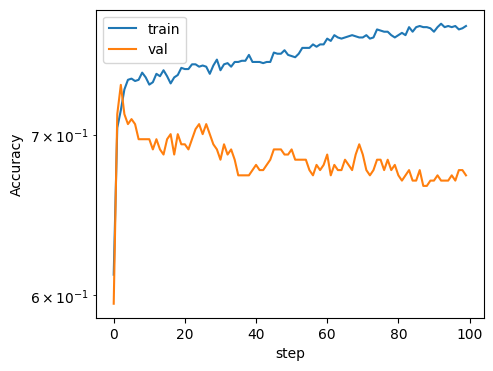

In [114]:
del model, best_model_state, results
model = KAN(width=[attributes, 3, 1], grid=3, k=3, seed=381, device=device)
best_model_state, results, _ = custom_fit(model, dataset, opt="LBFGS", steps=100, lamb=1e-06,
                                          metrics=(train_acc_kan, val_acc_kan), display_metrics=['train_acc_kan', 'val_acc_kan'])
#model.load_state_dict(best_model_state)
plot_training_ACC(model, best_model_state, dataset['test_label'][:,0], model(dataset['test_input'])[:,0],
                  results['train_acc_kan'], results['val_acc_kan'])

In [116]:
model.load_state_dict(best_model_state)
plot_confusion_matrix(dataset['test_label'][:,0], model(dataset['test_input'])[:,0], title="Confusion Matrix")

[[129  54]
 [ 48 136]]


array([[129,  54],
       [ 48, 136]], dtype=int64)

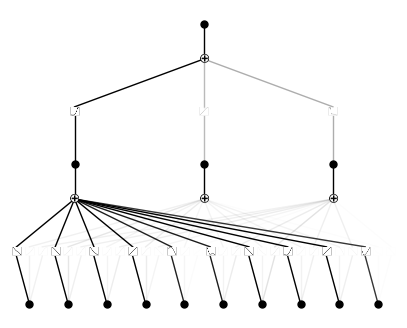

In [58]:
model.plot()

[('Bid_Close', 8.31032), ('Ask_Close', 7.2956753), ('Ask_High', 6.913417), ('Bid_High', 5.776236), ('Bid_Open', 1.9707987), ('Bid_Low', 1.5997393), ('Ask_Low', 0.9390934), ('Ask_Open', 0.5157894), ('Bid_Volume', 0.46877444), ('Ask_Volume', 0.36450866)]


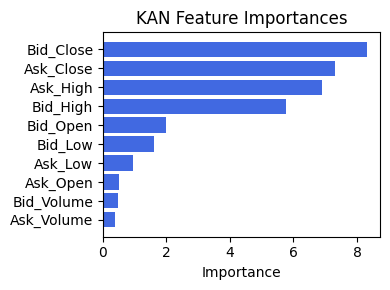

[('Bid_Close', 8.31032),
 ('Ask_Close', 7.2956753),
 ('Ask_High', 6.913417),
 ('Bid_High', 5.776236),
 ('Bid_Open', 1.9707987),
 ('Bid_Low', 1.5997393),
 ('Ask_Low', 0.9390934),
 ('Ask_Open', 0.5157894),
 ('Bid_Volume', 0.46877444),
 ('Ask_Volume', 0.36450866)]

In [59]:
plot_sorted_feature_importance(x_col, model.feature_score)

### 2. width=[10, 3, 1], grid=4, lamb=0.0001 | best_epoch=3 | acc_test=0.74659

checkpoint directory created: ./model
saving model version 0.0


 train_acc_kan: 7.53e-01 | val_acc_kan: 6.73e-01 |: 100%|███████████| 10/10 [00:13<00:00,  1.39s/it]

saving model version 0.1
✅ Best validation Accuracy: 7.1088e-01 at 3 epoch
tensor(0.7248, device='cuda:0')


tensor(0.7248, device='cuda:0')

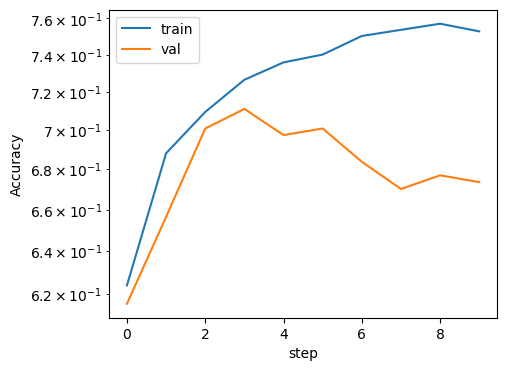

In [60]:
model = KAN(width=[attributes, 3, 1], grid=4, k=3, seed=381, device=device)
best_model_state, results, _ = custom_fit(model, dataset, opt="LBFGS", steps=10, lamb=0.0001,
                                          metrics=(train_acc_kan, val_acc_kan), display_metrics=['train_acc_kan', 'val_acc_kan'])
plot_training_ACC(model, best_model_state, dataset['test_label'][:,0], model(dataset['test_input'])[:,0],
                  results['train_acc_kan'], results['val_acc_kan'])

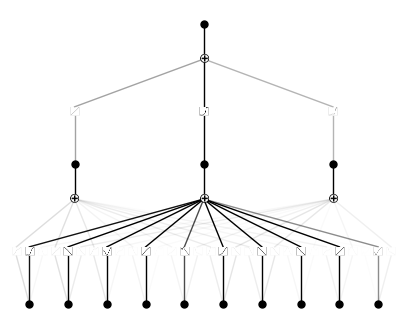

In [61]:
model.plot()

In [62]:
plot_confusion_matrix(dataset['test_label'][:,0], model(dataset['test_input'])[:,0], title="Confusion Matrix")

[[125  58]
 [ 48 136]]


array([[125,  58],
       [ 48, 136]], dtype=int64)

[('Bid_Close', 7.971229), ('Bid_High', 7.346293), ('Ask_Close', 7.1305676), ('Ask_High', 4.4975147), ('Ask_Low', 2.4395332), ('Bid_Low', 2.2413726), ('Bid_Open', 1.6592015), ('Ask_Open', 1.418995), ('Ask_Volume', 0.56253165), ('Bid_Volume', 0.4651566)]


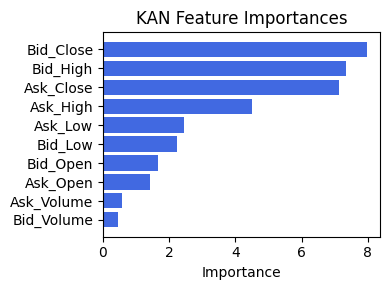

[('Bid_Close', 7.971229),
 ('Bid_High', 7.346293),
 ('Ask_Close', 7.1305676),
 ('Ask_High', 4.4975147),
 ('Ask_Low', 2.4395332),
 ('Bid_Low', 2.2413726),
 ('Bid_Open', 1.6592015),
 ('Ask_Open', 1.418995),
 ('Ask_Volume', 0.56253165),
 ('Bid_Volume', 0.4651566)]

In [63]:
plot_sorted_feature_importance(x_col, model.feature_score)

# CNN training ✅ Top 2 Configurations

### 1. cnn_blocks=1, dense_layers=1 | best_epoch=18 | loss=3.22069

In [47]:
build_custom_cnn_model(cnn_blocks=1, dense_layers=1, imgs_shape=imgs_shape)

CustomCNNModel(
  (cnn_branch): Sequential(
    (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1), padding=(2, 2))
    (1): LayerNorm((16, 8, 8), eps=1e-05, elementwise_affine=True)
    (2): Sigmoid()
    (3): Flatten(start_dim=1, end_dim=-1)
  )
  (fc): Sequential(
    (0): Linear(in_features=1024, out_features=1, bias=True)
  )
)

| Train: 8.9853e+00 | Val: 1.0173e+01 |: 100%|████████████████████| 100/100 [00:37<00:00,  2.68it/s]


✅ Best validation loss: 9.5183e+00 at 22 epoch
3.311112880706787


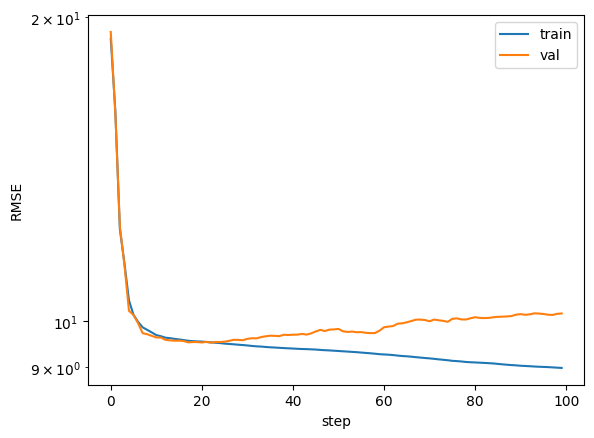

In [38]:
model = build_custom_cnn_model(cnn_blocks=1, dense_layers=1, imgs_shape=imgs_shape)
model_state, results, _ = fit_cnn_only_model(model, dataset, steps=100)
plot_training_RMSE(model, model_state, average_rmse(model(0, dataset['test_img']), dataset['test_label']), results['train_loss'], results['val_loss'])

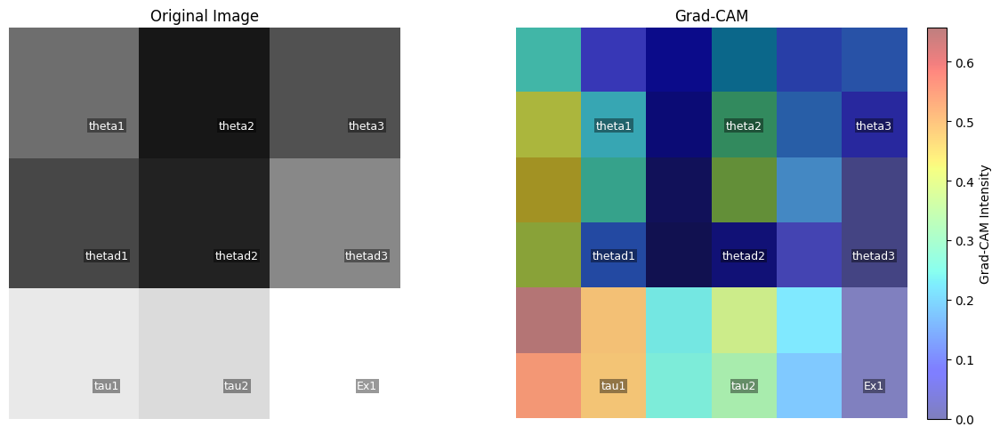

In [39]:
i = 4  # index of the image you want to explain
heatmap = grad_cam_side_by_side(
    model=model,
    model_state=model_state,
    num_input=dataset["test_input"][i],
    img_input=dataset["test_img"][i],
    x_col=completed_x_col,
    coordinate=completed_coordinate,
    zoom=2
)

Computing Grad-CAM: 100%|██████████| 1639/1639 [06:11<00:00,  4.41it/s]


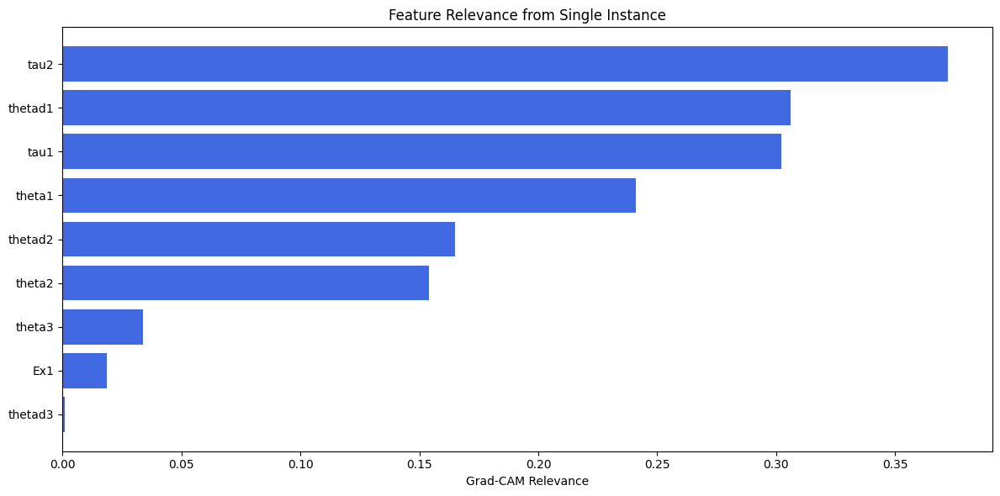

In [40]:
avg_scores = compute_avg_feature_relevance_from_val(
    model=model,
    model_state=model_state,
    val_inputs=dataset["test_input"],
    val_imgs=dataset["test_img"],
    coordinate=completed_coordinate,
    x_col=completed_x_col,
    zoom=2
)
plot_feature_relevance_bar(avg_scores)

### 2. cnn_blocks=3, dense_layers=2 | best_epoch=4 | loss=3.24624

| Train: 2.5414e+00 | Val: 1.7249e+01 |: 100%|████████████████████| 110/110 [01:03<00:00,  1.73it/s]


✅ Best validation loss: 9.8724e+00 at 3 epoch
4.303581714630127


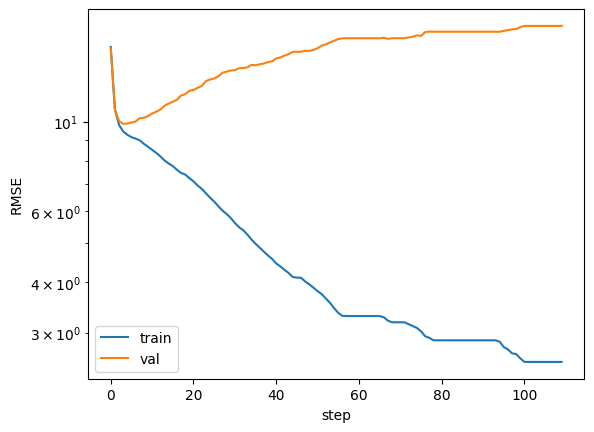

In [41]:
model = build_custom_cnn_model(cnn_blocks=3, dense_layers=2, imgs_shape=imgs_shape)
model_state, results, _ = fit_cnn_only_model(model, dataset, steps=110)
plot_training_RMSE(model, model_state, average_rmse(model(0, dataset['test_img']), dataset['test_label']), results['train_loss'], results['val_loss'])

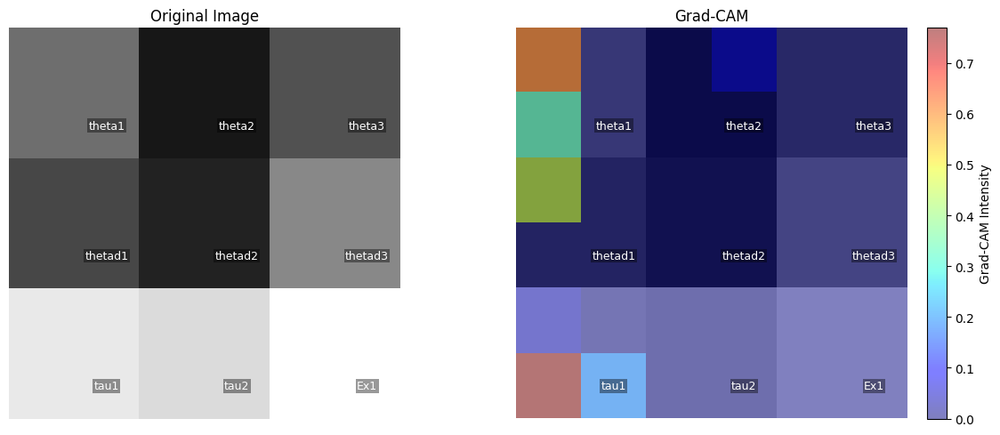

In [42]:
i = 4  # index of the image you want to explain
heatmap = grad_cam_side_by_side(
    model=model,
    model_state=model_state,
    num_input=dataset["test_input"][i],
    img_input=dataset["test_img"][i],
    x_col=completed_x_col,
    coordinate=completed_coordinate,
    zoom=2
)

Computing Grad-CAM: 100%|██████████| 1639/1639 [06:16<00:00,  4.35it/s] 


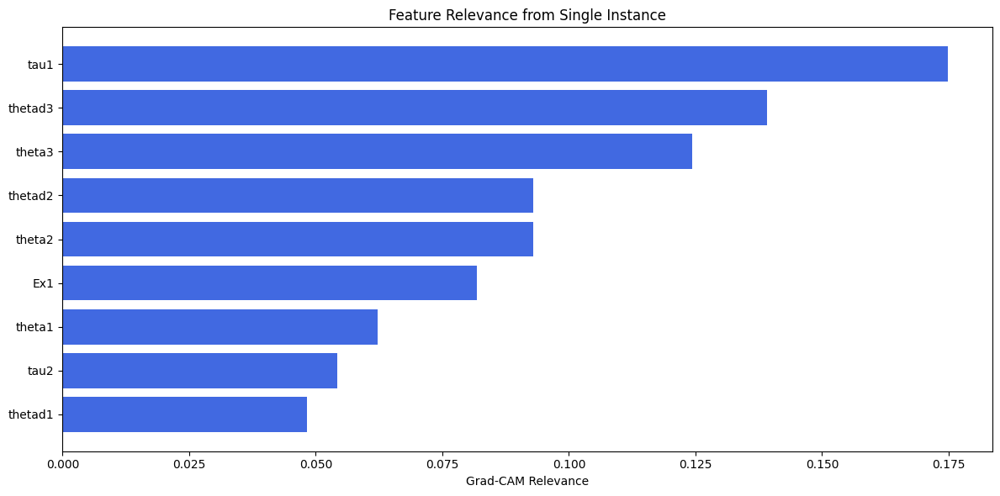

In [43]:
avg_scores = compute_avg_feature_relevance_from_val(
    model=model,
    model_state=model_state,
    val_inputs=dataset["test_input"],
    val_imgs=dataset["test_img"],
    coordinate=completed_coordinate,
    x_col=completed_x_col,
    zoom=2
)
plot_feature_relevance_bar(avg_scores)

# Set Files Name

In [43]:
filename_0=f'{dataset_name}_Concat_Op0.csv'
filename_1=f'{dataset_name}_Concat_Op1.csv'
filename_2=f'{dataset_name}_Concat_Op2.csv'
filename_3=f'{dataset_name}_Concat_Op3.csv'
filename_4=f'{dataset_name}_Concat_Op4.csv'

In [45]:
columns_opt0 = '_'
columns_opt1 = 'cnn_bottleneck_dim'
columns_opt2 = 'alpha'
columns_opt3 = 'hidden_dim'
columns_opt4 = 'embed_dim, num_heads'

# Option 0: Concat full best KAN with full best CNN

In [45]:
create_csv_with_header(filename_0, columns_opt0)

### 0.1.0 width=[10, 3, 1], grid=3, lamb=1e-06

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_0


 train_acc_hybrid: 7.45e-01 | val_acc_hybrid: 6.60e-01 |: 100%|█████| 20/20 [00:10<00:00,  1.95it/s]


saving model version 0.1
✅ Best validation Accuracy: 6.9388e-01 at 3 epoch
tensor(0.7357, device='cuda:0')
[[141  42]
 [ 55 129]]
M_KAN Relevance: 0.9961861371994019
CNN Relevance: 0.003813826246187091
[('Bid_Close', 7.2106895), ('Ask_High', 7.1008744), ('Ask_Close', 6.2503824), ('Bid_Open', 4.095722), ('Bid_Low', 3.5905), ('Ask_Low', 3.147977), ('Bid_High', 2.7960496), ('Ask_Open', 0.74605346), ('Bid_Volume', 0.53049767), ('Ask_Volume', 0.4568252)]


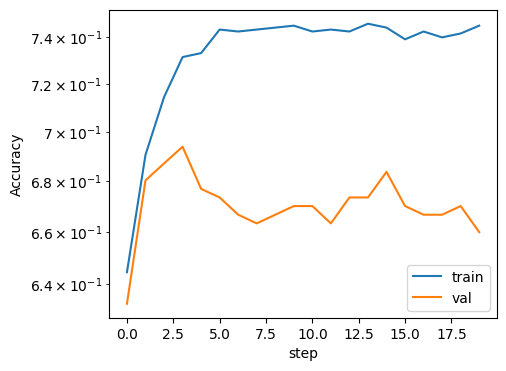

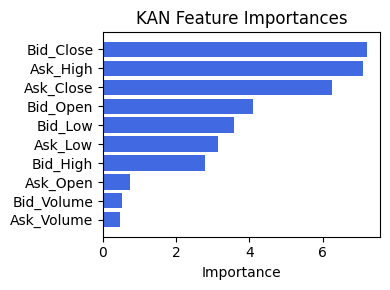

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex1', 0.40717616429608267), ('Ask_Volume', 0.3555474933389097), ('Ex5', 0.3480625945963067), ('Ex4', 0.3100236520292973), ('Ask_Open', 0.12031800519993494), ('Ex6', 0.10273832624793378), ('Ex2', 0.10116262442612518), ('Ask_High', 0.08828525929724447), ('Ask_Close', 0.08495200518772453), ('Ex3', 0.057998683191937385), ('Bid_Volume', 0.03320290051668385), ('Ask_Low', 0.007936752472257693), ('Bid_High', 0.00589002516174618), ('Bid_Low', 0.0033234000277048235), ('Bid_Open', 0.0027075051357502216), ('Bid_Close', 0.0)]


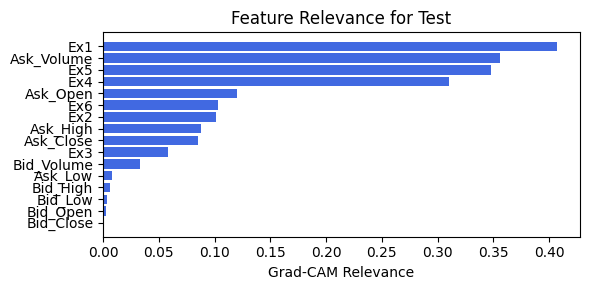

In [49]:
train_and_plot_relevance(Model3_0, kan_neurons=3, kan_grid=3, lamb=1e-06, steps=20, n_kan_len=1, filename=filename_0, opt_col_val='_')

### 0.1.1 width=[10, 3, 1], grid=3, lamb=1e-06

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_0


 train_acc_hybrid: 7.49e-01 | val_acc_hybrid: 6.60e-01 |: 100%|█████| 20/20 [00:09<00:00,  2.19it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.0408e-01 at 4 epoch
tensor(0.7193, device='cuda:0')
[[141  42]
 [ 61 123]]
M_KAN Relevance: 0.9957935214042664
CNN Relevance: 0.0042065102607011795
[('Ask_High', 8.920592), ('Bid_Close', 8.248978), ('Ask_Close', 7.1599717), ('Bid_High', 4.822751), ('Bid_Low', 3.5728154), ('Ask_Low', 2.9628284), ('Bid_Open', 2.9554865), ('Ask_Open', 1.7811228), ('Bid_Volume', 0.4610567), ('Ask_Volume', 0.44269717)]


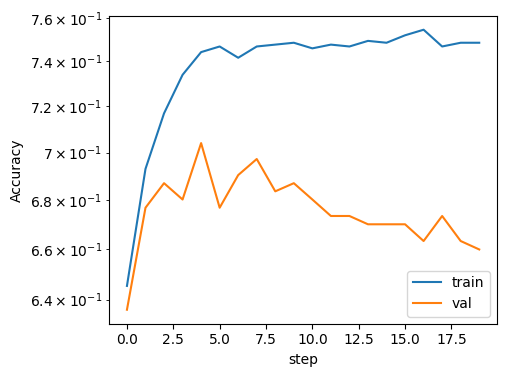

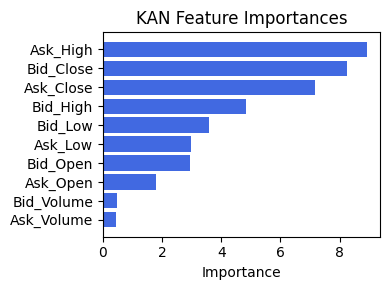

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex1', 0.4225995017657163), ('Ask_Volume', 0.3684773540139523), ('Ex5', 0.36078020857205506), ('Ex4', 0.31960128511654906), ('Ask_Open', 0.12142424833317217), ('Ex6', 0.1077646786494216), ('Ex2', 0.10695398873992122), ('Ask_High', 0.09121697755531745), ('Ask_Close', 0.08534211189326213), ('Ex3', 0.05645090627816458), ('Bid_Volume', 0.03221558470668193), ('Ask_Low', 0.008504549074025047), ('Bid_High', 0.0045967813474487775), ('Bid_Low', 0.002482576342431172), ('Bid_Open', 0.0022414158023379956), ('Bid_Close', 0.0)]


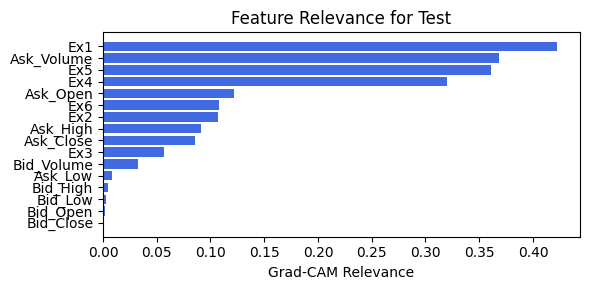

In [50]:
train_and_plot_relevance(Model3_0, kan_neurons=3, kan_grid=3, lamb=1e-06, steps=20, n_kan_len=1, filename=filename_0, opt_col_val='_')

### 0.2.1 width=[10, 3, 1], grid=4, lamb=0.0001

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_0


 train_acc_hybrid: 7.60e-01 | val_acc_hybrid: 6.73e-01 |: 100%|█████| 20/20 [00:08<00:00,  2.45it/s]

saving model version 0.1
✅ Best validation Accuracy: 6.9048e-01 at 6 epoch
tensor(0.6894, device='cuda:0')
[[138  45]
 [ 69 115]]
M_KAN Relevance: 0.9945002198219299
CNN Relevance: 0.005499811377376318
[('Ask_Close', 5.7395034), ('Bid_High', 4.151368), ('Ask_High', 3.7789814), ('Bid_Low', 3.6873572), ('Ask_Low', 3.6794047), ('Bid_Close', 3.6491349), ('Bid_Open', 2.8232102), ('Ask_Open', 1.897244), ('Ask_Volume', 1.2726974), ('Bid_Volume', 1.1139212)]


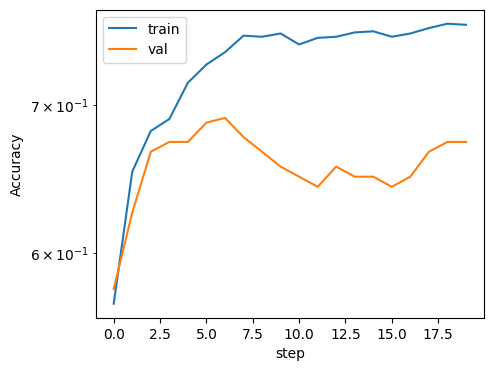

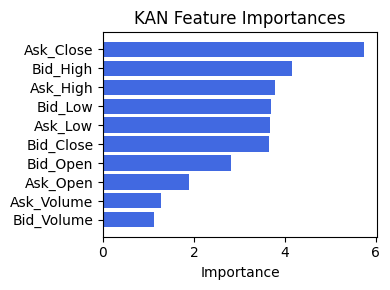

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex1', 0.4509544286075015), ('Ex5', 0.41846610861513206), ('Ask_Volume', 0.37843800082356144), ('Ex4', 0.3531105439571984), ('Ex6', 0.13601076818129673), ('Ex2', 0.1330219157425844), ('Ask_Open', 0.1311540744508165), ('Ask_High', 0.11728503961973806), ('Ask_Close', 0.06936934365502657), ('Ex3', 0.0424414178057084), ('Bid_Volume', 0.025361821474602614), ('Ask_Low', 0.014449440395908859), ('Bid_High', 0.0004402577006170045), ('Bid_Open', 0.0002806834131277043), ('Bid_Low', 0.0001830960235657419), ('Bid_Close', 0.0)]


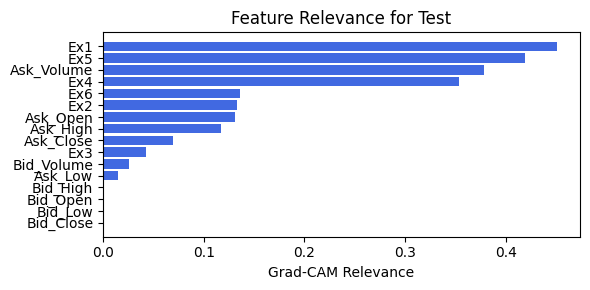

In [51]:
train_and_plot_relevance(Model3_0, kan_neurons=3, kan_grid=4, lamb=0.0001, steps=20, n_kan_len=1, filename=filename_0, opt_col_val='_')

### 0.2.2 width=[10, 3, 1], grid=4, lamb=0.0001

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_0


 train_acc_hybrid: 7.48e-01 | val_acc_hybrid: 6.63e-01 |: 100%|█████| 20/20 [00:08<00:00,  2.36it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.0748e-01 at 5 epoch
tensor(0.6921, device='cuda:0')
[[127  56]
 [ 57 127]]
M_KAN Relevance: 0.9924182891845703
CNN Relevance: 0.007581729907542467
[('Ask_Close', 5.617713), ('Bid_High', 4.086659), ('Bid_Low', 3.97994), ('Ask_Low', 3.8067071), ('Bid_Close', 3.5544498), ('Ask_High', 3.120474), ('Bid_Open', 2.9312193), ('Ask_Open', 2.1100948), ('Ask_Volume', 1.3925873), ('Bid_Volume', 1.1607865)]


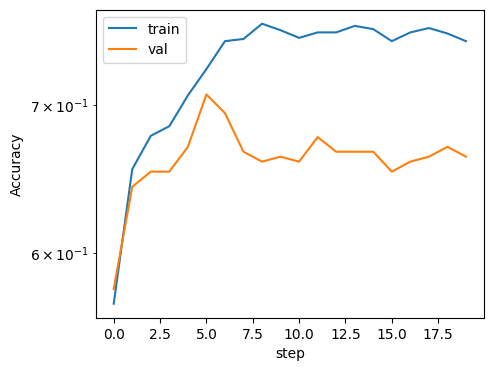

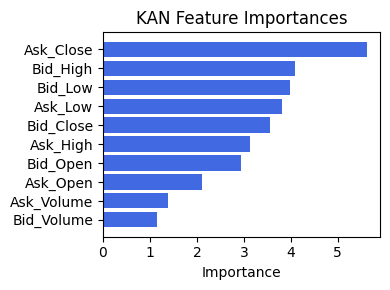

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex1', 0.4552225664217401), ('Ex5', 0.4175891172171289), ('Ask_Volume', 0.3836933118608407), ('Ex4', 0.3538584804177609), ('Ex6', 0.13477256575381075), ('Ex2', 0.13262905196695302), ('Ask_Open', 0.13016249236455046), ('Ask_High', 0.11555693087190877), ('Ask_Close', 0.07071046992547668), ('Ex3', 0.04284175929971222), ('Bid_Volume', 0.025330462544310803), ('Ask_Low', 0.0140084896607157), ('Bid_High', 0.00029684682492587573), ('Bid_Open', 0.00022060741939863176), ('Bid_Low', 8.781045971153436e-05), ('Bid_Close', 0.0)]


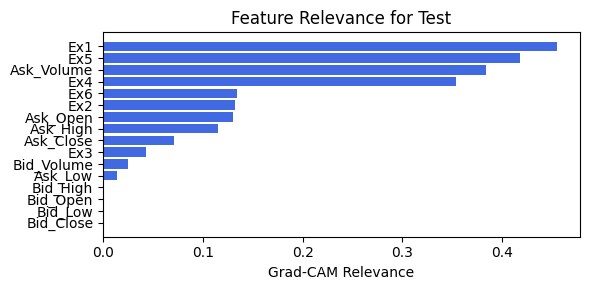

In [52]:
train_and_plot_relevance(Model3_0, kan_neurons=3, kan_grid=4, lamb=0.0001, steps=20, n_kan_len=1, filename=filename_0, opt_col_val='_')

### 0.3.1 width=[10, 1, 1], grid=3, lamb=0.0001

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_0


 train_acc_hybrid: 7.50e-01 | val_acc_hybrid: 6.90e-01 |: 100%|█████| 25/25 [00:10<00:00,  2.34it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.1088e-01 at 12 epoch
tensor(0.7193, device='cuda:0')
[[134  49]
 [ 54 130]]
M_KAN Relevance: 0.33615803718566895
CNN Relevance: 0.663841962814331
[('Bid_High', 4.822745), ('Bid_Close', 3.754647), ('Bid_Low', 2.91063), ('Ask_Close', 2.6993048), ('Ask_Low', 1.691053), ('Ask_High', 1.45846), ('Bid_Open', 0.9752136), ('Ask_Open', 0.5329907), ('Ask_Volume', 0.24839032), ('Bid_Volume', 0.24154755)]


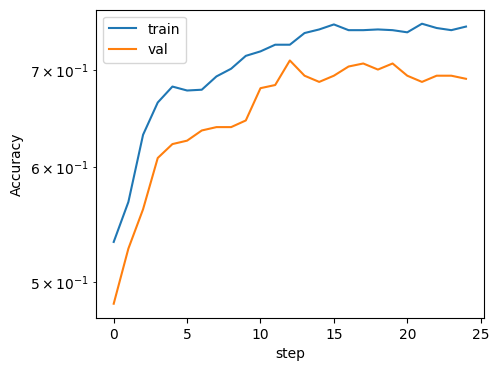

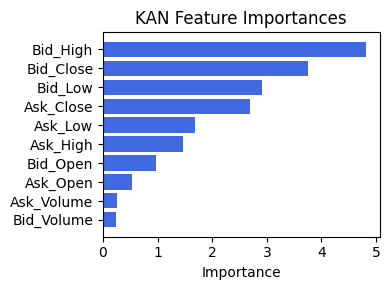

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex6', 0.46495294132414566), ('Ex2', 0.34798197712170653), ('Ask_Low', 0.11195874732553614), ('Ask_Close', 0.04954951171628745), ('Bid_Volume', 0.010510839566333684), ('Ex5', 0.006651155975020309), ('Ex1', 0.0054771662525590304), ('Bid_Close', 0.003960137635029152), ('Ask_Volume', 1.7903122177971806e-06), ('Ex4', 1.7903122177971806e-06), ('Bid_Open', 0.0), ('Bid_High', 0.0), ('Bid_Low', 0.0), ('Ask_Open', 0.0), ('Ask_High', 0.0), ('Ex3', 0.0)]


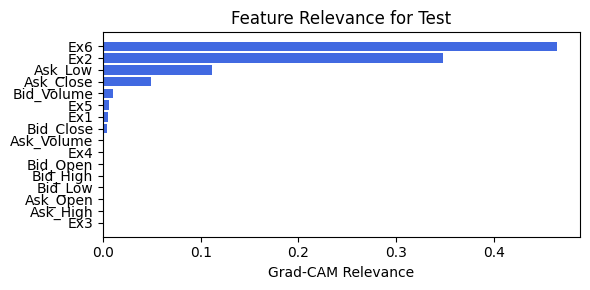

In [53]:
train_and_plot_relevance(Model3_0, kan_neurons=1, kan_grid=3, lamb=0.0001, steps=25, n_kan_len=1, filename=filename_0, opt_col_val='_')

### 0.3.2 width=[10, 1, 1], grid=3, lamb=0.0001

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_0


 train_acc_hybrid: 7.49e-01 | val_acc_hybrid: 6.90e-01 |: 100%|█████| 25/25 [00:10<00:00,  2.29it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.1429e-01 at 14 epoch
tensor(0.7030, device='cuda:0')
[[130  53]
 [ 56 128]]
M_KAN Relevance: 0.37156981229782104
CNN Relevance: 0.628430187702179
[('Bid_High', 5.7996297), ('Bid_Close', 3.9465168), ('Ask_Close', 2.8469052), ('Ask_Low', 2.8282566), ('Bid_Low', 2.618334), ('Ask_High', 1.9346442), ('Ask_Open', 0.996515), ('Bid_Open', 0.54366755), ('Ask_Volume', 0.1204136), ('Bid_Volume', 0.09016928)]


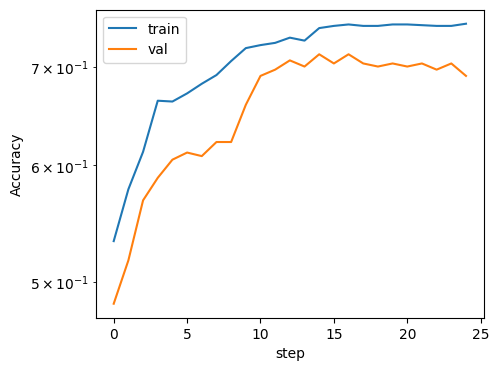

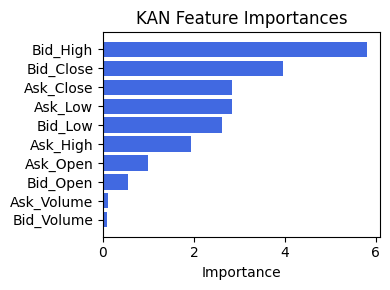

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex2', 0.6104656703952872), ('Ex6', 0.4929330374954182), ('Ask_Low', 0.3327275610653232), ('Bid_Close', 0.061779132847514316), ('Bid_Open', 0.05609563115111245), ('Ex5', 0.0340417347828114), ('Ex1', 0.02194488573342318), ('Bid_Volume', 0.01311865775642218), ('Ask_High', 0.007796748431645658), ('Bid_Low', 0.0036528460422051547), ('Bid_High', 0.002922501721811364), ('Ask_Close', 0.0026294417719436654), ('Ask_Open', 0.0021949903876140042), ('Ex4', 0.0015848353547957658), ('Ask_Volume', 0.0), ('Ex3', 0.0)]


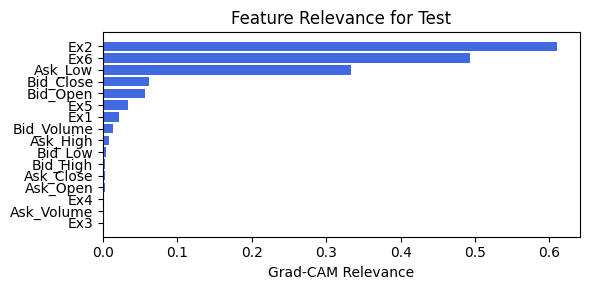

In [54]:
train_and_plot_relevance(Model3_0, kan_neurons=1, kan_grid=3, lamb=0.0001, steps=25, n_kan_len=1, filename=filename_0, opt_col_val='_')

### 0.4.1 width=[10, 4, 1], grid=3, lamb=0.0001

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_0


 train_acc_hybrid: 7.48e-01 | val_acc_hybrid: 6.84e-01 |: 100%|█████| 20/20 [00:08<00:00,  2.46it/s]


saving model version 0.1
✅ Best validation Accuracy: 7.1429e-01 at 5 epoch
tensor(0.7139, device='cuda:0')
[[133  50]
 [ 55 129]]
M_KAN Relevance: 0.9969836473464966
CNN Relevance: 0.0030164162162691355
[('Bid_Close', 14.796914), ('Bid_High', 9.438582), ('Ask_High', 6.0505414), ('Bid_Low', 5.3692503), ('Bid_Open', 4.530912), ('Ask_Open', 4.4202633), ('Ask_Close', 3.658096), ('Ask_Low', 2.3346887), ('Bid_Volume', 1.3955827), ('Ask_Volume', 0.50038016)]


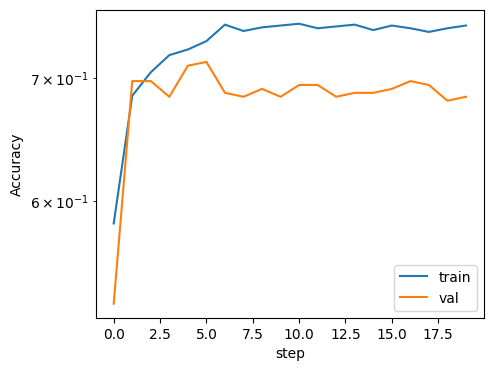

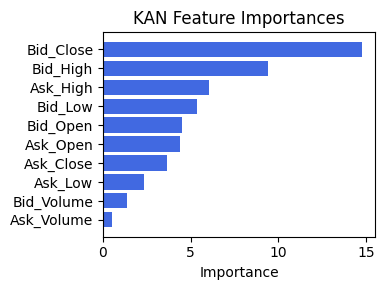

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex1', 0.4748309329761147), ('Ex5', 0.45373283525578656), ('Ask_Volume', 0.3918471105944883), ('Ex4', 0.37398720209864894), ('Ex6', 0.15420136440352458), ('Ex2', 0.15063664213594363), ('Ask_Open', 0.14475411970193094), ('Ask_High', 0.1405427080794169), ('Ask_Close', 0.06322244161673966), ('Ex3', 0.03690198404912403), ('Bid_Volume', 0.023562400789749974), ('Ask_Low', 0.01960597286023528), ('Bid_Low', 0.00013837760106782314), ('Bid_High', 0.00011947517237186365), ('Bid_Open', 2.4397895075725567e-06), ('Bid_Close', 0.0)]


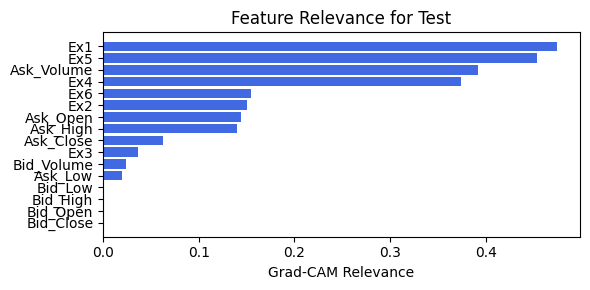

In [55]:
train_and_plot_relevance(Model3_0, kan_neurons=4, kan_grid=3, lamb=0.0001, steps=20, n_kan_len=1, filename=filename_0, opt_col_val='_')

### 0.4.2 width=[10, 4, 1], grid=3, lamb=0.0001

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_0


 train_acc_hybrid: 7.60e-01 | val_acc_hybrid: 6.77e-01 |: 100%|█████| 20/20 [00:07<00:00,  2.51it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.1088e-01 at 5 epoch
tensor(0.7193, device='cuda:0')
[[133  50]
 [ 53 131]]
M_KAN Relevance: 0.9972769021987915
CNN Relevance: 0.0027230470441281796
[('Bid_Close', 13.918846), ('Bid_High', 8.827769), ('Ask_High', 5.9206758), ('Bid_Low', 5.205479), ('Ask_Open', 4.1102734), ('Bid_Open', 4.050398), ('Ask_Close', 3.8306978), ('Ask_Low', 2.3589249), ('Bid_Volume', 1.271569), ('Ask_Volume', 0.3923602)]


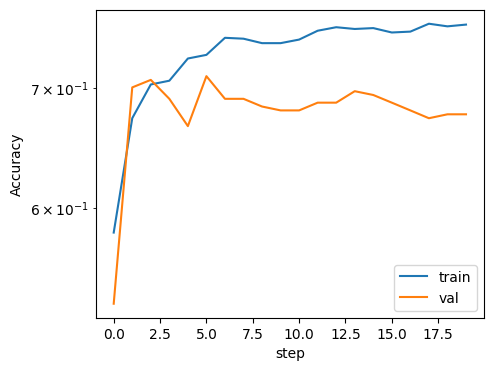

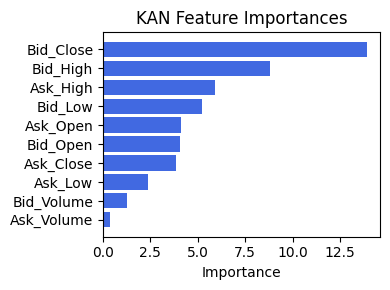

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex1', 0.47945176580621374), ('Ex5', 0.4643951527754033), ('Ask_Volume', 0.3934802437145314), ('Ex4', 0.37989487464486416), ('Ex6', 0.15976416959099937), ('Ex2', 0.15559963691137144), ('Ask_Open', 0.14813299364713592), ('Ask_High', 0.14693537392153605), ('Ask_Close', 0.06083808473897565), ('Ex3', 0.03490385824271379), ('Bid_Volume', 0.022903431402024502), ('Ask_Low', 0.02107152506213937), ('Bid_Low', 7.938786877042611e-05), ('Bid_High', 6.289862583263534e-05), ('Bid_Open', 0.0), ('Bid_Close', 0.0)]


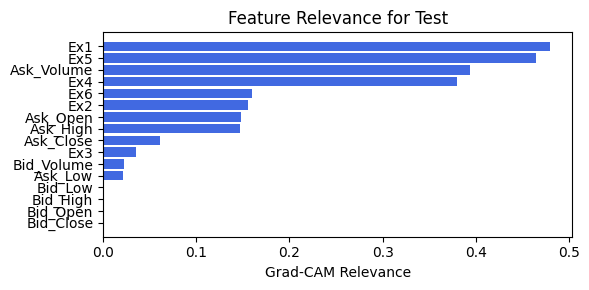

In [56]:
train_and_plot_relevance(Model3_0, kan_neurons=4, kan_grid=3, lamb=0.0001, steps=20, n_kan_len=1, filename=filename_0, opt_col_val='_')

# Option 1: Concat KAN with (CNN with dense layer to reduce output_size)

In [57]:
create_csv_with_header(filename_1, columns_opt1)

## 1.0 width=[10, 3, 1], grid=3, lamb=1e-06

### 1.0.0 width=[10, 3, 1], grid=3, lamb=1e-06 | cnn_bottleneck_dim=1

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


 train_acc_hybrid: 7.50e-01 | val_acc_hybrid: 6.73e-01 |: 100%|█████| 30/30 [00:10<00:00,  2.88it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.2789e-01 at 3 epoch
tensor(0.7330, device='cuda:0')
[[127  56]
 [ 42 142]]
M_KAN Relevance: 0.9996621012687683
CNN Relevance: 0.00033790068118833005
[('Bid_Close', 2.7021422), ('Ask_Close', 2.4354672), ('Ask_High', 2.2038422), ('Bid_High', 2.0610619), ('Bid_Open', 0.9003358), ('Ask_Low', 0.46470317), ('Ask_Open', 0.4270618), ('Bid_Low', 0.39558586), ('Bid_Volume', 0.20969552), ('Ask_Volume', 0.15921752)]


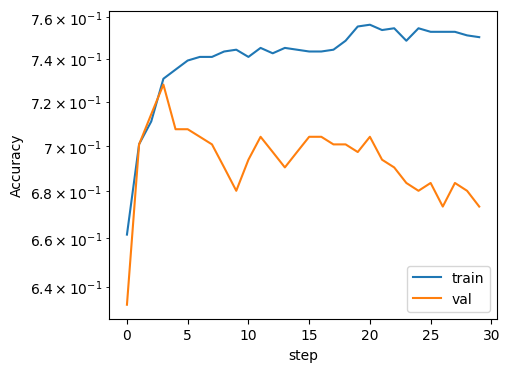

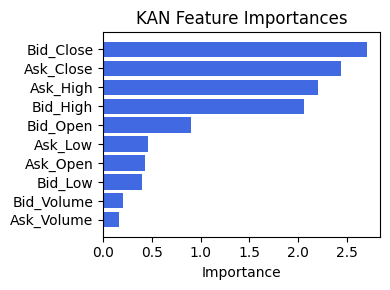

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex5', 0.45110242828036523), ('Ex1', 0.42860131822424946), ('Ex4', 0.3593151303013274), ('Ask_Volume', 0.3427493505443799), ('Ex6', 0.15773505841353933), ('Ex2', 0.1464683014178796), ('Ask_Open', 0.13400576607569148), ('Ask_High', 0.13307608563449153), ('Ask_Close', 0.051675773635557386), ('Ex3', 0.030851961557603662), ('Bid_Volume', 0.020815604623161767), ('Ask_Low', 0.018729142588214336), ('Bid_High', 8.292712009873823e-06), ('Bid_Low', 7.40468302362266e-06), ('Bid_Open', 1.9038641430077218e-07), ('Bid_Close', 0.0)]


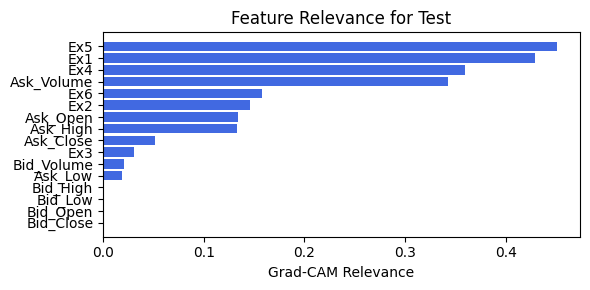

In [58]:
train_and_plot_relevance(Model3_1, kan_neurons=3, kan_grid=3, cnn_bottleneck_dim=1, lamb=1e-06, steps=30, filename=filename_1, opt_col_val=1)

### 1.0.1 width=[10, 3, 1], grid=3, lamb=1e-06 | cnn_bottleneck_dim=1

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


 train_acc_hybrid: 7.51e-01 | val_acc_hybrid: 6.73e-01 |: 100%|█████| 30/30 [00:08<00:00,  3.35it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.1769e-01 at 2 epoch
tensor(0.7166, device='cuda:0')
[[124  59]
 [ 45 139]]
M_KAN Relevance: 0.9996011257171631
CNN Relevance: 0.0003988653188571334
[('Bid_Close', 2.2766619), ('Ask_Close', 2.1171756), ('Bid_Open', 1.5191989), ('Ask_High', 1.341556), ('Bid_High', 1.0839739), ('Ask_Open', 1.0245833), ('Ask_Low', 0.5086744), ('Bid_Low', 0.31526944), ('Bid_Volume', 0.14095108), ('Ask_Volume', 0.06296067)]


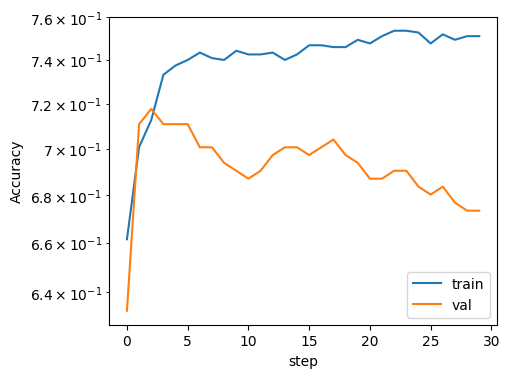

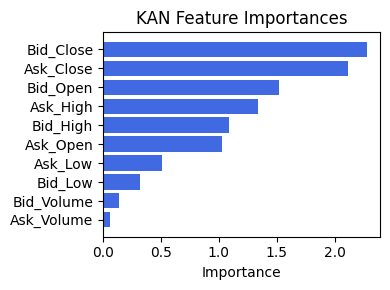

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex5', 0.4576648035231338), ('Ex1', 0.4348847767393985), ('Ex4', 0.36513297401916756), ('Ask_Volume', 0.34746797173728083), ('Ex6', 0.16019986464314628), ('Ex2', 0.1492789991260874), ('Ask_High', 0.13658200599510434), ('Ask_Open', 0.1364574233533219), ('Ask_Close', 0.05144374535802234), ('Ex3', 0.03102681353657788), ('Bid_Volume', 0.020721608648409405), ('Ask_Low', 0.01963345707224159), ('Bid_High', 7.978729790771933e-06), ('Bid_Low', 7.33794786108338e-06), ('Bid_Open', 0.0), ('Bid_Close', 0.0)]


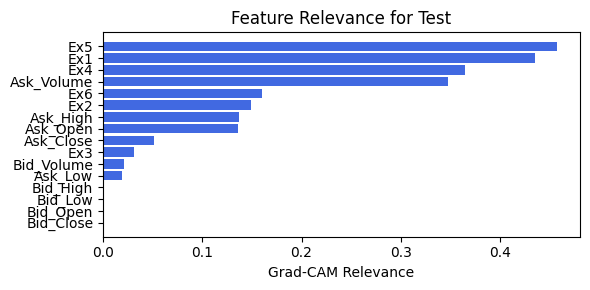

In [59]:
train_and_plot_relevance(Model3_1, kan_neurons=3, kan_grid=3, cnn_bottleneck_dim=1, lamb=1e-06, steps=30, filename=filename_1, opt_col_val=1)

### 1.0.2 width=[10, 3, 1], grid=3, lamb=1e-06 | cnn_bottleneck_dim=2

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


 train_acc_hybrid: 7.49e-01 | val_acc_hybrid: 6.77e-01 |: 100%|█████| 30/30 [00:09<00:00,  3.30it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.3129e-01 at 4 epoch
tensor(0.7248, device='cuda:0')
[[132  51]
 [ 50 134]]
M_KAN Relevance: 0.9557400941848755
CNN Relevance: 0.04425991699099541
[('Ask_Close', 2.7010965), ('Bid_Close', 2.6794918), ('Ask_High', 2.066607), ('Bid_High', 1.8198276), ('Bid_Open', 1.0367757), ('Ask_Open', 0.6445405), ('Bid_Low', 0.57119906), ('Ask_Low', 0.34974855), ('Bid_Volume', 0.23075376), ('Ask_Volume', 0.14472401)]


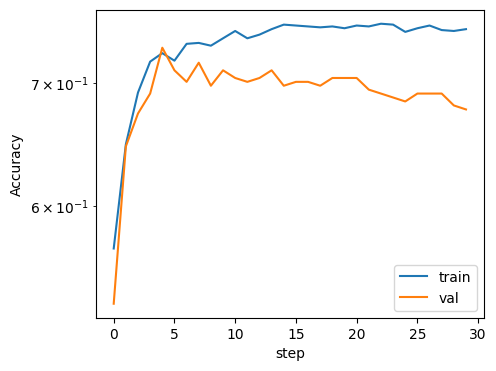

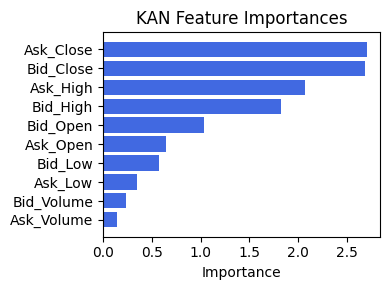

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex6', 0.4502358212458015), ('Ex2', 0.1943456888280058), ('Bid_Open', 0.07733113025867047), ('Ask_Close', 0.01752674930833016), ('Bid_Volume', 0.014481084014933648), ('Ex1', 0.00442989948091455), ('Ex5', 0.004019289490657703), ('Ask_Open', 0.0038604058264386752), ('Ask_Low', 0.002493222845827384), ('Ask_Volume', 0.0022672667442148486), ('Bid_High', 0.0020296072095064115), ('Ask_High', 0.001235237395852723), ('Bid_Low', 0.0004114881766914347), ('Bid_Close', 0.0), ('Ex3', 0.0), ('Ex4', 0.0)]


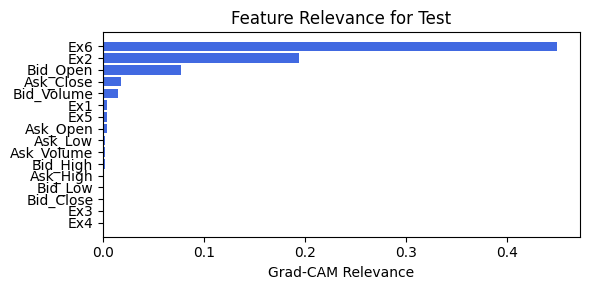

In [60]:
train_and_plot_relevance(Model3_1, kan_neurons=3, kan_grid=3, cnn_bottleneck_dim=2, lamb=1e-06, steps=30, filename=filename_1, opt_col_val=2)

### 1.0.3 width=[10, 3, 1], grid=3, lamb=1e-06 | cnn_bottleneck_dim=2

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


 train_acc_hybrid: 7.55e-01 | val_acc_hybrid: 6.73e-01 |: 100%|█████| 30/30 [00:11<00:00,  2.68it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.0748e-01 at 6 epoch
tensor(0.7302, device='cuda:0')
[[130  53]
 [ 46 138]]
M_KAN Relevance: 0.8438372611999512
CNN Relevance: 0.15616269409656525
[('Bid_Close', 2.9389493), ('Ask_Close', 2.7545743), ('Ask_High', 2.631793), ('Bid_High', 2.5003364), ('Bid_Low', 0.6317657), ('Ask_Low', 0.3588183), ('Bid_Open', 0.33252048), ('Bid_Volume', 0.2509017), ('Ask_Open', 0.23910853), ('Ask_Volume', 0.18601319)]


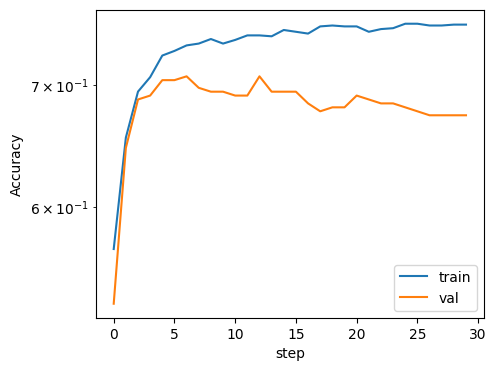

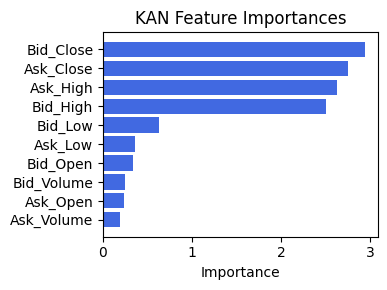

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex3', 0.6566136815313666), ('Bid_Close', 0.5949542351087368), ('Ask_Close', 0.4710803816804906), ('Bid_Low', 0.46286842519320975), ('Bid_Volume', 0.4284177570723058), ('Bid_High', 0.40692717421607033), ('Bid_Open', 0.3736737788698004), ('Ask_Low', 0.27669545131093476), ('Ask_Open', 0.2765376621436033), ('Ask_Volume', 0.26803228256485506), ('Ex4', 0.2605207117188123), ('Ask_High', 0.20506434437973622), ('Ex1', 0.17705612317773156), ('Ex5', 0.06002969785570611), ('Ex2', 0.027683802088754306), ('Ex6', 0.0005273604662441813)]


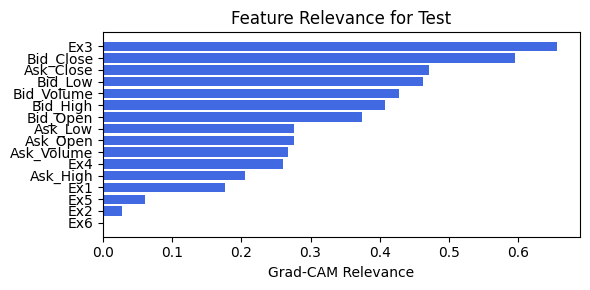

In [61]:
train_and_plot_relevance(Model3_1, kan_neurons=3, kan_grid=3, cnn_bottleneck_dim=2, lamb=1e-06, steps=30, filename=filename_1, opt_col_val=2)

### 1.0.4 width=[10, 3, 1], grid=3, lamb=1e-06 | cnn_bottleneck_dim=3

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


 train_acc_hybrid: 7.61e-01 | val_acc_hybrid: 6.84e-01 |: 100%|█████| 30/30 [00:10<00:00,  2.99it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.0748e-01 at 2 epoch
tensor(0.7193, device='cuda:0')
[[125  58]
 [ 45 139]]
M_KAN Relevance: 0.8448918461799622
CNN Relevance: 0.15510813891887665
[('Bid_Close', 2.2176647), ('Ask_Close', 2.2074637), ('Bid_Open', 2.1888428), ('Ask_Open', 1.2248669), ('Ask_High', 1.1393317), ('Bid_Low', 0.85967016), ('Ask_Low', 0.7559966), ('Bid_High', 0.37613243), ('Ask_Volume', 0.37132448), ('Bid_Volume', 0.1505472)]


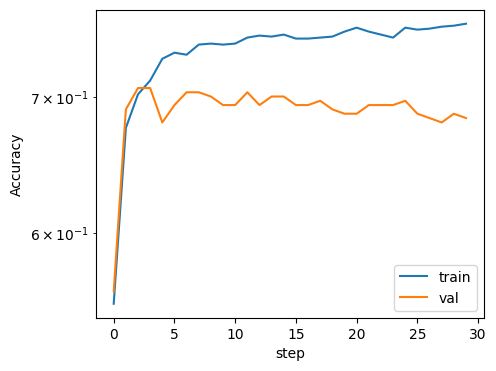

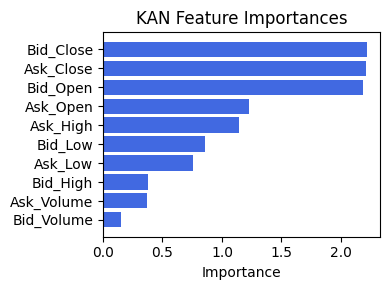

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex1', 0.563160886262272), ('Ask_Volume', 0.5270800728773398), ('Ex5', 0.4178311638051913), ('Ex4', 0.38261976630086897), ('Ask_Open', 0.2981122377150859), ('Ask_High', 0.2593920189476184), ('Ask_Close', 0.21773611342316185), ('Bid_Volume', 0.15736975427031008), ('Ex2', 0.1391115703179732), ('Ex6', 0.12573898474784817), ('Bid_High', 0.09702417919728194), ('Bid_Open', 0.08454991870730885), ('Ex3', 0.08328117803246676), ('Bid_Low', 0.07772137294107083), ('Ask_Low', 0.03987031911000354), ('Bid_Close', 0.02626758285578902)]


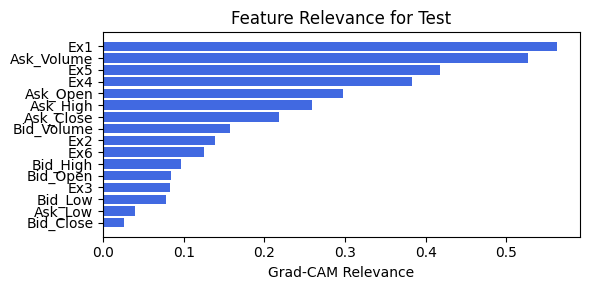

In [62]:
train_and_plot_relevance(Model3_1, kan_neurons=3, kan_grid=3, cnn_bottleneck_dim=3, lamb=1e-06, steps=30, filename=filename_1, opt_col_val=3)

### 1.0.5 width=[10, 3, 1], grid=3, lamb=1e-06 | cnn_bottleneck_dim=3

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


 train_acc_hybrid: 7.58e-01 | val_acc_hybrid: 6.84e-01 |: 100%|█████| 30/30 [00:09<00:00,  3.01it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.0408e-01 at 6 epoch
tensor(0.7139, device='cuda:0')
[[135  48]
 [ 57 127]]
M_KAN Relevance: 0.9279610514640808
CNN Relevance: 0.07203895598649979
[('Bid_Close', 3.4666984), ('Ask_Close', 3.1218908), ('Ask_High', 2.8731303), ('Bid_High', 2.707508), ('Bid_Low', 1.1749773), ('Ask_Low', 0.5546282), ('Ask_Open', 0.5450536), ('Ask_Volume', 0.2485204), ('Bid_Open', 0.2089459), ('Bid_Volume', 0.20024024)]


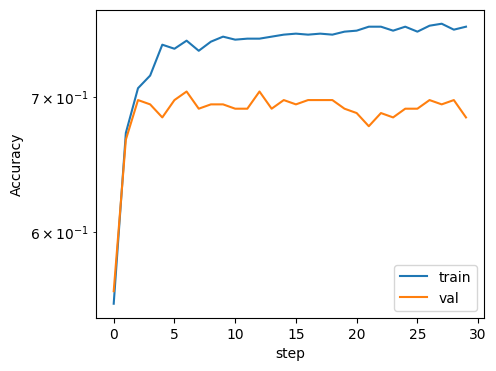

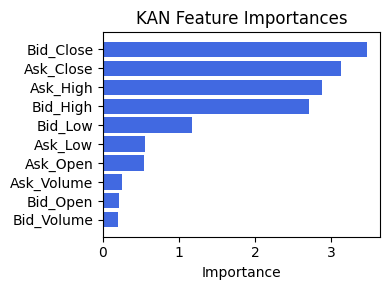

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex1', 0.6710716746239961), ('Ex5', 0.6389359349450883), ('Ask_Volume', 0.6197414493203488), ('Ex4', 0.5716323542335053), ('Ask_High', 0.339357112020388), ('Ask_Open', 0.3232622850782743), ('Ex6', 0.2082634850605632), ('Ex2', 0.208122644076068), ('Ask_Close', 0.13229887305228522), ('Ex3', 0.10498426075040157), ('Bid_Volume', 0.08356716939595804), ('Ask_Low', 0.08006133106064524), ('Bid_Close', 0.016149450383435845), ('Bid_Low', 0.014122361033891292), ('Bid_High', 0.012377956418599045), ('Bid_Open', 0.004117630593169719)]


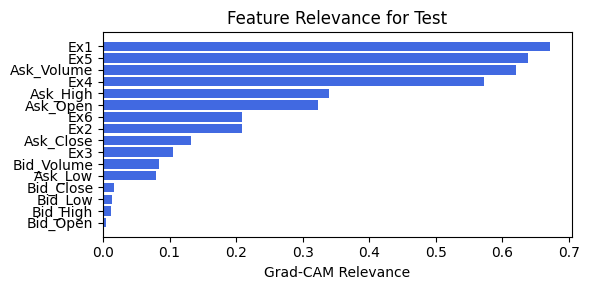

In [63]:
train_and_plot_relevance(Model3_1, kan_neurons=3, kan_grid=3, cnn_bottleneck_dim=3, lamb=1e-06, steps=30, filename=filename_1, opt_col_val=3)

### 1.0.6 width=[10, 3, 1], grid=3, lamb=1e-06 | cnn_bottleneck_dim=6

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


 train_acc_hybrid: 7.49e-01 | val_acc_hybrid: 6.97e-01 |: 100%|█████| 30/30 [00:09<00:00,  3.02it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.3810e-01 at 3 epoch
tensor(0.7330, device='cuda:0')
[[130  53]
 [ 45 139]]
M_KAN Relevance: 0.9249300360679626
CNN Relevance: 0.07506994903087616
[('Bid_Close', 2.3379967), ('Ask_Close', 2.1446254), ('Bid_Open', 1.6335701), ('Ask_High', 1.5653962), ('Ask_Open', 0.9214265), ('Bid_High', 0.8125972), ('Ask_Low', 0.740096), ('Bid_Low', 0.6156974), ('Ask_Volume', 0.23064479), ('Bid_Volume', 0.21555948)]


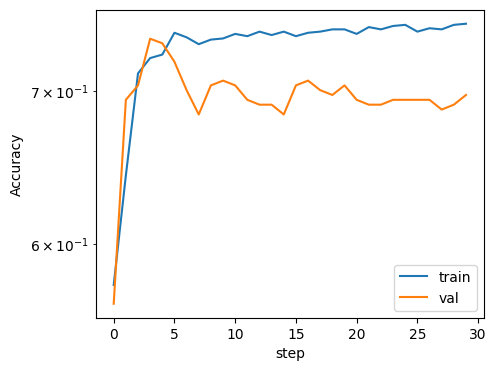

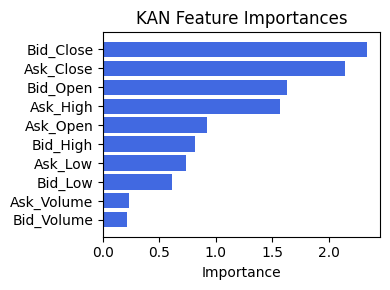

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Bid_Close', 0.633832230095305), ('Bid_Low', 0.5786236697298472), ('Bid_Open', 0.5676553429380993), ('Bid_High', 0.5625267502920301), ('Bid_Volume', 0.35401104529685157), ('Ask_Close', 0.25865501459951806), ('Ex5', 0.23703937979582546), ('Ask_Low', 0.23306181303882711), ('Ex3', 0.21372162924739418), ('Ex4', 0.20775628733646623), ('Ask_High', 0.15549199387738202), ('Ex1', 0.15433333076699066), ('Ask_Open', 0.1479535260607618), ('Ex2', 0.14458325026018864), ('Ex6', 0.1388724333218398), ('Ask_Volume', 0.11114343306483804)]


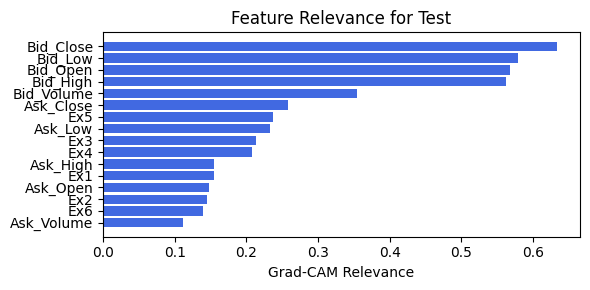

In [64]:
train_and_plot_relevance(Model3_1, kan_neurons=3, kan_grid=3, cnn_bottleneck_dim=6, lamb=1e-06, steps=30, filename=filename_1, opt_col_val=6)

### 1.0.7 width=[10, 3, 1], grid=3, lamb=1e-06 | cnn_bottleneck_dim=6

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


 train_acc_hybrid: 7.47e-01 | val_acc_hybrid: 6.94e-01 |: 100%|█████| 30/30 [00:09<00:00,  3.26it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.3810e-01 at 4 epoch
tensor(0.7357, device='cuda:0')
[[129  54]
 [ 43 141]]
M_KAN Relevance: 0.829978346824646
CNN Relevance: 0.1700216382741928
[('Bid_Close', 2.5020108), ('Ask_Close', 2.2404332), ('Ask_High', 1.9703387), ('Bid_Open', 1.3145858), ('Bid_High', 1.2086161), ('Bid_Low', 0.72474766), ('Ask_Low', 0.70937526), ('Ask_Open', 0.55746704), ('Ask_Volume', 0.2876522), ('Bid_Volume', 0.2496377)]


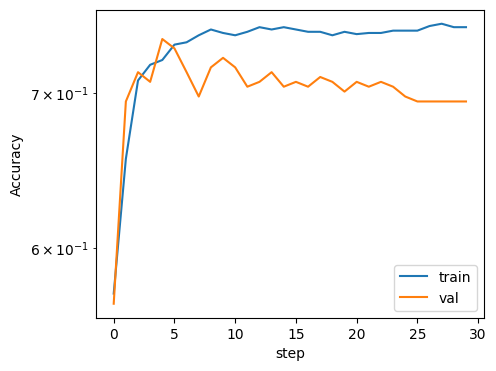

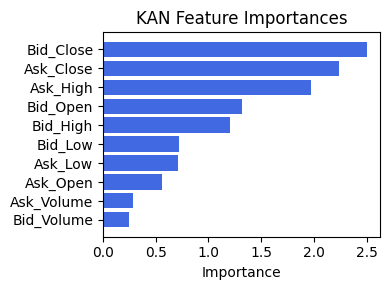

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex1', 0.5610188134014606), ('Ask_Volume', 0.5096496758165412), ('Ask_High', 0.4947703273812111), ('Ask_Open', 0.4715363045682374), ('Ex5', 0.4664960742118573), ('Ex4', 0.43439346907719206), ('Ex2', 0.3841237828404483), ('Ask_Low', 0.38004467920057616), ('Ask_Close', 0.3531251637067148), ('Ex3', 0.31853543546771484), ('Bid_Low', 0.30278362077470533), ('Bid_Close', 0.2976248488337695), ('Ex6', 0.2908829638089893), ('Bid_High', 0.28819756353989606), ('Bid_Volume', 0.28447725229493115), ('Bid_Open', 0.22730390009868698)]


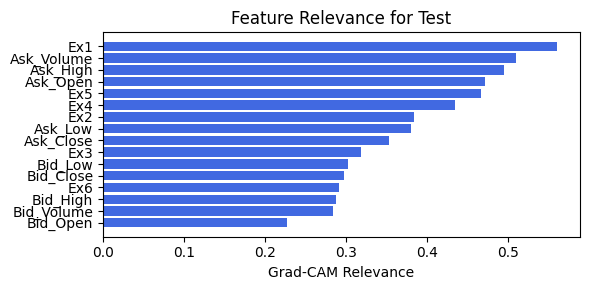

In [65]:
train_and_plot_relevance(Model3_1, kan_neurons=3, kan_grid=3, cnn_bottleneck_dim=6, lamb=1e-06, steps=30, filename=filename_1, opt_col_val=6)

### 1.0.8 width=[10, 3, 1], grid=3, lamb=1e-06 | cnn_bottleneck_dim=9

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


 train_acc_hybrid: 7.55e-01 | val_acc_hybrid: 7.01e-01 |: 100%|█████| 30/30 [00:11<00:00,  2.51it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.3810e-01 at 3 epoch
tensor(0.7030, device='cuda:0')
[[119  64]
 [ 45 139]]
M_KAN Relevance: 0.5848013162612915
CNN Relevance: 0.4151987135410309
[('Ask_High', 2.060964), ('Bid_Close', 2.0195637), ('Ask_Close', 1.7166336), ('Bid_Open', 1.2863927), ('Ask_Low', 1.1410794), ('Bid_High', 1.120209), ('Bid_Low', 0.5293999), ('Ask_Open', 0.36742076), ('Bid_Volume', 0.15975139), ('Ask_Volume', 0.08720182)]


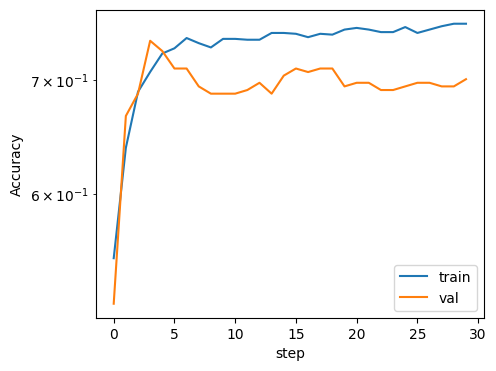

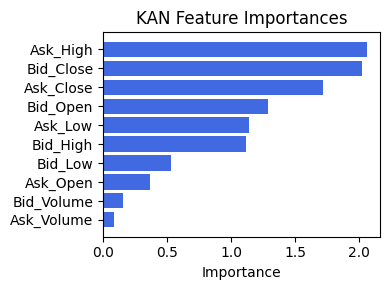

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Bid_Close', 0.590195332869522), ('Ask_Low', 0.4364405169230391), ('Ex2', 0.2896126823687586), ('Bid_Low', 0.2490136723569531), ('Bid_High', 0.17616722257097306), ('Bid_Open', 0.11254653951269891), ('Ask_High', 0.10841099505280385), ('Ex1', 0.07449167059691324), ('Ex3', 0.06751586647250002), ('Ask_Open', 0.06415600908510337), ('Ex4', 0.0452225323917461), ('Ask_Volume', 0.0395398927212128), ('Bid_Volume', 0.03029365863902266), ('Ask_Close', 0.026235121706974795), ('Ex6', 0.023270568788040187), ('Ex5', 0.022585698360753595)]


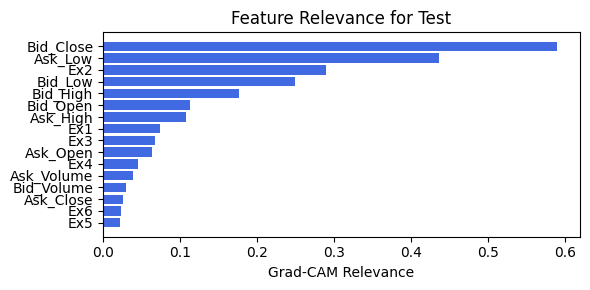

In [66]:
train_and_plot_relevance(Model3_1, kan_neurons=3, kan_grid=3, cnn_bottleneck_dim=9, lamb=1e-06, steps=30, filename=filename_1, opt_col_val=9)

### 1.0.9 width=[10, 3, 1], grid=3, lamb=1e-06 | cnn_bottleneck_dim=9

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


 train_acc_hybrid: 7.49e-01 | val_acc_hybrid: 6.97e-01 |: 100%|█████| 30/30 [00:09<00:00,  3.06it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.3129e-01 at 3 epoch
tensor(0.7084, device='cuda:0')
[[116  67]
 [ 40 144]]
M_KAN Relevance: 0.5758289694786072
CNN Relevance: 0.4241710603237152
[('Ask_High', 2.1846962), ('Bid_Close', 1.9881511), ('Ask_Close', 1.7216465), ('Bid_High', 1.2617356), ('Bid_Open', 1.1144271), ('Ask_Low', 1.1086495), ('Bid_Low', 0.5510983), ('Ask_Open', 0.24306266), ('Bid_Volume', 0.18209648), ('Ask_Volume', 0.108019486)]


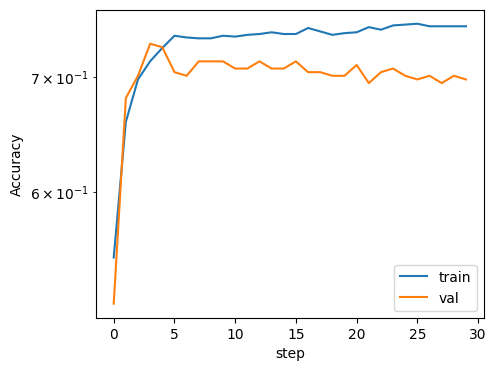

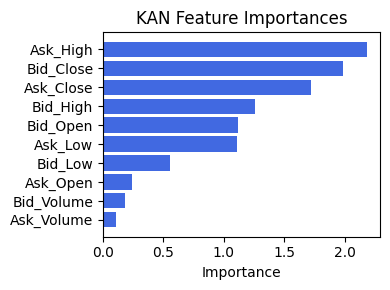

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Bid_Close', 0.699547527553336), ('Ask_Low', 0.6228574185507824), ('Ex2', 0.3338744931458432), ('Bid_Low', 0.24706761381012826), ('Ex3', 0.2354985769858396), ('Bid_High', 0.14256457578675055), ('Ex4', 0.13668729553166625), ('Ask_High', 0.10057797679919953), ('Ex1', 0.07253832293845483), ('Bid_Open', 0.07058018957688511), ('Ask_Open', 0.051496405051056834), ('Ex5', 0.043341675763746736), ('Ask_Volume', 0.039579988434582145), ('Ask_Close', 0.03087409658688032), ('Bid_Volume', 0.026564834388835758), ('Ex6', 0.023545060439380417)]


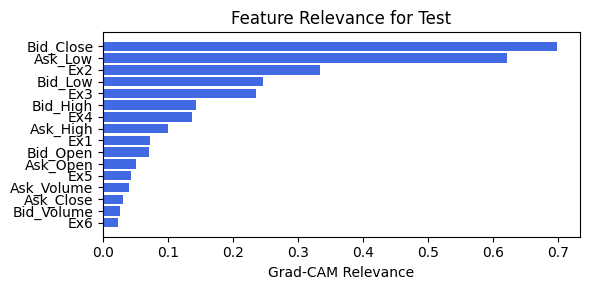

In [67]:
train_and_plot_relevance(Model3_1, kan_neurons=3, kan_grid=3, cnn_bottleneck_dim=9, lamb=1e-06, steps=30, filename=filename_1, opt_col_val=9)

### 1.0.10 width=[10, 3, 1], grid=3, lamb=1e-06 | cnn_bottleneck_dim=12

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


 train_acc_hybrid: 7.38e-01 | val_acc_hybrid: 6.94e-01 |: 100%|█████| 30/30 [00:09<00:00,  3.12it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.3469e-01 at 9 epoch
tensor(0.7248, device='cuda:0')
[[128  55]
 [ 46 138]]
M_KAN Relevance: 0.7665365934371948
CNN Relevance: 0.23346339166164398
[('Ask_Close', 2.387749), ('Bid_Close', 2.2443352), ('Bid_Open', 1.9808943), ('Ask_Open', 1.2569685), ('Ask_High', 1.1385132), ('Bid_High', 0.69793713), ('Bid_Low', 0.594142), ('Ask_Low', 0.49403137), ('Ask_Volume', 0.22121355), ('Bid_Volume', 0.12902868)]


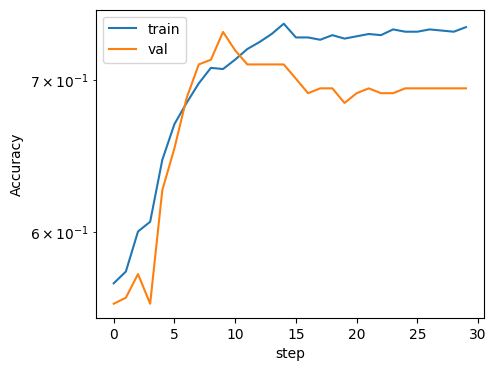

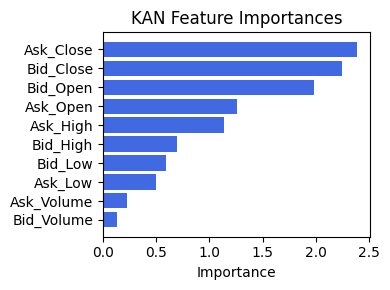

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ask_Volume', 0.5923846417910968), ('Ex1', 0.5293624506963859), ('Ask_Open', 0.4844081653462657), ('Ask_High', 0.41773181153608524), ('Ask_Close', 0.37347649244023157), ('Bid_Volume', 0.3218804221442959), ('Ex5', 0.30453894194136233), ('Ex4', 0.25208670981780296), ('Ex6', 0.23052840303802197), ('Bid_Open', 0.20747177505640316), ('Ex2', 0.1734589390883004), ('Bid_High', 0.15699600248117151), ('Ex3', 0.11655172369770962), ('Ask_Low', 0.09063871040174545), ('Bid_Low', 0.0902638214326918), ('Bid_Close', 0.053434598833139814)]


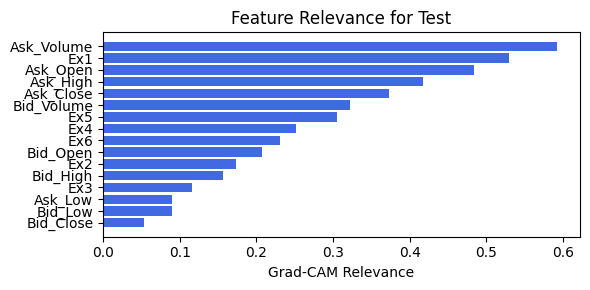

In [68]:
train_and_plot_relevance(Model3_1, kan_neurons=3, kan_grid=3, cnn_bottleneck_dim=12, lamb=1e-06, steps=30, filename=filename_1, opt_col_val=12)

### 1.0.11 width=[10, 3, 1], grid=3, lamb=1e-06 | cnn_bottleneck_dim=12

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


 train_acc_hybrid: 7.38e-01 | val_acc_hybrid: 6.94e-01 |: 100%|█████| 30/30 [00:10<00:00,  2.87it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.3469e-01 at 9 epoch
tensor(0.7248, device='cuda:0')
[[128  55]
 [ 46 138]]
M_KAN Relevance: 0.7665365934371948
CNN Relevance: 0.23346339166164398
[('Ask_Close', 2.387749), ('Bid_Close', 2.2443352), ('Bid_Open', 1.9808943), ('Ask_Open', 1.2569685), ('Ask_High', 1.1385132), ('Bid_High', 0.69793713), ('Bid_Low', 0.594142), ('Ask_Low', 0.49403137), ('Ask_Volume', 0.22121355), ('Bid_Volume', 0.12902868)]


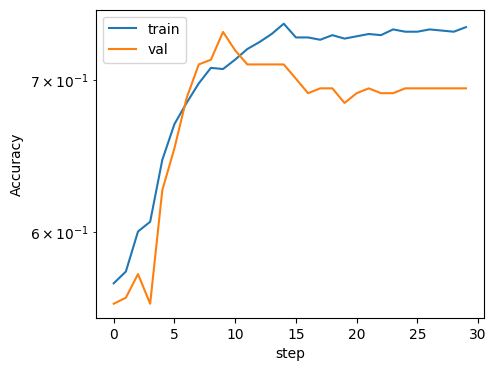

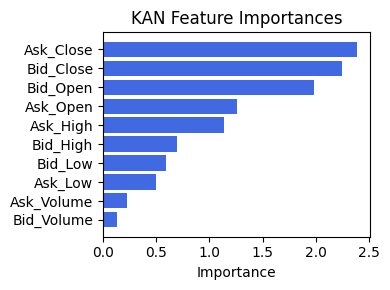

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ask_Volume', 0.5923846417910968), ('Ex1', 0.5293624506963859), ('Ask_Open', 0.4844081653462657), ('Ask_High', 0.41773181153608524), ('Ask_Close', 0.37347649244023157), ('Bid_Volume', 0.3218804221442959), ('Ex5', 0.30453894194136233), ('Ex4', 0.25208670981780296), ('Ex6', 0.23052840303802197), ('Bid_Open', 0.20747177505640316), ('Ex2', 0.1734589390883004), ('Bid_High', 0.15699600248117151), ('Ex3', 0.11655172369770962), ('Ask_Low', 0.09063871040174545), ('Bid_Low', 0.0902638214326918), ('Bid_Close', 0.053434598833139814)]


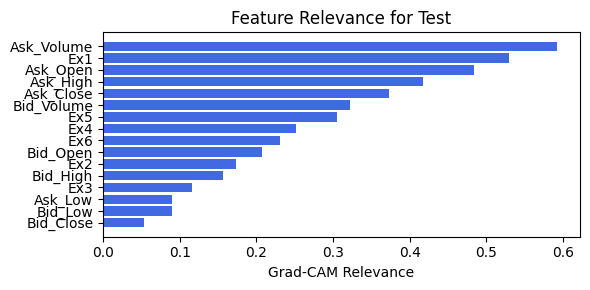

In [69]:
train_and_plot_relevance(Model3_1, kan_neurons=3, kan_grid=3, cnn_bottleneck_dim=12, lamb=1e-06, steps=30, filename=filename_1, opt_col_val=12)

## 1.1 width=[10, 3, 1], grid=4, lamb=0.0001

### 1.1.1 width=[10, 3, 1], grid=4, lamb=0.0001 | cnn_bottleneck_dim=1

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


 train_acc_hybrid: 7.64e-01 | val_acc_hybrid: 6.70e-01 |: 100%|█████| 30/30 [00:09<00:00,  3.06it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.0068e-01 at 7 epoch
tensor(0.7166, device='cuda:0')
[[134  49]
 [ 55 129]]
M_KAN Relevance: 0.8334565162658691
CNN Relevance: 0.16654348373413086
[('Bid_Close', 3.5811994), ('Bid_High', 2.8779972), ('Ask_Close', 2.4507911), ('Ask_High', 2.1345167), ('Ask_Low', 1.1981525), ('Bid_Low', 0.4731216), ('Ask_Open', 0.4264778), ('Bid_Open', 0.31783336), ('Ask_Volume', 0.20552686), ('Bid_Volume', 0.18504518)]


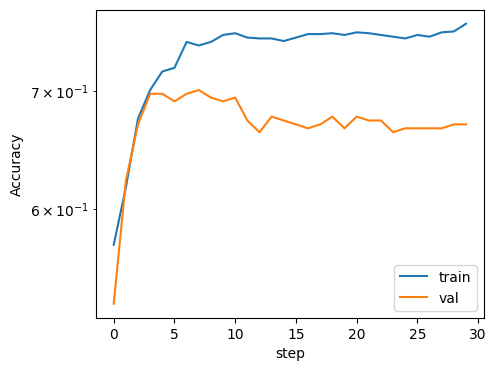

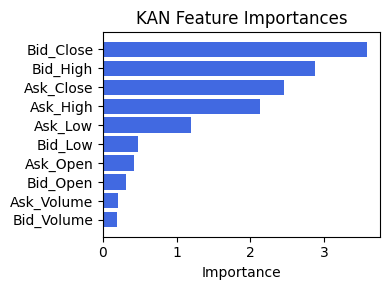

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ask_Volume', 0.5778600373571835), ('Ex1', 0.570627273712561), ('Ask_Open', 0.43834147110647376), ('Ask_High', 0.42100408369877024), ('Ex5', 0.3150675068190702), ('Ex4', 0.29900721925480817), ('Ask_Close', 0.28420237171633694), ('Ask_Low', 0.2591267131238526), ('Bid_Volume', 0.22357976588176953), ('Bid_Close', 0.20884455878881367), ('Ex2', 0.19587398205981899), ('Ex6', 0.1780167384446175), ('Bid_Low', 0.16458067038078725), ('Bid_High', 0.1575968173124424), ('Ex3', 0.1517200882696326), ('Bid_Open', 0.11699226027327952)]


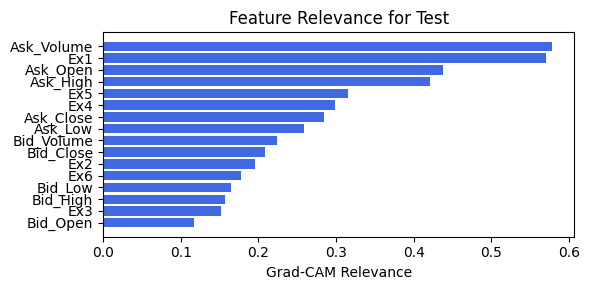

In [70]:
train_and_plot_relevance(Model3_1, kan_neurons=3, kan_grid=4, cnn_bottleneck_dim=1, lamb=0.0001, steps=30, filename=filename_1, opt_col_val=1)

### 1.1.2 width=[10, 3, 1], grid=4, lamb=0.0001 | cnn_bottleneck_dim=1

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


 train_acc_hybrid: 7.64e-01 | val_acc_hybrid: 6.70e-01 |: 100%|█████| 30/30 [00:10<00:00,  2.83it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.0068e-01 at 3 epoch
tensor(0.7057, device='cuda:0')
[[121  62]
 [ 46 138]]
M_KAN Relevance: 0.8895408511161804
CNN Relevance: 0.11045919358730316
[('Bid_Close', 2.2038078), ('Ask_Close', 1.8920249), ('Bid_Open', 1.3917083), ('Ask_Open', 1.3123138), ('Bid_High', 0.9243466), ('Ask_Low', 0.6368136), ('Bid_Low', 0.48389122), ('Ask_High', 0.33986148), ('Ask_Volume', 0.09983748), ('Bid_Volume', 0.082918465)]


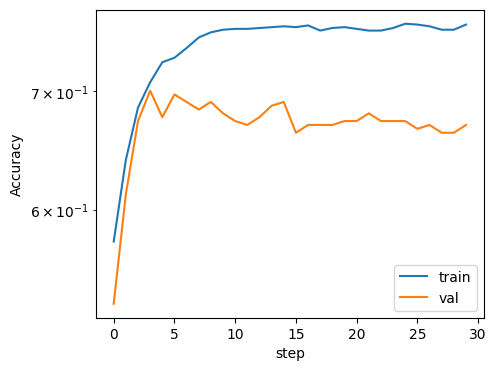

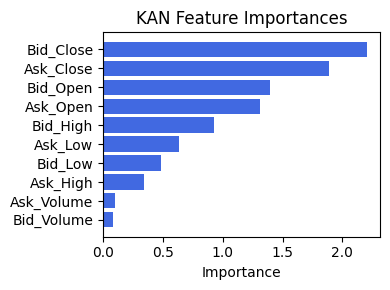

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ask_Volume', 0.7360459458519393), ('Ex1', 0.6929306818289068), ('Ask_Open', 0.4447720517005964), ('Ex5', 0.436783051945533), ('Ask_Close', 0.41665225116820237), ('Ex4', 0.40632574329259286), ('Ask_High', 0.3562874127450914), ('Bid_Volume', 0.2758849176606138), ('Ex6', 0.12537559377643653), ('Ex2', 0.12178580199015562), ('Ex3', 0.11280095234655392), ('Bid_High', 0.06673388789539234), ('Bid_Open', 0.05690878329811902), ('Bid_Low', 0.044980530662837054), ('Ask_Low', 0.02055579048352992), ('Bid_Close', 0.0001648700086458636)]


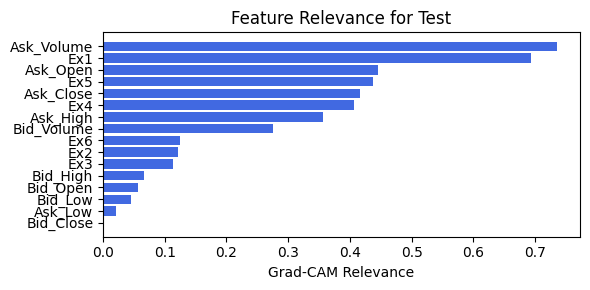

In [71]:
train_and_plot_relevance(Model3_1, kan_neurons=3, kan_grid=4, cnn_bottleneck_dim=1, lamb=0.0001, steps=30, filename=filename_1, opt_col_val=1)

### 1.1.3 width=[10, 3, 1], grid=4, lamb=0.0001 | cnn_bottleneck_dim=2

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


 train_acc_hybrid: 7.54e-01 | val_acc_hybrid: 6.80e-01 |: 100%|█████| 30/30 [00:09<00:00,  3.17it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.0748e-01 at 4 epoch
tensor(0.7166, device='cuda:0')
[[127  56]
 [ 48 136]]
M_KAN Relevance: 0.9316174387931824
CNN Relevance: 0.06838256865739822
[('Bid_Close', 2.4948015), ('Ask_Close', 2.128237), ('Bid_High', 1.4341419), ('Ask_Open', 1.2938662), ('Bid_Open', 1.2608259), ('Ask_High', 1.1142964), ('Bid_Low', 0.6011614), ('Ask_Low', 0.4745968), ('Bid_Volume', 0.14479832), ('Ask_Volume', 0.110763535)]


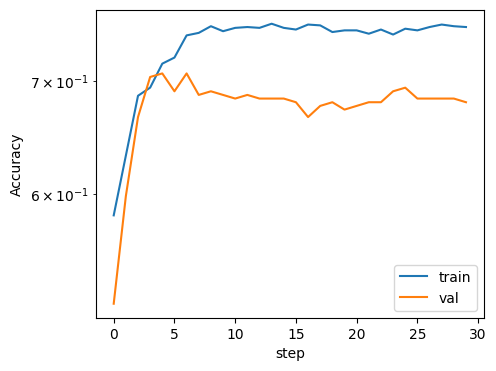

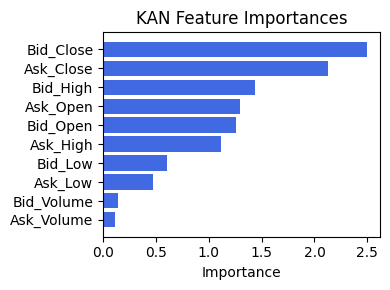

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex1', 0.695380030225262), ('Ask_Volume', 0.6869067015172026), ('Ask_High', 0.47248803877984796), ('Ex6', 0.44716226556452565), ('Ex5', 0.43909089311916755), ('Ask_Open', 0.4260507768847312), ('Ex4', 0.33692128749244543), ('Ex2', 0.29912083683033), ('Ask_Close', 0.1642481631000478), ('Ask_Low', 0.1067160076781478), ('Bid_Volume', 0.08661579463138608), ('Bid_High', 0.035401261262836735), ('Ex3', 0.0325848840594029), ('Bid_Low', 0.028146723542414473), ('Bid_Open', 0.016007073252972237), ('Bid_Close', 0.008937570018686192)]


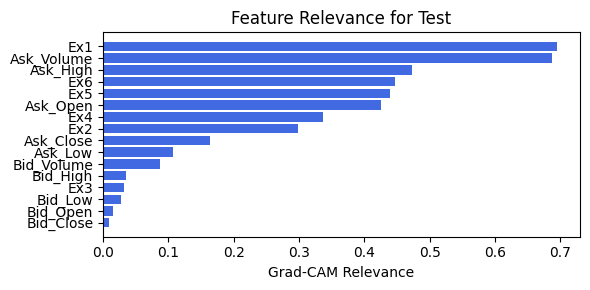

In [72]:
train_and_plot_relevance(Model3_1, kan_neurons=3, kan_grid=4, cnn_bottleneck_dim=2, lamb=0.0001, steps=30, filename=filename_1, opt_col_val=2)

### 1.1.4 width=[10, 3, 1], grid=4, lamb=0.0001 | cnn_bottleneck_dim=2

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


 train_acc_hybrid: 7.65e-01 | val_acc_hybrid: 6.87e-01 |: 100%|█████| 30/30 [00:08<00:00,  3.37it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.1429e-01 at 2 epoch
tensor(0.7003, device='cuda:0')
[[127  56]
 [ 54 130]]
M_KAN Relevance: 0.8006647825241089
CNN Relevance: 0.19933520257472992
[('Bid_Close', 1.7005925), ('Ask_Close', 1.6243334), ('Ask_Open', 1.4729548), ('Bid_Open', 1.4707959), ('Bid_Low', 1.0412776), ('Ask_Low', 0.7794708), ('Bid_High', 0.6555264), ('Ask_High', 0.46598154), ('Ask_Volume', 0.30612743), ('Bid_Volume', 0.16723494)]


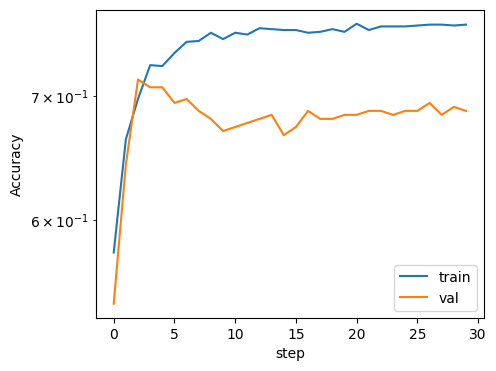

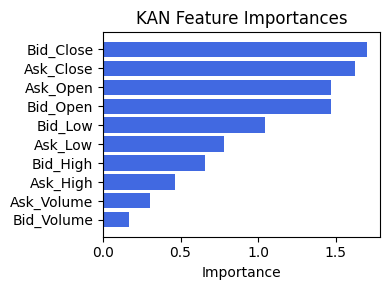

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex1', 0.8248310958007375), ('Ask_Volume', 0.7436264263674089), ('Ex5', 0.6833987116651249), ('Ask_High', 0.5588980330514648), ('Ex6', 0.5414305154731553), ('Ex4', 0.5192746671896215), ('Ask_Open', 0.4444189454131945), ('Ex2', 0.3701597438358806), ('Ask_Low', 0.11814599446257261), ('Ask_Close', 0.08440221269958847), ('Bid_Volume', 0.029929999660824904), ('Ex3', 0.0007008676644491111), ('Bid_High', 0.00048514354494413013), ('Bid_Low', 0.0003917637147178762), ('Bid_Open', 0.0001375466434168312), ('Bid_Close', 0.0)]


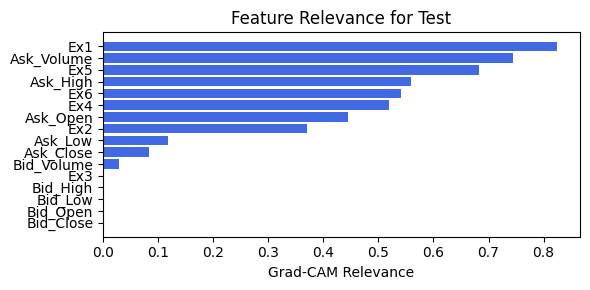

In [73]:
train_and_plot_relevance(Model3_1, kan_neurons=3, kan_grid=4, cnn_bottleneck_dim=2, lamb=0.0001, steps=30, filename=filename_1, opt_col_val=2)

### 1.1.5 width=[10, 3, 1], grid=4, lamb=0.0001 | cnn_bottleneck_dim=3

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


 train_acc_hybrid: 7.68e-01 | val_acc_hybrid: 6.94e-01 |: 100%|█████| 30/30 [00:08<00:00,  3.42it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.0408e-01 at 2 epoch
tensor(0.7248, device='cuda:0')
[[128  55]
 [ 46 138]]
M_KAN Relevance: 0.9638814926147461
CNN Relevance: 0.0361185185611248
[('Bid_Close', 2.0255322), ('Ask_Close', 1.9684457), ('Bid_Open', 1.7576097), ('Ask_Open', 1.7415433), ('Bid_High', 0.849208), ('Bid_Low', 0.82913244), ('Ask_Low', 0.7051203), ('Ask_High', 0.3523162), ('Ask_Volume', 0.17924744), ('Bid_Volume', 0.10475862)]


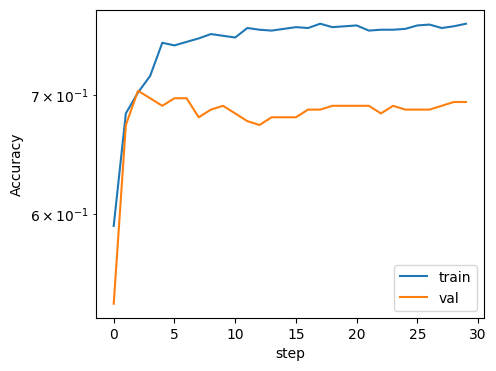

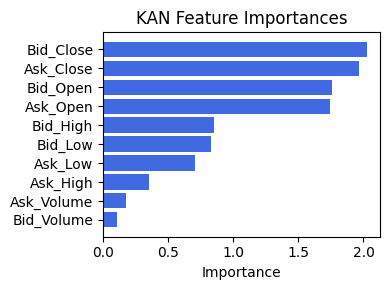

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Bid_High', 0.535832447195248), ('Bid_Low', 0.5248177075093708), ('Bid_Close', 0.4255233760597216), ('Bid_Open', 0.42393947352464273), ('Ask_Low', 0.4079041305553095), ('Ex3', 0.2794888815677621), ('Bid_Volume', 0.26312226547583006), ('Ask_Close', 0.2455579138961075), ('Ask_High', 0.20492245889032812), ('Ex2', 0.18745308994297802), ('Ask_Open', 0.17459555484331657), ('Ask_Volume', 0.1116656098871337), ('Ex4', 0.09835990494287164), ('Ex5', 0.05804746970597766), ('Ex6', 0.05328941956220819), ('Ex1', 0.04964139996170163)]


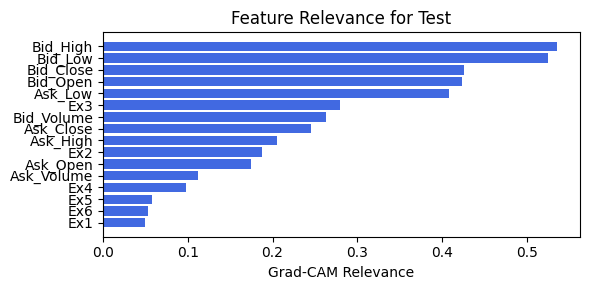

In [74]:
train_and_plot_relevance(Model3_1, kan_neurons=3, kan_grid=4, cnn_bottleneck_dim=3, lamb=0.0001, steps=30, filename=filename_1, opt_col_val=3)

### 1.1.6 width=[10, 3, 1], grid=4, lamb=0.0001 | cnn_bottleneck_dim=3

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


 train_acc_hybrid: 7.68e-01 | val_acc_hybrid: 6.94e-01 |: 100%|█████| 30/30 [00:11<00:00,  2.59it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.0408e-01 at 2 epoch
tensor(0.7248, device='cuda:0')
[[128  55]
 [ 46 138]]
M_KAN Relevance: 0.9638814926147461
CNN Relevance: 0.0361185185611248
[('Bid_Close', 2.0255322), ('Ask_Close', 1.9684457), ('Bid_Open', 1.7576097), ('Ask_Open', 1.7415433), ('Bid_High', 0.849208), ('Bid_Low', 0.82913244), ('Ask_Low', 0.7051203), ('Ask_High', 0.3523162), ('Ask_Volume', 0.17924744), ('Bid_Volume', 0.10475862)]


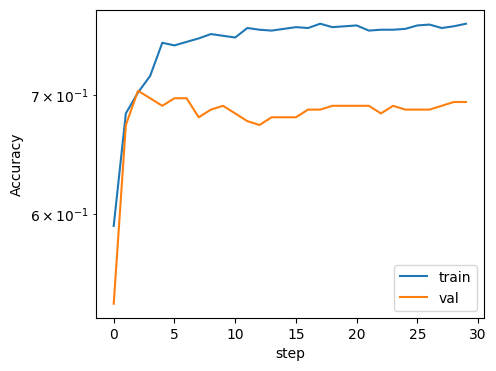

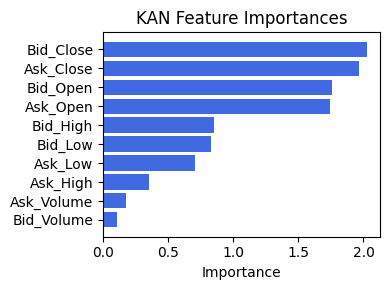

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Bid_High', 0.535832447195248), ('Bid_Low', 0.5248177075093708), ('Bid_Close', 0.4255233760597216), ('Bid_Open', 0.42393947352464273), ('Ask_Low', 0.4079041305553095), ('Ex3', 0.2794888815677621), ('Bid_Volume', 0.26312226547583006), ('Ask_Close', 0.2455579138961075), ('Ask_High', 0.20492245889032812), ('Ex2', 0.18745308994297802), ('Ask_Open', 0.17459555484331657), ('Ask_Volume', 0.1116656098871337), ('Ex4', 0.09835990494287164), ('Ex5', 0.05804746970597766), ('Ex6', 0.05328941956220819), ('Ex1', 0.04964139996170163)]


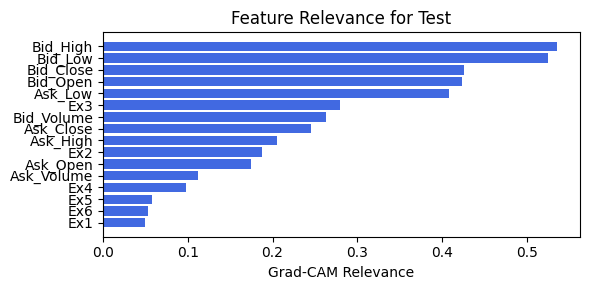

In [75]:
train_and_plot_relevance(Model3_1, kan_neurons=3, kan_grid=4, cnn_bottleneck_dim=3, lamb=0.0001, steps=30, filename=filename_1, opt_col_val=3)

### 1.1.7 width=[10, 3, 1], grid=4, lamb=0.0001 | cnn_bottleneck_dim=6

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


 train_acc_hybrid: 7.55e-01 | val_acc_hybrid: 6.60e-01 |: 100%|█████| 30/30 [00:09<00:00,  3.06it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.2109e-01 at 4 epoch
tensor(0.7275, device='cuda:0')
[[130  53]
 [ 47 137]]
M_KAN Relevance: 0.8708530068397522
CNN Relevance: 0.1291470229625702
[('Bid_Close', 2.8236604), ('Ask_Close', 2.3385942), ('Bid_High', 1.9367106), ('Ask_High', 1.52115), ('Ask_Open', 0.84459084), ('Bid_Open', 0.7965853), ('Ask_Low', 0.79436314), ('Bid_Low', 0.5351844), ('Bid_Volume', 0.31693995), ('Ask_Volume', 0.2875992)]


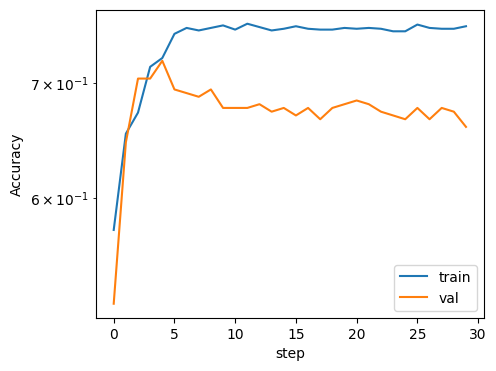

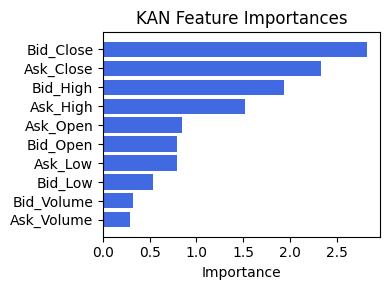

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex2', 0.710700625457296), ('Ask_Low', 0.5340104573875747), ('Ex6', 0.4212714073930839), ('Ex5', 0.24246592450206872), ('Bid_Close', 0.20969655574997254), ('Ex4', 0.19962622939890673), ('Ex3', 0.09326876951280058), ('Ex1', 0.007127037699572547), ('Ask_High', 0.0011533263178691107), ('Ask_Volume', 0.0007374344047219861), ('Bid_Low', 0.0004838119430554084), ('Ask_Open', 8.927165893507913e-06), ('Bid_Volume', 5.254535288714908e-06), ('Bid_Open', 0.0), ('Bid_High', 0.0), ('Ask_Close', 0.0)]


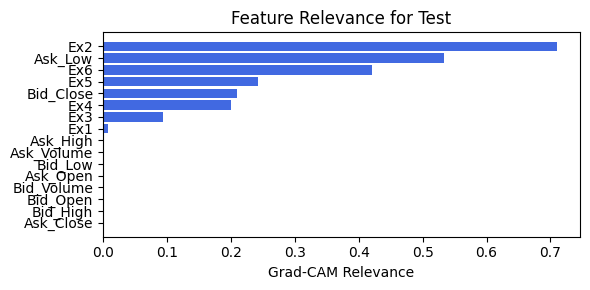

In [76]:
train_and_plot_relevance(Model3_1, kan_neurons=3, kan_grid=4, cnn_bottleneck_dim=6, lamb=0.0001, steps=30, filename=filename_1, opt_col_val=6)

### 1.1.8 width=[10, 3, 1], grid=4, lamb=0.0001 | cnn_bottleneck_dim=6

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


 train_acc_hybrid: 7.55e-01 | val_acc_hybrid: 6.77e-01 |: 100%|█████| 30/30 [00:11<00:00,  2.63it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.2109e-01 at 3 epoch
tensor(0.7275, device='cuda:0')
[[127  56]
 [ 44 140]]
M_KAN Relevance: 0.8702320456504822
CNN Relevance: 0.1297679990530014
[('Bid_Close', 2.4589934), ('Ask_Close', 2.136536), ('Ask_Open', 1.6892097), ('Bid_Open', 1.6194366), ('Bid_High', 1.2820759), ('Bid_Low', 0.9732995), ('Ask_High', 0.72830486), ('Ask_Low', 0.6377527), ('Ask_Volume', 0.2973835), ('Bid_Volume', 0.24022421)]


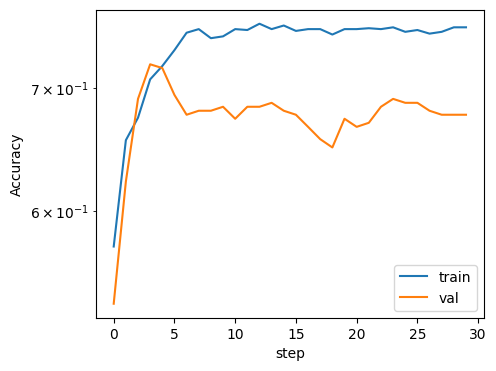

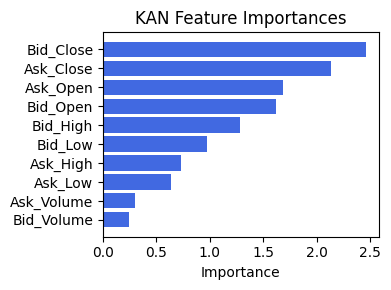

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex5', 0.7899285827735464), ('Ex6', 0.7025897715656894), ('Ex4', 0.6284928744105617), ('Ex2', 0.27721106340190044), ('Ex1', 0.13581641014330392), ('Ask_Volume', 0.0979920661139195), ('Ask_Low', 0.0295830062461753), ('Ask_High', 0.01493908539262146), ('Ask_Open', 0.010900104890402397), ('Bid_Open', 0.0), ('Bid_High', 0.0), ('Bid_Low', 0.0), ('Bid_Close', 0.0), ('Bid_Volume', 0.0), ('Ask_Close', 0.0), ('Ex3', 0.0)]


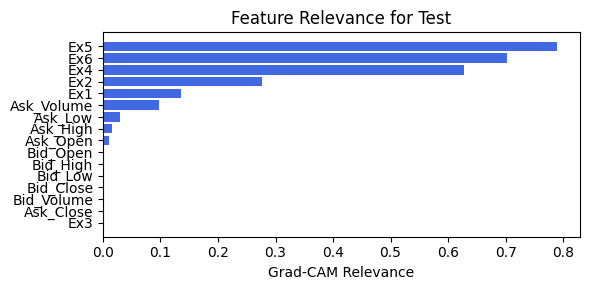

In [77]:
train_and_plot_relevance(Model3_1, kan_neurons=3, kan_grid=4, cnn_bottleneck_dim=6, lamb=0.0001, steps=30, filename=filename_1, opt_col_val=6)

### 1.1.9 width=[10, 3, 1], grid=4, lamb=0.0001 | cnn_bottleneck_dim=9

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


 train_acc_hybrid: 7.55e-01 | val_acc_hybrid: 6.87e-01 |: 100%|█████| 30/30 [00:11<00:00,  2.64it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.1088e-01 at 2 epoch
tensor(0.7139, device='cuda:0')
[[127  56]
 [ 49 135]]
M_KAN Relevance: 0.7865571975708008
CNN Relevance: 0.21344278752803802
[('Bid_Close', 2.0659213), ('Ask_Close', 1.8329486), ('Bid_Open', 1.7628117), ('Ask_Open', 1.7259996), ('Ask_Low', 0.7213296), ('Bid_Low', 0.65648854), ('Bid_High', 0.5118305), ('Ask_High', 0.33564064), ('Ask_Volume', 0.18810618), ('Bid_Volume', 0.1424701)]


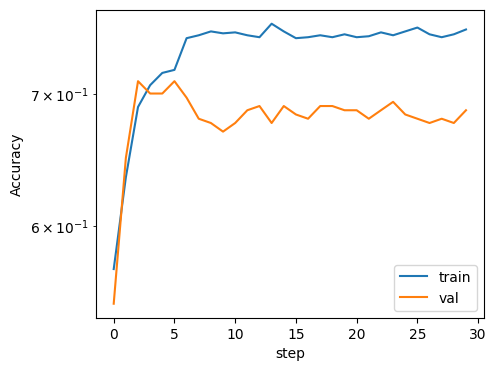

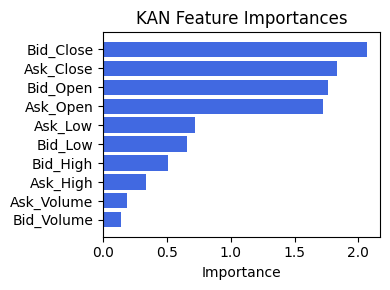

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex5', 0.722303623653319), ('Ex2', 0.7006230899767204), ('Ex4', 0.6054193724241179), ('Ex6', 0.5464230378193918), ('Ask_Low', 0.4729807258479561), ('Ex1', 0.30788009413276934), ('Ask_Volume', 0.20846239027975771), ('Ask_High', 0.17919165492616088), ('Bid_Close', 0.09332253963404646), ('Ask_Open', 0.08859401682862182), ('Ex3', 0.07810709414000011), ('Bid_Low', 0.053525967337968265), ('Bid_High', 0.039953741757104005), ('Bid_Open', 0.024288787771706604), ('Bid_Volume', 0.008453148157064288), ('Ask_Close', 0.008363384865122855)]


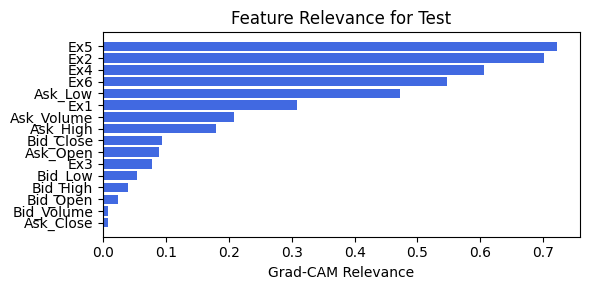

In [78]:
train_and_plot_relevance(Model3_1, kan_neurons=3, kan_grid=4, cnn_bottleneck_dim=9, lamb=0.0001, steps=30, filename=filename_1, opt_col_val=9)

### 1.1.10 width=[10, 3, 1], grid=4, lamb=0.0001 | cnn_bottleneck_dim=9

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


 train_acc_hybrid: 7.55e-01 | val_acc_hybrid: 6.87e-01 |: 100%|█████| 30/30 [00:10<00:00,  2.98it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.1088e-01 at 2 epoch
tensor(0.7139, device='cuda:0')
[[127  56]
 [ 49 135]]
M_KAN Relevance: 0.7865571975708008
CNN Relevance: 0.21344278752803802
[('Bid_Close', 2.0659213), ('Ask_Close', 1.8329486), ('Bid_Open', 1.7628117), ('Ask_Open', 1.7259996), ('Ask_Low', 0.7213296), ('Bid_Low', 0.65648854), ('Bid_High', 0.5118305), ('Ask_High', 0.33564064), ('Ask_Volume', 0.18810618), ('Bid_Volume', 0.1424701)]


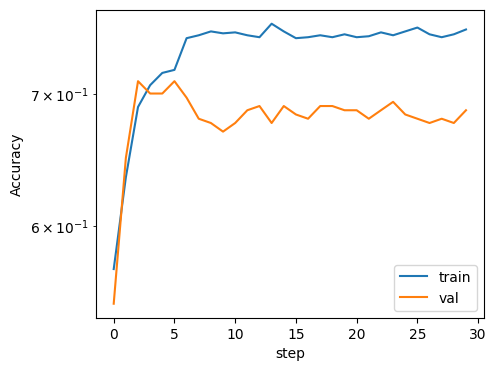

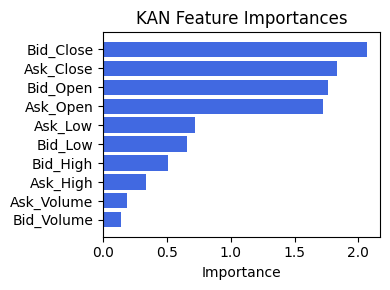

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex5', 0.722303623653319), ('Ex2', 0.7006230899767204), ('Ex4', 0.6054193724241179), ('Ex6', 0.5464230378193918), ('Ask_Low', 0.4729807258479561), ('Ex1', 0.30788009413276934), ('Ask_Volume', 0.20846239027975771), ('Ask_High', 0.17919165492616088), ('Bid_Close', 0.09332253963404646), ('Ask_Open', 0.08859401682862182), ('Ex3', 0.07810709414000011), ('Bid_Low', 0.053525967337968265), ('Bid_High', 0.039953741757104005), ('Bid_Open', 0.024288787771706604), ('Bid_Volume', 0.008453148157064288), ('Ask_Close', 0.008363384865122855)]


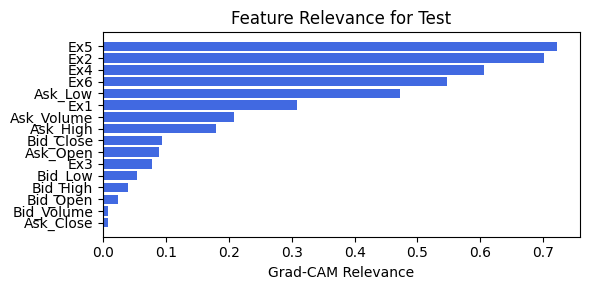

In [79]:
train_and_plot_relevance(Model3_1, kan_neurons=3, kan_grid=4, cnn_bottleneck_dim=9, lamb=0.0001, steps=30, filename=filename_1, opt_col_val=9)

### 1.1.11 width=[10, 3, 1], grid=4, lamb=0.0001 | cnn_bottleneck_dim=12

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


 train_acc_hybrid: 7.50e-01 | val_acc_hybrid: 6.73e-01 |: 100%|█████| 30/30 [00:08<00:00,  3.34it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.1429e-01 at 6 epoch
tensor(0.7302, device='cuda:0')
[[130  53]
 [ 46 138]]
M_KAN Relevance: 0.7276574969291687
CNN Relevance: 0.2723424732685089
[('Bid_Close', 2.5469692), ('Ask_Close', 2.0094543), ('Bid_High', 1.7099183), ('Ask_High', 1.3065286), ('Bid_Open', 0.8876871), ('Ask_Open', 0.82910967), ('Ask_Low', 0.6893848), ('Bid_Low', 0.51885366), ('Bid_Volume', 0.17483935), ('Ask_Volume', 0.15154064)]


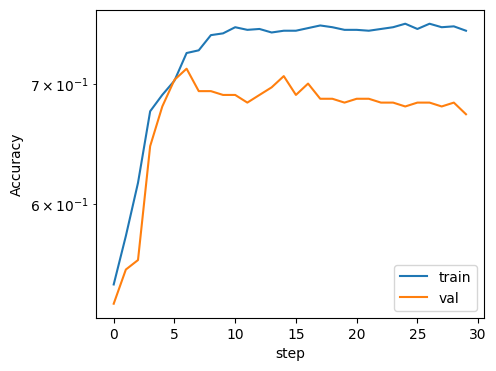

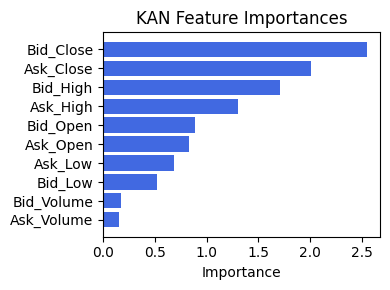

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ask_Close', 0.6386510263164135), ('Ask_Open', 0.6008580280137972), ('Ask_Volume', 0.582434118747564), ('Ask_High', 0.5544570667379883), ('Bid_Volume', 0.5453905622380956), ('Ex4', 0.5409293944163284), ('Bid_High', 0.5223466460808747), ('Bid_Low', 0.5163419153287561), ('Ex3', 0.5136294798565171), ('Ex5', 0.4383512112167372), ('Ex1', 0.3554638519233514), ('Bid_Open', 0.3256650498030296), ('Bid_Close', 0.30290613085924767), ('Ask_Low', 0.15495321470787318), ('Ex6', 0.09599503678617344), ('Ex2', 0.005851672070889126)]


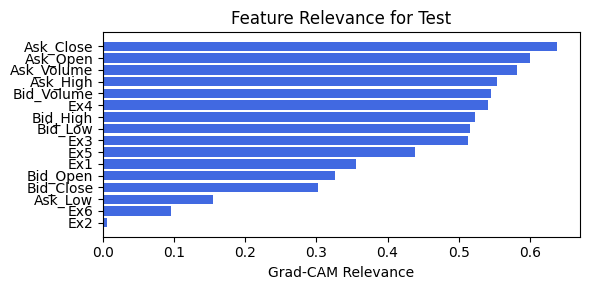

In [80]:
train_and_plot_relevance(Model3_1, kan_neurons=3, kan_grid=4, cnn_bottleneck_dim=12, lamb=0.0001, steps=30, filename=filename_1, opt_col_val=12)

### 1.1.12 width=[10, 3, 1], grid=4, lamb=0.0001 | cnn_bottleneck_dim=12

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


 train_acc_hybrid: 7.50e-01 | val_acc_hybrid: 6.84e-01 |: 100%|█████| 30/30 [00:10<00:00,  2.94it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.2449e-01 at 7 epoch
tensor(0.7003, device='cuda:0')
[[121  62]
 [ 48 136]]
M_KAN Relevance: 0.7430453896522522
CNN Relevance: 0.2569546103477478
[('Bid_Close', 2.3901575), ('Ask_Close', 1.875201), ('Bid_Open', 1.3577884), ('Ask_Open', 1.3017101), ('Bid_High', 1.2910948), ('Bid_Low', 0.851087), ('Ask_Low', 0.8316715), ('Ask_High', 0.5557854), ('Bid_Volume', 0.14473179), ('Ask_Volume', 0.13258833)]


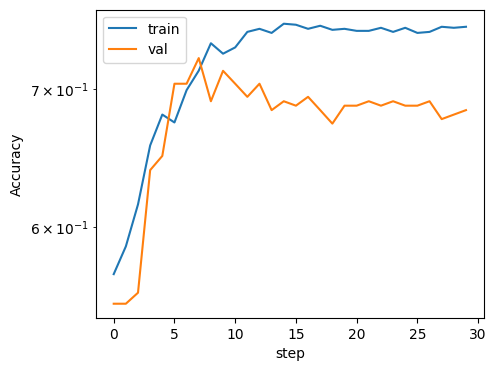

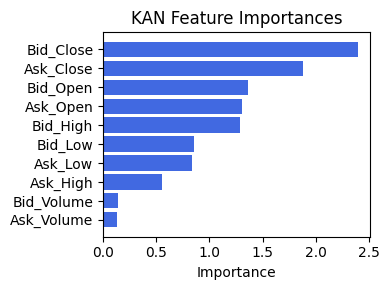

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ask_Volume', 0.7042997258560534), ('Ask_High', 0.6737648065148647), ('Ask_Open', 0.6518605886590578), ('Ex1', 0.5541368446005788), ('Ex4', 0.4977086329330216), ('Ex5', 0.47465952264515515), ('Ask_Close', 0.4695669634303215), ('Bid_Volume', 0.3591854023754759), ('Bid_High', 0.3517583958634584), ('Bid_Low', 0.33813114196305705), ('Ex3', 0.2959011415938266), ('Ex6', 0.15433751966306883), ('Ask_Low', 0.1393142017289712), ('Bid_Open', 0.11548167073271905), ('Bid_Close', 0.08637796853839011), ('Ex2', 0.04711489847160835)]


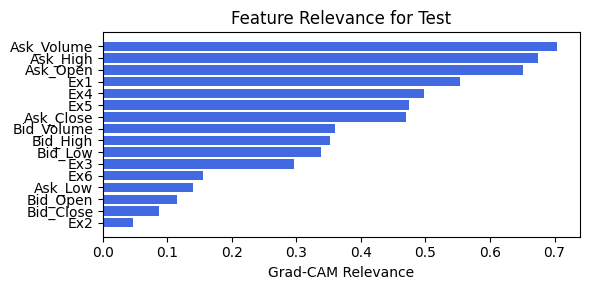

In [81]:
train_and_plot_relevance(Model3_1, kan_neurons=3, kan_grid=4, cnn_bottleneck_dim=12, lamb=0.0001, steps=30, filename=filename_1, opt_col_val=12)

## 1.2 width=[10, 1, 1], grid=3, lamb=0.0001

### 1.2.0 width=[10, 1, 1], grid=3, lamb=0.0001 | cnn_bottleneck_dim=1

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


 train_acc_hybrid: 7.47e-01 | val_acc_hybrid: 6.84e-01 |: 100%|█████| 30/30 [00:09<00:00,  3.28it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.3810e-01 at 2 epoch
tensor(0.7166, device='cuda:0')
[[121  62]
 [ 42 142]]
M_KAN Relevance: 0.9999510049819946
CNN Relevance: 4.9017005949281156e-05
[('Bid_Close', 7.5686646), ('Ask_Close', 6.3270593), ('Ask_High', 4.935626), ('Bid_High', 4.0869346), ('Ask_Open', 3.1928303), ('Bid_Open', 1.9130371), ('Bid_Low', 0.39185953), ('Ask_Low', 0.25977877), ('Bid_Volume', 0.21414626), ('Ask_Volume', 0.15510806)]


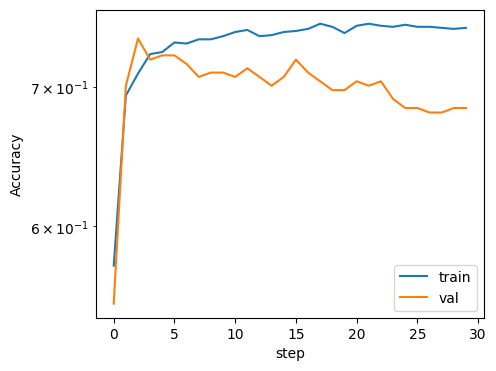

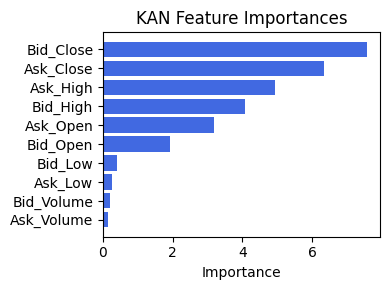

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex5', 0.5676414833406661), ('Ex1', 0.49497381234363896), ('Ex4', 0.42226227273408334), ('Ask_Volume', 0.37793480259764745), ('Ex6', 0.2679296961759676), ('Ex2', 0.22287514594660143), ('Ask_High', 0.21100670652849757), ('Ask_Open', 0.1824794181214001), ('Ask_Low', 0.04315651773181059), ('Ask_Close', 0.029296983772513205), ('Bid_Volume', 0.015594125211610629), ('Ex3', 0.009513771072936014), ('Bid_Low', 0.00041853289338187916), ('Bid_High', 0.0003729648812774224), ('Bid_Open', 0.0), ('Bid_Close', 0.0)]


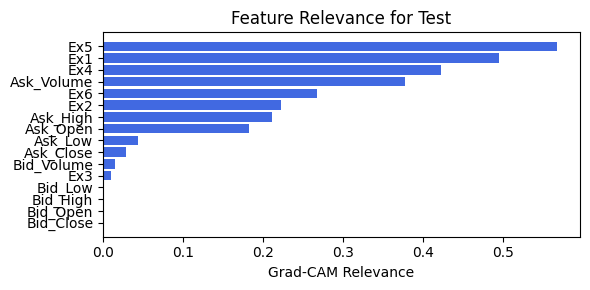

In [82]:
train_and_plot_relevance(Model3_1, kan_neurons=1, kan_grid=3, cnn_bottleneck_dim=1, lamb=0.0001, steps=30, filename=filename_1, opt_col_val=1)

### 1.2.1 width=[10, 1, 1], grid=3, lamb=0.0001 | cnn_bottleneck_dim=1

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


 train_acc_hybrid: 7.49e-01 | val_acc_hybrid: 6.77e-01 |: 100%|█████| 30/30 [00:08<00:00,  3.48it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.3469e-01 at 5 epoch
tensor(0.7193, device='cuda:0')
[[137  46]
 [ 57 127]]
M_KAN Relevance: 0.9752614498138428
CNN Relevance: 0.024738529697060585
[('Bid_Close', 9.344096), ('Ask_High', 7.624764), ('Bid_High', 7.376073), ('Ask_Close', 6.850058), ('Ask_Open', 1.019508), ('Bid_Open', 0.43353692), ('Bid_Low', 0.38471696), ('Ask_Low', 0.31306666), ('Ask_Volume', 0.08231824), ('Bid_Volume', 0.07474646)]


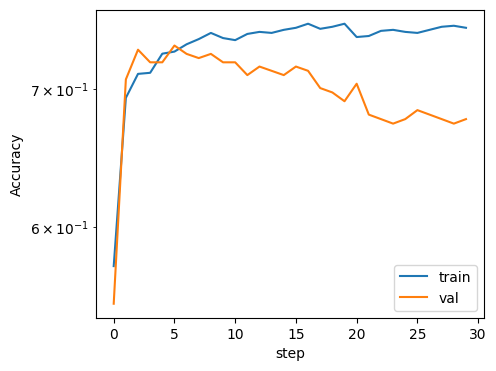

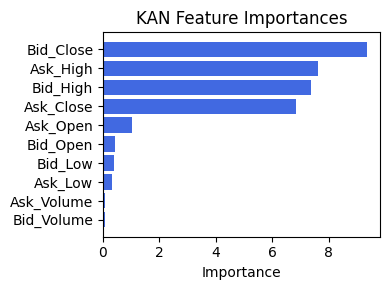

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Bid_Close', 0.7156350557420819), ('Bid_Low', 0.631999161245894), ('Bid_High', 0.5999541578637385), ('Bid_Open', 0.5821845711739252), ('Bid_Volume', 0.4576423364952816), ('Ask_Close', 0.4037113008305065), ('Ex3', 0.39197625806593217), ('Ask_Low', 0.31207065183760685), ('Ask_Open', 0.2070129481486834), ('Ask_High', 0.2003382886607677), ('Ex1', 0.12093279840252096), ('Ex5', 0.11508685123043425), ('Ask_Volume', 0.11450652970598721), ('Ex2', 0.09836712914991018), ('Ex4', 0.09078101234842806), ('Ex6', 0.05885758996009827)]


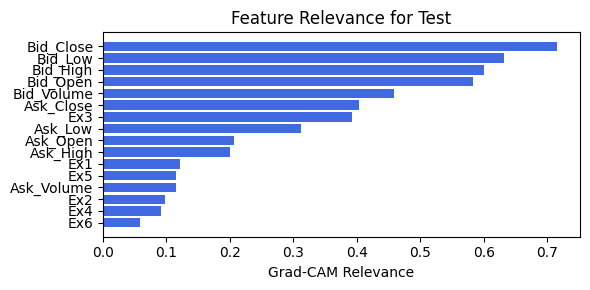

In [83]:
train_and_plot_relevance(Model3_1, kan_neurons=1, kan_grid=3, cnn_bottleneck_dim=1, lamb=0.0001, steps=30, filename=filename_1, opt_col_val=1)

### 1.2.2 width=[10, 1, 1], grid=3, lamb=0.0001 | cnn_bottleneck_dim=2

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


 train_acc_hybrid: 7.43e-01 | val_acc_hybrid: 7.01e-01 |: 100%|█████| 30/30 [00:10<00:00,  2.80it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.2449e-01 at 5 epoch
tensor(0.7248, device='cuda:0')
[[131  52]
 [ 49 135]]
M_KAN Relevance: 0.2850596606731415
CNN Relevance: 0.7149403691291809
[('Bid_Close', 7.6870556), ('Ask_Close', 6.7825923), ('Bid_High', 4.478603), ('Ask_High', 3.4468544), ('Ask_Open', 2.4205058), ('Bid_Open', 2.1521735), ('Bid_Low', 1.296114), ('Ask_Low', 0.44456568), ('Ask_Volume', 0.36737126), ('Bid_Volume', 0.28280643)]


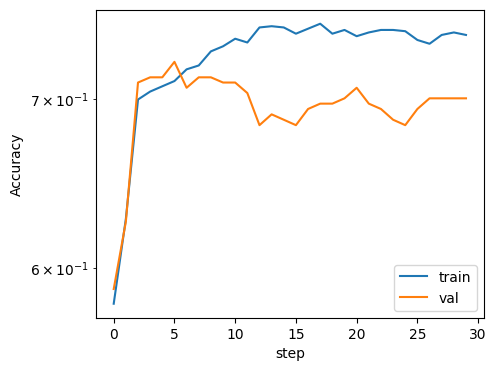

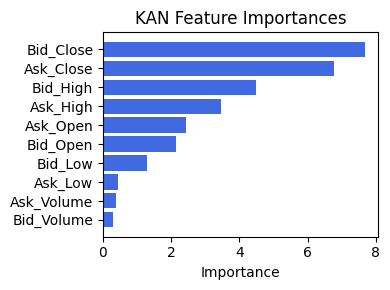

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex2', 0.5556639134071828), ('Ex6', 0.16993022878458902), ('Ask_Low', 0.13935553361928188), ('Ask_Close', 0.003363044638115639), ('Ask_Volume', 0.0004552519126549079), ('Bid_Close', 6.397529847777832e-05), ('Bid_High', 2.4149666365225893e-05), ('Ask_Open', 2.4149666365225893e-05), ('Bid_Low', 9.085668367650918e-06), ('Ask_High', 9.085668367650918e-06), ('Bid_Open', 0.0), ('Bid_Volume', 0.0), ('Ex1', 0.0), ('Ex3', 0.0), ('Ex4', 0.0), ('Ex5', 0.0)]


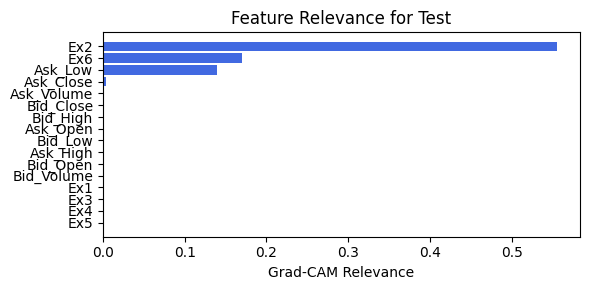

In [84]:
train_and_plot_relevance(Model3_1, kan_neurons=1, kan_grid=3, cnn_bottleneck_dim=2, lamb=0.0001, steps=30, filename=filename_1, opt_col_val=2)

### 1.2.3 width=[10, 1, 1], grid=3, lamb=0.0001 | cnn_bottleneck_dim=2

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


 train_acc_hybrid: 7.43e-01 | val_acc_hybrid: 7.01e-01 |: 100%|█████| 30/30 [00:09<00:00,  3.12it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.2449e-01 at 5 epoch
tensor(0.7248, device='cuda:0')
[[131  52]
 [ 49 135]]
M_KAN Relevance: 0.2850596606731415
CNN Relevance: 0.7149403691291809
[('Bid_Close', 7.6870556), ('Ask_Close', 6.7825923), ('Bid_High', 4.478603), ('Ask_High', 3.4468544), ('Ask_Open', 2.4205058), ('Bid_Open', 2.1521735), ('Bid_Low', 1.296114), ('Ask_Low', 0.44456568), ('Ask_Volume', 0.36737126), ('Bid_Volume', 0.28280643)]


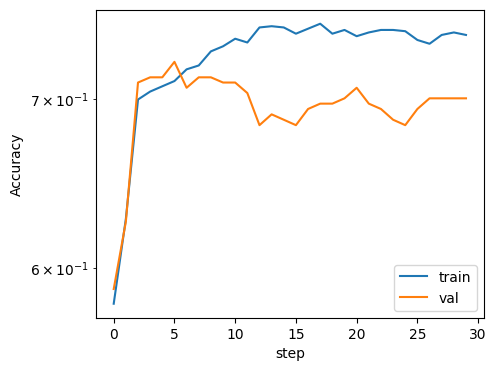

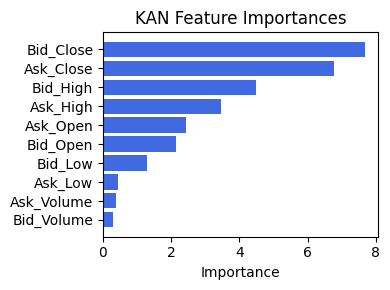

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex2', 0.5556639134071828), ('Ex6', 0.16993022878458902), ('Ask_Low', 0.13935553361928188), ('Ask_Close', 0.003363044638115639), ('Ask_Volume', 0.0004552519126549079), ('Bid_Close', 6.397529847777832e-05), ('Bid_High', 2.4149666365225893e-05), ('Ask_Open', 2.4149666365225893e-05), ('Bid_Low', 9.085668367650918e-06), ('Ask_High', 9.085668367650918e-06), ('Bid_Open', 0.0), ('Bid_Volume', 0.0), ('Ex1', 0.0), ('Ex3', 0.0), ('Ex4', 0.0), ('Ex5', 0.0)]


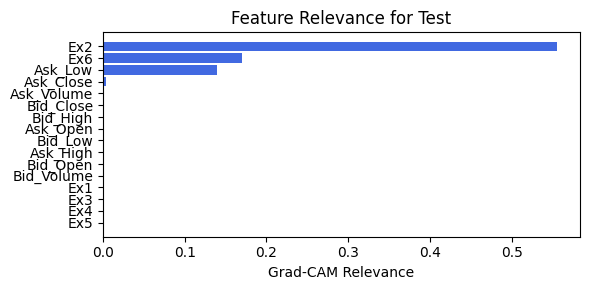

In [85]:
train_and_plot_relevance(Model3_1, kan_neurons=1, kan_grid=3, cnn_bottleneck_dim=2, lamb=0.0001, steps=30, filename=filename_1, opt_col_val=2)

### 1.2.4 width=[10, 1, 1], grid=3, lamb=0.0001 | cnn_bottleneck_dim=3

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


 train_acc_hybrid: 7.42e-01 | val_acc_hybrid: 6.84e-01 |: 100%|█████| 30/30 [00:08<00:00,  3.37it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.2109e-01 at 3 epoch
tensor(0.7112, device='cuda:0')
[[125  58]
 [ 48 136]]
M_KAN Relevance: 0.9897513389587402
CNN Relevance: 0.010248689912259579
[('Bid_Close', 8.80326), ('Ask_Close', 6.6299677), ('Bid_High', 6.0238633), ('Ask_High', 5.495269), ('Ask_Open', 2.0392785), ('Bid_Open', 1.1515858), ('Bid_Low', 0.62764543), ('Bid_Volume', 0.31333598), ('Ask_Volume', 0.2392274), ('Ask_Low', 0.22873309)]


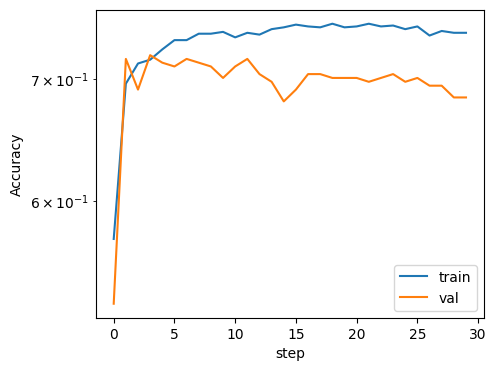

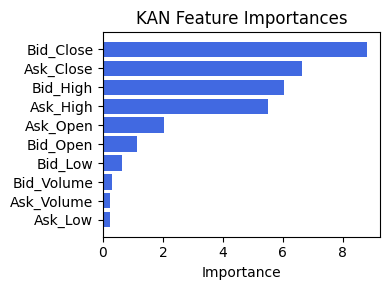

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex5', 0.48166863437569435), ('Ex1', 0.43349746592363153), ('Ask_Volume', 0.3636952399781192), ('Ex4', 0.3397367138222713), ('Ex6', 0.22620981509419164), ('Ask_Open', 0.19802021356837188), ('Ask_High', 0.1956692518798345), ('Ex2', 0.17477120832623838), ('Ask_Close', 0.06307205465785291), ('Bid_Volume', 0.04099236309776725), ('Ask_Low', 0.020156226802886305), ('Ex3', 0.01063953423273067), ('Bid_High', 0.006315801188772245), ('Bid_Open', 0.0034476172089213837), ('Bid_Low', 0.0030374573116230064), ('Bid_Close', 0.0)]


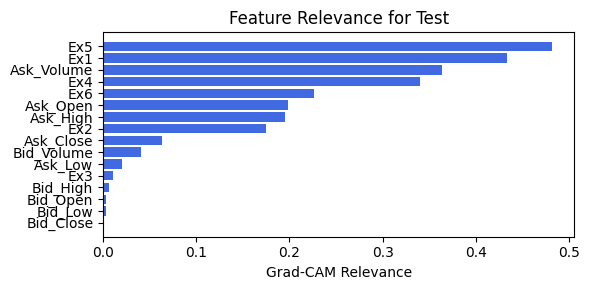

In [86]:
train_and_plot_relevance(Model3_1, kan_neurons=1, kan_grid=3, cnn_bottleneck_dim=3, lamb=0.0001, steps=30, filename=filename_1, opt_col_val=3)

### 1.2.5 width=[10, 1, 1], grid=3, lamb=0.0001 | cnn_bottleneck_dim=3

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


 train_acc_hybrid: 7.52e-01 | val_acc_hybrid: 7.04e-01 |: 100%|█████| 30/30 [00:10<00:00,  2.77it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.2789e-01 at 6 epoch
tensor(0.7248, device='cuda:0')
[[132  51]
 [ 50 134]]
M_KAN Relevance: 0.9070979952812195
CNN Relevance: 0.09290198981761932
[('Bid_Close', 9.457455), ('Bid_High', 7.9254417), ('Ask_Close', 6.9459558), ('Ask_High', 6.155228), ('Ask_Open', 1.1224376), ('Bid_Low', 0.9840064), ('Bid_Open', 0.56485254), ('Bid_Volume', 0.14709285), ('Ask_Volume', 0.09446676), ('Ask_Low', 0.04267878)]


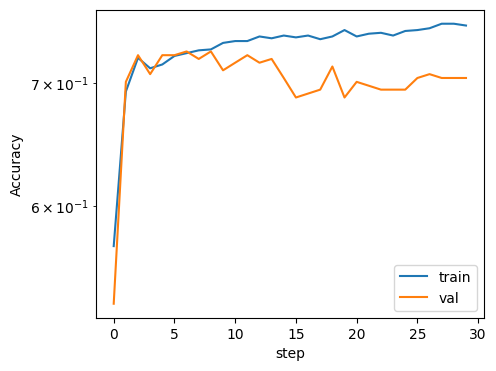

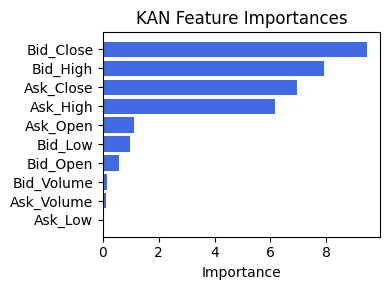

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex3', 0.6920553418894204), ('Bid_Close', 0.6513018210492114), ('Ask_Low', 0.49763771786487077), ('Bid_Low', 0.32686949669629617), ('Ex2', 0.23290772281323208), ('Ex4', 0.20645456296221762), ('Bid_High', 0.20557789123101333), ('Ask_High', 0.17192379140221495), ('Ask_Close', 0.15088928139664495), ('Bid_Open', 0.11594148830108456), ('Ask_Volume', 0.10487533344795841), ('Ask_Open', 0.10264643372102496), ('Ex1', 0.10072213824873213), ('Ex5', 0.09353092706943697), ('Bid_Volume', 0.0548975495304354), ('Ex6', 0.040089481451855695)]


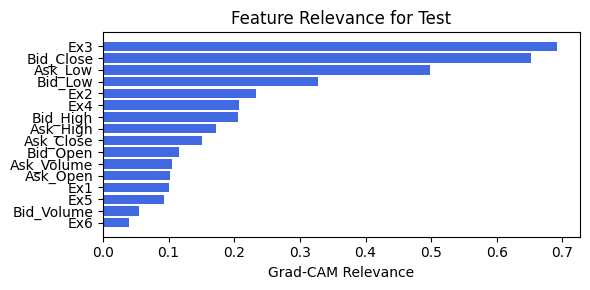

In [87]:
train_and_plot_relevance(Model3_1, kan_neurons=1, kan_grid=3, cnn_bottleneck_dim=3, lamb=0.0001, steps=30, filename=filename_1, opt_col_val=3)

### 1.2.6 width=[10, 1, 1], grid=3, lamb=0.0001 | cnn_bottleneck_dim=4

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


 train_acc_hybrid: 7.36e-01 | val_acc_hybrid: 7.04e-01 |: 100%|█████| 30/30 [00:09<00:00,  3.12it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.3810e-01 at 10 epoch
tensor(0.7193, device='cuda:0')
[[125  58]
 [ 45 139]]
M_KAN Relevance: 0.013042178936302662
CNN Relevance: 0.986957848072052
[('Bid_Close', 2.6534302), ('Ask_Close', 2.2711682), ('Ask_Open', 1.4846569), ('Bid_Open', 1.1150376), ('Ask_High', 0.9556776), ('Bid_High', 0.5767382), ('Ask_Volume', 0.22038312), ('Bid_Volume', 0.2145415), ('Bid_Low', 0.12270511), ('Ask_Low', 0.069571085)]


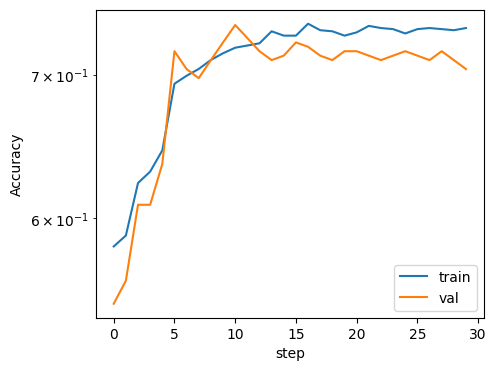

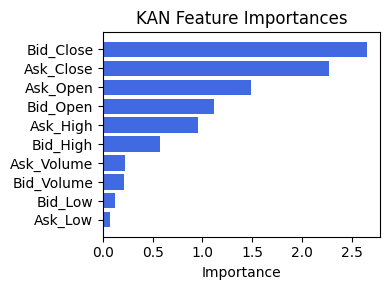

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Bid_Close', 0.8014148901691229), ('Ask_Low', 0.6163747676061999), ('Bid_Low', 0.407264600515528), ('Ex2', 0.4007246220327041), ('Bid_High', 0.23098439434974655), ('Ex3', 0.2050103599348991), ('Ask_High', 0.05671079089860013), ('Ask_Close', 0.040417275666845665), ('Bid_Open', 0.038147236232354616), ('Bid_Volume', 0.007364588903519515), ('Ask_Open', 0.004182346629116675), ('Ex1', 0.0036663079300606038), ('Ex6', 0.0027401717462163288), ('Ex5', 0.00020005463619972768), ('Ask_Volume', 0.0), ('Ex4', 0.0)]


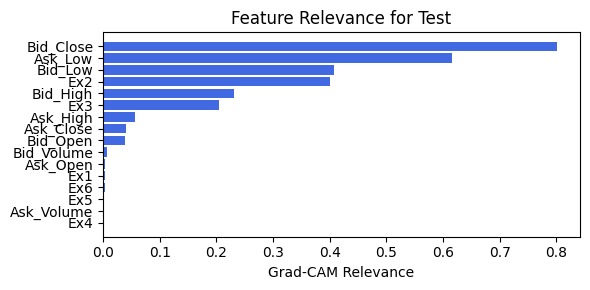

In [88]:
train_and_plot_relevance(Model3_1, kan_neurons=1, kan_grid=3, cnn_bottleneck_dim=4, lamb=0.0001, steps=30, filename=filename_1, opt_col_val=4)

### 1.2.7 width=[10, 1, 1], grid=3, lamb=0.0001 | cnn_bottleneck_dim=4

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


 train_acc_hybrid: 7.37e-01 | val_acc_hybrid: 7.11e-01 |: 100%|█████| 30/30 [00:10<00:00,  2.80it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.4490e-01 at 14 epoch
tensor(0.7112, device='cuda:0')
[[119  64]
 [ 42 142]]
M_KAN Relevance: 0.11099840700626373
CNN Relevance: 0.8890015482902527
[('Ask_Open', 0.43524998), ('Bid_Open', 0.38713744), ('Bid_Close', 0.37767857), ('Ask_High', 0.3244673), ('Ask_Close', 0.31946656), ('Bid_High', 0.25654244), ('Ask_Low', 0.16630636), ('Bid_Low', 0.13760051), ('Bid_Volume', 0.035906475), ('Ask_Volume', 0.018098466)]


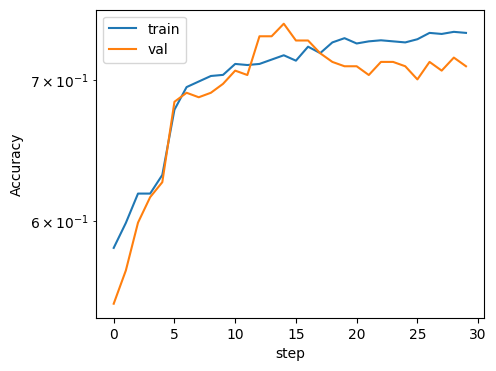

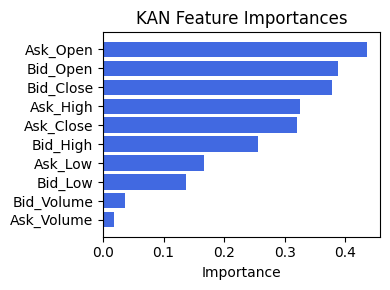

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex2', 0.7809648710310622), ('Ask_Low', 0.5490660242310013), ('Ex6', 0.42310742654251465), ('Ask_High', 0.40516335730331793), ('Ex1', 0.36395538681534395), ('Bid_Low', 0.28102080882285857), ('Bid_High', 0.2370300507174528), ('Bid_Close', 0.2075484379547412), ('Ask_Open', 0.19281110989706393), ('Ask_Volume', 0.1487836820690078), ('Ex5', 0.08938050287907653), ('Bid_Open', 0.060298376566951216), ('Bid_Volume', 0.003952383375796823), ('Ex3', 0.0011741248878069242), ('Ask_Close', 0.00017491881976700933), ('Ex4', 0.0)]


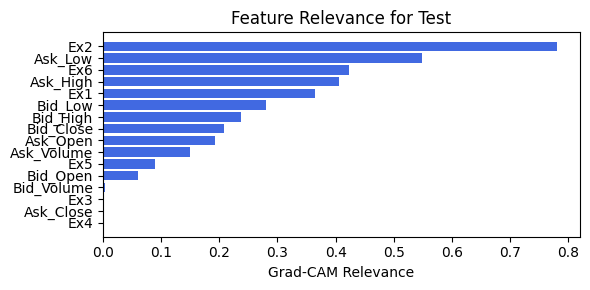

In [89]:
train_and_plot_relevance(Model3_1, kan_neurons=1, kan_grid=3, cnn_bottleneck_dim=4, lamb=0.0001, steps=30, filename=filename_1, opt_col_val=4)

## 1.3 width=[10, 4], grid=3, lamb=0.0001

### 1.3.0 width=[10, 4], grid=3, lamb=0.0001 | cnn_bottleneck_dim=1

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


 train_acc_hybrid: 7.64e-01 | val_acc_hybrid: 7.11e-01 |: 100%|█████| 30/30 [00:10<00:00,  2.80it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.1429e-01 at 27 epoch
tensor(0.7057, device='cuda:0')
[[134  49]
 [ 59 125]]
M_KAN Relevance: 0.9134263396263123
CNN Relevance: 0.08657363057136536
[('Bid_Close', 5.359465), ('Bid_High', 4.3039308), ('Ask_High', 3.6615458), ('Ask_Close', 2.3467202), ('Bid_Low', 1.4741163), ('Ask_Open', 1.2186642), ('Ask_Low', 0.7443991), ('Bid_Open', 0.52196187), ('Bid_Volume', 0.1705967), ('Ask_Volume', 0.13753307)]


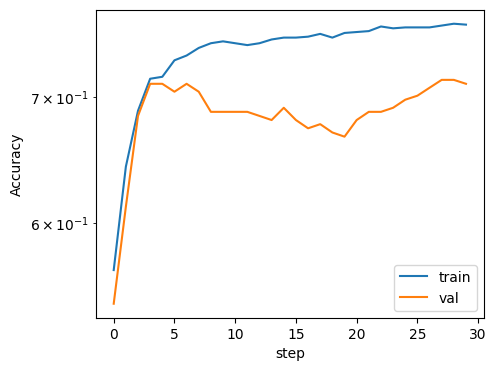

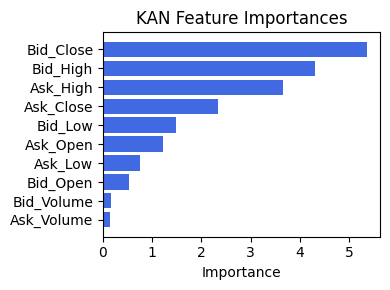

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Bid_Close', 0.4986978095298892), ('Bid_Low', 0.4717542737803602), ('Bid_High', 0.4133079879452812), ('Ask_Low', 0.35412627466692914), ('Bid_Open', 0.26408690912522154), ('Ex2', 0.22769868592109926), ('Ex1', 0.1956841994726609), ('Ex5', 0.18935965078728076), ('Ask_Volume', 0.17724678790474652), ('Ex4', 0.17389598387208943), ('Ask_High', 0.15542214736945126), ('Ex3', 0.12606519420075482), ('Ask_Close', 0.11610590428662232), ('Ask_Open', 0.09015490195259696), ('Bid_Volume', 0.07221235993333486), ('Ex6', 0.0651957380164834)]


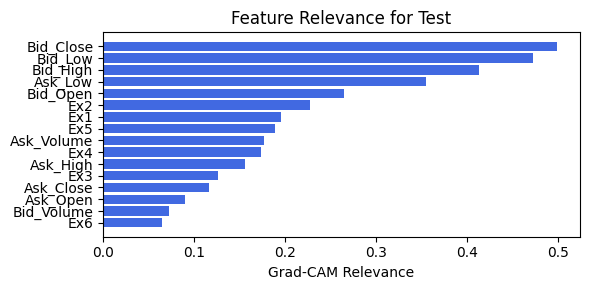

In [90]:
train_and_plot_relevance(Model3_1, kan_neurons=4, kan_grid=3, cnn_bottleneck_dim=1, lamb=0.0001, steps=30, filename=filename_1, opt_col_val=1)

### 1.3.1 width=[10, 4], grid=3, lamb=0.0001 | cnn_bottleneck_dim=1

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


 train_acc_hybrid: 7.51e-01 | val_acc_hybrid: 6.97e-01 |: 100%|█████| 30/30 [00:09<00:00,  3.25it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.2789e-01 at 3 epoch
tensor(0.7193, device='cuda:0')
[[130  53]
 [ 50 134]]
M_KAN Relevance: 0.9464452862739563
CNN Relevance: 0.0535547137260437
[('Bid_Close', 3.8617024), ('Ask_Close', 2.7410522), ('Ask_High', 1.8617108), ('Ask_Open', 1.642135), ('Bid_High', 1.603051), ('Bid_Open', 1.3700216), ('Bid_Low', 0.4659576), ('Ask_Low', 0.17386119), ('Bid_Volume', 0.14785516), ('Ask_Volume', 0.13466728)]


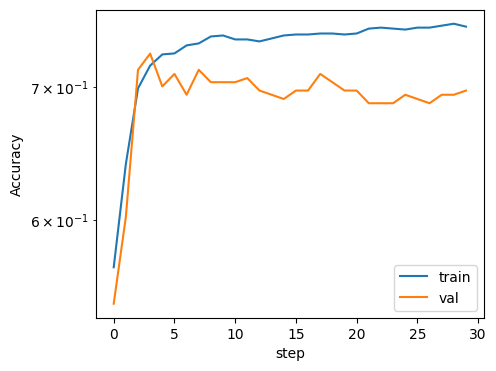

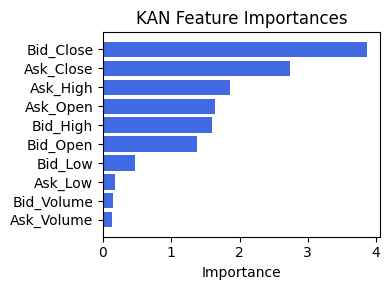

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex5', 0.5052993233424766), ('Ex4', 0.40832057814507133), ('Ex1', 0.3124614614962882), ('Ask_Volume', 0.2637992392849857), ('Ex6', 0.17763625438596636), ('Ex2', 0.1097008691293667), ('Ask_Open', 0.0610414758008684), ('Ask_High', 0.04799976287351297), ('Ask_Close', 0.027301480050727838), ('Ex3', 0.01444312378530053), ('Bid_Volume', 0.0010061590077116963), ('Ask_Low', 0.000362840551522634), ('Bid_Open', 0.0), ('Bid_High', 0.0), ('Bid_Low', 0.0), ('Bid_Close', 0.0)]


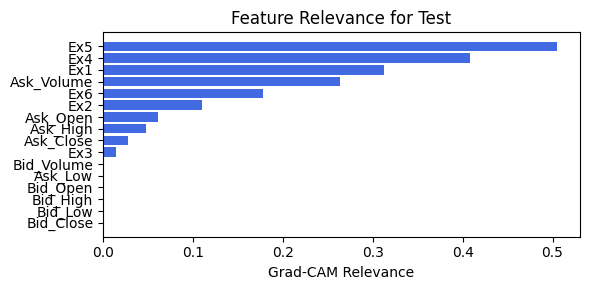

In [91]:
train_and_plot_relevance(Model3_1, kan_neurons=4, kan_grid=3, cnn_bottleneck_dim=1, lamb=0.0001, steps=30, filename=filename_1, opt_col_val=1)

### 1.3.2 width=[10, 4], grid=3, lamb=0.0001 | cnn_bottleneck_dim=2

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


 train_acc_hybrid: 7.50e-01 | val_acc_hybrid: 6.84e-01 |: 100%|█████| 30/30 [00:09<00:00,  3.32it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.2789e-01 at 2 epoch
tensor(0.7248, device='cuda:0')
[[128  55]
 [ 46 138]]
M_KAN Relevance: 0.7217090129852295
CNN Relevance: 0.2782910168170929
[('Bid_Close', 1.9892555), ('Ask_Close', 1.5751157), ('Ask_Open', 1.292631), ('Bid_Open', 1.1616317), ('Bid_High', 0.59029543), ('Ask_High', 0.5447164), ('Bid_Low', 0.16782004), ('Ask_Low', 0.11671418), ('Bid_Volume', 0.098636866), ('Ask_Volume', 0.07111603)]


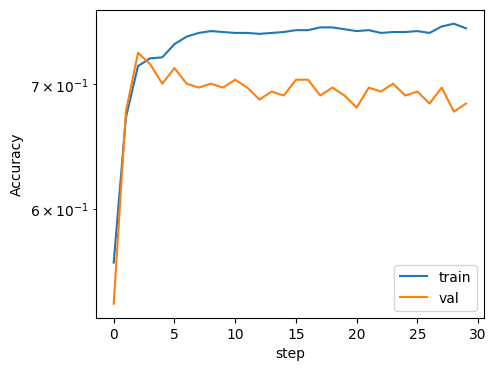

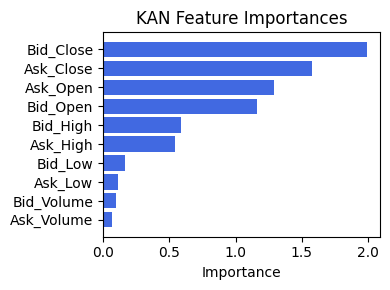

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex2', 0.5224502164596433), ('Ex6', 0.44880698718719325), ('Ex1', 0.3212999091141068), ('Ask_Volume', 0.270092988912681), ('Ask_Low', 0.24238399314384512), ('Ex5', 0.17260364359828367), ('Ask_Close', 0.12489350269008073), ('Ask_Open', 0.06032075478275984), ('Ask_High', 0.047369852170414145), ('Ex4', 0.04409502637007957), ('Bid_Close', 0.009895699139308864), ('Bid_Volume', 0.005707375259247764), ('Bid_Low', 7.28027075427592e-05), ('Bid_High', 7.079776163322075e-05), ('Ex3', 2.1633458620683373e-05), ('Bid_Open', 0.0)]


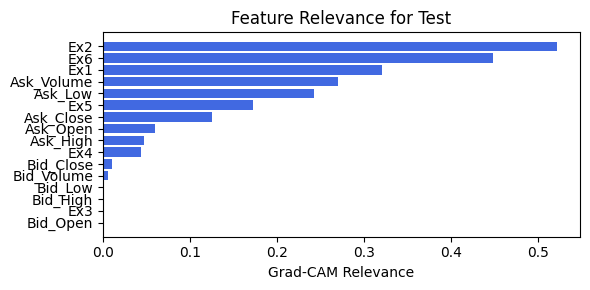

In [92]:
train_and_plot_relevance(Model3_1, kan_neurons=4, kan_grid=3, cnn_bottleneck_dim=2, lamb=0.0001, steps=30, filename=filename_1, opt_col_val=2)

### 1.3.3 width=[10, 4], grid=3, lamb=0.0001 | cnn_bottleneck_dim=2

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


 train_acc_hybrid: 7.43e-01 | val_acc_hybrid: 7.21e-01 |: 100%|█████| 30/30 [00:11<00:00,  2.68it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.2109e-01 at 11 epoch
tensor(0.7139, device='cuda:0')
[[139  44]
 [ 61 123]]
M_KAN Relevance: 0.6731743216514587
CNN Relevance: 0.32682570815086365
[('Bid_Close', 1.7680415), ('Ask_Close', 1.3574691), ('Ask_High', 1.2427565), ('Bid_High', 1.0758594), ('Ask_Open', 0.5470422), ('Bid_Open', 0.35854077), ('Bid_Low', 0.19771077), ('Ask_Low', 0.14805911), ('Ask_Volume', 0.072492406), ('Bid_Volume', 0.045983635)]


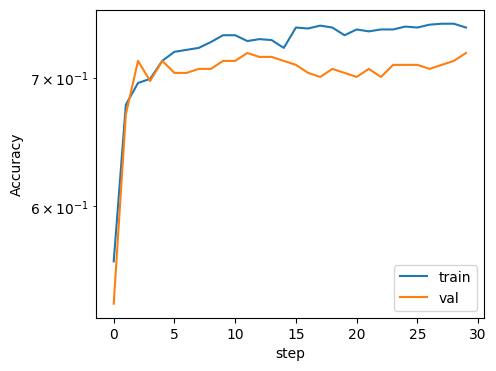

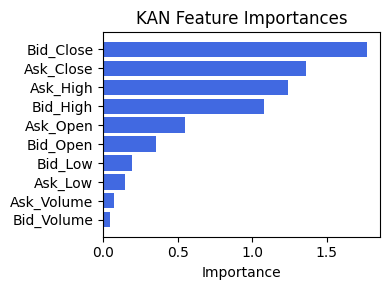

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex1', 0.8275183125802542), ('Ask_Volume', 0.7754534094794895), ('Ask_High', 0.6859714388441325), ('Ask_Open', 0.651158532995619), ('Ex5', 0.528920057521529), ('Ex2', 0.4842547998441338), ('Ex6', 0.4769674264280283), ('Ex4', 0.37900792431766395), ('Ask_Close', 0.2980420085162493), ('Bid_High', 0.2857722466372522), ('Ask_Low', 0.2703172503001691), ('Bid_Volume', 0.2663747530826431), ('Bid_Low', 0.24276754871085007), ('Bid_Open', 0.1878741842768173), ('Bid_Close', 0.04664610112335839), ('Ex3', 0.013568038151952202)]


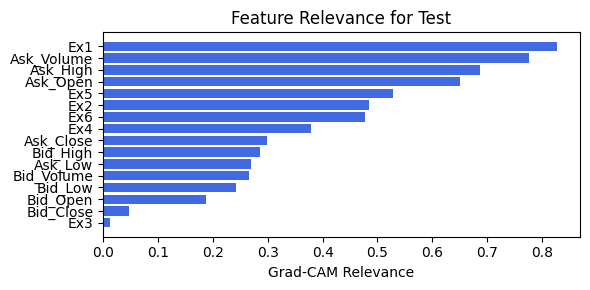

In [93]:
train_and_plot_relevance(Model3_1, kan_neurons=4, kan_grid=3, cnn_bottleneck_dim=2, lamb=0.0001, steps=30, filename=filename_1, opt_col_val=2)

### 1.3.4 width=[10, 4], grid=3, lamb=0.0001 | cnn_bottleneck_dim=4

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


 train_acc_hybrid: 7.42e-01 | val_acc_hybrid: 7.18e-01 |: 100%|█████| 30/30 [00:10<00:00,  2.90it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.3469e-01 at 11 epoch
tensor(0.7084, device='cuda:0')
[[130  53]
 [ 54 130]]
M_KAN Relevance: 0.2309187948703766
CNN Relevance: 0.7690812349319458
[('Bid_Close', 0.7152067), ('Ask_Close', 0.56046253), ('Ask_Open', 0.36732766), ('Bid_Open', 0.21988292), ('Bid_Volume', 0.17394146), ('Ask_Low', 0.16979833), ('Ask_High', 0.16147761), ('Bid_Low', 0.1579441), ('Bid_High', 0.1570226), ('Ask_Volume', 0.13862841)]


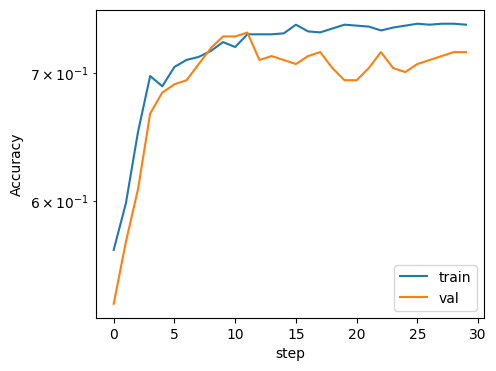

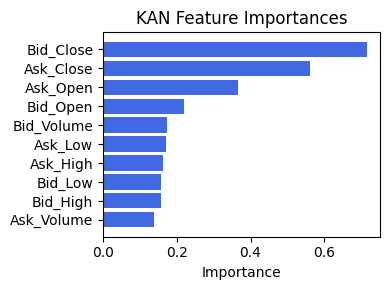

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex2', 0.8230459149267109), ('Ask_Low', 0.5318328901942647), ('Ex6', 0.5269698402374902), ('Ex1', 0.1544601233011208), ('Bid_Close', 0.1499440628789081), ('Ex5', 0.14287776550739922), ('Ask_High', 0.09722353625499068), ('Bid_Low', 0.02961708364861685), ('Ask_Open', 0.027978780290031962), ('Ask_Volume', 0.024855839216156052), ('Ask_Close', 0.023270819560759156), ('Bid_Volume', 0.01938294514647161), ('Bid_Open', 0.0188523418283057), ('Bid_High', 0.015820648108993002), ('Ex4', 0.002673038761872146), ('Ex3', 0.0)]


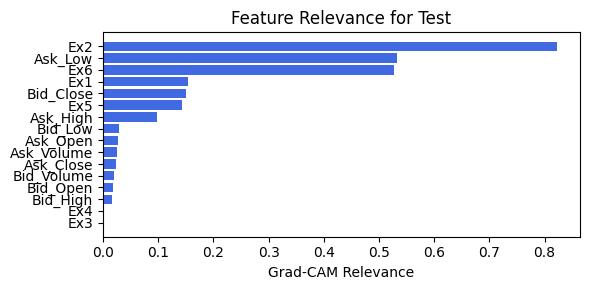

In [94]:
train_and_plot_relevance(Model3_1, kan_neurons=4, kan_grid=3, cnn_bottleneck_dim=4, lamb=0.0001, steps=30, filename=filename_1, opt_col_val=4)

### 1.3.5 width=[10, 4], grid=3, lamb=0.0001 | cnn_bottleneck_dim=4

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


 train_acc_hybrid: 7.43e-01 | val_acc_hybrid: 7.04e-01 |: 100%|█████| 30/30 [00:09<00:00,  3.07it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.2109e-01 at 9 epoch
tensor(0.7248, device='cuda:0')
[[129  54]
 [ 47 137]]
M_KAN Relevance: 0.5413879156112671
CNN Relevance: 0.4586120545864105
[('Bid_Close', 0.38257694), ('Ask_Close', 0.30828848), ('Ask_Open', 0.18850555), ('Bid_Low', 0.14900106), ('Bid_Open', 0.12647764), ('Ask_Low', 0.08978103), ('Ask_High', 0.0873468), ('Bid_High', 0.08117664), ('Bid_Volume', 0.071444735), ('Ask_Volume', 0.05985782)]


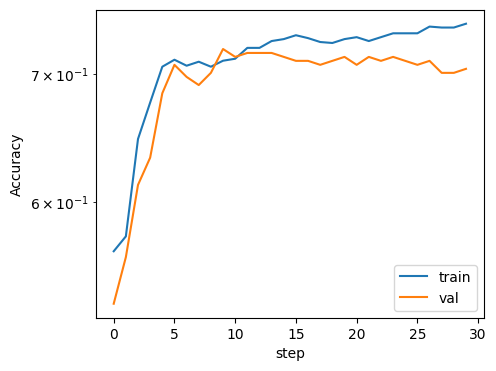

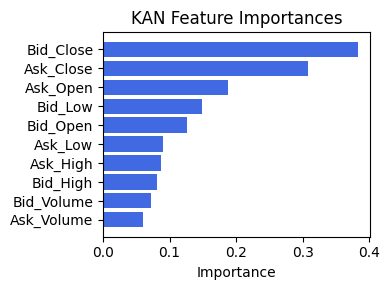

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex1', 0.6271785230170276), ('Ask_Volume', 0.6072425088700547), ('Ask_High', 0.5276646282655829), ('Ask_Open', 0.5047671228383315), ('Ex2', 0.4730894581214284), ('Ex5', 0.400148498711534), ('Ex6', 0.376177874832777), ('Ask_Close', 0.3229961963161085), ('Ex4', 0.2715971652083403), ('Ask_Low', 0.2617003248761185), ('Bid_Volume', 0.2484667312670423), ('Bid_High', 0.18511529858688805), ('Bid_Low', 0.1633792474868451), ('Bid_Open', 0.15999084249473805), ('Bid_Close', 0.05680964168111035), ('Ex3', 0.04751777833548745)]


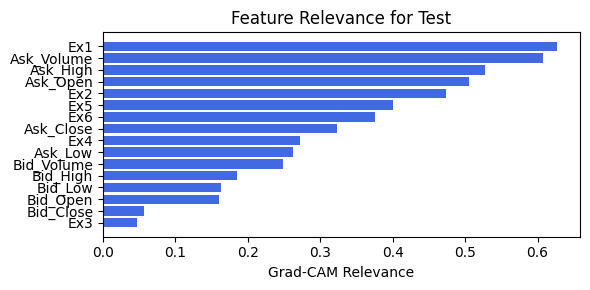

In [95]:
train_and_plot_relevance(Model3_1, kan_neurons=4, kan_grid=3, cnn_bottleneck_dim=4, lamb=0.0001, steps=30, filename=filename_1, opt_col_val=4)

### 1.3.6 width=[10, 4], grid=3, lamb=0.0001 | cnn_bottleneck_dim=8

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


 train_acc_hybrid: 7.46e-01 | val_acc_hybrid: 7.18e-01 |: 100%|█████| 30/30 [00:10<00:00,  2.85it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.2789e-01 at 5 epoch
tensor(0.7357, device='cuda:0')
[[125  58]
 [ 39 145]]
M_KAN Relevance: 0.2949645221233368
CNN Relevance: 0.7050355076789856
[('Bid_Close', 0.37460288), ('Bid_Open', 0.3532513), ('Ask_Open', 0.34558532), ('Ask_High', 0.29185104), ('Ask_Close', 0.28258404), ('Bid_High', 0.22859704), ('Bid_Low', 0.16205484), ('Ask_Volume', 0.11353044), ('Bid_Volume', 0.10475524), ('Ask_Low', 0.101590395)]


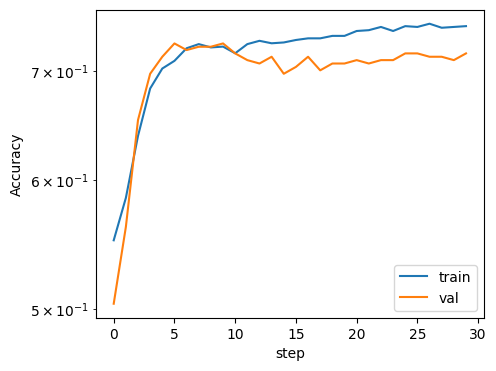

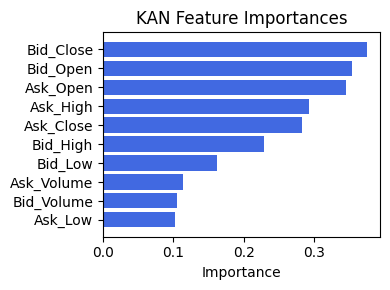

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex2', 0.875330214279549), ('Ask_Low', 0.6079248095931085), ('Ex6', 0.5394309852526038), ('Bid_Close', 0.20333528123816288), ('Ex1', 0.1784549500255234), ('Ask_High', 0.13316245325802945), ('Ex5', 0.09719193834374971), ('Bid_Low', 0.06995191175878564), ('Bid_High', 0.019092477463777062), ('Ask_Open', 0.0005262846617080139), ('Bid_Open', 0.0), ('Bid_Volume', 0.0), ('Ask_Close', 0.0), ('Ask_Volume', 0.0), ('Ex3', 0.0), ('Ex4', 0.0)]


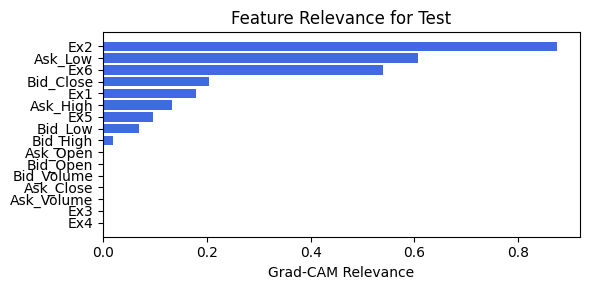

In [96]:
train_and_plot_relevance(Model3_1, kan_neurons=4, kan_grid=3, cnn_bottleneck_dim=8, lamb=0.0001, steps=30, filename=filename_1, opt_col_val=8)

### 1.3.7 width=[10, 4], grid=3, lamb=0.0001 | cnn_bottleneck_dim=8

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


 train_acc_hybrid: 7.37e-01 | val_acc_hybrid: 7.04e-01 |: 100%|█████| 30/30 [00:12<00:00,  2.44it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.3469e-01 at 11 epoch
tensor(0.7384, device='cuda:0')
[[134  49]
 [ 47 137]]
M_KAN Relevance: 0.2959641218185425
CNN Relevance: 0.7040358781814575
[('Bid_Close', 0.34523857), ('Ask_Close', 0.28325903), ('Ask_High', 0.24124579), ('Ask_Open', 0.20755407), ('Bid_Volume', 0.19709115), ('Bid_Open', 0.19043258), ('Ask_Volume', 0.18546678), ('Bid_Low', 0.16731423), ('Bid_High', 0.15913622), ('Ask_Low', 0.12740812)]


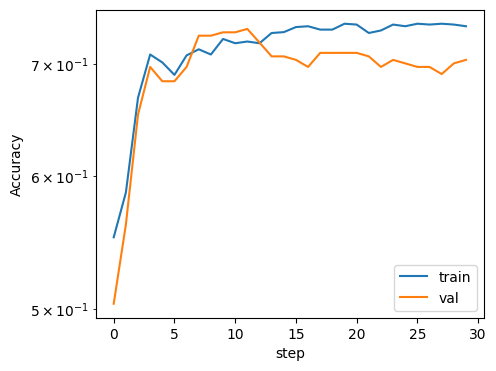

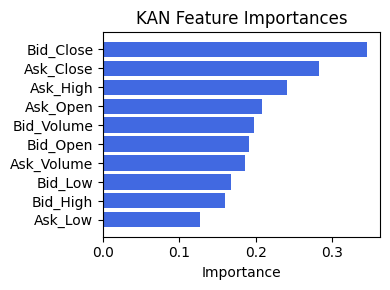

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex6', 0.7270867275607034), ('Ex2', 0.2863286809554217), ('Ex5', 0.1723776207145618), ('Ask_Low', 0.04180243672747216), ('Ex4', 0.04072665841100111), ('Ex1', 0.03387322880287099), ('Bid_Open', 0.004341269522265858), ('Ask_High', 7.483505006950622e-05), ('Bid_Close', 2.893227011686044e-05), ('Bid_High', 0.0), ('Bid_Low', 0.0), ('Bid_Volume', 0.0), ('Ask_Open', 0.0), ('Ask_Close', 0.0), ('Ask_Volume', 0.0), ('Ex3', 0.0)]


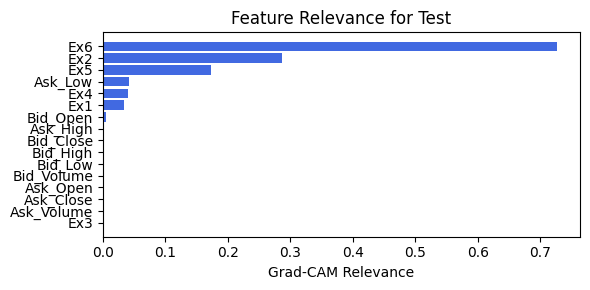

In [97]:
train_and_plot_relevance(Model3_1, kan_neurons=4, kan_grid=3, cnn_bottleneck_dim=8, lamb=0.0001, steps=30, filename=filename_1, opt_col_val=8)

### 1.3.8 width=[10, 4], grid=3, lamb=0.0001 | cnn_bottleneck_dim=12

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


 train_acc_hybrid: 7.49e-01 | val_acc_hybrid: 6.97e-01 |: 100%|█████| 30/30 [00:11<00:00,  2.59it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.1088e-01 at 12 epoch
tensor(0.7139, device='cuda:0')
[[126  57]
 [ 48 136]]
M_KAN Relevance: 0.22649633884429932
CNN Relevance: 0.7735036611557007
[('Bid_Close', 0.8184692), ('Ask_Close', 0.7155068), ('Ask_Open', 0.5809043), ('Bid_Open', 0.5456934), ('Ask_High', 0.35949606), ('Bid_High', 0.35074198), ('Ask_Volume', 0.13189484), ('Bid_Volume', 0.12664455), ('Bid_Low', 0.12627602), ('Ask_Low', 0.084037706)]


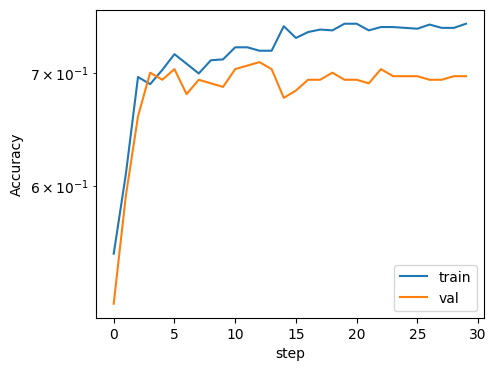

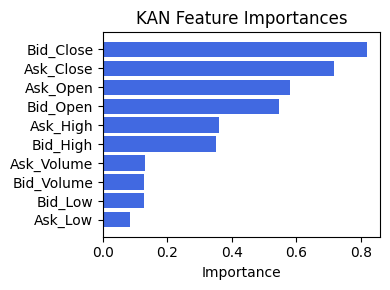

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Bid_Low', 0.5962460970490846), ('Ask_High', 0.5903545605064413), ('Bid_High', 0.5789384162637129), ('Ex2', 0.4699031943683728), ('Ex1', 0.4610519310515323), ('Ask_Low', 0.44948422084549794), ('Ask_Open', 0.40711353359901287), ('Ask_Volume', 0.3569685097889117), ('Bid_Close', 0.3198267737560847), ('Bid_Open', 0.2535638993235472), ('Bid_Volume', 0.12890433372513516), ('Ask_Close', 0.11567601827477621), ('Ex6', 0.014322457765609696), ('Ex5', 0.007233499399845029), ('Ex3', 3.186919363545462e-05), ('Ex4', 0.0)]


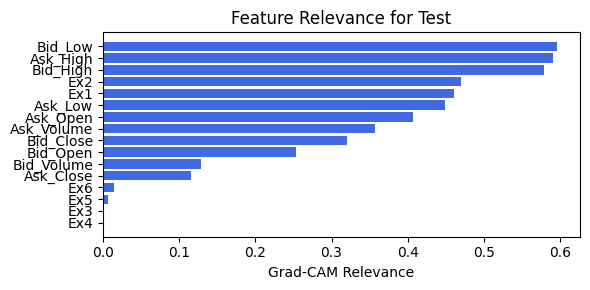

In [98]:
train_and_plot_relevance(Model3_1, kan_neurons=4, kan_grid=3, cnn_bottleneck_dim=12, lamb=0.0001, steps=30, filename=filename_1, opt_col_val=12)

### 1.3.9 width=[10, 4], grid=3, lamb=0.0001 | cnn_bottleneck_dim=12

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


 train_acc_hybrid: 7.43e-01 | val_acc_hybrid: 6.97e-01 |: 100%|█████| 30/30 [00:09<00:00,  3.26it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.2109e-01 at 14 epoch
tensor(0.7193, device='cuda:0')
[[143  40]
 [ 63 121]]
M_KAN Relevance: 0.6546059250831604
CNN Relevance: 0.3453941345214844
[('Bid_Close', 0.5767542), ('Ask_Close', 0.44122815), ('Bid_High', 0.42647576), ('Ask_High', 0.4063046), ('Ask_Open', 0.2475209), ('Bid_Open', 0.17136568), ('Bid_Low', 0.1316678), ('Ask_Low', 0.12766458), ('Bid_Volume', 0.10749133), ('Ask_Volume', 0.1029329)]


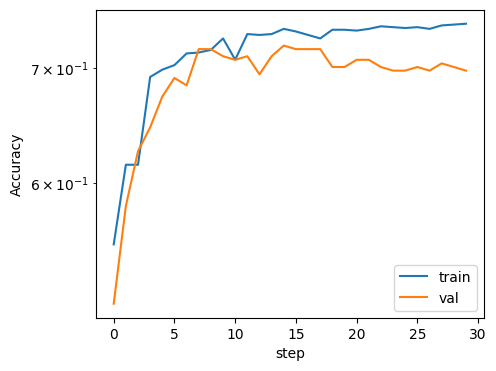

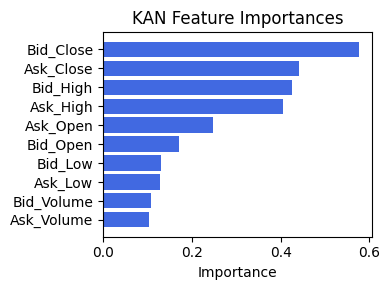

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex6', 0.7285366383170562), ('Ex2', 0.1570600051580667), ('Ex5', 0.08001501963135078), ('Ex1', 0.026264051333450767), ('Ask_Low', 0.0177669031951546), ('Bid_Open', 0.008856654258531186), ('Ask_High', 0.008137879015786487), ('Ask_Volume', 0.007365319827109656), ('Ask_Open', 0.007275634406550663), ('Bid_High', 0.005224202057265496), ('Bid_Low', 0.004640853593293425), ('Ask_Close', 0.003162780771544584), ('Bid_Close', 0.003117808280385807), ('Bid_Volume', 0.0030440388181391465), ('Ex4', 0.00015641698659440802), ('Ex3', 0.0)]


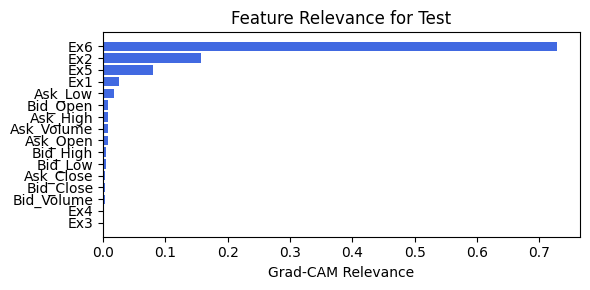

In [99]:
train_and_plot_relevance(Model3_1, kan_neurons=4, kan_grid=3, cnn_bottleneck_dim=12, lamb=0.0001, steps=30, filename=filename_1, opt_col_val=12)

### 1.3.10 width=[10, 4], grid=3, lamb=0.0001 | cnn_bottleneck_dim=16

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


 train_acc_hybrid: 7.37e-01 | val_acc_hybrid: 7.21e-01 |: 100%|█████| 30/30 [00:09<00:00,  3.25it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.4150e-01 at 9 epoch
tensor(0.7221, device='cuda:0')
[[126  57]
 [ 45 139]]
M_KAN Relevance: 0.2014748603105545
CNN Relevance: 0.7985251545906067
[('Bid_Close', 0.3699153), ('Ask_Open', 0.32194674), ('Ask_Close', 0.2651061), ('Bid_High', 0.19365636), ('Bid_Low', 0.18695518), ('Ask_Low', 0.18238783), ('Bid_Open', 0.17844704), ('Bid_Volume', 0.16226879), ('Ask_Volume', 0.11710797), ('Ask_High', 0.11561856)]


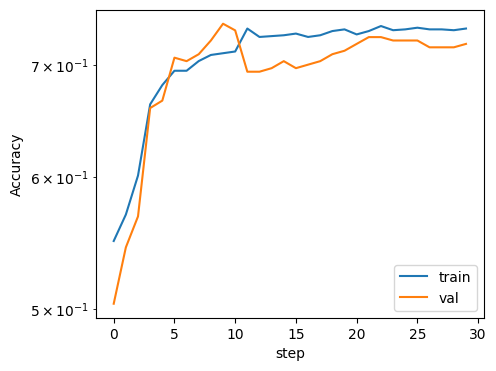

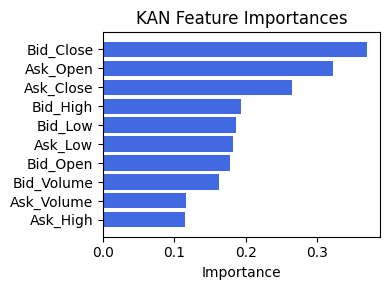

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Bid_Close', 0.2489388493607861), ('Bid_Low', 0.1542116562126595), ('Ask_Low', 0.04176792316963485), ('Ex1', 0.03438920978385681), ('Ex5', 0.03398766352386501), ('Ex4', 0.0306265588230593), ('Ask_Volume', 0.029259249293917856), ('Ex2', 0.02704768828864968), ('Ask_High', 0.022326141250718193), ('Ex6', 0.019465623656922205), ('Ask_Open', 0.017993962407436944), ('Ask_Close', 0.012166248522800386), ('Bid_Volume', 0.008360032124155549), ('Ex3', 0.008034711937123164), ('Bid_Open', 0.0030114987467946), ('Bid_High', 0.00232409812733328)]


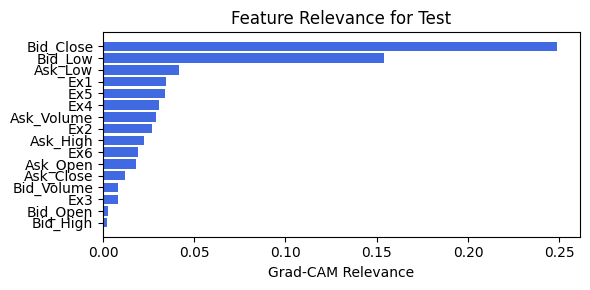

In [100]:
train_and_plot_relevance(Model3_1, kan_neurons=4, kan_grid=3, cnn_bottleneck_dim=16, lamb=0.0001, steps=30, filename=filename_1, opt_col_val=16)

### 1.3.11 width=[10, 4], grid=3, lamb=0.0001 | cnn_bottleneck_dim=16

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


 train_acc_hybrid: 7.36e-01 | val_acc_hybrid: 7.07e-01 |: 100%|█████| 30/30 [00:11<00:00,  2.51it/s]


saving model version 0.1
✅ Best validation Accuracy: 7.2789e-01 at 8 epoch
tensor(0.7003, device='cuda:0')
[[128  55]
 [ 55 129]]
M_KAN Relevance: 0.12283352017402649
CNN Relevance: 0.8771665096282959
[('Bid_Close', 0.51738626), ('Ask_Open', 0.33285016), ('Ask_Close', 0.30778602), ('Bid_Low', 0.21646753), ('Bid_High', 0.2122843), ('Ask_Low', 0.17128904), ('Bid_Volume', 0.14801368), ('Bid_Open', 0.13741927), ('Ask_High', 0.110419005), ('Ask_Volume', 0.079504415)]


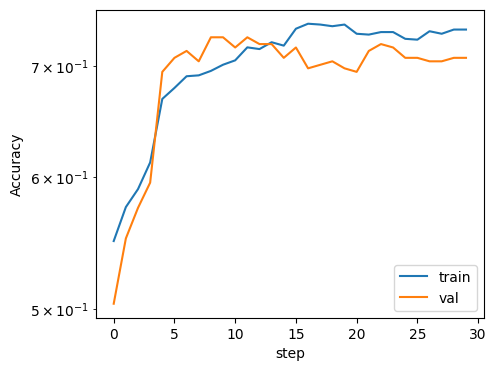

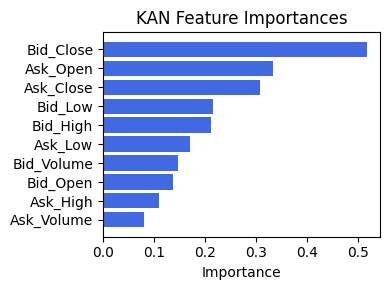

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex2', 0.5652129167858359), ('Ask_Low', 0.5186363832654917), ('Bid_Close', 0.1489407164992337), ('Ask_High', 0.14612930339611357), ('Ex1', 0.14461096730470221), ('Ex5', 0.1249117388863279), ('Ask_Close', 0.10627828887663782), ('Ex4', 0.1051721501891179), ('Bid_Volume', 0.09497037446710005), ('Ask_Volume', 0.09389009517274939), ('Ex6', 0.09067517744555843), ('Ask_Open', 0.07393708166587662), ('Bid_Open', 0.07165826701277446), ('Bid_Low', 0.06594678044524703), ('Bid_High', 0.02946309022228259), ('Ex3', 0.022910929520873605)]


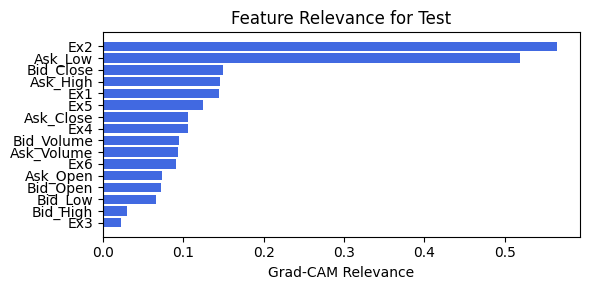

In [101]:
train_and_plot_relevance(Model3_1, kan_neurons=4, kan_grid=3, cnn_bottleneck_dim=16, lamb=0.0001, steps=30, filename=filename_1, opt_col_val=16)

# Option 2: Multiply CNN output by factor

In [102]:
create_csv_with_header(filename_2, columns_opt2)

## 2.0. width=[10, 3, 1], grid=3, lamb=1e-06

### 2.0.1. width=[10, 3, 1], grid=3, lamb=1e-06 | alpha=0.75

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


 train_acc_hybrid: 7.47e-01 | val_acc_hybrid: 7.14e-01 |: 100%|█████| 30/30 [00:23<00:00,  1.27it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.1769e-01 at 26 epoch
tensor(0.6839, device='cuda:0')
[[114  69]
 [ 47 137]]
M_KAN Relevance: 0.10869533568620682
CNN Relevance: 0.8913046717643738
[('Ask_Close', 0.53807294), ('Ask_High', 0.47909743), ('Bid_Close', 0.4580124), ('Bid_Open', 0.33073828), ('Ask_Low', 0.30830547), ('Bid_High', 0.27240178), ('Bid_Volume', 0.19874108), ('Ask_Open', 0.17335546), ('Bid_Low', 0.15601912), ('Ask_Volume', 0.09725247)]


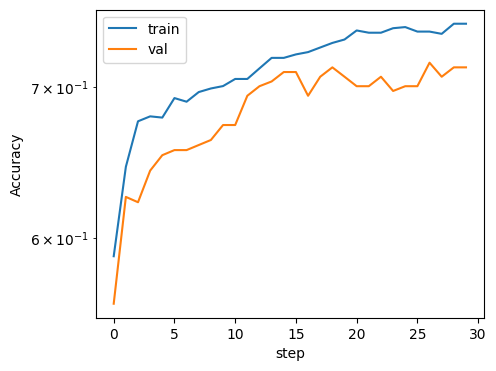

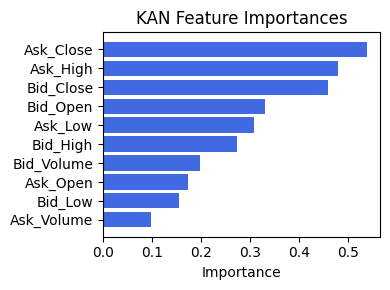

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex6', 0.5186108839355551), ('Ex1', 0.4487653053584521), ('Ex2', 0.4321311370213326), ('Ask_High', 0.41776034965056785), ('Ask_Volume', 0.39248381810591426), ('Ask_Open', 0.3554753753133321), ('Ex5', 0.2966404320227746), ('Ask_Low', 0.2893320170382789), ('Ex4', 0.2595462344183361), ('Bid_High', 0.24644301617090927), ('Ex3', 0.23162535616757438), ('Bid_Low', 0.22570256917446863), ('Bid_Open', 0.17239886758422698), ('Bid_Volume', 0.1697954298935993), ('Ask_Close', 0.16869328611902132), ('Bid_Close', 0.12378860059941608)]


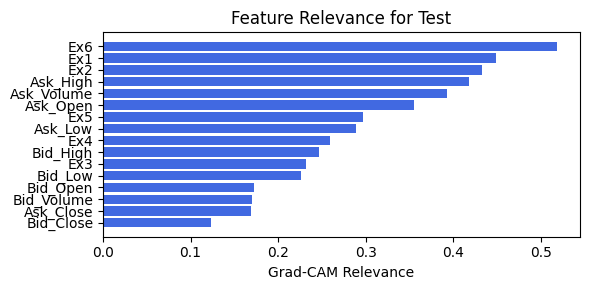

In [103]:
train_and_plot_relevance(Model3_2, kan_neurons=3, kan_grid=3, cnn_bottleneck_dim=1, lamb=1e-06, steps=30, alpha=.75, filename=filename_2, opt_col_val=0.75)

### 2.0.2. width=[10, 3, 1], grid=3, lamb=1e-06 | alpha=0.75

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


 train_acc_hybrid: 7.40e-01 | val_acc_hybrid: 7.04e-01 |: 100%|█████| 30/30 [00:23<00:00,  1.28it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.2109e-01 at 18 epoch
tensor(0.6975, device='cuda:0')
[[113  70]
 [ 41 143]]
M_KAN Relevance: 0.08478883653879166
CNN Relevance: 0.9152111411094666
[('Ask_High', 0.49022794), ('Ask_Close', 0.35591906), ('Bid_Open', 0.27453157), ('Bid_High', 0.26082724), ('Bid_Low', 0.224999), ('Bid_Close', 0.22039793), ('Ask_Open', 0.21581237), ('Bid_Volume', 0.19118124), ('Ask_Low', 0.16501527), ('Ask_Volume', 0.15499273)]


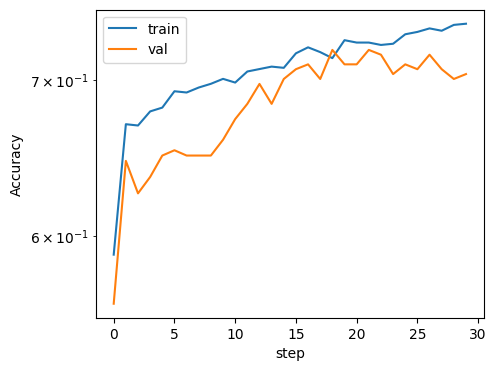

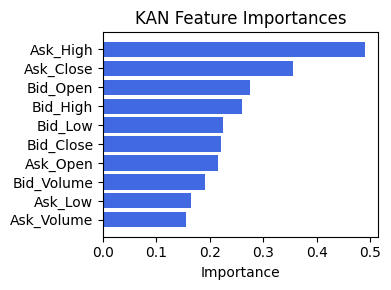

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex3', 0.5698433015597045), ('Ex4', 0.47794583913545335), ('Ex5', 0.4466741923464853), ('Ex6', 0.4271991462916217), ('Ask_Close', 0.20221255937329816), ('Bid_Volume', 0.13639613775008583), ('Ex2', 0.1047510235336906), ('Ask_Volume', 0.07418930646011794), ('Ex1', 0.0563422358531076), ('Bid_Open', 0.05298212258277172), ('Bid_High', 0.037479452200012524), ('Ask_Open', 0.014655041209804605), ('Ask_High', 0.011847803648941889), ('Ask_Low', 0.009680953740404934), ('Bid_Low', 0.005168354139366373), ('Bid_Close', 0.00405373629096931)]


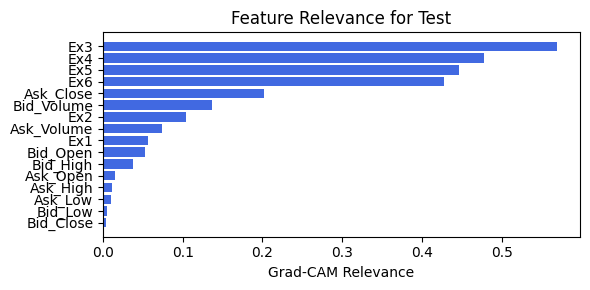

In [104]:
train_and_plot_relevance(Model3_2, kan_neurons=3, kan_grid=3, cnn_bottleneck_dim=1, lamb=1e-06, steps=30, alpha=.75, filename=filename_2, opt_col_val=0.75)

### 2.0.2. width=[10, 3, 1], grid=3, lamb=1e-06 | alpha=0.5

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


 train_acc_hybrid: 7.36e-01 | val_acc_hybrid: 7.07e-01 |: 100%|█████| 30/30 [00:22<00:00,  1.32it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.1429e-01 at 20 epoch
tensor(0.6812, device='cuda:0')
[[110  73]
 [ 44 140]]
M_KAN Relevance: 0.12861968576908112
CNN Relevance: 0.8713803291320801
[('Ask_High', 0.49509618), ('Ask_Close', 0.4694118), ('Bid_Close', 0.38798547), ('Ask_Low', 0.33412084), ('Bid_Open', 0.2962157), ('Bid_High', 0.282927), ('Bid_Volume', 0.2072271), ('Bid_Low', 0.17414002), ('Ask_Volume', 0.15320855), ('Ask_Open', 0.14799714)]


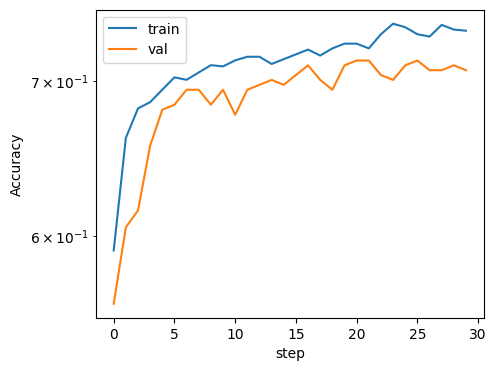

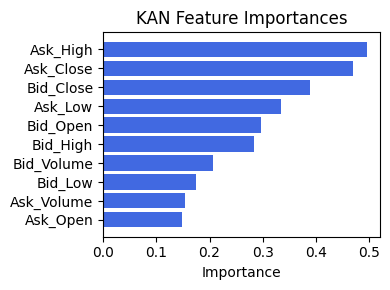

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex1', 0.6597606289208098), ('Ask_Volume', 0.541201198539552), ('Ex2', 0.4726998646431463), ('Ex5', 0.46523831498476725), ('Ask_High', 0.44504923444515354), ('Ask_Open', 0.40460790604434155), ('Ex6', 0.38085712641680597), ('Ex4', 0.3761769819101293), ('Ask_Low', 0.18794622367796074), ('Ask_Close', 0.12896092229697864), ('Bid_Volume', 0.12534552193386353), ('Bid_Open', 0.11006911034119754), ('Bid_High', 0.10164841925293938), ('Bid_Low', 0.07603898635311737), ('Ex3', 0.06620223057982562), ('Bid_Close', 0.03684674797367751)]


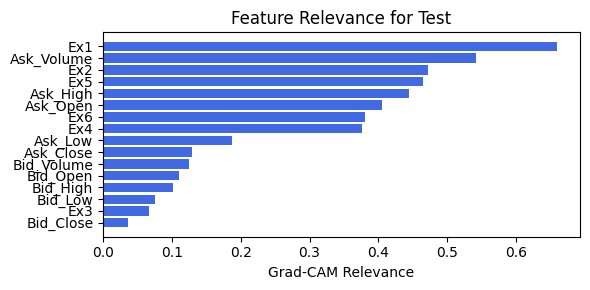

In [105]:
train_and_plot_relevance(Model3_2, kan_neurons=3, kan_grid=3, cnn_bottleneck_dim=-1, lamb=1e-06, steps=30, alpha=.5, filename=filename_2, opt_col_val=0.5)

### 2.0.3. width=[10, 3, 1], grid=3, lamb=1e-06 | alpha=0.5

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


 train_acc_hybrid: 7.35e-01 | val_acc_hybrid: 7.07e-01 |: 100%|█████| 30/30 [00:23<00:00,  1.29it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.1429e-01 at 18 epoch
tensor(0.7057, device='cuda:0')
[[111  72]
 [ 36 148]]
M_KAN Relevance: 0.13603393733501434
CNN Relevance: 0.8639659881591797
[('Bid_Open', 0.4220813), ('Ask_High', 0.37914687), ('Bid_Low', 0.3524872), ('Bid_High', 0.34431204), ('Ask_Close', 0.3294474), ('Bid_Close', 0.25553846), ('Bid_Volume', 0.25268742), ('Ask_Open', 0.22984761), ('Ask_Low', 0.2239314), ('Ask_Volume', 0.112357944)]


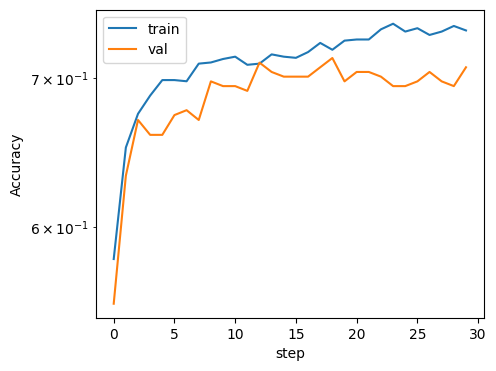

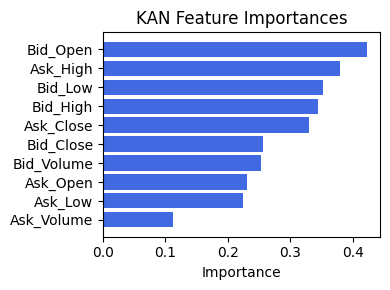

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex1', 0.6666907137843504), ('Ex2', 0.5498575627072956), ('Ask_Volume', 0.5180210056194493), ('Ex5', 0.5075423637917645), ('Ask_High', 0.4446373244478527), ('Ex6', 0.43859704736143107), ('Ex4', 0.40024211864705306), ('Ask_Open', 0.37602813545949454), ('Ask_Low', 0.25208644274551145), ('Bid_High', 0.09915858462493492), ('Bid_Low', 0.08797523613805992), ('Ask_Close', 0.08060273625545346), ('Bid_Open', 0.07807830772908247), ('Bid_Volume', 0.07614286119062504), ('Bid_Close', 0.05525101208678708), ('Ex3', 0.053326220172793634)]


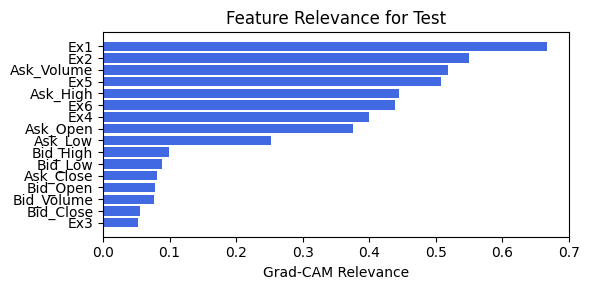

In [106]:
train_and_plot_relevance(Model3_2, kan_neurons=3, kan_grid=3, cnn_bottleneck_dim=-1, lamb=1e-06, steps=30, alpha=.5, filename=filename_2, opt_col_val=0.5)

### 2.0.4. width=[10, 3, 1], grid=3, lamb=1e-06 | alpha=0.25

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


 train_acc_hybrid: 7.60e-01 | val_acc_hybrid: 7.07e-01 |: 100%|█████| 30/30 [00:22<00:00,  1.34it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.2109e-01 at 11 epoch
tensor(0.6839, device='cuda:0')
[[114  69]
 [ 47 137]]
M_KAN Relevance: 0.07638021558523178
CNN Relevance: 0.9236197471618652
[('Bid_Low', 0.6562606), ('Ask_High', 0.525855), ('Ask_Low', 0.4720944), ('Bid_High', 0.4093172), ('Bid_Volume', 0.4005313), ('Bid_Open', 0.37741005), ('Bid_Close', 0.3607204), ('Ask_Open', 0.33756977), ('Ask_Close', 0.24603872), ('Ask_Volume', 0.15916616)]


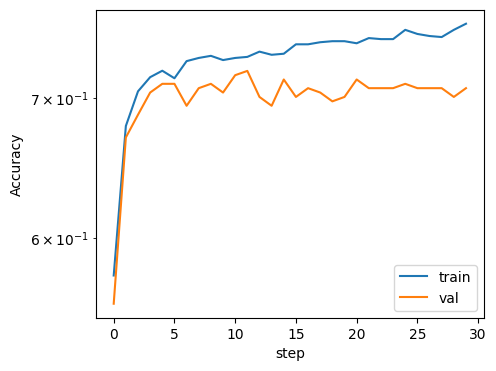

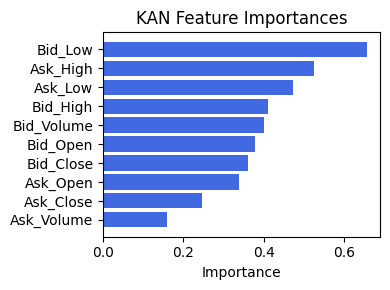

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex1', 0.30897157633174666), ('Ex2', 0.24871897070772683), ('Ex5', 0.2451023661635552), ('Ex6', 0.2133223059833334), ('Ask_High', 0.1876069184345744), ('Ask_Volume', 0.14755169767370938), ('Ask_Low', 0.14166429098023037), ('Ask_Open', 0.12403083365889234), ('Ex4', 0.1099237022129692), ('Bid_High', 0.0648081101467154), ('Bid_Low', 0.06460027321167569), ('Ask_Close', 0.06349890831499792), ('Bid_Open', 0.06147100051677194), ('Bid_Volume', 0.05942352248708799), ('Bid_Close', 0.04957153142492696), ('Ex3', 0.03598600452859716)]


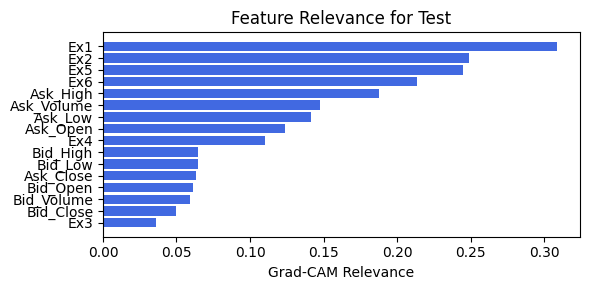

In [107]:
train_and_plot_relevance(Model3_2, kan_neurons=3, kan_grid=3, cnn_bottleneck_dim=-1, lamb=1e-06, steps=30, alpha=.25, filename=filename_2, opt_col_val=0.25)

### 2.0.5. width=[10, 3, 1], grid=3, lamb=1e-06 | alpha=0.25

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


 train_acc_hybrid: 7.60e-01 | val_acc_hybrid: 7.07e-01 |: 100%|█████| 30/30 [00:22<00:00,  1.34it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.2109e-01 at 11 epoch
tensor(0.6839, device='cuda:0')
[[114  69]
 [ 47 137]]
M_KAN Relevance: 0.07638021558523178
CNN Relevance: 0.9236197471618652
[('Bid_Low', 0.6562606), ('Ask_High', 0.525855), ('Ask_Low', 0.4720944), ('Bid_High', 0.4093172), ('Bid_Volume', 0.4005313), ('Bid_Open', 0.37741005), ('Bid_Close', 0.3607204), ('Ask_Open', 0.33756977), ('Ask_Close', 0.24603872), ('Ask_Volume', 0.15916616)]


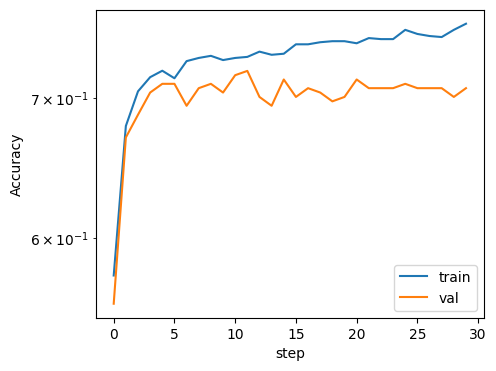

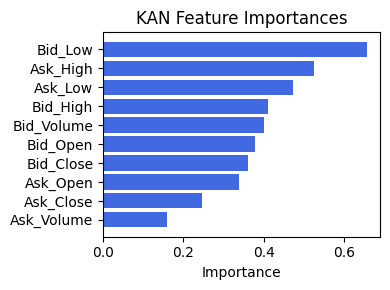

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex1', 0.30897157633174666), ('Ex2', 0.24871897070772683), ('Ex5', 0.2451023661635552), ('Ex6', 0.2133223059833334), ('Ask_High', 0.1876069184345744), ('Ask_Volume', 0.14755169767370938), ('Ask_Low', 0.14166429098023037), ('Ask_Open', 0.12403083365889234), ('Ex4', 0.1099237022129692), ('Bid_High', 0.0648081101467154), ('Bid_Low', 0.06460027321167569), ('Ask_Close', 0.06349890831499792), ('Bid_Open', 0.06147100051677194), ('Bid_Volume', 0.05942352248708799), ('Bid_Close', 0.04957153142492696), ('Ex3', 0.03598600452859716)]


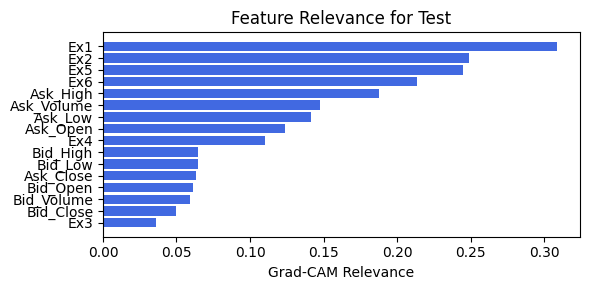

In [108]:
train_and_plot_relevance(Model3_2, kan_neurons=3, kan_grid=3, cnn_bottleneck_dim=-1, lamb=1e-06, steps=30, alpha=.25, filename=filename_2, opt_col_val=0.25)

### 2.0.6. width=[10, 3, 1], grid=3, lamb=1e-06 | alpha=0.1

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


 train_acc_hybrid: 7.52e-01 | val_acc_hybrid: 7.18e-01 |: 100%|█████| 30/30 [00:22<00:00,  1.33it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.3469e-01 at 11 epoch
tensor(0.7302, device='cuda:0')
[[141  42]
 [ 57 127]]
M_KAN Relevance: 0.07416446506977081
CNN Relevance: 0.9258355498313904
[('Bid_Open', 1.3162613), ('Ask_High', 1.1804092), ('Ask_Close', 1.0861554), ('Ask_Low', 1.0334189), ('Bid_Low', 0.85265815), ('Bid_Close', 0.7571308), ('Ask_Volume', 0.5607957), ('Bid_High', 0.44442147), ('Bid_Volume', 0.3239636), ('Ask_Open', 0.29028195)]


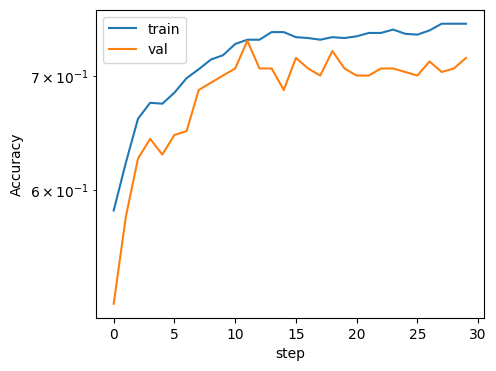

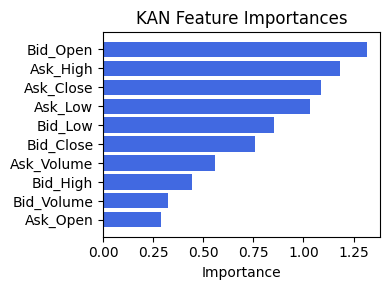

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex2', 0.4281703176786387), ('Ex1', 0.35754139598697543), ('Ex5', 0.2389411069110178), ('Ex6', 0.2290770357857872), ('Ask_Low', 0.19641453559302322), ('Ask_High', 0.18889827524281388), ('Ex4', 0.17275905884697346), ('Ask_Volume', 0.1401614695480531), ('Ask_Open', 0.06410635221110053), ('Bid_Close', 0.026916545913346957), ('Bid_Low', 0.023192261455953947), ('Ex3', 0.010642378692190374), ('Ask_Close', 0.00840490845721012), ('Bid_High', 0.004739784732788017), ('Bid_Volume', 0.0007574064760184682), ('Bid_Open', 0.0002816011145842904)]


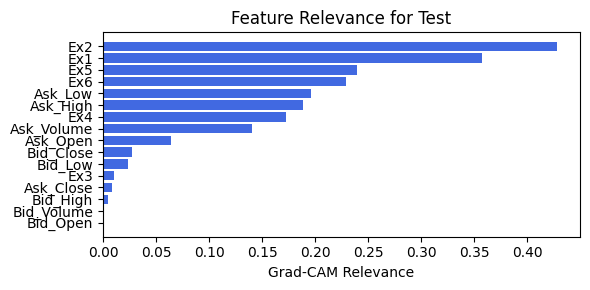

In [109]:
train_and_plot_relevance(Model3_2, kan_neurons=3, kan_grid=3, cnn_bottleneck_dim=-1, lamb=1e-06, steps=30, alpha=.1, filename=filename_2, opt_col_val=0.1)

### 2.0.6b width=[10, 3, 1], grid=3, lamb=1e-06 | alpha=0.1

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


 train_acc_hybrid: 7.54e-01 | val_acc_hybrid: 6.97e-01 |: 100%|█████| 30/30 [00:22<00:00,  1.34it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.2789e-01 at 8 epoch
tensor(0.7275, device='cuda:0')
[[130  53]
 [ 47 137]]
M_KAN Relevance: 0.1542094647884369
CNN Relevance: 0.8457905650138855
[('Ask_High', 2.365252), ('Bid_Close', 1.9492749), ('Ask_Close', 1.9174535), ('Bid_Open', 1.4491601), ('Ask_Low', 1.4036487), ('Bid_High', 1.1890216), ('Bid_Low', 0.72632116), ('Ask_Volume', 0.47835085), ('Bid_Volume', 0.32087177), ('Ask_Open', 0.22680613)]


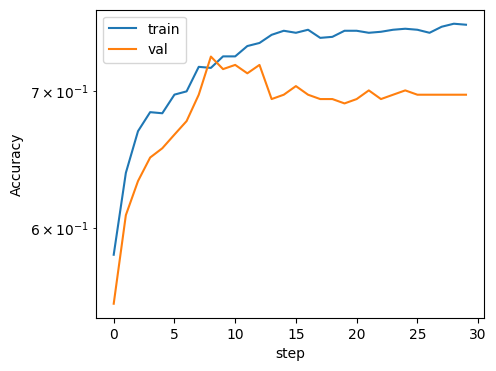

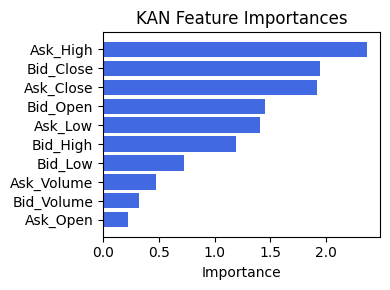

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex2', 0.4097844852078757), ('Ex6', 0.2984658277591015), ('Ex1', 0.20915269290860894), ('Ex5', 0.19769262587106012), ('Ask_Low', 0.17951074659181074), ('Ex4', 0.156245282214206), ('Ask_High', 0.10476987423630284), ('Ask_Volume', 0.09664483403924051), ('Ex3', 0.03224962560205571), ('Ask_Open', 0.024024235401583306), ('Ask_Close', 0.022519466776638075), ('Bid_Close', 0.021457476645602772), ('Bid_Low', 0.010093380244257188), ('Bid_Volume', 0.0014273786971016281), ('Bid_High', 0.00033181800496858376), ('Bid_Open', 0.0001299293217809404)]


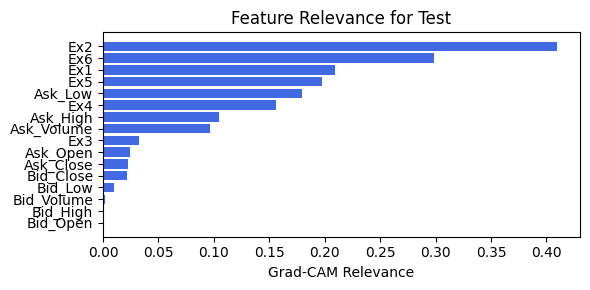

In [110]:
train_and_plot_relevance(Model3_2, kan_neurons=3, kan_grid=3, cnn_bottleneck_dim=-1, lamb=1e-06, steps=30, alpha=.1, filename=filename_2, opt_col_val=0.1)

### 2.0.7. width=[10, 3, 1], grid=3, lamb=1e-06 | alpha=0.05

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


 train_acc_hybrid: 7.46e-01 | val_acc_hybrid: 7.18e-01 |: 100%|█████| 30/30 [00:23<00:00,  1.27it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.3469e-01 at 17 epoch
tensor(0.7003, device='cuda:0')
[[118  65]
 [ 45 139]]
M_KAN Relevance: 0.14634285867214203
CNN Relevance: 0.8536571264266968
[('Ask_High', 2.6780908), ('Bid_High', 2.035892), ('Ask_Close', 1.7609811), ('Bid_Close', 1.6819581), ('Ask_Low', 1.3848093), ('Bid_Open', 0.9403221), ('Bid_Low', 0.70458335), ('Ask_Volume', 0.4945565), ('Ask_Open', 0.3462265), ('Bid_Volume', 0.3234945)]


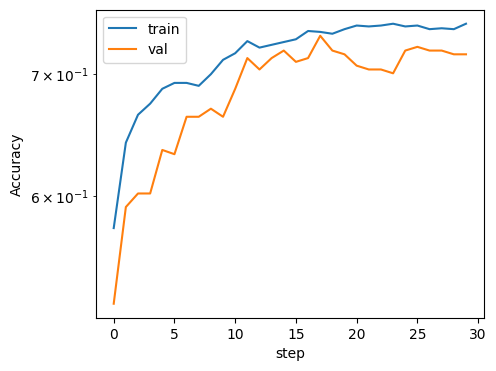

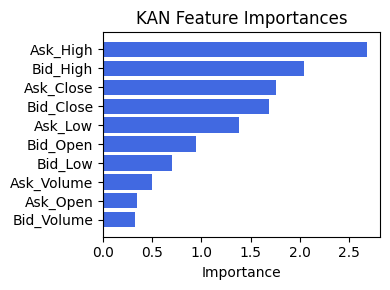

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex6', 0.6588630761332018), ('Ex5', 0.11191620863466561), ('Bid_Open', 0.07787750688986092), ('Bid_High', 0.06018384051403254), ('Ex4', 0.010095672622768396), ('Ex3', 0.002058580375659693), ('Bid_Volume', 0.0009736255039993866), ('Ask_Open', 0.0006642825985568442), ('Ask_Close', 0.0003344387841240911), ('Bid_Low', 0.0002531478744842701), ('Bid_Close', 6.125767129074975e-05), ('Ask_High', 4.765949128271773e-05), ('Ask_Low', 4.765949128271773e-05), ('Ask_Volume', 7.794753772686223e-06), ('Ex1', 0.0), ('Ex2', 0.0)]


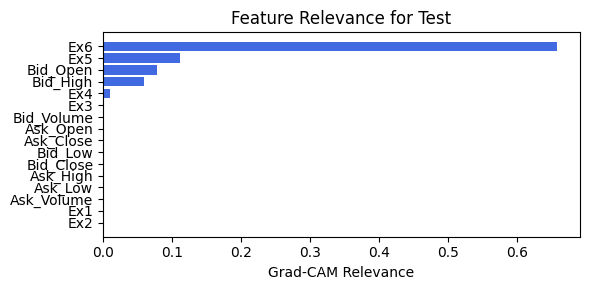

In [111]:
train_and_plot_relevance(Model3_2, kan_neurons=3, kan_grid=3, cnn_bottleneck_dim=-1, lamb=1e-06, steps=30, alpha=.05, filename=filename_2, opt_col_val=0.05)

### 2.0.8. width=[10, 3, 1], grid=3, lamb=1e-06 | alpha=0.05

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


 train_acc_hybrid: 7.46e-01 | val_acc_hybrid: 7.18e-01 |: 100%|█████| 30/30 [00:23<00:00,  1.26it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.3469e-01 at 17 epoch
tensor(0.7003, device='cuda:0')
[[118  65]
 [ 45 139]]
M_KAN Relevance: 0.14634285867214203
CNN Relevance: 0.8536571264266968
[('Ask_High', 2.6780908), ('Bid_High', 2.035892), ('Ask_Close', 1.7609811), ('Bid_Close', 1.6819581), ('Ask_Low', 1.3848093), ('Bid_Open', 0.9403221), ('Bid_Low', 0.70458335), ('Ask_Volume', 0.4945565), ('Ask_Open', 0.3462265), ('Bid_Volume', 0.3234945)]


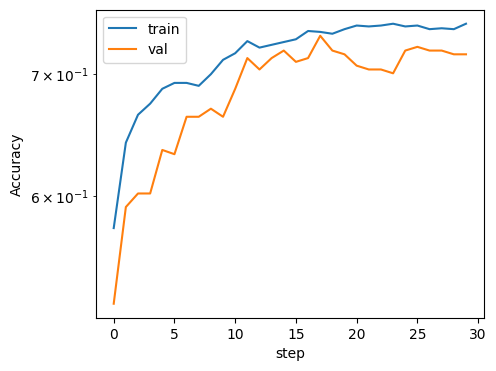

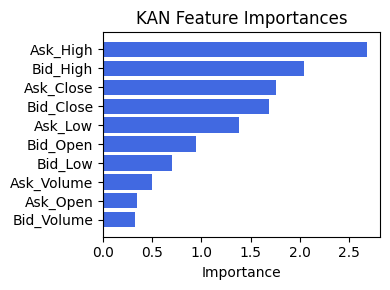

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex6', 0.6588630761332018), ('Ex5', 0.11191620863466561), ('Bid_Open', 0.07787750688986092), ('Bid_High', 0.06018384051403254), ('Ex4', 0.010095672622768396), ('Ex3', 0.002058580375659693), ('Bid_Volume', 0.0009736255039993866), ('Ask_Open', 0.0006642825985568442), ('Ask_Close', 0.0003344387841240911), ('Bid_Low', 0.0002531478744842701), ('Bid_Close', 6.125767129074975e-05), ('Ask_High', 4.765949128271773e-05), ('Ask_Low', 4.765949128271773e-05), ('Ask_Volume', 7.794753772686223e-06), ('Ex1', 0.0), ('Ex2', 0.0)]


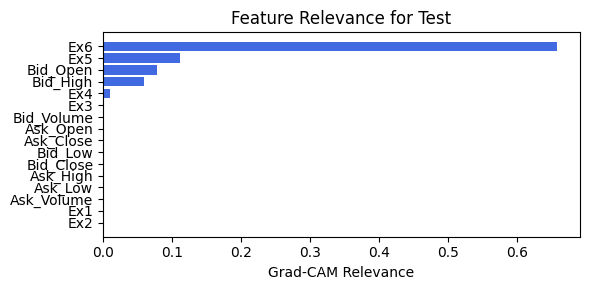

In [112]:
train_and_plot_relevance(Model3_2, kan_neurons=3, kan_grid=3, cnn_bottleneck_dim=-1, lamb=1e-06, steps=30, alpha=.05, filename=filename_2, opt_col_val=0.05)

### 2.0.9. width=[10, 3, 1], grid=3, lamb=1e-06 | alpha=0.01

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


 train_acc_hybrid: 7.51e-01 | val_acc_hybrid: 6.90e-01 |: 100%|█████| 30/30 [00:23<00:00,  1.29it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.2449e-01 at 10 epoch
tensor(0.7057, device='cuda:0')
[[136  47]
 [ 61 123]]
M_KAN Relevance: 0.24453936517238617
CNN Relevance: 0.7554606795310974
[('Bid_Close', 3.1974778), ('Ask_High', 3.1567616), ('Ask_Close', 2.6999288), ('Bid_High', 2.4099383), ('Bid_Low', 1.3662684), ('Ask_Open', 0.8887043), ('Bid_Open', 0.7226558), ('Ask_Low', 0.41230807), ('Ask_Volume', 0.38464403), ('Bid_Volume', 0.1901788)]


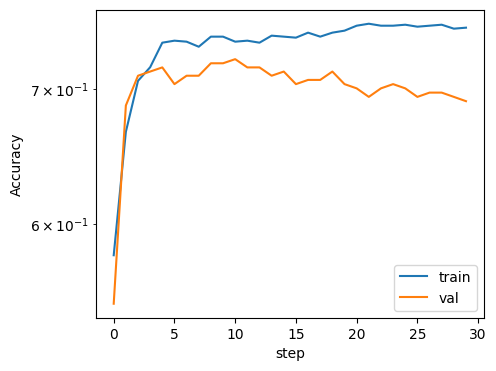

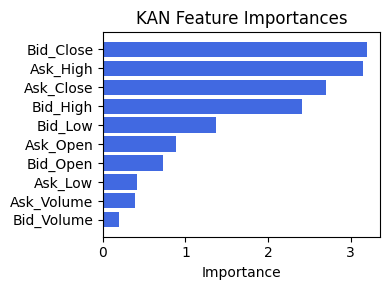

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ask_Volume', 0.42572645940475307), ('Ex1', 0.3467591267297354), ('Ask_Close', 0.2898185166710485), ('Ask_Open', 0.25714423068182424), ('Ask_High', 0.2393769292701391), ('Ex3', 0.22954798911251534), ('Ex4', 0.22505703918338937), ('Bid_Volume', 0.1558102031976837), ('Ex5', 0.15290317439582968), ('Bid_High', 0.14496496611062884), ('Bid_Low', 0.1393428492887651), ('Ask_Low', 0.09952474609036405), ('Bid_Close', 0.07599959054667432), ('Ex2', 0.07429217184546127), ('Bid_Open', 0.07064319112622344), ('Ex6', 0.00883110584296243)]


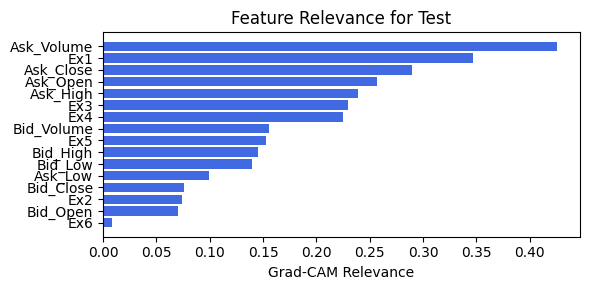

In [113]:
train_and_plot_relevance(Model3_2, kan_neurons=3, kan_grid=3, cnn_bottleneck_dim=-1, lamb=1e-06, steps=30, alpha=.01, filename=filename_2, opt_col_val=0.01)

### 2.0.10. width=[10, 3, 1], grid=3, lamb=1e-06 | alpha=0.01

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


 train_acc_hybrid: 7.51e-01 | val_acc_hybrid: 6.90e-01 |: 100%|█████| 30/30 [00:23<00:00,  1.28it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.2449e-01 at 10 epoch
tensor(0.7057, device='cuda:0')
[[136  47]
 [ 61 123]]
M_KAN Relevance: 0.24453936517238617
CNN Relevance: 0.7554606795310974
[('Bid_Close', 3.1974778), ('Ask_High', 3.1567616), ('Ask_Close', 2.6999288), ('Bid_High', 2.4099383), ('Bid_Low', 1.3662684), ('Ask_Open', 0.8887043), ('Bid_Open', 0.7226558), ('Ask_Low', 0.41230807), ('Ask_Volume', 0.38464403), ('Bid_Volume', 0.1901788)]


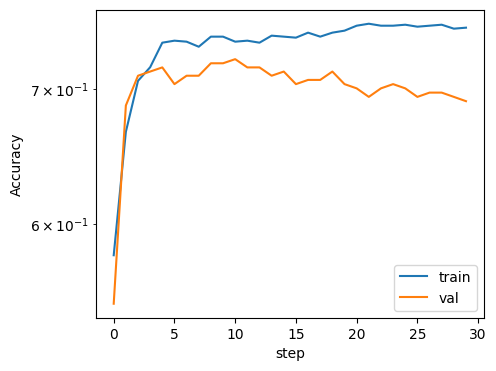

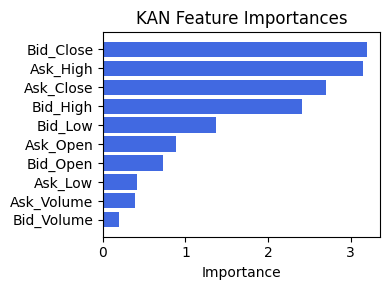

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ask_Volume', 0.42572645940475307), ('Ex1', 0.3467591267297354), ('Ask_Close', 0.2898185166710485), ('Ask_Open', 0.25714423068182424), ('Ask_High', 0.2393769292701391), ('Ex3', 0.22954798911251534), ('Ex4', 0.22505703918338937), ('Bid_Volume', 0.1558102031976837), ('Ex5', 0.15290317439582968), ('Bid_High', 0.14496496611062884), ('Bid_Low', 0.1393428492887651), ('Ask_Low', 0.09952474609036405), ('Bid_Close', 0.07599959054667432), ('Ex2', 0.07429217184546127), ('Bid_Open', 0.07064319112622344), ('Ex6', 0.00883110584296243)]


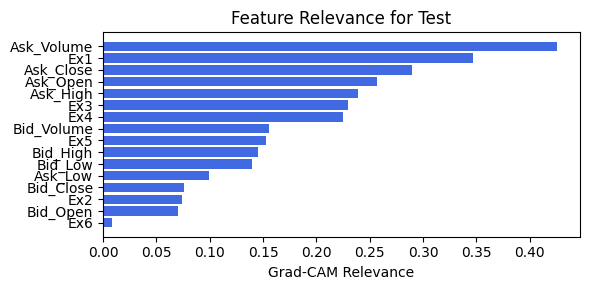

In [114]:
train_and_plot_relevance(Model3_2, kan_neurons=3, kan_grid=3, cnn_bottleneck_dim=-1, lamb=1e-06, steps=30, alpha=.01, filename=filename_2, opt_col_val=0.01)

## 2.1 width=[10, 3, 1], grid=4, lamb=0.0001

### 2.1.0 width=[10, 3, 1], grid=4, lamb=0.0001 | alpha=0.75

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


 train_acc_hybrid: 7.48e-01 | val_acc_hybrid: 7.07e-01 |: 100%|█████| 30/30 [00:25<00:00,  1.17it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.1769e-01 at 14 epoch
tensor(0.7084, device='cuda:0')
[[130  53]
 [ 54 130]]
M_KAN Relevance: 0.059661541134119034
CNN Relevance: 0.9403384327888489
[('Bid_Close', 0.4180908), ('Bid_Low', 0.39596033), ('Ask_High', 0.35373193), ('Ask_Open', 0.31629318), ('Bid_High', 0.18984091), ('Ask_Volume', 0.1876373), ('Bid_Open', 0.1665504), ('Ask_Low', 0.15788424), ('Ask_Close', 0.1554111), ('Bid_Volume', 0.15150693)]


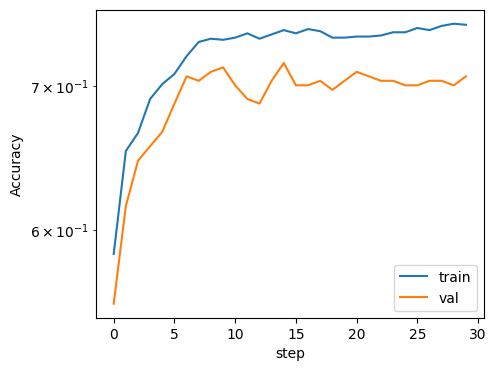

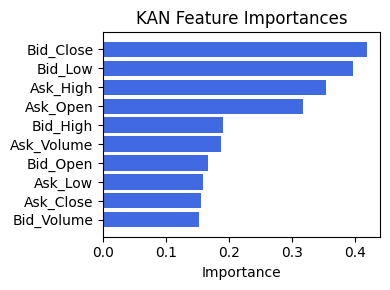

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex2', 0.6601870224636038), ('Ex5', 0.5982366814090914), ('Ask_Low', 0.5720541266512256), ('Ex4', 0.5467393368779021), ('Ex1', 0.5424479068985224), ('Ask_Volume', 0.44877013602079596), ('Ask_High', 0.35975310856213777), ('Ex6', 0.35950595664008894), ('Ask_Open', 0.3446852260374538), ('Bid_Close', 0.2825474593768084), ('Ex3', 0.24990607164984147), ('Ask_Close', 0.2363146702016384), ('Bid_Volume', 0.16842749668380413), ('Bid_Low', 0.13381212095733813), ('Bid_High', 0.11740074353546351), ('Bid_Open', 0.11117708266868792)]


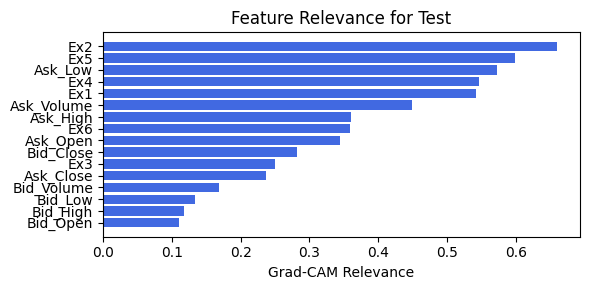

In [115]:
train_and_plot_relevance(Model3_2, kan_neurons=3, kan_grid=4, cnn_bottleneck_dim=-1, lamb=0.0001, steps=30, alpha=.75, filename=filename_2, opt_col_val=0.75)

### 2.1.1 width=[10, 3, 1], grid=4, lamb=0.0001 | alpha=0.75

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


 train_acc_hybrid: 7.53e-01 | val_acc_hybrid: 7.01e-01 |: 100%|█████| 30/30 [00:25<00:00,  1.17it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.2109e-01 at 21 epoch
tensor(0.7084, device='cuda:0')
[[126  57]
 [ 50 134]]
M_KAN Relevance: 0.09865619242191315
CNN Relevance: 0.901343822479248
[('Bid_High', 0.84888077), ('Ask_High', 0.75910985), ('Bid_Low', 0.64949554), ('Bid_Close', 0.5385639), ('Ask_Low', 0.49577808), ('Ask_Open', 0.33764204), ('Bid_Volume', 0.2899798), ('Ask_Volume', 0.2729274), ('Ask_Close', 0.25232798), ('Bid_Open', 0.16764335)]


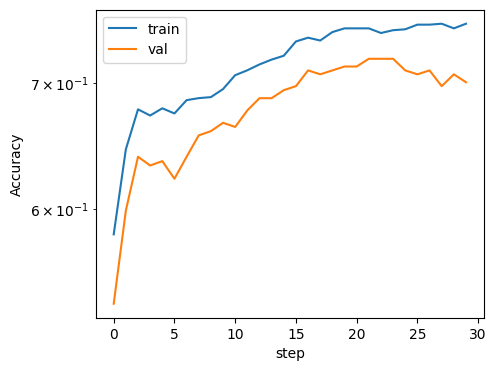

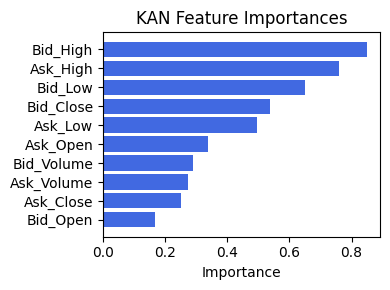

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex1', 0.3173054213095101), ('Ex5', 0.29497754521038616), ('Ask_High', 0.25961104653933026), ('Ask_Volume', 0.2550259251108651), ('Ask_Open', 0.20704103167973237), ('Ex6', 0.19643200667986102), ('Ex4', 0.17046422748404558), ('Ask_Close', 0.16726195726825027), ('Ex2', 0.16483952566132865), ('Bid_Volume', 0.11551975913137884), ('Ask_Low', 0.11051281498398058), ('Ex3', 0.061846944004676635), ('Bid_High', 0.060967536896438024), ('Bid_Low', 0.04246466658952835), ('Bid_Open', 0.03752102106108587), ('Bid_Close', 0.020437639329090145)]


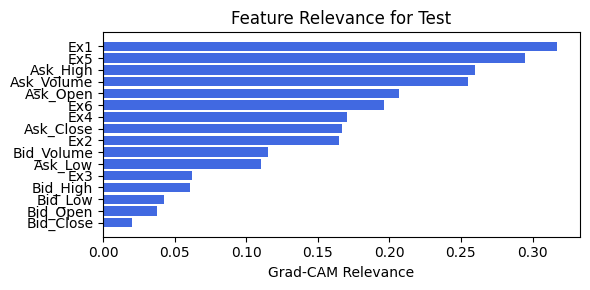

In [116]:
train_and_plot_relevance(Model3_2, kan_neurons=3, kan_grid=4, cnn_bottleneck_dim=-1, lamb=0.0001, steps=30, alpha=.75, filename=filename_2, opt_col_val=0.75)

### 2.1.2 width=[10, 3, 1], grid=4, lamb=0.0001 | alpha=0.5

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


 train_acc_hybrid: 7.54e-01 | val_acc_hybrid: 7.11e-01 |: 100%|█████| 30/30 [00:26<00:00,  1.15it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.2109e-01 at 14 epoch
tensor(0.7057, device='cuda:0')
[[134  49]
 [ 59 125]]
M_KAN Relevance: 0.11205095797777176
CNN Relevance: 0.8879490494728088
[('Ask_High', 0.27154005), ('Bid_Close', 0.25289345), ('Bid_Low', 0.22124398), ('Ask_Open', 0.20260017), ('Bid_High', 0.18255048), ('Ask_Close', 0.15883683), ('Ask_Volume', 0.14899363), ('Ask_Low', 0.14303747), ('Bid_Volume', 0.1416317), ('Bid_Open', 0.1259709)]


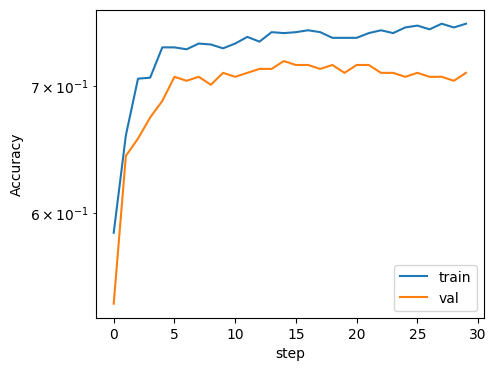

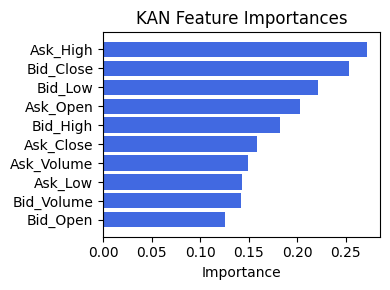

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex2', 0.6894964989243931), ('Ask_Low', 0.6099231637810034), ('Ex5', 0.5943751753820486), ('Ex6', 0.4914137301636652), ('Ex4', 0.484397070401168), ('Ask_Open', 0.30532769739566934), ('Ask_High', 0.30405545279343055), ('Ex1', 0.2953334902324371), ('Bid_Close', 0.27767431372789314), ('Ask_Volume', 0.26571009895822656), ('Bid_Low', 0.16420197486369909), ('Bid_High', 0.15256169459678495), ('Bid_Open', 0.1113718857009177), ('Ex3', 0.10040845215537557), ('Bid_Volume', 0.08260853084232074), ('Ask_Close', 0.08089734521667201)]


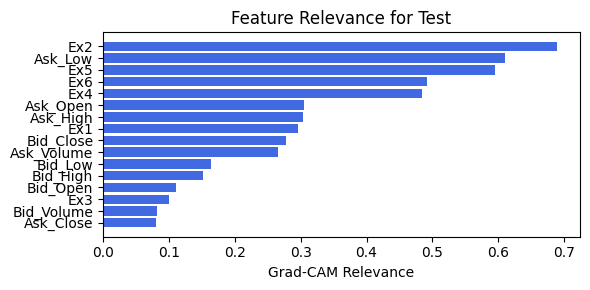

In [117]:
train_and_plot_relevance(Model3_2, kan_neurons=3, kan_grid=4, cnn_bottleneck_dim=-1, lamb=0.0001, steps=30, alpha=.5, filename=filename_2, opt_col_val=0.5)

### 2.1.3 width=[10, 3, 1], grid=4, lamb=0.0001 | alpha=0.5

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


 train_acc_hybrid: 7.53e-01 | val_acc_hybrid: 7.04e-01 |: 100%|█████| 30/30 [00:25<00:00,  1.17it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.2109e-01 at 14 epoch
tensor(0.6975, device='cuda:0')
[[130  53]
 [ 58 126]]
M_KAN Relevance: 0.11842379719018936
CNN Relevance: 0.8815761804580688
[('Ask_High', 0.33900523), ('Bid_Close', 0.27524564), ('Bid_Low', 0.266563), ('Ask_Volume', 0.26074517), ('Ask_Open', 0.23101859), ('Ask_Low', 0.20949237), ('Bid_High', 0.20796633), ('Ask_Close', 0.18087196), ('Bid_Open', 0.16438845), ('Bid_Volume', 0.13345492)]


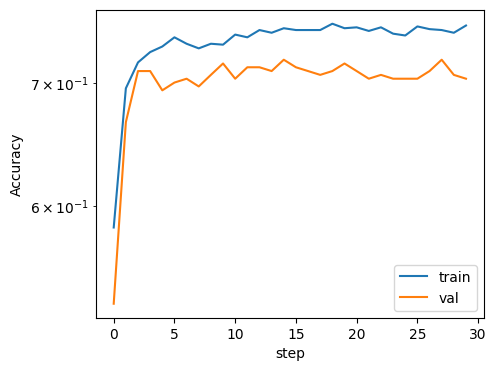

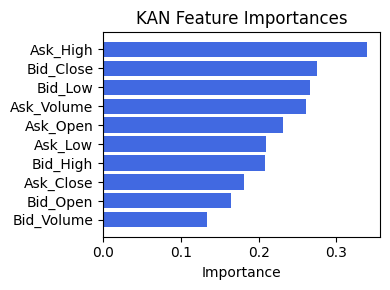

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex2', 0.6293623547858942), ('Ex5', 0.5690639914655474), ('Ex6', 0.5347661569597814), ('Ask_Low', 0.47814266832179975), ('Ex4', 0.42969471227938477), ('Ask_Open', 0.19826928039915018), ('Ex1', 0.17415630161839638), ('Ask_Volume', 0.1581604377539798), ('Bid_Close', 0.14500944241018565), ('Ask_High', 0.13370178485479858), ('Bid_Open', 0.08130288959166151), ('Ex3', 0.0714989707257081), ('Ask_Close', 0.06400305998945553), ('Bid_Volume', 0.06273637300073559), ('Bid_High', 0.043586240334887366), ('Bid_Low', 0.03252273734333184)]


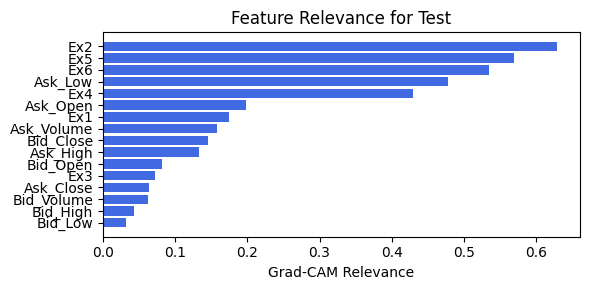

In [118]:
train_and_plot_relevance(Model3_2, kan_neurons=3, kan_grid=4, cnn_bottleneck_dim=-1, lamb=0.0001, steps=30, alpha=.5, filename=filename_2, opt_col_val=0.5)

### 2.1.4 width=[10, 3, 1], grid=4, lamb=0.0001 | alpha=0.25

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


 train_acc_hybrid: 7.48e-01 | val_acc_hybrid: 7.14e-01 |: 100%|█████| 30/30 [00:25<00:00,  1.18it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.2789e-01 at 7 epoch
tensor(0.7139, device='cuda:0')
[[122  61]
 [ 44 140]]
M_KAN Relevance: 0.09518294781446457
CNN Relevance: 0.9048170447349548
[('Bid_Close', 0.40766644), ('Ask_Low', 0.35957906), ('Bid_Low', 0.35423154), ('Ask_Open', 0.33702537), ('Bid_Open', 0.29032207), ('Ask_High', 0.23188774), ('Ask_Close', 0.21042526), ('Bid_Volume', 0.1518812), ('Ask_Volume', 0.15140954), ('Bid_High', 0.1272729)]


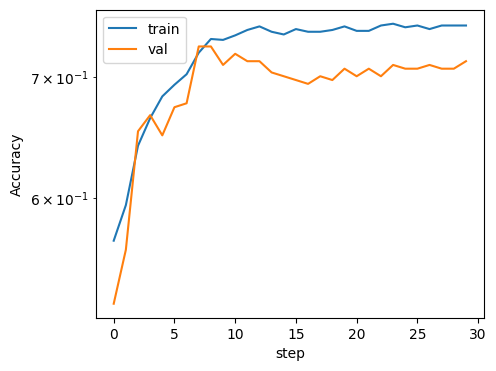

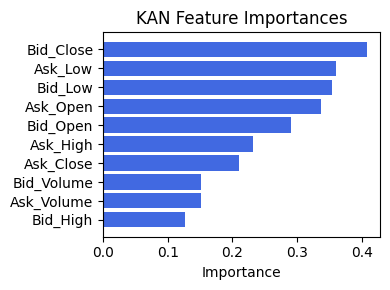

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex5', 0.394574574129583), ('Ex6', 0.35857192938005406), ('Ex2', 0.25425671625181995), ('Ex4', 0.21469848545928605), ('Ex1', 0.1927900553201338), ('Ask_High', 0.1726269794282902), ('Ask_Low', 0.1522514846908501), ('Ask_Open', 0.1418107327997522), ('Ask_Volume', 0.1014112201500278), ('Bid_High', 0.08382249590614842), ('Bid_Low', 0.08132786698995775), ('Bid_Open', 0.07865907058722628), ('Bid_Close', 0.056695409079002376), ('Ask_Close', 0.05133636643487087), ('Bid_Volume', 0.04806143843520646), ('Ex3', 0.0322196595408438)]


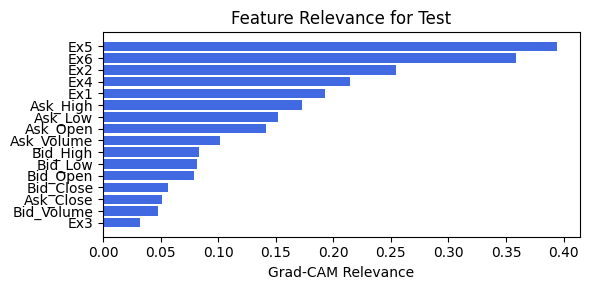

In [119]:
train_and_plot_relevance(Model3_2, kan_neurons=3, kan_grid=4, cnn_bottleneck_dim=-1, lamb=0.0001, steps=30, alpha=.25, filename=filename_2, opt_col_val=0.25)

### 2.1.5 width=[10, 3, 1], grid=4, lamb=0.0001 | alpha=0.25

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


 train_acc_hybrid: 7.60e-01 | val_acc_hybrid: 6.80e-01 |: 100%|█████| 30/30 [00:25<00:00,  1.17it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.3129e-01 at 8 epoch
tensor(0.7193, device='cuda:0')
[[130  53]
 [ 50 134]]
M_KAN Relevance: 0.08216822147369385
CNN Relevance: 0.9178317785263062
[('Bid_Close', 0.4321875), ('Ask_High', 0.320646), ('Bid_Low', 0.28573424), ('Ask_Volume', 0.28130722), ('Bid_Volume', 0.25617832), ('Bid_High', 0.17397094), ('Ask_Close', 0.16817342), ('Ask_Open', 0.15838689), ('Ask_Low', 0.14294249), ('Bid_Open', 0.1288017)]


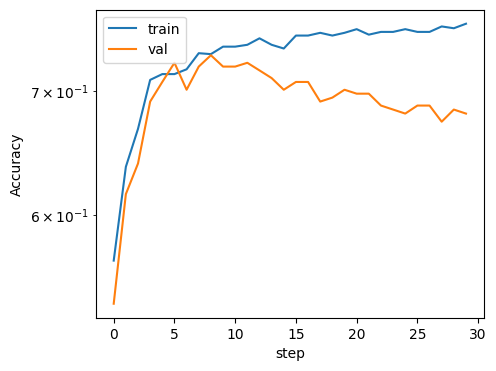

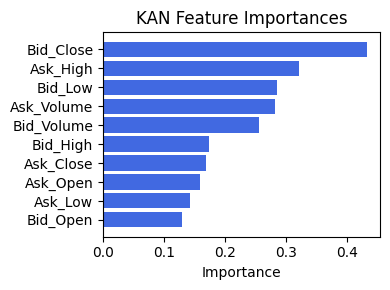

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex5', 0.420440404614997), ('Ex4', 0.2559408200219558), ('Ex6', 0.2368924046932575), ('Ex1', 0.1997057132686841), ('Ask_Volume', 0.14841421550748507), ('Ask_Open', 0.10164126059796691), ('Ask_High', 0.08427931546820112), ('Ex2', 0.08387632780056194), ('Bid_Open', 0.06941733783889247), ('Ask_Close', 0.06925259064938505), ('Ex3', 0.050808336014072066), ('Bid_Volume', 0.037118327417956905), ('Bid_High', 0.011482273717561536), ('Ask_Low', 0.00972641774274238), ('Bid_Low', 0.0020928996191361643), ('Bid_Close', 0.0017740775194090134)]


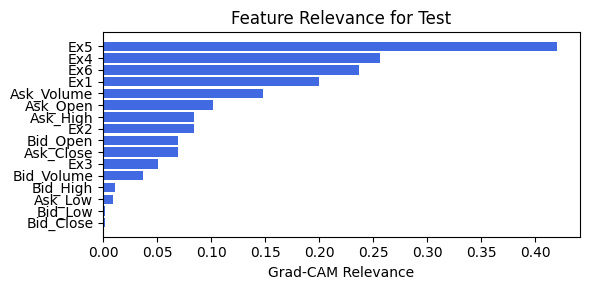

In [120]:
train_and_plot_relevance(Model3_2, kan_neurons=3, kan_grid=4, cnn_bottleneck_dim=-1, lamb=0.0001, steps=30, alpha=.25, filename=filename_2, opt_col_val=0.25)

### 2.1.6 width=[10, 3, 1], grid=4, lamb=0.0001 | alpha=0.1

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


 train_acc_hybrid: 7.56e-01 | val_acc_hybrid: 6.94e-01 |: 100%|█████| 30/30 [00:24<00:00,  1.21it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.1769e-01 at 6 epoch
tensor(0.7084, device='cuda:0')
[[135  48]
 [ 59 125]]
M_KAN Relevance: 0.1255897879600525
CNN Relevance: 0.8744102120399475
[('Bid_Close', 0.46968508), ('Bid_Open', 0.24562085), ('Bid_Low', 0.24493681), ('Ask_High', 0.23778777), ('Bid_Volume', 0.20649157), ('Ask_Close', 0.18903854), ('Bid_High', 0.18842795), ('Ask_Volume', 0.18464917), ('Ask_Open', 0.16598359), ('Ask_Low', 0.09686496)]


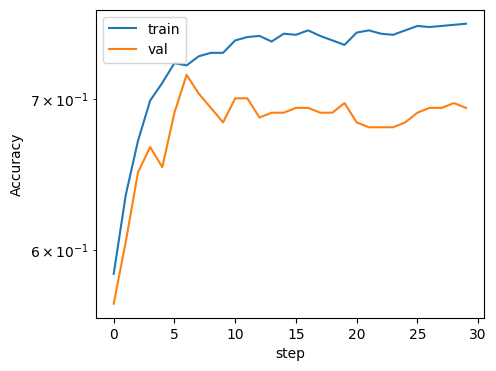

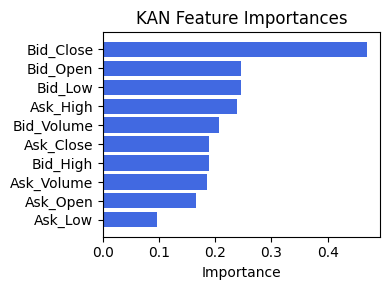

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex2', 0.47391180707933506), ('Ask_Low', 0.38339619435914096), ('Bid_Close', 0.25419121239370945), ('Ex1', 0.12668467081362528), ('Ask_Close', 0.0773051370888722), ('Ex3', 0.07525658231191001), ('Ask_Volume', 0.06777361987839225), ('Bid_Low', 0.06602380836714744), ('Ask_Open', 0.06525627720700333), ('Ex4', 0.06480328699970225), ('Ex5', 0.06380139915821363), ('Ask_High', 0.06188141382924065), ('Bid_High', 0.0616744476514169), ('Bid_Volume', 0.05738180793579703), ('Ex6', 0.04029318328587749), ('Bid_Open', 0.02611280854115988)]


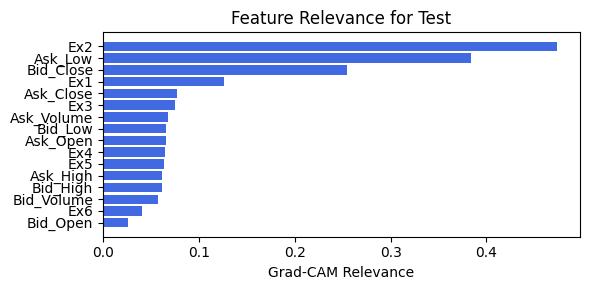

In [121]:
train_and_plot_relevance(Model3_2, kan_neurons=3, kan_grid=4, cnn_bottleneck_dim=-1, lamb=0.0001, steps=30, alpha=.1, filename=filename_2, opt_col_val=0.1)

### 2.1.7 width=[10, 3, 1], grid=4, lamb=0.0001 | alpha=0.1

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


 train_acc_hybrid: 7.59e-01 | val_acc_hybrid: 7.07e-01 |: 100%|█████| 30/30 [00:24<00:00,  1.23it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.0748e-01 at 10 epoch
tensor(0.6948, device='cuda:0')
[[143  40]
 [ 72 112]]
M_KAN Relevance: 0.13841263949871063
CNN Relevance: 0.8615873456001282
[('Bid_Close', 0.5909501), ('Bid_Open', 0.28988546), ('Ask_Close', 0.26227057), ('Bid_Low', 0.23665795), ('Ask_High', 0.21092395), ('Ask_Volume', 0.20170602), ('Bid_Volume', 0.18923144), ('Ask_Open', 0.18772802), ('Bid_High', 0.17608963), ('Ask_Low', 0.09392454)]


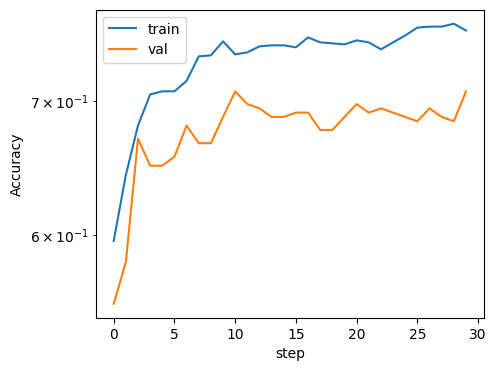

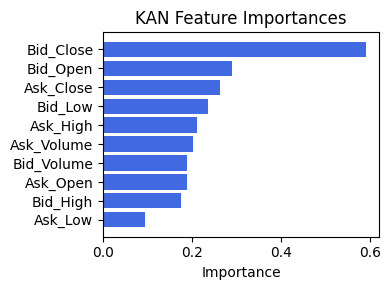

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex2', 0.7109419606519451), ('Ask_Low', 0.5333816427407578), ('Bid_Close', 0.28976751578972854), ('Ex1', 0.19290995148672882), ('Ask_High', 0.10632799123064932), ('Ex6', 0.10041168263836761), ('Ex5', 0.07007108670906785), ('Bid_Low', 0.06229823661716883), ('Ask_Open', 0.037888795501242925), ('Bid_High', 0.03479837985123744), ('Ex4', 0.030953089793926074), ('Ask_Volume', 0.02733560025920911), ('Ex3', 0.019275994747425893), ('Ask_Close', 0.01088209761297048), ('Bid_Volume', 0.003990175817872344), ('Bid_Open', 0.0018277710418810697)]


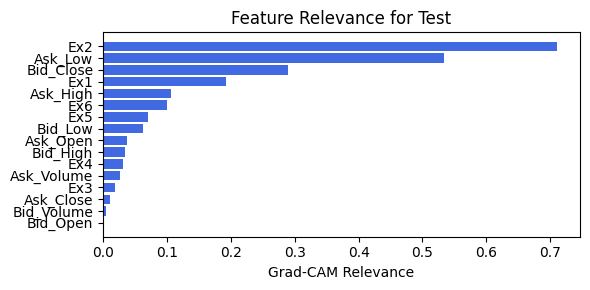

In [122]:
train_and_plot_relevance(Model3_2, kan_neurons=3, kan_grid=4, cnn_bottleneck_dim=-1, lamb=0.0001, steps=30, alpha=.1, filename=filename_2, opt_col_val=0.1)

### 2.1.8 width=[10, 3, 1], grid=4, lamb=0.0001 | alpha=0.05

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


 train_acc_hybrid: 7.67e-01 | val_acc_hybrid: 6.87e-01 |: 100%|█████| 30/30 [00:25<00:00,  1.19it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.1088e-01 at 1 epoch
tensor(0.6839, device='cuda:0')
[[123  60]
 [ 56 128]]
M_KAN Relevance: 0.10072855651378632
CNN Relevance: 0.8992714285850525
[('Bid_Low', 0.62384313), ('Bid_Close', 0.60280436), ('Ask_High', 0.5236425), ('Ask_Close', 0.5107179), ('Ask_Open', 0.40218776), ('Ask_Volume', 0.32824916), ('Bid_Volume', 0.2523886), ('Bid_High', 0.17368224), ('Ask_Low', 0.16042395), ('Bid_Open', 0.15004934)]


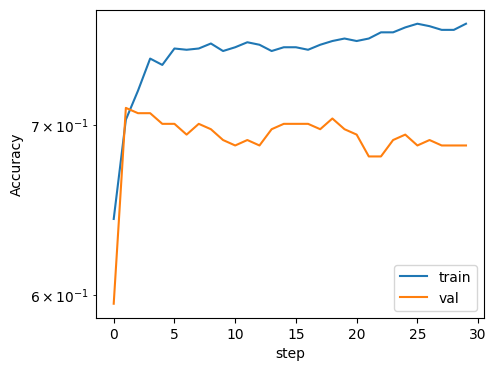

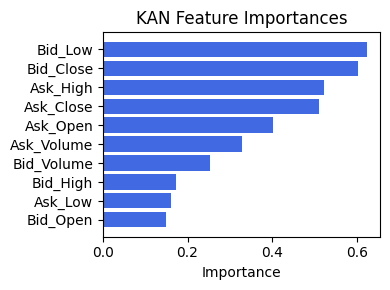

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ask_Low', 0.5610111921223779), ('Bid_Close', 0.5258659616021353), ('Ex2', 0.47107139170900675), ('Ex3', 0.05599195240494479), ('Bid_Low', 0.025235744951472017), ('Ex4', 0.02145851907867187), ('Bid_High', 0.01137968155021566), ('Ex5', 0.008414367838744937), ('Bid_Open', 0.008343526444086051), ('Ex6', 0.005822508705003385), ('Ask_Close', 0.00505078790711914), ('Ask_High', 0.002475065144712463), ('Ask_Open', 0.0021280847630674167), ('Bid_Volume', 0.001966834560129284), ('Ask_Volume', 0.0007917230063161181), ('Ex1', 0.0006658291895886533)]


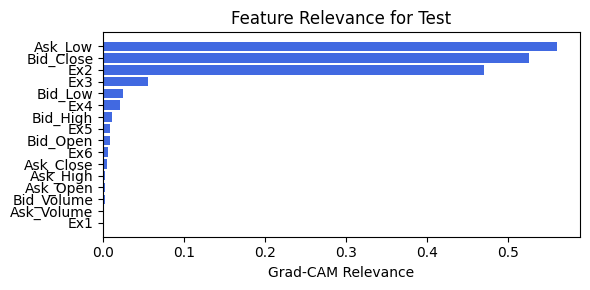

In [123]:
train_and_plot_relevance(Model3_2, kan_neurons=3, kan_grid=4, cnn_bottleneck_dim=-1, lamb=0.0001, steps=30, alpha=.05, filename=filename_2, opt_col_val=0.05)

### 2.1.9 width=[10, 3, 1], grid=4, lamb=0.0001 | alpha=0.05

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


 train_acc_hybrid: 7.60e-01 | val_acc_hybrid: 7.07e-01 |: 100%|█████| 30/30 [00:25<00:00,  1.16it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.1429e-01 at 2 epoch
tensor(0.7221, device='cuda:0')
[[132  51]
 [ 51 133]]
M_KAN Relevance: 0.05644378438591957
CNN Relevance: 0.9435561895370483
[('Bid_Low', 0.6504358), ('Bid_Close', 0.5853525), ('Ask_High', 0.5832368), ('Ask_Close', 0.55833554), ('Ask_Open', 0.4264319), ('Ask_Volume', 0.34482217), ('Bid_Volume', 0.2737371), ('Ask_Low', 0.20990264), ('Bid_High', 0.19043338), ('Bid_Open', 0.17099953)]


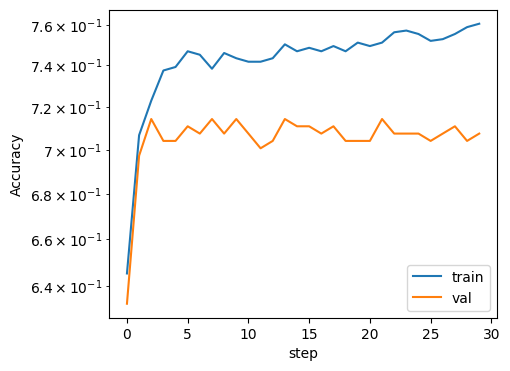

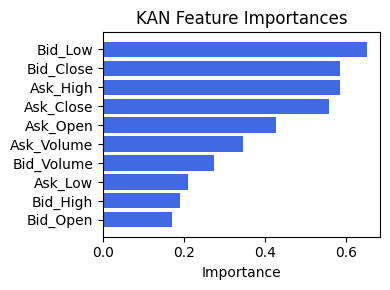

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ask_Low', 0.5826216153089941), ('Ex2', 0.5134109950418856), ('Bid_Close', 0.47553714271381053), ('Bid_Open', 0.028643313197648866), ('Bid_Low', 0.028098992571628515), ('Ex3', 0.028090286603232664), ('Bid_High', 0.01915289896972698), ('Ex4', 0.010771030924986952), ('Ex6', 0.00835305957849409), ('Bid_Volume', 0.006966588173977706), ('Ex5', 0.0057283046145286485), ('Ask_Close', 0.005446649844852106), ('Ask_High', 0.005401822834185893), ('Ask_Open', 0.0042284000544410396), ('Ask_Volume', 0.0025073614945934643), ('Ex1', 0.002338719637988374)]


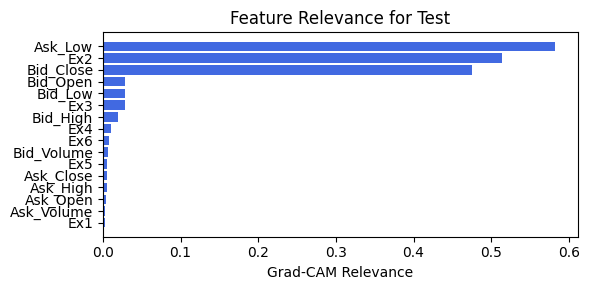

In [124]:
train_and_plot_relevance(Model3_2, kan_neurons=3, kan_grid=4, cnn_bottleneck_dim=-1, lamb=0.0001, steps=30, alpha=.05, filename=filename_2, opt_col_val=0.05)

## 2.2 width=[10, 1, 1], grid=3, lamb=0.0001

### 2.2.0. width=[10, 1, 1], grid=3, lamb=0.0001 | alpha=0.75

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


 train_acc_hybrid: 7.44e-01 | val_acc_hybrid: 7.07e-01 |: 100%|█████| 30/30 [00:22<00:00,  1.34it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.2789e-01 at 7 epoch
tensor(0.7275, device='cuda:0')
[[132  51]
 [ 49 135]]
M_KAN Relevance: 0.015052877366542816
CNN Relevance: 0.9849470853805542
[('Bid_Volume', 0.51999456), ('Ask_Open', 0.4257208), ('Ask_Low', 0.36294553), ('Bid_Close', 0.30174124), ('Ask_Volume', 0.28829604), ('Bid_High', 0.25447345), ('Bid_Low', 0.23872168), ('Ask_High', 0.22457759), ('Bid_Open', 0.14206041), ('Ask_Close', 0.1409441)]


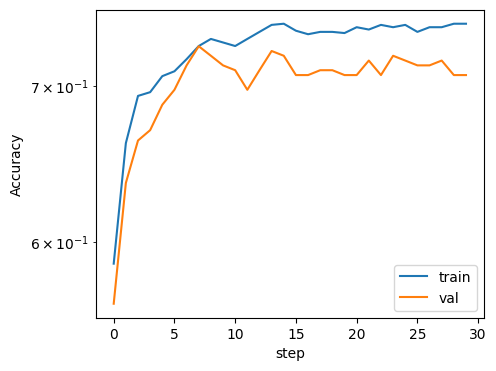

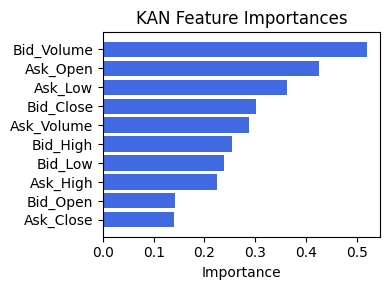

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex2', 0.5405388009983143), ('Ex6', 0.4353188039320686), ('Ex1', 0.3998584589776291), ('Ex5', 0.3887529592829114), ('Ask_Low', 0.3139636016508554), ('Ask_Volume', 0.2995514062769985), ('Ex4', 0.27434995866187767), ('Ask_High', 0.2106299116923309), ('Ask_Open', 0.20741057393918805), ('Ask_Close', 0.13190828665003893), ('Bid_Volume', 0.11167330403003507), ('Ex3', 0.10112518107822122), ('Bid_Close', 0.06606070529178941), ('Bid_Open', 0.04149666486634861), ('Bid_High', 0.03477206551846943), ('Bid_Low', 0.023527349490032858)]


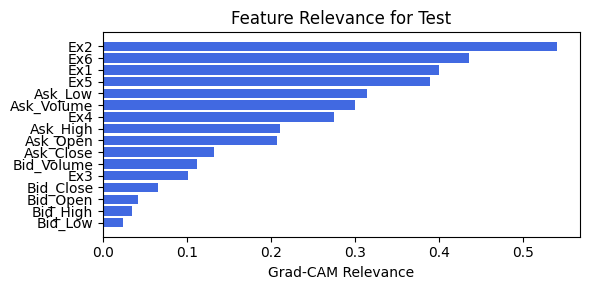

In [125]:
train_and_plot_relevance(Model3_2, kan_neurons=1, kan_grid=3, cnn_bottleneck_dim=-1, lamb=0.0001, steps=30, alpha=.75, filename=filename_2, opt_col_val=0.75)

### 2.2.1 width=[10, 1, 1], grid=3, lamb=0.0001 | alpha=0.75

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


 train_acc_hybrid: 7.44e-01 | val_acc_hybrid: 7.04e-01 |: 100%|█████| 30/30 [00:22<00:00,  1.31it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.3469e-01 at 13 epoch
tensor(0.7166, device='cuda:0')
[[135  48]
 [ 56 128]]
M_KAN Relevance: 0.02509782463312149
CNN Relevance: 0.9749021530151367
[('Bid_Volume', 0.5227485), ('Ask_Open', 0.41600236), ('Ask_Low', 0.32626876), ('Ask_Volume', 0.28767243), ('Bid_Close', 0.21250732), ('Ask_High', 0.19922252), ('Bid_High', 0.19146545), ('Bid_Low', 0.16295338), ('Ask_Close', 0.08603334), ('Bid_Open', 0.053250372)]


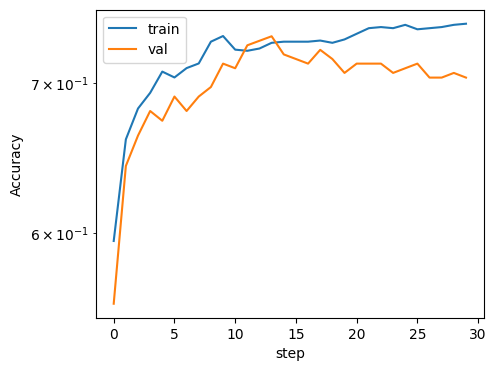

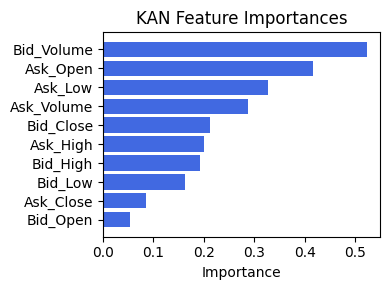

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex2', 0.6179301798145721), ('Ex6', 0.4734194221061322), ('Ex1', 0.4071396641047514), ('Ex5', 0.3830081600827807), ('Ask_Low', 0.35449563793626127), ('Ask_Volume', 0.25559890147959397), ('Ex4', 0.2544179638043269), ('Ask_High', 0.2309574568320614), ('Ask_Open', 0.19261343526831265), ('Ask_Close', 0.07289290306163439), ('Bid_Close', 0.06544789189593096), ('Ex3', 0.06435479975003516), ('Bid_Volume', 0.06077977774050328), ('Bid_High', 0.028150296953937535), ('Bid_Low', 0.027603085303875143), ('Bid_Open', 0.025120548169010912)]


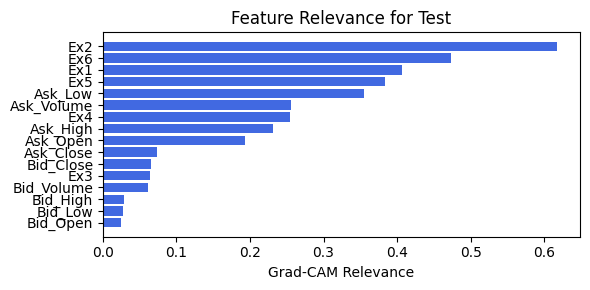

In [126]:
train_and_plot_relevance(Model3_2, kan_neurons=1, kan_grid=3, cnn_bottleneck_dim=-1, lamb=0.0001, steps=30, alpha=.75, filename=filename_2, opt_col_val=0.75)

### 2.2.2 width=[10, 1, 1], grid=3, lamb=0.0001 | alpha=0.5

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


 train_acc_hybrid: 7.54e-01 | val_acc_hybrid: 7.07e-01 |: 100%|█████| 30/30 [00:22<00:00,  1.31it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.2449e-01 at 8 epoch
tensor(0.6948, device='cuda:0')
[[123  60]
 [ 52 132]]
M_KAN Relevance: 0.013700525276362896
CNN Relevance: 0.9862995147705078
[('Bid_Low', 0.7127933), ('Bid_High', 0.7018943), ('Ask_Open', 0.6498714), ('Bid_Volume', 0.5953517), ('Ask_Low', 0.58766276), ('Bid_Open', 0.5607938), ('Ask_High', 0.40080732), ('Ask_Volume', 0.3381751), ('Bid_Close', 0.21214691), ('Ask_Close', 0.08412295)]


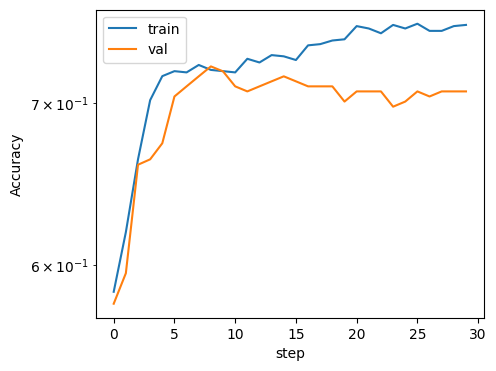

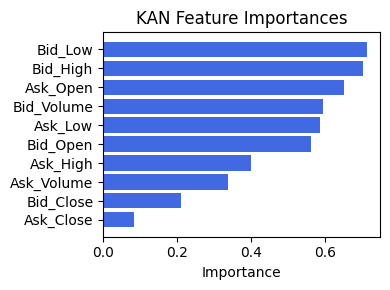

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex5', 0.7389286962776808), ('Ex4', 0.6506447589040127), ('Ex6', 0.4988876194655083), ('Ex3', 0.17390940014059764), ('Ex2', 0.03525665946455789), ('Ex1', 0.03319100422812601), ('Ask_Volume', 0.03265894651863399), ('Ask_High', 0.024158906186987933), ('Bid_Volume', 0.023105811393437196), ('Ask_Open', 0.019033643026973884), ('Ask_Close', 0.017330101590780196), ('Ask_Low', 0.014457661286638784), ('Bid_High', 0.002986999304924853), ('Bid_Open', 0.002804764716675675), ('Bid_Low', 0.002172417631552825), ('Bid_Close', 0.0017741382176877122)]


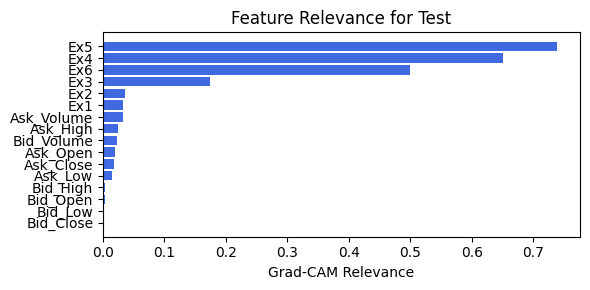

In [127]:
train_and_plot_relevance(Model3_2, kan_neurons=1, kan_grid=3, cnn_bottleneck_dim=-1, lamb=0.0001, steps=30, alpha=.5, filename=filename_2, opt_col_val=0.5)

### 2.2.3 width=[10, 1, 1], grid=3, lamb=0.0001 | alpha=0.5

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


 train_acc_hybrid: 7.49e-01 | val_acc_hybrid: 7.01e-01 |: 100%|█████| 30/30 [00:23<00:00,  1.29it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.2109e-01 at 15 epoch
tensor(0.7057, device='cuda:0')
[[134  49]
 [ 59 125]]
M_KAN Relevance: 0.009225815534591675
CNN Relevance: 0.9907741546630859
[('Bid_High', 0.77642584), ('Bid_Volume', 0.5625741), ('Bid_Low', 0.49745032), ('Bid_Open', 0.48427334), ('Ask_Low', 0.4701074), ('Bid_Close', 0.4519829), ('Ask_Open', 0.4319532), ('Ask_Volume', 0.28814095), ('Ask_Close', 0.14142056), ('Ask_High', 0.082926445)]


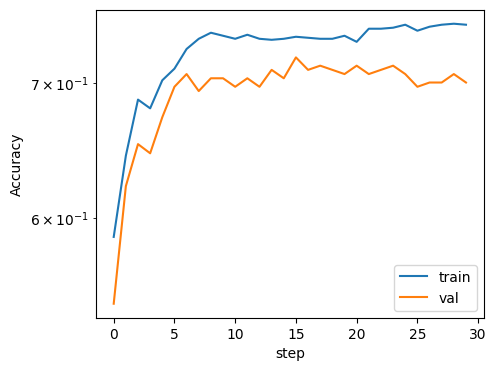

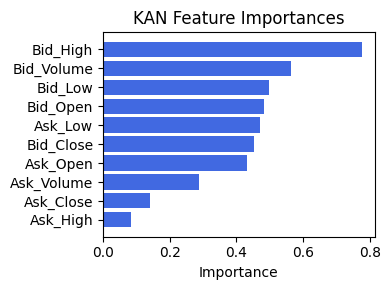

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ask_Low', 0.6083491043814481), ('Ex2', 0.5429098751213229), ('Bid_Close', 0.45274855043454865), ('Bid_Low', 0.27569201534832205), ('Bid_High', 0.23030078047074437), ('Ask_High', 0.11671969669614728), ('Bid_Open', 0.11126346611709662), ('Ask_Open', 0.10042835099493186), ('Ex1', 0.08206984332612936), ('Ask_Volume', 0.06763871218875933), ('Bid_Volume', 0.049380958986237684), ('Ex4', 0.04276383465171185), ('Ex5', 0.040871428512290565), ('Ex6', 0.03053074136499357), ('Ask_Close', 0.02886664275808275), ('Ex3', 0.028395519723826437)]


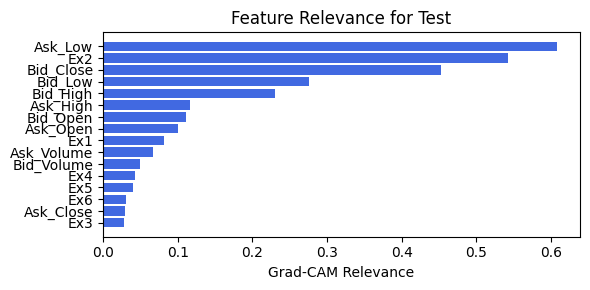

In [128]:
train_and_plot_relevance(Model3_2, kan_neurons=1, kan_grid=3, cnn_bottleneck_dim=-1, lamb=0.0001, steps=30, alpha=.5, filename=filename_2, opt_col_val=0.5)

### 2.2.4 width=[10, 1, 1], grid=3, lamb=0.0001 | alpha=0.25

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


 train_acc_hybrid: 7.48e-01 | val_acc_hybrid: 6.97e-01 |: 100%|█████| 30/30 [00:22<00:00,  1.34it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.1769e-01 at 6 epoch
tensor(0.7112, device='cuda:0')
[[128  55]
 [ 51 133]]
M_KAN Relevance: 0.008514808490872383
CNN Relevance: 0.9914851784706116
[('Bid_Close', 1.242622), ('Ask_Close', 0.8095439), ('Bid_High', 0.576147), ('Bid_Low', 0.49656463), ('Bid_Open', 0.4238597), ('Ask_Low', 0.2909212), ('Ask_Open', 0.20684804), ('Ask_High', 0.157746), ('Bid_Volume', 0.14007023), ('Ask_Volume', 0.12861624)]


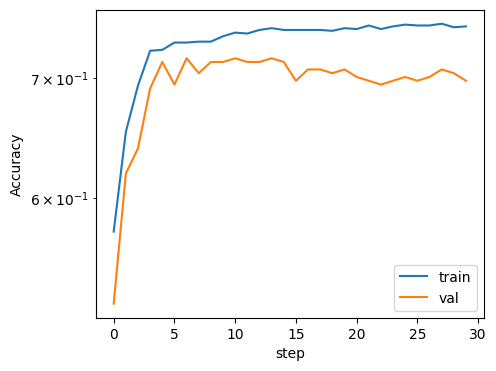

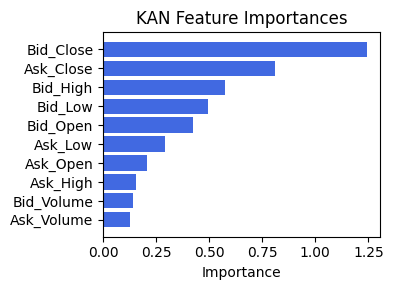

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ask_Low', 0.46071913089395095), ('Bid_Close', 0.4409255356603816), ('Ex2', 0.42647155366802453), ('Bid_Low', 0.18014539318157122), ('Bid_High', 0.15710641128044037), ('Ask_High', 0.08169766361219301), ('Bid_Open', 0.07544244101337012), ('Ask_Open', 0.0737557055603723), ('Ask_Close', 0.05293641027045844), ('Bid_Volume', 0.04677489770115455), ('Ask_Volume', 0.039645289915946264), ('Ex3', 0.03832453594870398), ('Ex1', 0.032397145313104204), ('Ex4', 0.03238626218804384), ('Ex5', 0.02778115364334645), ('Ex6', 0.010563828694705193)]


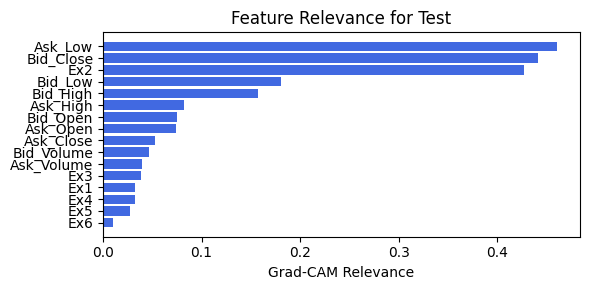

In [129]:
train_and_plot_relevance(Model3_2, kan_neurons=1, kan_grid=3, cnn_bottleneck_dim=-1, lamb=0.0001, steps=30, alpha=.25, filename=filename_2, opt_col_val=0.25)

### 2.2.5 width=[10, 1, 1], grid=3, lamb=0.0001 | alpha=0.25

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


 train_acc_hybrid: 7.49e-01 | val_acc_hybrid: 7.01e-01 |: 100%|█████| 30/30 [00:22<00:00,  1.34it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.2109e-01 at 15 epoch
tensor(0.7057, device='cuda:0')
[[134  49]
 [ 59 125]]
M_KAN Relevance: 0.009225815534591675
CNN Relevance: 0.9907741546630859
[('Bid_High', 0.77642584), ('Bid_Volume', 0.5625741), ('Bid_Low', 0.49745032), ('Bid_Open', 0.48427334), ('Ask_Low', 0.4701074), ('Bid_Close', 0.4519829), ('Ask_Open', 0.4319532), ('Ask_Volume', 0.28814095), ('Ask_Close', 0.14142056), ('Ask_High', 0.082926445)]


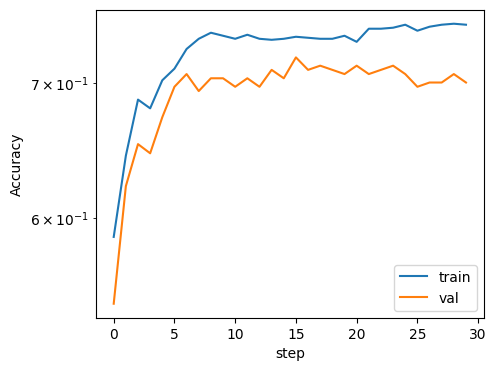

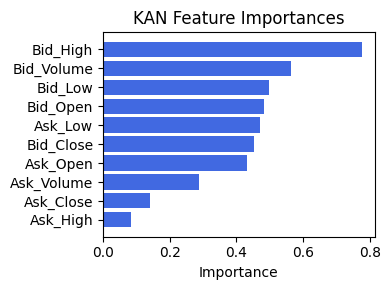

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ask_Low', 0.6083491043814481), ('Ex2', 0.5429098751213229), ('Bid_Close', 0.45274855043454865), ('Bid_Low', 0.27569201534832205), ('Bid_High', 0.23030078047074437), ('Ask_High', 0.11671969669614728), ('Bid_Open', 0.11126346611709662), ('Ask_Open', 0.10042835099493186), ('Ex1', 0.08206984332612936), ('Ask_Volume', 0.06763871218875933), ('Bid_Volume', 0.049380958986237684), ('Ex4', 0.04276383465171185), ('Ex5', 0.040871428512290565), ('Ex6', 0.03053074136499357), ('Ask_Close', 0.02886664275808275), ('Ex3', 0.028395519723826437)]


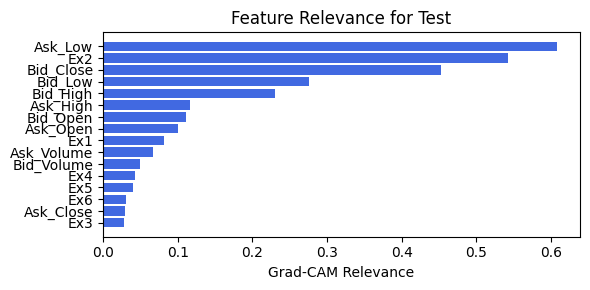

In [130]:
train_and_plot_relevance(Model3_2, kan_neurons=1, kan_grid=3, cnn_bottleneck_dim=-1, lamb=0.0001, steps=30, alpha=.5, filename=filename_2, opt_col_val=0.5)

### 2.2.6 width=[10, 1, 1], grid=3, lamb=0.0001 | alpha=0.25

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


 train_acc_hybrid: 7.43e-01 | val_acc_hybrid: 7.11e-01 |: 100%|█████| 30/30 [00:22<00:00,  1.32it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.2449e-01 at 11 epoch
tensor(0.7275, device='cuda:0')
[[133  50]
 [ 50 134]]
M_KAN Relevance: 0.028747495263814926
CNN Relevance: 0.9712525010108948
[('Bid_High', 0.83782697), ('Bid_Low', 0.77749026), ('Ask_Open', 0.7290888), ('Ask_Low', 0.679962), ('Bid_Open', 0.6494906), ('Bid_Volume', 0.5447879), ('Ask_High', 0.41113523), ('Ask_Volume', 0.33311298), ('Bid_Close', 0.26924023), ('Ask_Close', 0.07620128)]


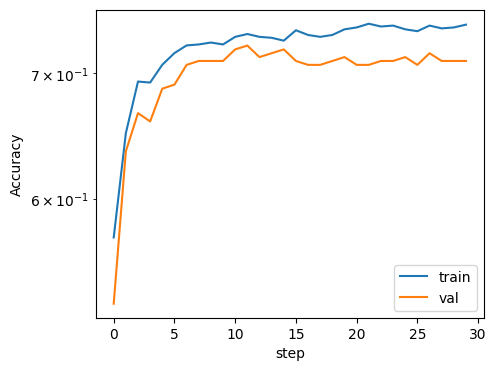

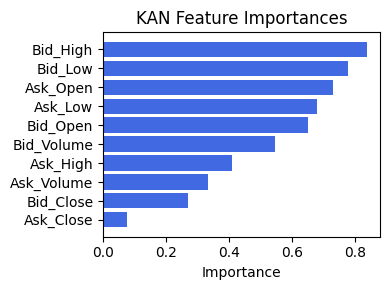

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex3', 0.4018335020326951), ('Ask_Low', 0.381801561764581), ('Bid_Close', 0.38053852084182566), ('Ex2', 0.3645175409881393), ('Bid_Low', 0.31744029591550255), ('Ask_Volume', 0.3070765818669063), ('Ask_Close', 0.29829128559079904), ('Ex1', 0.2745186704463435), ('Ask_High', 0.2721440048294512), ('Bid_High', 0.2579945453851197), ('Ask_Open', 0.24851085464102127), ('Bid_Volume', 0.1928201141375135), ('Ex4', 0.061741996579711335), ('Bid_Open', 0.05082704042901643), ('Ex5', 0.04639428259259406), ('Ex6', 0.01687193427701818)]


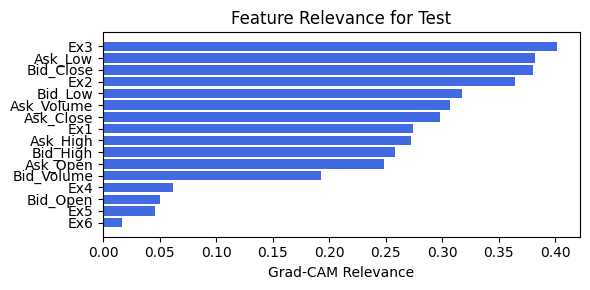

In [131]:
train_and_plot_relevance(Model3_2, kan_neurons=1, kan_grid=3, cnn_bottleneck_dim=-1, lamb=0.0001, steps=30, alpha=.25, filename=filename_2, opt_col_val=0.25)

### 2.2.7. width=[10, 1, 1], grid=3, lamb=0.0001 | alpha=0.1

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


 train_acc_hybrid: 7.51e-01 | val_acc_hybrid: 6.97e-01 |: 100%|█████| 30/30 [00:22<00:00,  1.31it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.1769e-01 at 5 epoch
tensor(0.7139, device='cuda:0')
[[128  55]
 [ 50 134]]
M_KAN Relevance: 0.021077442914247513
CNN Relevance: 0.9789225459098816
[('Bid_Close', 1.0683007), ('Ask_Close', 0.79207665), ('Bid_High', 0.6007033), ('Bid_Open', 0.5804809), ('Ask_Low', 0.40876198), ('Bid_Low', 0.35746065), ('Ask_Open', 0.18300515), ('Ask_High', 0.14988044), ('Bid_Volume', 0.13189523), ('Ask_Volume', 0.123169206)]


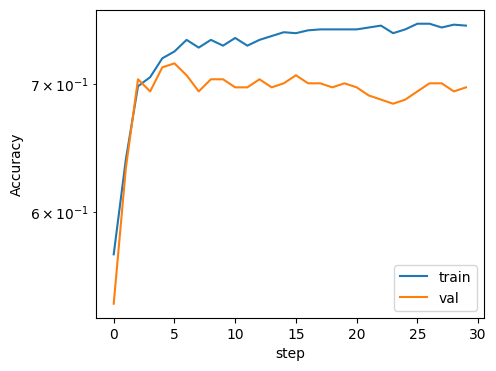

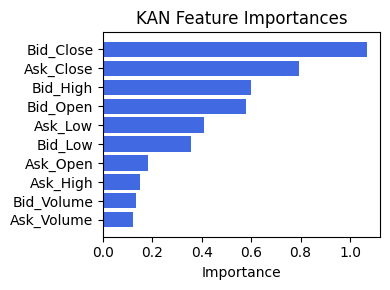

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex2', 0.5927029375636529), ('Ask_Low', 0.4991265502897896), ('Bid_Close', 0.2286491963862662), ('Ex6', 0.04469755480994727), ('Bid_Low', 0.020554224881541006), ('Ask_High', 0.020554224881541006), ('Ask_Open', 0.016094213522899622), ('Bid_High', 0.016028641871549697), ('Ex5', 0.009511017151260117), ('Ex4', 0.00660107368654102), ('Bid_Open', 0.003593541974866666), ('Ex1', 0.0029551255103960864), ('Ex3', 0.0017349966319546875), ('Bid_Volume', 0.0009604234068225613), ('Ask_Volume', 0.00014233402273432436), ('Ask_Close', 0.0001094787970327389)]


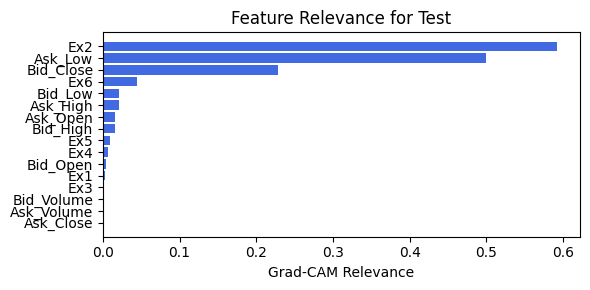

In [132]:
train_and_plot_relevance(Model3_2, kan_neurons=1, kan_grid=3, cnn_bottleneck_dim=-1, lamb=0.0001, steps=30, alpha=.1, filename=filename_2, opt_col_val=0.1)

### 2.2.8 width=[10, 1, 1], grid=3, lamb=0.0001 | alpha=0.1

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


 train_acc_hybrid: 7.60e-01 | val_acc_hybrid: 7.04e-01 |: 100%|█████| 30/30 [00:22<00:00,  1.31it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.1429e-01 at 20 epoch
tensor(0.7112, device='cuda:0')
[[137  46]
 [ 60 124]]
M_KAN Relevance: 0.018269654363393784
CNN Relevance: 0.9817304015159607
[('Bid_Close', 1.3244977), ('Bid_High', 1.3008738), ('Bid_Open', 1.2585175), ('Bid_Low', 0.98148495), ('Ask_Close', 0.7932711), ('Ask_Low', 0.77672887), ('Bid_Volume', 0.2670721), ('Ask_Open', 0.23777208), ('Ask_High', 0.164834), ('Ask_Volume', 0.10664501)]


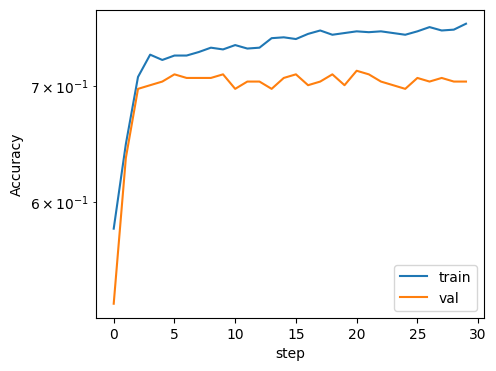

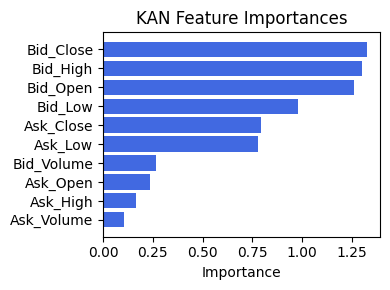

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex2', 0.5991458942487516), ('Ask_Low', 0.5510656078068834), ('Bid_Close', 0.30542110479804774), ('Ex6', 0.09185933422638079), ('Ex1', 0.0872106771465002), ('Ex3', 0.08561976658616834), ('Ask_High', 0.07647542609302334), ('Ask_Close', 0.06504866041811513), ('Bid_Low', 0.06061433602686069), ('Bid_Volume', 0.05854504175060073), ('Ex5', 0.05515380086321276), ('Ex4', 0.05488609026277524), ('Ask_Open', 0.04886055200542158), ('Bid_High', 0.04452682248277372), ('Bid_Open', 0.0431960356539314), ('Ask_Volume', 0.03976233977804148)]


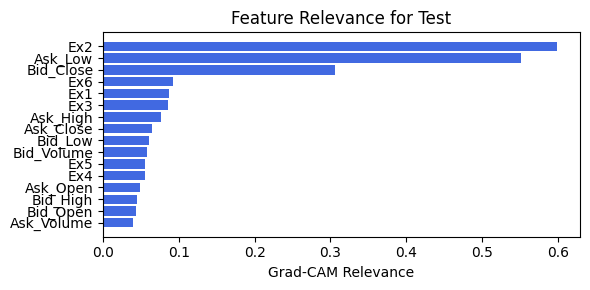

In [133]:
train_and_plot_relevance(Model3_2, kan_neurons=1, kan_grid=3, cnn_bottleneck_dim=-1, lamb=0.0001, steps=30, alpha=.1, filename=filename_2, opt_col_val=0.1)

### 2.2.9. width=[10, 1, 1], grid=3, lamb=0.0001 | alpha=0.01

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


 train_acc_hybrid: 7.60e-01 | val_acc_hybrid: 7.04e-01 |: 100%|█████| 30/30 [00:22<00:00,  1.30it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.1429e-01 at 20 epoch
tensor(0.7112, device='cuda:0')
[[137  46]
 [ 60 124]]
M_KAN Relevance: 0.018269654363393784
CNN Relevance: 0.9817304015159607
[('Bid_Close', 1.3244977), ('Bid_High', 1.3008738), ('Bid_Open', 1.2585175), ('Bid_Low', 0.98148495), ('Ask_Close', 0.7932711), ('Ask_Low', 0.77672887), ('Bid_Volume', 0.2670721), ('Ask_Open', 0.23777208), ('Ask_High', 0.164834), ('Ask_Volume', 0.10664501)]


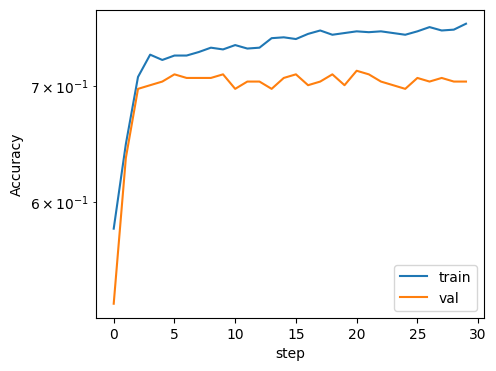

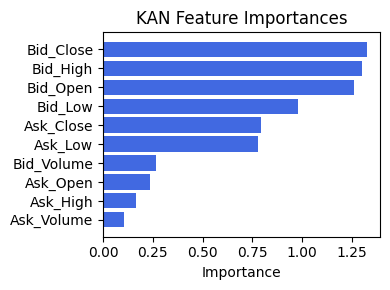

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex2', 0.5991458942487516), ('Ask_Low', 0.5510656078068834), ('Bid_Close', 0.30542110479804774), ('Ex6', 0.09185933422638079), ('Ex1', 0.0872106771465002), ('Ex3', 0.08561976658616834), ('Ask_High', 0.07647542609302334), ('Ask_Close', 0.06504866041811513), ('Bid_Low', 0.06061433602686069), ('Bid_Volume', 0.05854504175060073), ('Ex5', 0.05515380086321276), ('Ex4', 0.05488609026277524), ('Ask_Open', 0.04886055200542158), ('Bid_High', 0.04452682248277372), ('Bid_Open', 0.0431960356539314), ('Ask_Volume', 0.03976233977804148)]


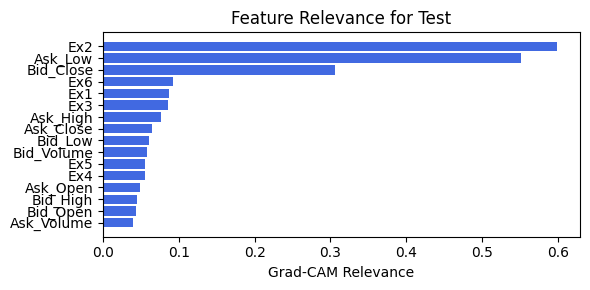

In [134]:
train_and_plot_relevance(Model3_2, kan_neurons=1, kan_grid=3, cnn_bottleneck_dim=-1, lamb=0.0001, steps=30, alpha=.1, filename=filename_2, opt_col_val=0.1)

### 2.2.10. width=[10, 1, 1], grid=3, lamb=0.0001 | alpha=0.01

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


 train_acc_hybrid: 7.50e-01 | val_acc_hybrid: 7.01e-01 |: 100%|█████| 30/30 [00:23<00:00,  1.28it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.3129e-01 at 10 epoch
tensor(0.6975, device='cuda:0')
[[125  58]
 [ 53 131]]
M_KAN Relevance: 0.016926156356930733
CNN Relevance: 0.983073890209198
[('Bid_Close', 0.52090394), ('Ask_High', 0.46949765), ('Bid_High', 0.3806182), ('Ask_Open', 0.3417668), ('Ask_Close', 0.34008795), ('Bid_Open', 0.2780117), ('Bid_Low', 0.18535228), ('Bid_Volume', 0.16120066), ('Ask_Low', 0.14222685), ('Ask_Volume', 0.12850587)]


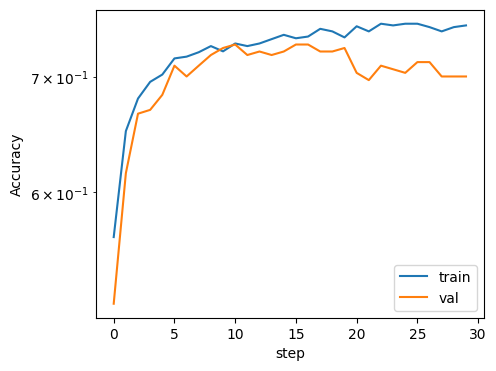

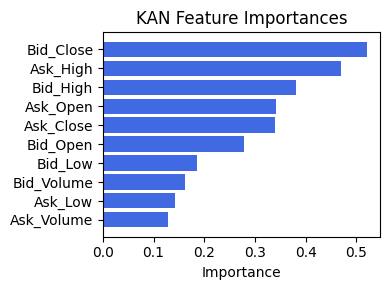

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex2', 0.23037990154945914), ('Ask_Low', 0.20459939568302415), ('Ex1', 0.12131316663173335), ('Ask_High', 0.11016188854576382), ('Bid_Close', 0.09501050058105591), ('Bid_Low', 0.047441745596200804), ('Ex6', 0.030292283311265468), ('Ex5', 0.02287722562791206), ('Ask_Volume', 0.021646509053596684), ('Ask_Open', 0.020182752305811794), ('Ex4', 0.012330795102816186), ('Bid_High', 0.01113222424627335), ('Ex3', 0.009501164444095432), ('Ask_Close', 0.00865988370426994), ('Bid_Volume', 0.005436958120856688), ('Bid_Open', 0.002901786449809409)]


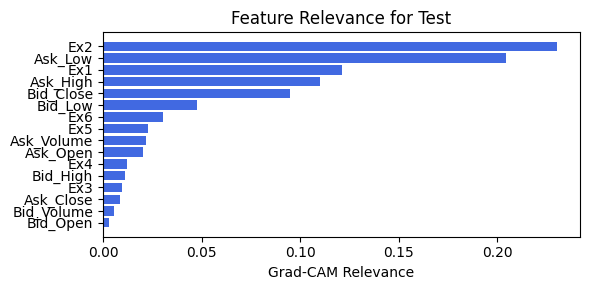

In [135]:
train_and_plot_relevance(Model3_2, kan_neurons=1, kan_grid=3, cnn_bottleneck_dim=-1, lamb=0.0001, steps=30, alpha=.01, filename=filename_2, opt_col_val=0.01)

### 2.2.11. width=[10, 1, 1], grid=3, lamb=0.0001 | alpha=0.01

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


 train_acc_hybrid: 7.50e-01 | val_acc_hybrid: 7.01e-01 |: 100%|█████| 30/30 [00:22<00:00,  1.31it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.3129e-01 at 10 epoch
tensor(0.6975, device='cuda:0')
[[125  58]
 [ 53 131]]
M_KAN Relevance: 0.016926156356930733
CNN Relevance: 0.983073890209198
[('Bid_Close', 0.52090394), ('Ask_High', 0.46949765), ('Bid_High', 0.3806182), ('Ask_Open', 0.3417668), ('Ask_Close', 0.34008795), ('Bid_Open', 0.2780117), ('Bid_Low', 0.18535228), ('Bid_Volume', 0.16120066), ('Ask_Low', 0.14222685), ('Ask_Volume', 0.12850587)]


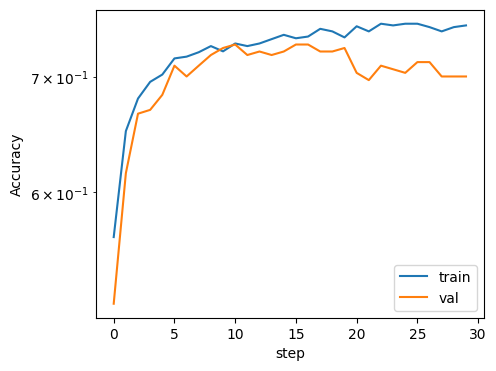

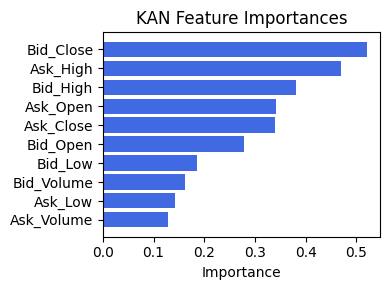

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex2', 0.23037990154945914), ('Ask_Low', 0.20459939568302415), ('Ex1', 0.12131316663173335), ('Ask_High', 0.11016188854576382), ('Bid_Close', 0.09501050058105591), ('Bid_Low', 0.047441745596200804), ('Ex6', 0.030292283311265468), ('Ex5', 0.02287722562791206), ('Ask_Volume', 0.021646509053596684), ('Ask_Open', 0.020182752305811794), ('Ex4', 0.012330795102816186), ('Bid_High', 0.01113222424627335), ('Ex3', 0.009501164444095432), ('Ask_Close', 0.00865988370426994), ('Bid_Volume', 0.005436958120856688), ('Bid_Open', 0.002901786449809409)]


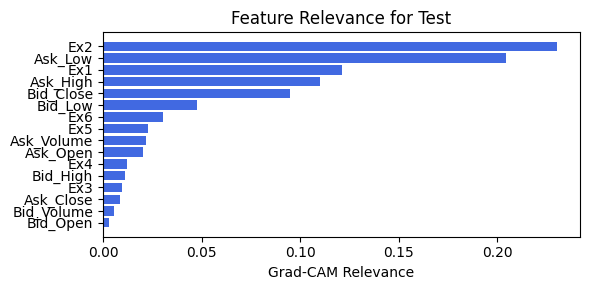

In [136]:
train_and_plot_relevance(Model3_2, kan_neurons=1, kan_grid=3, cnn_bottleneck_dim=-1, lamb=0.0001, steps=30, alpha=.01, filename=filename_2, opt_col_val=0.01)

## 2.3 width=[10, 4], grid=3, lamb=0.0001

### 2.3.0a width=[10, 4], grid=3, lamb=0.0001 | alpha=0.75

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


 train_acc_hybrid: 7.58e-01 | val_acc_hybrid: 6.90e-01 |: 100%|█████| 40/40 [00:29<00:00,  1.34it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.1088e-01 at 10 epoch
tensor(0.6866, device='cuda:0')
[[128  55]
 [ 60 124]]
M_KAN Relevance: 0.025616375729441643
CNN Relevance: 0.9743835926055908
[('Ask_High', 0.45967874), ('Bid_Open', 0.44110158), ('Bid_Close', 0.3850761), ('Bid_High', 0.27451605), ('Bid_Volume', 0.26859117), ('Ask_Open', 0.21955077), ('Ask_Close', 0.21466258), ('Ask_Low', 0.17883988), ('Bid_Low', 0.1710875), ('Ask_Volume', 0.15660924)]


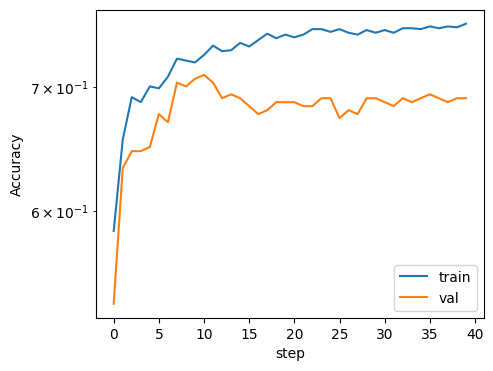

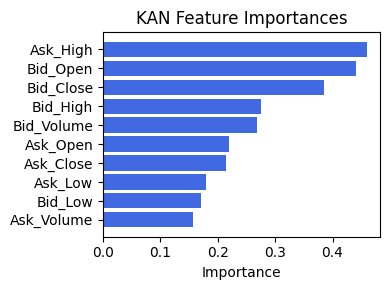

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex2', 0.41594095192329417), ('Ask_Low', 0.41565126790703155), ('Bid_Close', 0.27121277814934014), ('Ex5', 0.1603120182413571), ('Ex4', 0.136614319139997), ('Ex6', 0.10347531380584496), ('Ask_Close', 0.07455978684580304), ('Bid_Volume', 0.069449514369493), ('Ask_High', 0.06763312287948396), ('Ask_Open', 0.06665776917781954), ('Ex1', 0.06173530670992487), ('Bid_Low', 0.051947955051640037), ('Bid_Open', 0.04845199355289685), ('Ask_Volume', 0.03945450954030113), ('Ex3', 0.039293967652986615), ('Bid_High', 0.037622817228954254)]


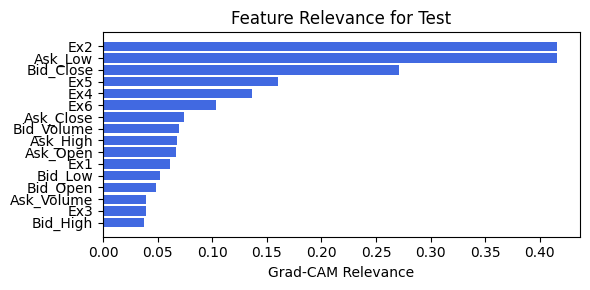

In [137]:
train_and_plot_relevance(Model3_2, kan_neurons=4, kan_grid=3, cnn_bottleneck_dim=-1, lamb=0.0001, steps=40, alpha=.75, filename=filename_2, opt_col_val=0.75)

### 2.3.0 width=[10, 4], grid=3, lamb=0.0001 | alpha=0.75

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


 train_acc_hybrid: 7.41e-01 | val_acc_hybrid: 6.97e-01 |: 100%|█████| 30/30 [00:22<00:00,  1.32it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.2449e-01 at 12 epoch
tensor(0.7003, device='cuda:0')
[[133  50]
 [ 60 124]]
M_KAN Relevance: 0.011179621331393719
CNN Relevance: 0.9888203740119934
[('Bid_Close', 1.1003861), ('Ask_High', 0.9680707), ('Bid_Open', 0.72805613), ('Bid_Low', 0.6581465), ('Bid_High', 0.54957676), ('Ask_Close', 0.45304942), ('Bid_Volume', 0.4092028), ('Ask_Open', 0.40253735), ('Ask_Low', 0.26964703), ('Ask_Volume', 0.25475764)]


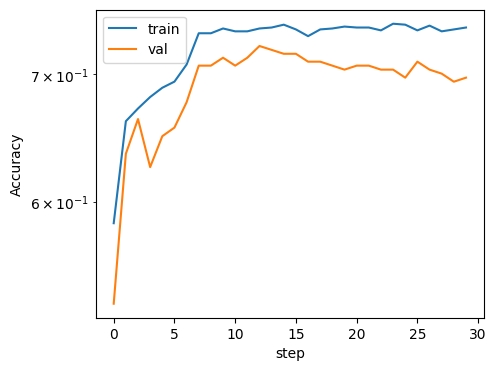

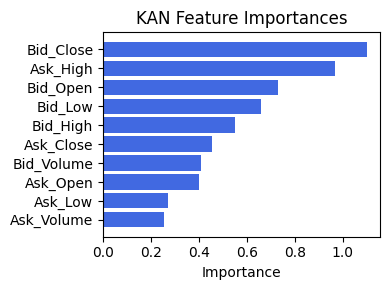

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ask_Low', 0.5006347307656214), ('Ex2', 0.44015723186207567), ('Bid_Close', 0.4018960572444207), ('Bid_Open', 0.17905111196552395), ('Bid_High', 0.11829830249086307), ('Bid_Low', 0.11429377352407745), ('Bid_Volume', 0.10805993052472282), ('Ask_Close', 0.09655280231886128), ('Ex5', 0.044289165865373), ('Ex4', 0.04201181902031843), ('Ask_Open', 0.020695713508559508), ('Ex6', 0.019910893985333595), ('Ask_High', 0.014908163884416101), ('Ex3', 0.014053427973826865), ('Ex1', 0.011662302401718717), ('Ask_Volume', 0.010753726165447314)]


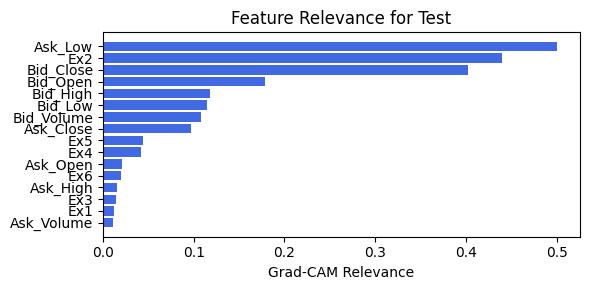

In [138]:
train_and_plot_relevance(Model3_2, kan_neurons=4, kan_grid=3, cnn_bottleneck_dim=-1, lamb=0.0001, steps=30, alpha=.75, filename=filename_2, opt_col_val=0.75)

### 2.3.1 width=[10, 4], grid=3, lamb=0.0001 | alpha=0.75

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


 train_acc_hybrid: 7.46e-01 | val_acc_hybrid: 7.14e-01 |: 100%|█████| 30/30 [00:24<00:00,  1.25it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.2109e-01 at 27 epoch
tensor(0.6894, device='cuda:0')
[[126  57]
 [ 57 127]]
M_KAN Relevance: 0.005410617683082819
CNN Relevance: 0.9945893883705139
[('Bid_Close', 0.7389169), ('Ask_High', 0.6199792), ('Bid_Low', 0.55065495), ('Bid_Open', 0.4993934), ('Ask_Close', 0.46618396), ('Ask_Low', 0.39482802), ('Ask_Open', 0.3684315), ('Bid_Volume', 0.3600468), ('Bid_High', 0.32050595), ('Ask_Volume', 0.20549205)]


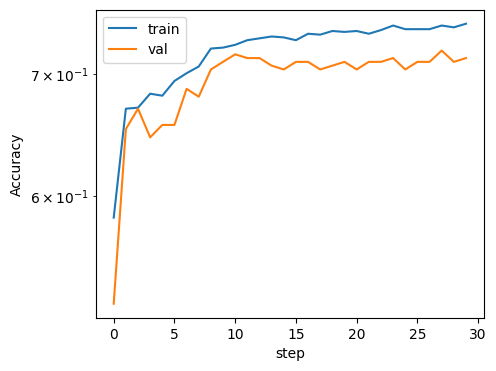

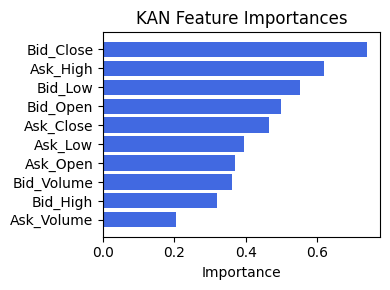

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ask_Low', 0.4442896756105003), ('Ex2', 0.4438697196459474), ('Bid_Close', 0.3801980674411462), ('Ex1', 0.1724288722394575), ('Bid_Low', 0.1424733738247061), ('Ask_High', 0.14048949731919091), ('Ex4', 0.1117516439858301), ('Ex5', 0.10752846228567996), ('Bid_High', 0.10201838243548436), ('Ask_Volume', 0.10010577697104532), ('Ask_Open', 0.09093838012867674), ('Ex3', 0.06825345621838178), ('Ex6', 0.05358903159801207), ('Bid_Open', 0.05110961887235271), ('Ask_Close', 0.05030174348502756), ('Bid_Volume', 0.0387537196603393)]


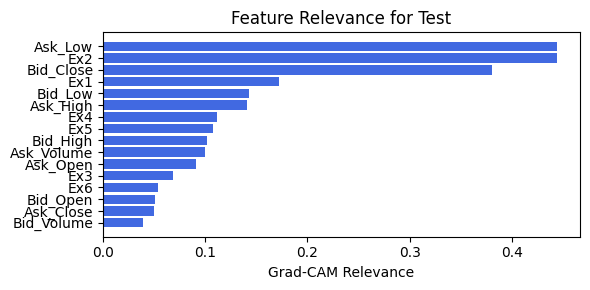

In [139]:
train_and_plot_relevance(Model3_2, kan_neurons=4, kan_grid=3, cnn_bottleneck_dim=-1, lamb=0.0001, steps=30, alpha=.75, filename=filename_2, opt_col_val=0.75)

### 2.3.2 width=[10, 4], grid=3, lamb=0.0001 | alpha=0.5

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


 train_acc_hybrid: 7.49e-01 | val_acc_hybrid: 6.80e-01 |: 100%|█████| 30/30 [00:22<00:00,  1.32it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.2789e-01 at 10 epoch
tensor(0.7084, device='cuda:0')
[[129  54]
 [ 53 131]]
M_KAN Relevance: 0.06617855280637741
CNN Relevance: 0.933821439743042
[('Bid_Close', 0.42922834), ('Ask_High', 0.4243631), ('Bid_Low', 0.40913397), ('Ask_Close', 0.3324014), ('Ask_Low', 0.28889364), ('Bid_Volume', 0.22714724), ('Bid_High', 0.20395836), ('Bid_Open', 0.18900144), ('Ask_Volume', 0.17574373), ('Ask_Open', 0.17029266)]


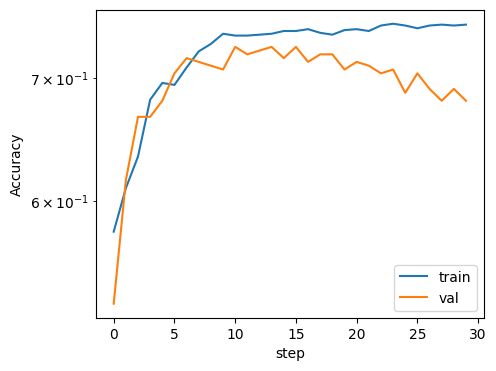

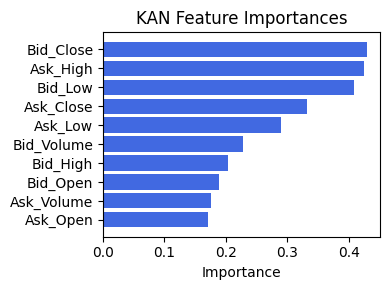

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex1', 0.3695846497911036), ('Ex2', 0.3182717294112477), ('Ex5', 0.2790912308245491), ('Ask_High', 0.2282147787267733), ('Ex4', 0.22277402909528413), ('Ask_Low', 0.20316379893398578), ('Ask_Volume', 0.13443636154497107), ('Ex6', 0.10763741185639956), ('Ask_Open', 0.07139623021816058), ('Ex3', 0.06934965249865978), ('Bid_Low', 0.06298910564637035), ('Bid_Close', 0.058204434163220055), ('Ask_Close', 0.038531060454974744), ('Bid_High', 0.030686153871342235), ('Bid_Volume', 0.02808752803736457), ('Bid_Open', 0.01949029234283964)]


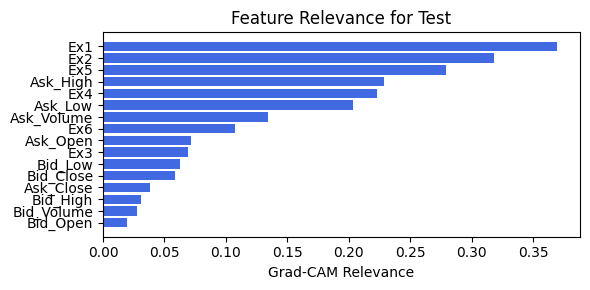

In [140]:
train_and_plot_relevance(Model3_2, kan_neurons=4, kan_grid=3, cnn_bottleneck_dim=-1, lamb=0.0001, steps=30, alpha=.5, filename=filename_2, opt_col_val=0.5)

### 2.3.3 width=[10, 4], grid=3, lamb=0.0001 | alpha=0.5

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


 train_acc_hybrid: 7.52e-01 | val_acc_hybrid: 6.87e-01 |: 100%|█████| 30/30 [00:22<00:00,  1.33it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.1769e-01 at 6 epoch
tensor(0.7193, device='cuda:0')
[[133  50]
 [ 53 131]]
M_KAN Relevance: 0.04764633625745773
CNN Relevance: 0.9523537158966064
[('Bid_Close', 0.7761787), ('Ask_High', 0.7115947), ('Bid_Open', 0.5870163), ('Bid_High', 0.5829951), ('Bid_Low', 0.464156), ('Ask_Volume', 0.40393806), ('Ask_Open', 0.3819782), ('Ask_Close', 0.3786637), ('Bid_Volume', 0.31108934), ('Ask_Low', 0.18615428)]


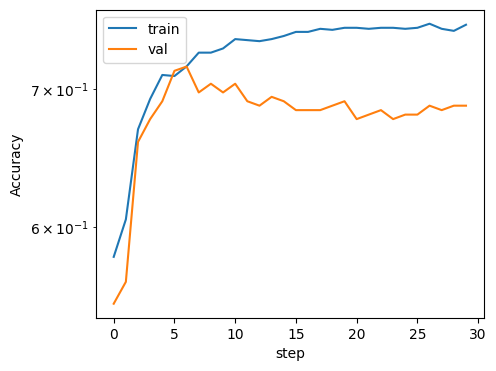

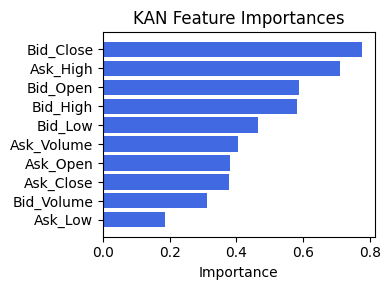

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex2', 0.49051848756991917), ('Ex1', 0.47523192486824717), ('Ask_Low', 0.31868106349845915), ('Ex5', 0.2870875967905047), ('Ask_High', 0.2464289871889499), ('Ex4', 0.2299119564032116), ('Ask_Volume', 0.21076169622711818), ('Ex6', 0.12540305101589302), ('Ask_Open', 0.08666893771620549), ('Bid_Close', 0.06376435831081305), ('Ex3', 0.060375454427029844), ('Bid_Low', 0.04090267995833), ('Ask_Close', 0.027281837676544244), ('Bid_Volume', 0.01523215622308157), ('Bid_High', 0.01386838817824397), ('Bid_Open', 0.009116728417067826)]


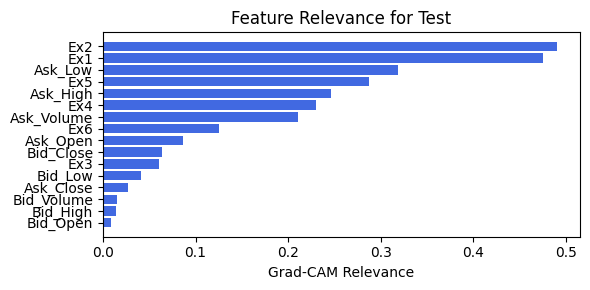

In [141]:
train_and_plot_relevance(Model3_2, kan_neurons=4, kan_grid=3, cnn_bottleneck_dim=-1, lamb=0.0001, steps=30, alpha=.5, filename=filename_2, opt_col_val=0.5)

### 2.3.4 width=[10, 4], grid=3, lamb=0.0001 | alpha=0.25

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


 train_acc_hybrid: 7.49e-01 | val_acc_hybrid: 7.04e-01 |: 100%|█████| 30/30 [00:22<00:00,  1.32it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.2109e-01 at 20 epoch
tensor(0.6921, device='cuda:0')
[[127  56]
 [ 57 127]]
M_KAN Relevance: 0.06737004220485687
CNN Relevance: 0.9326299428939819
[('Ask_High', 0.88471735), ('Bid_Close', 0.7751097), ('Bid_Open', 0.6597364), ('Bid_High', 0.62760866), ('Ask_Open', 0.45424187), ('Bid_Low', 0.4384379), ('Ask_Close', 0.37193754), ('Ask_Volume', 0.3316612), ('Bid_Volume', 0.29726627), ('Ask_Low', 0.15333669)]


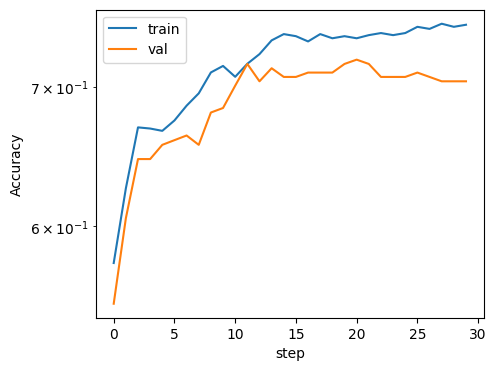

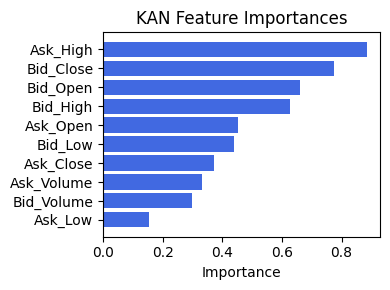

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex6', 0.7117157993427089), ('Ex5', 0.5634187095131147), ('Ex4', 0.3812529646943143), ('Ask_Low', 0.2383903304815333), ('Bid_High', 0.19306030758588044), ('Bid_Low', 0.1830855491989843), ('Ex2', 0.15893001213659627), ('Bid_Open', 0.15187919285079865), ('Bid_Close', 0.1379844195447984), ('Ask_High', 0.11494589658905764), ('Ex1', 0.05767890520403999), ('Ask_Open', 0.04855005419369005), ('Ex3', 0.02150670057189605), ('Bid_Volume', 0.019253375325315476), ('Ask_Close', 0.010235415101184558), ('Ask_Volume', 0.0077972154335083305)]


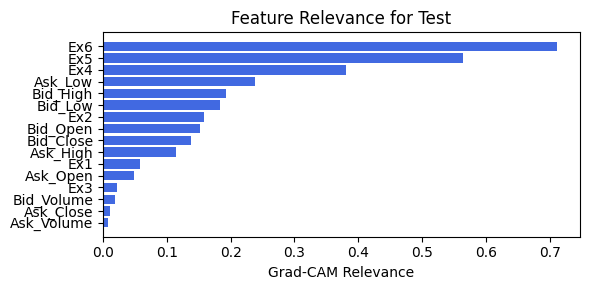

In [142]:
train_and_plot_relevance(Model3_2, kan_neurons=4, kan_grid=3, cnn_bottleneck_dim=-1, lamb=0.0001, steps=30, alpha=.25, filename=filename_2, opt_col_val=0.25)

### 2.3.5 width=[10, 4], grid=3, lamb=0.0001 | alpha=0.25

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


 train_acc_hybrid: 7.44e-01 | val_acc_hybrid: 6.90e-01 |: 100%|█████| 30/30 [00:22<00:00,  1.32it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.1088e-01 at 14 epoch
tensor(0.7030, device='cuda:0')
[[125  58]
 [ 51 133]]
M_KAN Relevance: 0.031121859326958656
CNN Relevance: 0.9688780903816223
[('Bid_Close', 0.4707415), ('Ask_Close', 0.36366203), ('Ask_Open', 0.34073052), ('Bid_High', 0.3400695), ('Bid_Low', 0.32218248), ('Ask_Low', 0.29738855), ('Ask_High', 0.28186), ('Bid_Volume', 0.14350595), ('Bid_Open', 0.10413278), ('Ask_Volume', 0.09289722)]


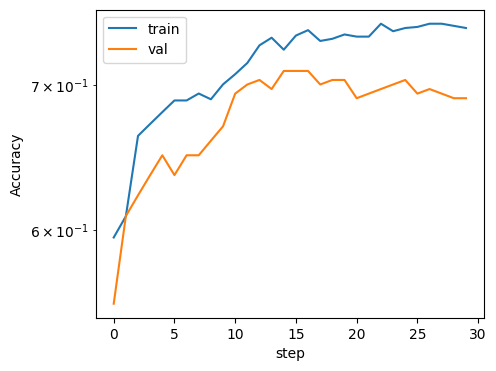

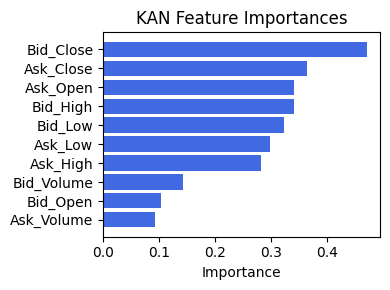

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex6', 0.6637021578265968), ('Ex5', 0.47615105901750904), ('Ex4', 0.2911902544572721), ('Ex2', 0.28389013294709153), ('Ask_High', 0.21619368725448684), ('Ex1', 0.19181268569589555), ('Ask_Low', 0.18846571597471143), ('Bid_High', 0.10786286943620045), ('Bid_Open', 0.10031981929776332), ('Ask_Open', 0.0877553374073227), ('Ask_Volume', 0.054886853625637555), ('Ask_Close', 0.05400196190292843), ('Bid_Close', 0.05285919687364311), ('Bid_Low', 0.052363231283617626), ('Bid_Volume', 0.04799589311176047), ('Ex3', 0.016922131908438307)]


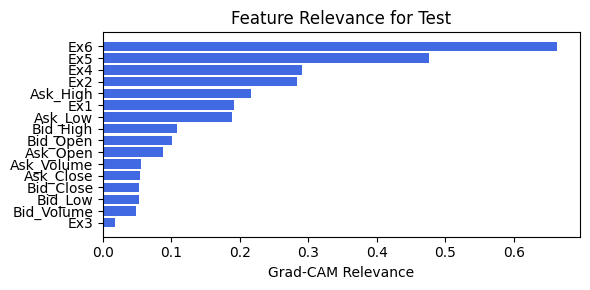

In [143]:
train_and_plot_relevance(Model3_2, kan_neurons=4, kan_grid=3, cnn_bottleneck_dim=-1, lamb=0.0001, steps=30, alpha=.25, filename=filename_2, opt_col_val=0.25)

### 2.3.6 width=[10, 4], grid=3, lamb=0.0001 | alpha=0.1

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


 train_acc_hybrid: 7.49e-01 | val_acc_hybrid: 6.84e-01 |: 100%|█████| 30/30 [00:22<00:00,  1.33it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.4150e-01 at 7 epoch
tensor(0.7057, device='cuda:0')
[[132  51]
 [ 57 127]]
M_KAN Relevance: 0.06729483604431152
CNN Relevance: 0.9327051639556885
[('Bid_Close', 0.34009945), ('Ask_High', 0.3016449), ('Ask_Close', 0.28092912), ('Bid_Open', 0.26413047), ('Bid_Volume', 0.2545218), ('Bid_High', 0.19230215), ('Ask_Open', 0.16308986), ('Bid_Low', 0.13815655), ('Ask_Low', 0.12083323), ('Ask_Volume', 0.09378566)]


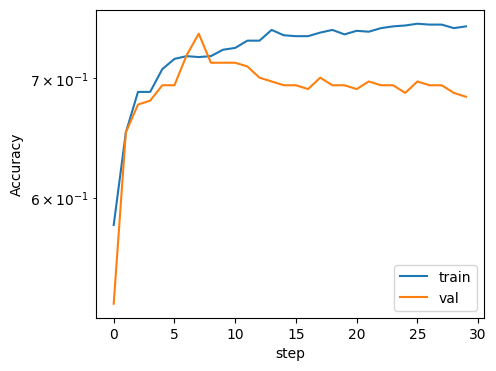

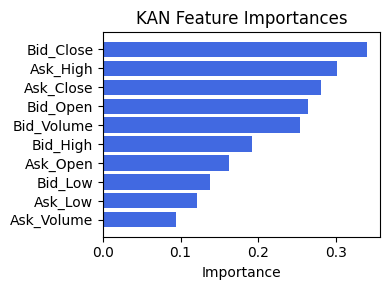

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Bid_Open', 0.22921753886353008), ('Ask_Close', 0.21315882819874735), ('Ask_Open', 0.21176667103216518), ('Bid_High', 0.20800968288375465), ('Ask_High', 0.20705578671400346), ('Bid_Low', 0.19075426606116283), ('Bid_Volume', 0.18581189539116028), ('Ex6', 0.17411070145253912), ('Ask_Low', 0.14170628435318472), ('Ask_Volume', 0.13988383763091644), ('Ex2', 0.13366183650174573), ('Ex1', 0.09599756850205661), ('Bid_Close', 0.09455125967398469), ('Ex4', 0.0874823094372691), ('Ex3', 0.07673569788207231), ('Ex5', 0.07118408134310539)]


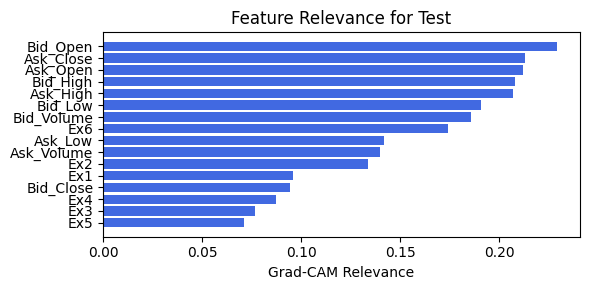

In [144]:
train_and_plot_relevance(Model3_2, kan_neurons=4, kan_grid=3, cnn_bottleneck_dim=-1, lamb=0.0001, steps=30, alpha=.1, filename=filename_2, opt_col_val=0.1)

### 2.3.7 width=[10, 4], grid=3, lamb=0.0001 | alpha=0.1

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


 train_acc_hybrid: 7.49e-01 | val_acc_hybrid: 6.84e-01 |: 100%|█████| 30/30 [00:23<00:00,  1.26it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.4150e-01 at 7 epoch
tensor(0.7057, device='cuda:0')
[[132  51]
 [ 57 127]]
M_KAN Relevance: 0.06729483604431152
CNN Relevance: 0.9327051639556885
[('Bid_Close', 0.34009945), ('Ask_High', 0.3016449), ('Ask_Close', 0.28092912), ('Bid_Open', 0.26413047), ('Bid_Volume', 0.2545218), ('Bid_High', 0.19230215), ('Ask_Open', 0.16308986), ('Bid_Low', 0.13815655), ('Ask_Low', 0.12083323), ('Ask_Volume', 0.09378566)]


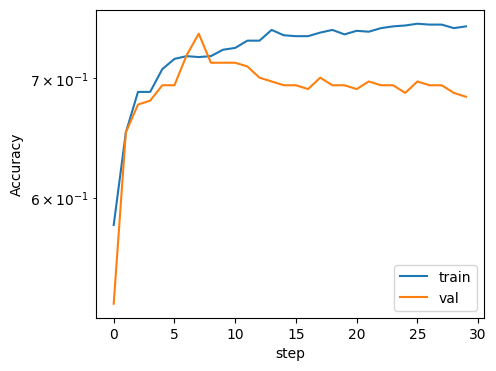

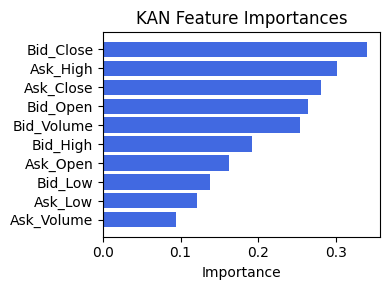

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Bid_Open', 0.22921753886353008), ('Ask_Close', 0.21315882819874735), ('Ask_Open', 0.21176667103216518), ('Bid_High', 0.20800968288375465), ('Ask_High', 0.20705578671400346), ('Bid_Low', 0.19075426606116283), ('Bid_Volume', 0.18581189539116028), ('Ex6', 0.17411070145253912), ('Ask_Low', 0.14170628435318472), ('Ask_Volume', 0.13988383763091644), ('Ex2', 0.13366183650174573), ('Ex1', 0.09599756850205661), ('Bid_Close', 0.09455125967398469), ('Ex4', 0.0874823094372691), ('Ex3', 0.07673569788207231), ('Ex5', 0.07118408134310539)]


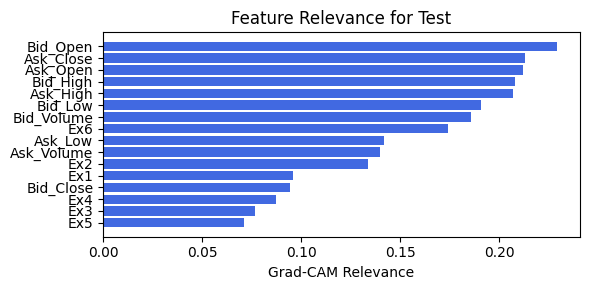

In [145]:
train_and_plot_relevance(Model3_2, kan_neurons=4, kan_grid=3, cnn_bottleneck_dim=-1, lamb=0.0001, steps=30, alpha=.1, filename=filename_2, opt_col_val=0.1)

### 2.3.8 width=[10, 4], grid=3, lamb=0.0001 | alpha=0.05

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


 train_acc_hybrid: 7.52e-01 | val_acc_hybrid: 6.97e-01 |: 100%|█████| 30/30 [00:23<00:00,  1.30it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.2449e-01 at 2 epoch
tensor(0.6921, device='cuda:0')
[[125  58]
 [ 55 129]]
M_KAN Relevance: 0.026160607114434242
CNN Relevance: 0.9738393425941467
[('Bid_Close', 0.5511038), ('Bid_Volume', 0.40854976), ('Bid_Open', 0.39996937), ('Ask_High', 0.3859857), ('Ask_Close', 0.36899742), ('Bid_High', 0.28458855), ('Ask_Low', 0.22149728), ('Ask_Open', 0.19144273), ('Bid_Low', 0.18588601), ('Ask_Volume', 0.18588533)]


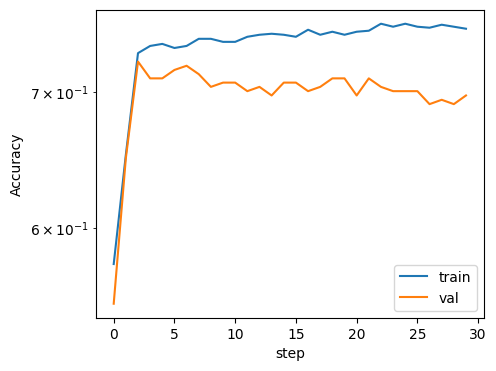

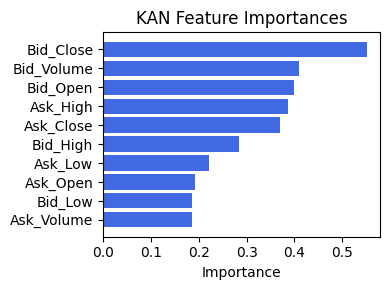

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex2', 0.7007964709799036), ('Ask_Low', 0.5215660213855696), ('Ex6', 0.36264139389472044), ('Ex5', 0.22835528625940463), ('Ex4', 0.19339883942328323), ('Bid_Close', 0.1726184443699777), ('Ex3', 0.06084039893219557), ('Bid_Low', 0.03531853487662469), ('Bid_High', 0.027458960824831305), ('Bid_Open', 0.01566656433436704), ('Ask_Volume', 0.005735148683352756), ('Ask_Close', 0.004023638611173445), ('Ask_Open', 0.003847763213526955), ('Ask_High', 0.003165276158392957), ('Bid_Volume', 0.002797386813934192), ('Ex1', 0.00019455080122651394)]


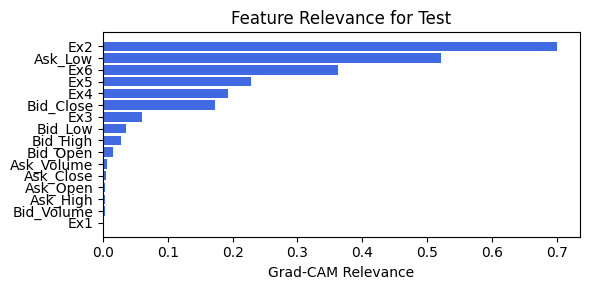

In [146]:
train_and_plot_relevance(Model3_2, kan_neurons=4, kan_grid=3, cnn_bottleneck_dim=-1, lamb=0.0001, steps=30, alpha=.05, filename=filename_2, opt_col_val=0.05)

### 2.3.9 width=[10, 4], grid=3, lamb=0.0001 | alpha=0.05

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


 train_acc_hybrid: 7.56e-01 | val_acc_hybrid: 6.90e-01 |: 100%|█████| 30/30 [00:22<00:00,  1.31it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.2449e-01 at 3 epoch
tensor(0.6866, device='cuda:0')
[[122  61]
 [ 54 130]]
M_KAN Relevance: 0.030233383178710938
CNN Relevance: 0.9697666168212891
[('Bid_Close', 0.48603514), ('Ask_Close', 0.44668484), ('Bid_Volume', 0.41517913), ('Bid_Open', 0.40587306), ('Ask_High', 0.38218164), ('Bid_High', 0.27864325), ('Ask_Low', 0.22903898), ('Ask_Open', 0.21719038), ('Ask_Volume', 0.19367364), ('Bid_Low', 0.17630318)]


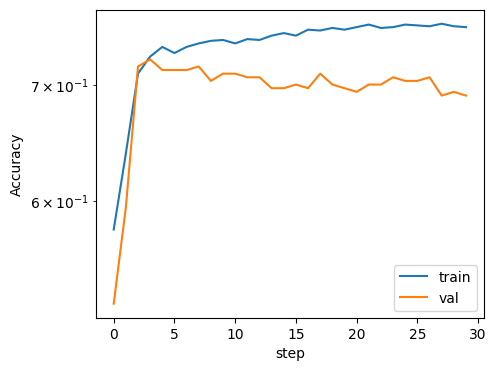

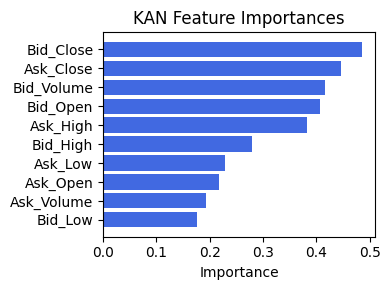

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex2', 0.7121949498960368), ('Ask_Low', 0.5334008930083517), ('Ex6', 0.43165798611147205), ('Ex5', 0.34290902799741446), ('Ex4', 0.31755089083793053), ('Bid_Close', 0.18721717440178084), ('Ex3', 0.179933963419631), ('Ask_Open', 0.022657778907576146), ('Bid_Volume', 0.021970773233279676), ('Bid_Low', 0.01926475230701), ('Bid_Open', 0.017000142663332815), ('Bid_High', 0.01499271763979371), ('Ask_Close', 0.010696735047858667), ('Ask_High', 0.010061378894846098), ('Ask_Volume', 0.007639987168956373), ('Ex1', 0.005903942402454034)]


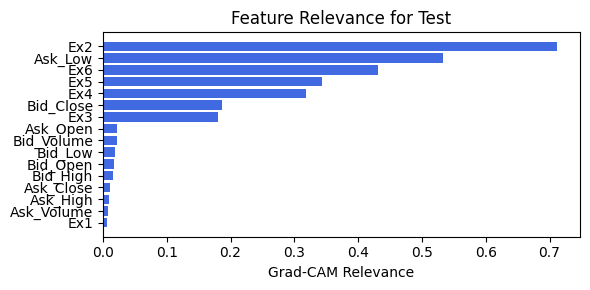

In [147]:
train_and_plot_relevance(Model3_2, kan_neurons=4, kan_grid=3, cnn_bottleneck_dim=-1, lamb=0.0001, steps=30, alpha=.05, filename=filename_2, opt_col_val=0.05)

# Option 3: Dynamic factor

In [149]:
create_csv_with_header(filename_3, columns_opt3)

## 3.0. width=[10, 3, 1], grid=3, lamb=1e-06

### 3.0.0 width=[10, 3, 1], grid=3, lamb=1e-06 | hidden_dim=128

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_3


 train_acc_hybrid: 7.46e-01 | val_acc_hybrid: 7.14e-01 |: 100%|█████| 40/40 [00:32<00:00,  1.23it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.2789e-01 at 23 epoch
tensor(0.6485, device='cuda:0')
[[ 96  87]
 [ 42 142]]
M_KAN Relevance: 0.04665151610970497
CNN Relevance: 0.9533484578132629
[('Ask_High', 2.2679746), ('Bid_Close', 2.267572), ('Ask_Close', 2.0360854), ('Bid_High', 1.291429), ('Bid_Low', 1.1936288), ('Bid_Open', 0.9028939), ('Ask_Low', 0.682606), ('Ask_Open', 0.29737216), ('Bid_Volume', 0.2870068), ('Ask_Volume', 0.13617083)]


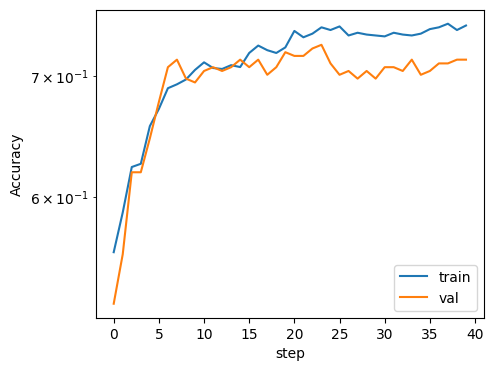

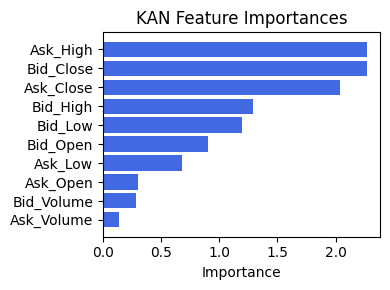

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex4', 0.49389123094930476), ('Ex5', 0.4366285514228594), ('Ex3', 0.3453058694928316), ('Ex6', 0.16041947156825287), ('Ask_High', 0.12485345634625468), ('Ex1', 0.08868725948278064), ('Ask_Open', 0.0865777920219763), ('Ask_Low', 0.0754773715582019), ('Ask_Volume', 0.07347283471989184), ('Ex2', 0.049073512912477295), ('Ask_Close', 0.048249501377637234), ('Bid_Low', 0.044794529970806365), ('Bid_Volume', 0.03908684121112387), ('Bid_Close', 0.03497686847151138), ('Bid_High', 0.025670274294029707), ('Bid_Open', 0.0036299272257344904)]


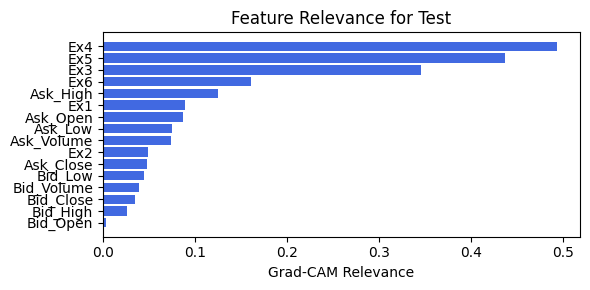

In [150]:
train_and_plot_relevance(Model3_3, kan_neurons=3, kan_grid=3, lamb=1e-06, steps=40, hidden_dim=128, filename=filename_3, opt_col_val=128)

### 3.0.1 width=[10, 3, 1], grid=3, lamb=1e-06 | hidden_dim=128

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_3


 train_acc_hybrid: 7.46e-01 | val_acc_hybrid: 7.14e-01 |: 100%|█████| 40/40 [00:32<00:00,  1.22it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.2789e-01 at 23 epoch
tensor(0.6485, device='cuda:0')
[[ 96  87]
 [ 42 142]]
M_KAN Relevance: 0.04665151610970497
CNN Relevance: 0.9533484578132629
[('Ask_High', 2.2679746), ('Bid_Close', 2.267572), ('Ask_Close', 2.0360854), ('Bid_High', 1.291429), ('Bid_Low', 1.1936288), ('Bid_Open', 0.9028939), ('Ask_Low', 0.682606), ('Ask_Open', 0.29737216), ('Bid_Volume', 0.2870068), ('Ask_Volume', 0.13617083)]


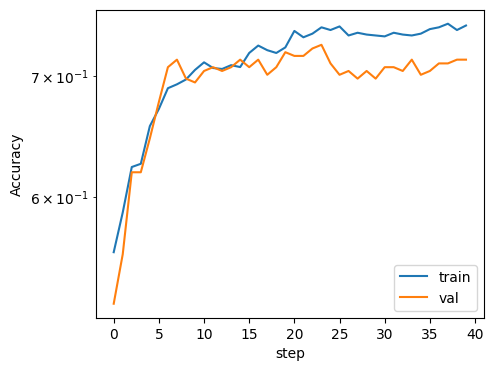

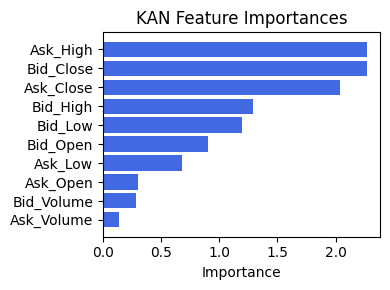

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex4', 0.49389123094930476), ('Ex5', 0.4366285514228594), ('Ex3', 0.3453058694928316), ('Ex6', 0.16041947156825287), ('Ask_High', 0.12485345634625468), ('Ex1', 0.08868725948278064), ('Ask_Open', 0.0865777920219763), ('Ask_Low', 0.0754773715582019), ('Ask_Volume', 0.07347283471989184), ('Ex2', 0.049073512912477295), ('Ask_Close', 0.048249501377637234), ('Bid_Low', 0.044794529970806365), ('Bid_Volume', 0.03908684121112387), ('Bid_Close', 0.03497686847151138), ('Bid_High', 0.025670274294029707), ('Bid_Open', 0.0036299272257344904)]


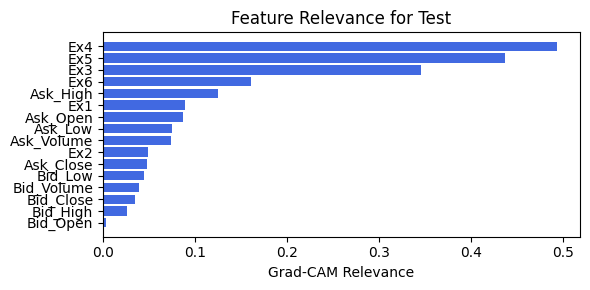

In [151]:
train_and_plot_relevance(Model3_3, kan_neurons=3, kan_grid=3, lamb=1e-06, steps=40, hidden_dim=128, filename=filename_3, opt_col_val=128)

### 3.0.2 width=[10, 3, 1], grid=3, lamb=1e-06 | hidden_dim=32

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_3


 train_acc_hybrid: 7.48e-01 | val_acc_hybrid: 6.90e-01 |: 100%|█████| 40/40 [00:31<00:00,  1.26it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.1769e-01 at 11 epoch
tensor(0.7221, device='cuda:0')
[[136  47]
 [ 55 129]]
M_KAN Relevance: 0.09874076396226883
CNN Relevance: 0.9012592434883118
[('Bid_Close', 3.3707666), ('Ask_Close', 3.0903988), ('Ask_High', 3.012532), ('Bid_High', 2.3279226), ('Bid_Low', 1.7193025), ('Ask_Open', 0.7547668), ('Ask_Low', 0.693251), ('Bid_Open', 0.43563375), ('Bid_Volume', 0.26353794), ('Ask_Volume', 0.20379762)]


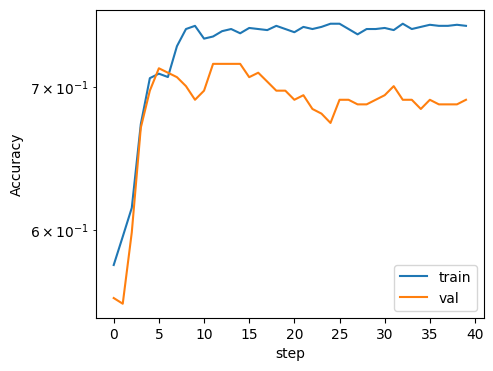

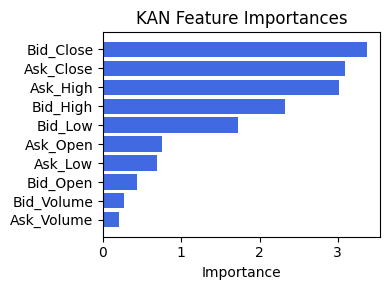

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex3', 0.40160059892605454), ('Ex4', 0.39469767783480453), ('Ex5', 0.34758503804089913), ('Ask_Close', 0.3383879126864803), ('Bid_Volume', 0.254716432647975), ('Ask_Volume', 0.22945128257287417), ('Ask_Open', 0.20802141909505945), ('Ex6', 0.1989309890027607), ('Bid_High', 0.19777820452956396), ('Bid_Low', 0.1905777807999656), ('Ex1', 0.1861604396285545), ('Ask_High', 0.16487162430867128), ('Bid_Close', 0.1577688505448739), ('Bid_Open', 0.15163431423196025), ('Ask_Low', 0.10659342106928629), ('Ex2', 0.060414877305110554)]


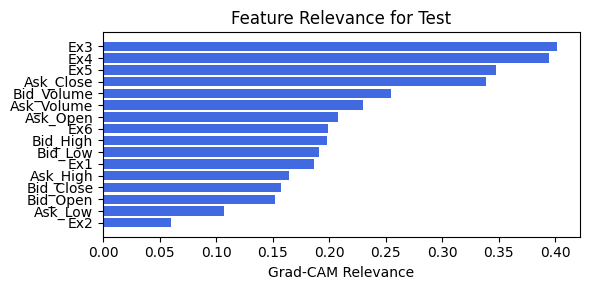

In [152]:
train_and_plot_relevance(Model3_3, kan_neurons=3, kan_grid=3, lamb=1e-06, steps=40, hidden_dim=32, filename=filename_3, opt_col_val=32)

### 3.0.3 width=[10, 3, 1], grid=3, lamb=1e-06 | hidden_dim=32

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_3


 train_acc_hybrid: 7.47e-01 | val_acc_hybrid: 7.01e-01 |: 100%|█████| 40/40 [00:32<00:00,  1.24it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.3129e-01 at 5 epoch
tensor(0.7084, device='cuda:0')
[[135  48]
 [ 59 125]]
M_KAN Relevance: 0.07672649621963501
CNN Relevance: 0.923273503780365
[('Ask_Close', 1.8013489), ('Bid_Close', 1.7699077), ('Bid_Open', 1.6329111), ('Ask_High', 1.0901212), ('Ask_Open', 0.84115005), ('Bid_Low', 0.8347113), ('Ask_Low', 0.71292806), ('Bid_High', 0.30950147), ('Bid_Volume', 0.23034346), ('Ask_Volume', 0.2216231)]


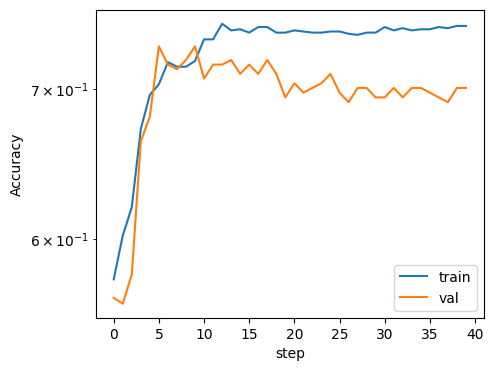

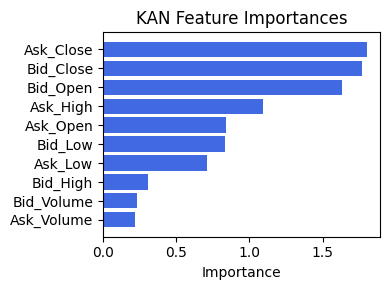

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ask_Volume', 0.4013187492479461), ('Ex4', 0.39868427739841533), ('Ex1', 0.39838176687712445), ('Ex5', 0.35390230914804965), ('Ask_Close', 0.3527250453466245), ('Ex3', 0.32591123262779376), ('Ask_Open', 0.2702503230597834), ('Ask_High', 0.26559549279711453), ('Bid_Volume', 0.2495931725582991), ('Ex2', 0.15749535899183), ('Ex6', 0.13833930106593767), ('Ask_Low', 0.10635183074994378), ('Bid_Low', 0.0812633266957662), ('Bid_High', 0.07792823824730806), ('Bid_Open', 0.07600013691486603), ('Bid_Close', 0.0503582586481982)]


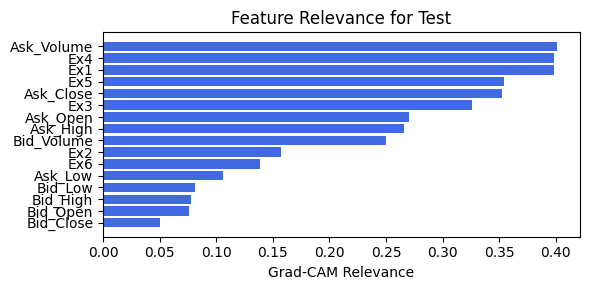

In [153]:
train_and_plot_relevance(Model3_3, kan_neurons=3, kan_grid=3, lamb=1e-06, steps=40, hidden_dim=32, filename=filename_3, opt_col_val=32)

### 3.0.4 width=[10, 3, 1], grid=3, lamb=1e-06 | hidden_dim=8

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_3


 train_acc_hybrid: 7.02e-01 | val_acc_hybrid: 6.97e-01 |: 100%|█████| 40/40 [00:24<00:00,  1.65it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.1429e-01 at 12 epoch
tensor(0.6812, device='cuda:0')
[[121  62]
 [ 55 129]]
M_KAN Relevance: 0.048231370747089386
CNN Relevance: 0.9517686367034912
[('Bid_Open', 0.98745537), ('Bid_Close', 0.98083067), ('Ask_Close', 0.9090039), ('Ask_High', 0.6605737), ('Bid_Low', 0.6472404), ('Ask_Low', 0.5912145), ('Ask_Open', 0.39544666), ('Bid_High', 0.25342885), ('Bid_Volume', 0.22182447), ('Ask_Volume', 0.07817483)]


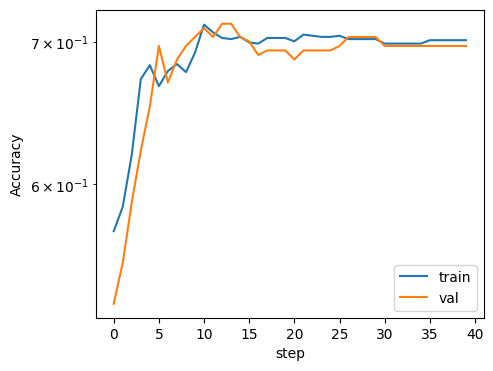

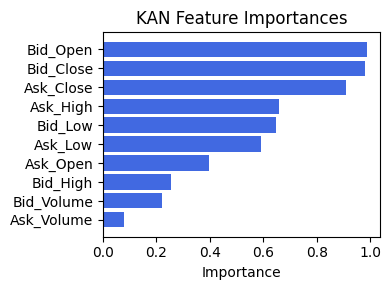

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex1', 0.6365862565688606), ('Ask_Volume', 0.5453889305203422), ('Ask_High', 0.5453463950884663), ('Ex2', 0.474193449997805), ('Ask_Open', 0.43499208966457875), ('Ask_Low', 0.3967196309459408), ('Bid_Low', 0.35144461545971417), ('Bid_High', 0.33746491552251884), ('Bid_Close', 0.17083471891800467), ('Ex6', 0.1329013983434674), ('Bid_Open', 0.11183467727684607), ('Bid_Volume', 0.088885575145181), ('Ask_Close', 0.08784454648525071), ('Ex5', 0.06603786260224574), ('Ex4', 0.034024877375694706), ('Ex3', 0.018187837356895626)]


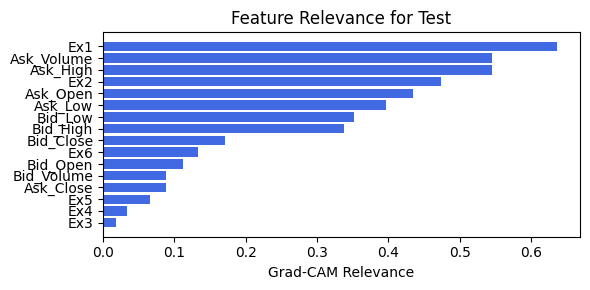

In [154]:
train_and_plot_relevance(Model3_3, kan_neurons=3, kan_grid=3, lamb=1e-06, steps=40, hidden_dim=8, filename=filename_3, opt_col_val=8)

### 3.0.5 width=[10, 3, 1], grid=3, lamb=1e-06 | hidden_dim=8

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_3


 train_acc_hybrid: 7.42e-01 | val_acc_hybrid: 7.11e-01 |: 100%|█████| 40/40 [00:33<00:00,  1.20it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.3129e-01 at 15 epoch
tensor(0.7411, device='cuda:0')
[[124  59]
 [ 36 148]]
M_KAN Relevance: 0.041071537882089615
CNN Relevance: 0.9589284658432007
[('Bid_Close', 2.2583144), ('Bid_Open', 2.092261), ('Ask_Close', 1.9501076), ('Bid_Low', 1.4208983), ('Ask_High', 1.4055904), ('Ask_Low', 0.95041466), ('Ask_Open', 0.71096987), ('Bid_High', 0.28346318), ('Bid_Volume', 0.24267666), ('Ask_Volume', 0.12090194)]


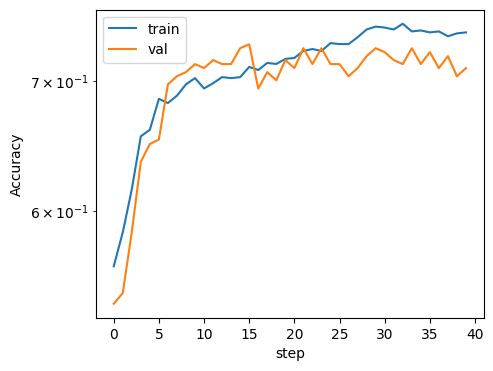

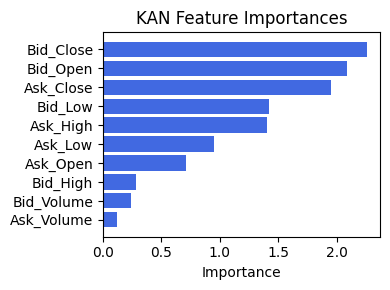

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex5', 0.6330523766394532), ('Ex4', 0.5714060928906017), ('Ex1', 0.5480288733253686), ('Ask_Volume', 0.4914755160217389), ('Ask_High', 0.3963132372382287), ('Ex6', 0.38825612650214814), ('Ex2', 0.36974326718207806), ('Ask_Open', 0.36862582037649155), ('Ask_Low', 0.22628951299179356), ('Ex3', 0.20876352544950083), ('Ask_Close', 0.17901632964742506), ('Bid_High', 0.17761888370496456), ('Bid_Low', 0.1760535589127474), ('Bid_Volume', 0.14800739597092377), ('Bid_Close', 0.10428299696618636), ('Bid_Open', 0.10397914969232264)]


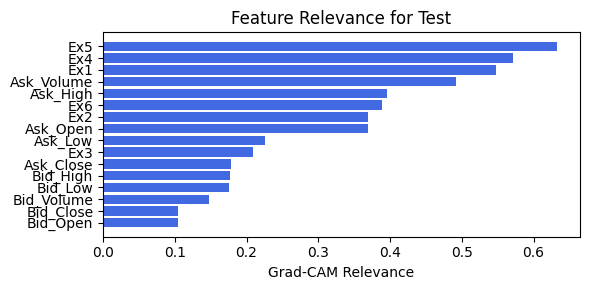

In [155]:
train_and_plot_relevance(Model3_3, kan_neurons=3, kan_grid=3, lamb=1e-06, steps=40, hidden_dim=8, filename=filename_3, opt_col_val=8)

## 3.1. width=[10, 3, 1], grid=4, lamb=0.0001

### 3.1.0 width=[10, 3, 1], grid=4, lamb=0.0001 | hidden_dim=128

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_3


 train_acc_hybrid: 7.43e-01 | val_acc_hybrid: 7.18e-01 |: 100%|█████| 40/40 [00:35<00:00,  1.12it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.2449e-01 at 35 epoch
tensor(0.7057, device='cuda:0')
[[125  58]
 [ 50 134]]
M_KAN Relevance: 0.09907904267311096
CNN Relevance: 0.9009209871292114
[('Bid_Close', 1.0427496), ('Ask_High', 0.5687832), ('Ask_Low', 0.44173717), ('Bid_High', 0.44072217), ('Ask_Open', 0.3909709), ('Ask_Close', 0.37745053), ('Bid_Open', 0.37727755), ('Bid_Volume', 0.19827859), ('Bid_Low', 0.18112326), ('Ask_Volume', 0.12118395)]


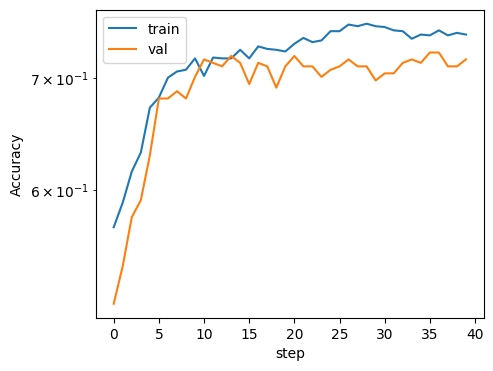

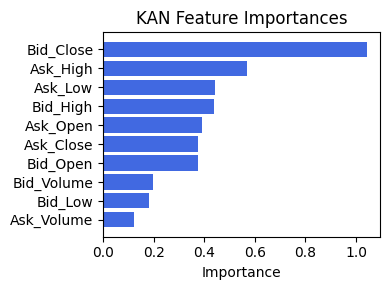

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ask_Low', 0.11863046975131337), ('Ex2', 0.10827485055406387), ('Ex1', 0.06737846633475224), ('Ask_High', 0.06484644105835571), ('Bid_Low', 0.05909964347661699), ('Bid_Close', 0.043885729023780705), ('Ask_Volume', 0.03517489874233017), ('Bid_High', 0.0342665664161421), ('Ex4', 0.029269429720552482), ('Ex5', 0.027468478946301996), ('Ask_Close', 0.024803123743925497), ('Ex3', 0.012430598857820196), ('Ask_Open', 0.009256363060954724), ('Bid_Volume', 0.005989866767697828), ('Ex6', 0.0055206376289674754), ('Bid_Open', 0.003263526113972839)]


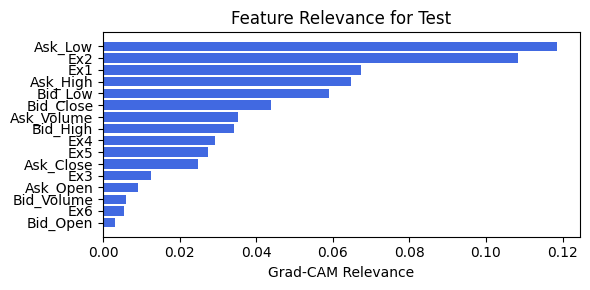

In [156]:
train_and_plot_relevance(Model3_3, kan_neurons=3, kan_grid=4, lamb=0.0001, steps=40, hidden_dim=128, filename=filename_3, opt_col_val=128)

### 3.1.1 width=[10, 3, 1], grid=4, lamb=0.0001 | hidden_dim=128

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_3


 train_acc_hybrid: 7.43e-01 | val_acc_hybrid: 7.18e-01 |: 100%|█████| 40/40 [00:35<00:00,  1.12it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.2449e-01 at 35 epoch
tensor(0.7057, device='cuda:0')
[[125  58]
 [ 50 134]]
M_KAN Relevance: 0.09907904267311096
CNN Relevance: 0.9009209871292114
[('Bid_Close', 1.0427496), ('Ask_High', 0.5687832), ('Ask_Low', 0.44173717), ('Bid_High', 0.44072217), ('Ask_Open', 0.3909709), ('Ask_Close', 0.37745053), ('Bid_Open', 0.37727755), ('Bid_Volume', 0.19827859), ('Bid_Low', 0.18112326), ('Ask_Volume', 0.12118395)]


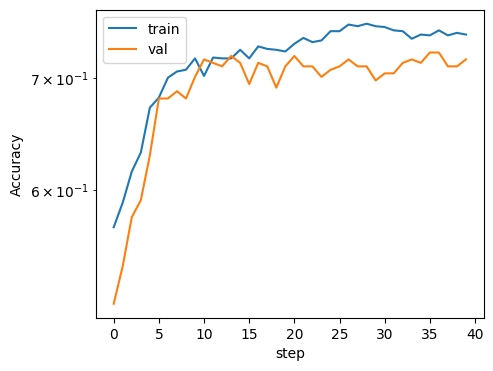

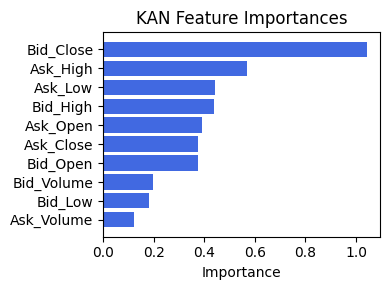

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ask_Low', 0.11863046975131337), ('Ex2', 0.10827485055406387), ('Ex1', 0.06737846633475224), ('Ask_High', 0.06484644105835571), ('Bid_Low', 0.05909964347661699), ('Bid_Close', 0.043885729023780705), ('Ask_Volume', 0.03517489874233017), ('Bid_High', 0.0342665664161421), ('Ex4', 0.029269429720552482), ('Ex5', 0.027468478946301996), ('Ask_Close', 0.024803123743925497), ('Ex3', 0.012430598857820196), ('Ask_Open', 0.009256363060954724), ('Bid_Volume', 0.005989866767697828), ('Ex6', 0.0055206376289674754), ('Bid_Open', 0.003263526113972839)]


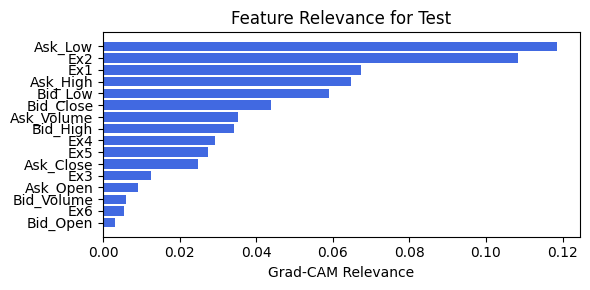

In [157]:
train_and_plot_relevance(Model3_3, kan_neurons=3, kan_grid=4, lamb=0.0001, steps=40, hidden_dim=128, filename=filename_3, opt_col_val=128)

### 3.1.2 width=[10, 3, 1], grid=4, lamb=0.0001 | hidden_dim=32

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_3


 train_acc_hybrid: 7.60e-01 | val_acc_hybrid: 6.90e-01 |: 100%|█████| 40/40 [00:33<00:00,  1.18it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.3810e-01 at 21 epoch
tensor(0.7030, device='cuda:0')
[[121  62]
 [ 47 137]]
M_KAN Relevance: 0.020942943170666695
CNN Relevance: 0.9790570735931396
[('Bid_Close', 0.88268316), ('Ask_Open', 0.50779474), ('Bid_Open', 0.46867073), ('Bid_Low', 0.44343182), ('Ask_Low', 0.3554773), ('Bid_Volume', 0.33829913), ('Ask_High', 0.2793023), ('Ask_Volume', 0.21199176), ('Bid_High', 0.19475812), ('Ask_Close', 0.17570077)]


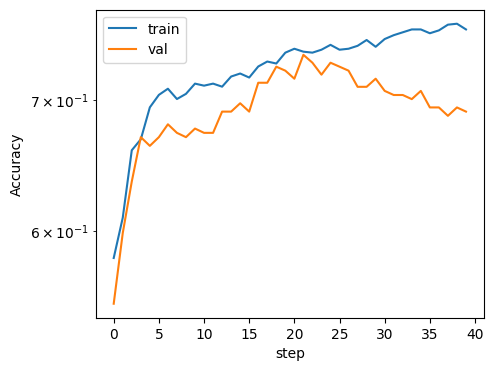

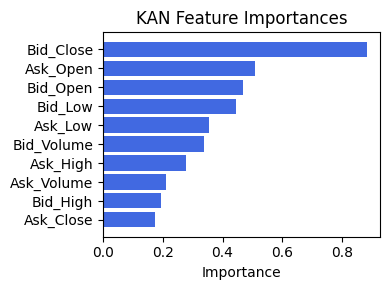

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex2', 0.2494834330318653), ('Ex6', 0.20772094289424553), ('Ask_Low', 0.1433784925041112), ('Bid_Close', 0.10038760276730978), ('Ex1', 0.07885597746854785), ('Ex3', 0.058715754399887445), ('Ex5', 0.05144499167317793), ('Ex4', 0.04395005376555705), ('Bid_Open', 0.025922781127465037), ('Bid_Low', 0.02072704385611424), ('Ask_High', 0.017925221276349306), ('Ask_Volume', 0.015049735296417928), ('Ask_Close', 0.014639648793190917), ('Bid_High', 0.006769641151495357), ('Ask_Open', 0.001276936945297669), ('Bid_Volume', 0.0009108239298953474)]


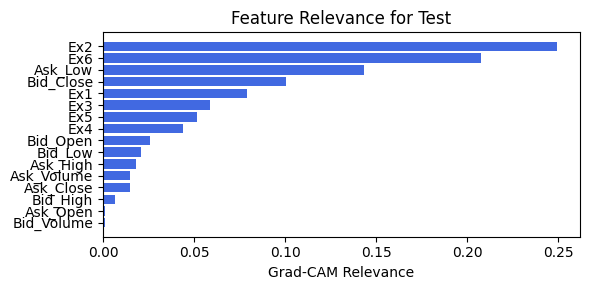

In [158]:
train_and_plot_relevance(Model3_3, kan_neurons=3, kan_grid=4, lamb=0.0001, steps=40, hidden_dim=32, filename=filename_3, opt_col_val=32)

### 3.1.3 width=[10, 3, 1], grid=4, lamb=0.0001 | hidden_dim=32

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_3


 train_acc_hybrid: 7.56e-01 | val_acc_hybrid: 6.87e-01 |: 100%|█████| 40/40 [00:33<00:00,  1.19it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.1769e-01 at 12 epoch
tensor(0.7112, device='cuda:0')
[[121  62]
 [ 44 140]]
M_KAN Relevance: 0.05817321315407753
CNN Relevance: 0.9418267607688904
[('Bid_Close', 2.6654832), ('Bid_Open', 1.2798679), ('Ask_High', 1.2185879), ('Ask_Open', 0.9526833), ('Ask_Close', 0.8734429), ('Bid_High', 0.7921726), ('Bid_Low', 0.7744772), ('Ask_Low', 0.35802516), ('Ask_Volume', 0.34473252), ('Bid_Volume', 0.21956775)]


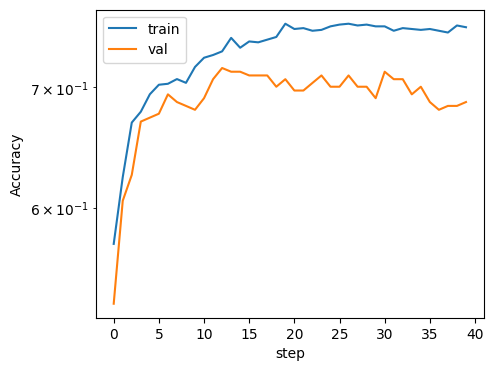

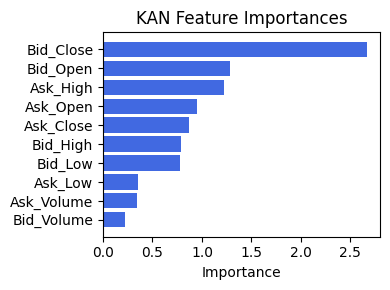

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex6', 0.2997024469521678), ('Ex2', 0.26977130995266524), ('Ex5', 0.20057782177787659), ('Ask_Low', 0.15645531140209482), ('Ex4', 0.12080807993581838), ('Ex1', 0.07570736987575918), ('Ex3', 0.07130720410102659), ('Bid_Close', 0.04727053094442905), ('Ask_High', 0.04651788336970927), ('Bid_Low', 0.025411473456029503), ('Bid_Open', 0.023134915863147275), ('Bid_High', 0.01808191697672771), ('Ask_Volume', 0.014527332924204252), ('Ask_Open', 0.012299152291383042), ('Ask_Close', 0.011889691363968722), ('Bid_Volume', 0.008217877689739486)]


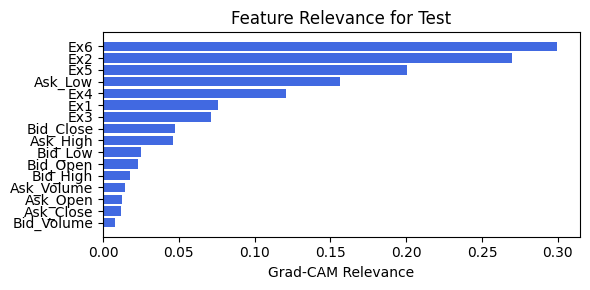

In [159]:
train_and_plot_relevance(Model3_3, kan_neurons=3, kan_grid=4, lamb=0.0001, steps=40, hidden_dim=32, filename=filename_3, opt_col_val=32)

### 3.1.4 width=[10, 3, 1], grid=4, lamb=0.0001 | hidden_dim=8

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_3


 train_acc_hybrid: 7.66e-01 | val_acc_hybrid: 6.90e-01 |: 100%|█████| 40/40 [00:34<00:00,  1.18it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.1429e-01 at 17 epoch
tensor(0.7084, device='cuda:0')
[[129  54]
 [ 53 131]]
M_KAN Relevance: 0.07201650738716125
CNN Relevance: 0.9279835224151611
[('Bid_Close', 3.5489902), ('Ask_High', 2.158924), ('Ask_Close', 1.7509784), ('Bid_High', 1.5918095), ('Bid_Open', 1.1055775), ('Ask_Open', 0.84059083), ('Bid_Low', 0.57987416), ('Ask_Low', 0.49422878), ('Bid_Volume', 0.31822842), ('Ask_Volume', 0.31754836)]


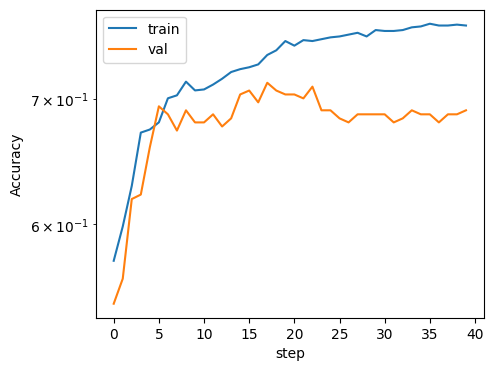

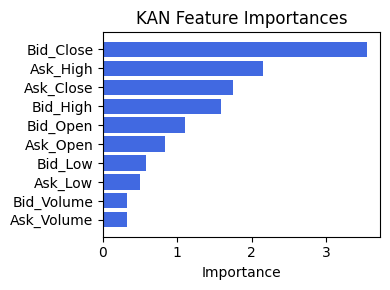

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex6', 0.513068808558935), ('Ex2', 0.3511584456730888), ('Ask_Low', 0.20165515185253852), ('Ex5', 0.1498032230330309), ('Ex4', 0.14330818382033453), ('Ex3', 0.11740711111558236), ('Bid_Close', 0.09402794903413868), ('Ex1', 0.07753403712909704), ('Ask_Volume', 0.06524821521386971), ('Ask_High', 0.0451771822050328), ('Ask_Open', 0.042386314664188296), ('Ask_Close', 0.04221708201806439), ('Bid_Open', 0.04188129512532246), ('Bid_Volume', 0.03803561439891365), ('Bid_Low', 0.028433646399138257), ('Bid_High', 0.02189641254630488)]


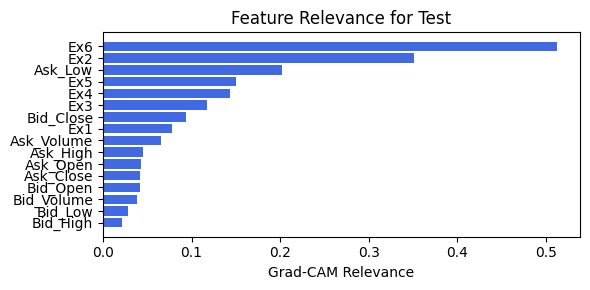

In [160]:
train_and_plot_relevance(Model3_3, kan_neurons=3, kan_grid=4, lamb=0.0001, steps=40, hidden_dim=8, filename=filename_3, opt_col_val=8)

### 3.1.5 width=[10, 3, 1], grid=4, lamb=0.0001 | hidden_dim=8

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_3


 train_acc_hybrid: 7.61e-01 | val_acc_hybrid: 6.84e-01 |: 100%|█████| 40/40 [00:34<00:00,  1.17it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.1769e-01 at 19 epoch
tensor(0.7112, device='cuda:0')
[[133  50]
 [ 56 128]]
M_KAN Relevance: 0.04938434436917305
CNN Relevance: 0.950615644454956
[('Bid_Close', 2.6196597), ('Ask_High', 1.1918168), ('Ask_Close', 1.104257), ('Bid_Open', 0.9334606), ('Bid_High', 0.87988055), ('Ask_Open', 0.79637736), ('Bid_Low', 0.43929642), ('Ask_Low', 0.40267918), ('Bid_Volume', 0.37404817), ('Ask_Volume', 0.35851246)]


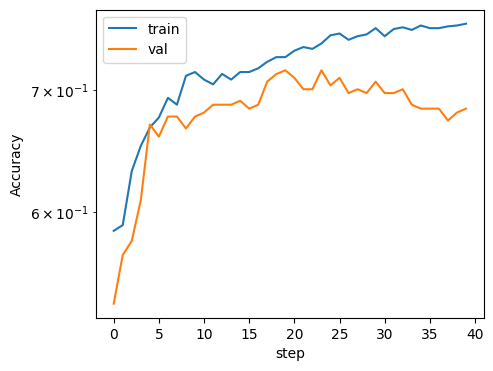

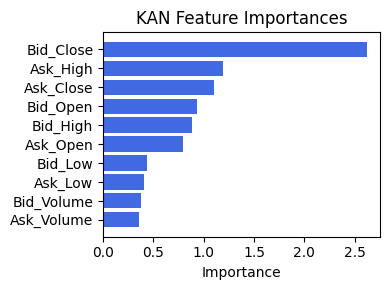

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ask_Close', 0.2912498092918329), ('Ask_Volume', 0.24879320668772228), ('Bid_Volume', 0.24128309762948247), ('Ask_Open', 0.21521308476851406), ('Ex1', 0.20246012697100377), ('Ex2', 0.2014646775343605), ('Ask_High', 0.19466755665641733), ('Ex6', 0.19415986742944855), ('Bid_Open', 0.19137019391504068), ('Bid_Low', 0.17490955958858498), ('Bid_High', 0.17242061863691427), ('Ask_Low', 0.16814877817087504), ('Bid_Close', 0.16138743964807867), ('Ex5', 0.08221976905274497), ('Ex4', 0.0787209866466781), ('Ex3', 0.033923553565343954)]


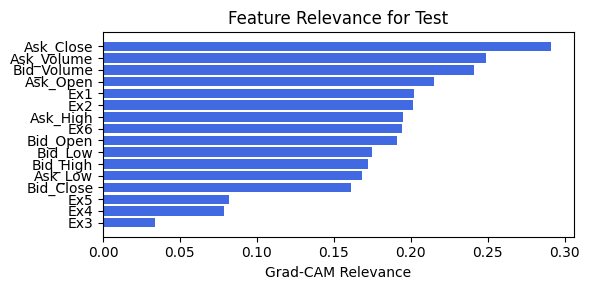

In [161]:
train_and_plot_relevance(Model3_3, kan_neurons=3, kan_grid=4, lamb=0.0001, steps=40, hidden_dim=8, filename=filename_3, opt_col_val=8)

## 3.2. width=[10, 1, 1], grid=3, lamb=0.0001

### 3.2.0 width=[10, 1, 1], grid=3, lamb=0.0001 | hidden_dim=128

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_3


 train_acc_hybrid: 7.48e-01 | val_acc_hybrid: 7.04e-01 |: 100%|█████| 40/40 [00:31<00:00,  1.27it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.4830e-01 at 7 epoch
tensor(0.7112, device='cuda:0')
[[133  50]
 [ 56 128]]
M_KAN Relevance: 0.001384518574923277
CNN Relevance: 0.9986154437065125
[('Ask_Open', 0.76592386), ('Ask_Low', 0.6364287), ('Ask_High', 0.5506669), ('Bid_Low', 0.48468524), ('Bid_High', 0.43204138), ('Bid_Volume', 0.4038149), ('Bid_Open', 0.30848938), ('Ask_Volume', 0.23515695), ('Bid_Close', 0.2016811), ('Ask_Close', 0.05245379)]


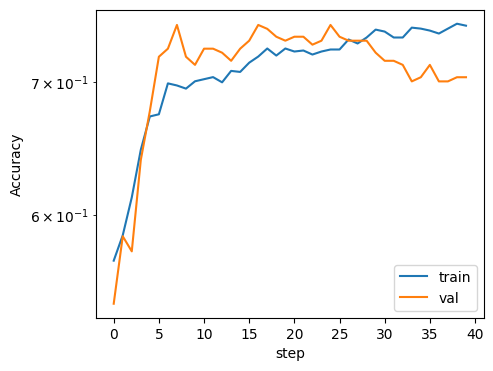

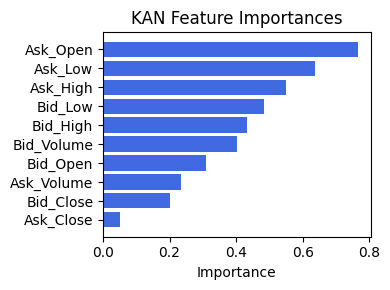

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex2', 0.377794433760708), ('Ask_High', 0.29375345082775933), ('Ex1', 0.2812261436571055), ('Ask_Low', 0.28050982927248813), ('Bid_Close', 0.28025969867220235), ('Bid_Low', 0.27568802736573966), ('Bid_High', 0.23872971271731883), ('Bid_Open', 0.22573183243396394), ('Ex6', 0.21046996033751744), ('Ex5', 0.17415330151498207), ('Ask_Open', 0.16479913173471794), ('Bid_Volume', 0.14802211124575423), ('Ask_Volume', 0.1316615508520996), ('Ex4', 0.10590617174418435), ('Ask_Close', 0.09519234234536934), ('Ex3', 0.04159973486680639)]


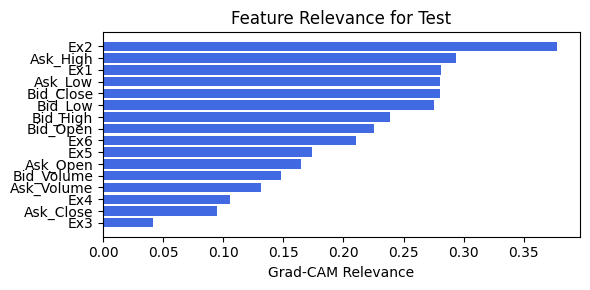

In [162]:
train_and_plot_relevance(Model3_3, kan_neurons=1, kan_grid=3, lamb=0.0001, steps=40, hidden_dim=128, filename=filename_3, opt_col_val=128)

### 3.2.1 width=[10, 1, 1], grid=3, lamb=0.0001 | hidden_dim=128

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_3


 train_acc_hybrid: 7.48e-01 | val_acc_hybrid: 7.04e-01 |: 100%|█████| 40/40 [00:31<00:00,  1.25it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.4830e-01 at 7 epoch
tensor(0.7112, device='cuda:0')
[[133  50]
 [ 56 128]]
M_KAN Relevance: 0.001384518574923277
CNN Relevance: 0.9986154437065125
[('Ask_Open', 0.76592386), ('Ask_Low', 0.6364287), ('Ask_High', 0.5506669), ('Bid_Low', 0.48468524), ('Bid_High', 0.43204138), ('Bid_Volume', 0.4038149), ('Bid_Open', 0.30848938), ('Ask_Volume', 0.23515695), ('Bid_Close', 0.2016811), ('Ask_Close', 0.05245379)]


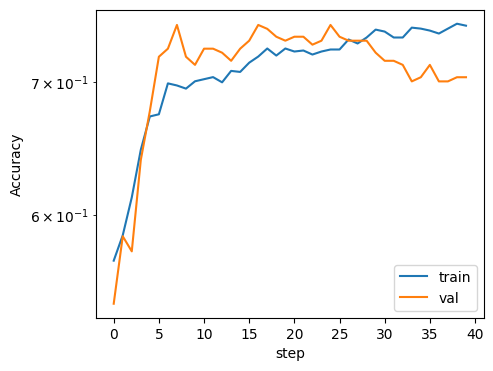

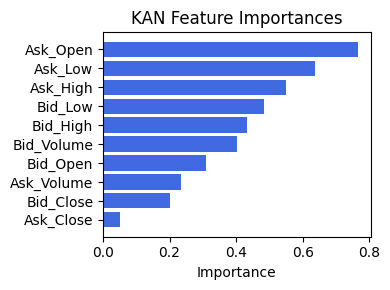

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex2', 0.377794433760708), ('Ask_High', 0.29375345082775933), ('Ex1', 0.2812261436571055), ('Ask_Low', 0.28050982927248813), ('Bid_Close', 0.28025969867220235), ('Bid_Low', 0.27568802736573966), ('Bid_High', 0.23872971271731883), ('Bid_Open', 0.22573183243396394), ('Ex6', 0.21046996033751744), ('Ex5', 0.17415330151498207), ('Ask_Open', 0.16479913173471794), ('Bid_Volume', 0.14802211124575423), ('Ask_Volume', 0.1316615508520996), ('Ex4', 0.10590617174418435), ('Ask_Close', 0.09519234234536934), ('Ex3', 0.04159973486680639)]


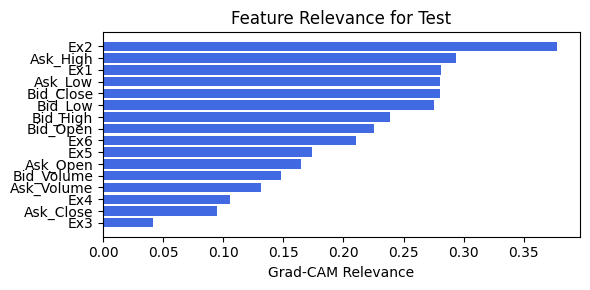

In [163]:
train_and_plot_relevance(Model3_3, kan_neurons=1, kan_grid=3, lamb=0.0001, steps=40, hidden_dim=128, filename=filename_3, opt_col_val=128)

### 3.2.2 width=[10, 1, 1], grid=3, lamb=0.0001 | hidden_dim=32

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_3


 train_acc_hybrid: 7.43e-01 | val_acc_hybrid: 6.84e-01 |: 100%|█████| 40/40 [00:30<00:00,  1.29it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.4490e-01 at 6 epoch
tensor(0.7030, device='cuda:0')
[[125  58]
 [ 51 133]]
M_KAN Relevance: 0.0039765299297869205
CNN Relevance: 0.9960234761238098
[('Bid_Close', 0.39861944), ('Ask_Close', 0.27586946), ('Ask_Low', 0.19481975), ('Ask_Open', 0.18199693), ('Ask_High', 0.118288994), ('Bid_Volume', 0.07932113), ('Bid_Low', 0.074013196), ('Bid_High', 0.06788018), ('Bid_Open', 0.035164636), ('Ask_Volume', 0.033392254)]


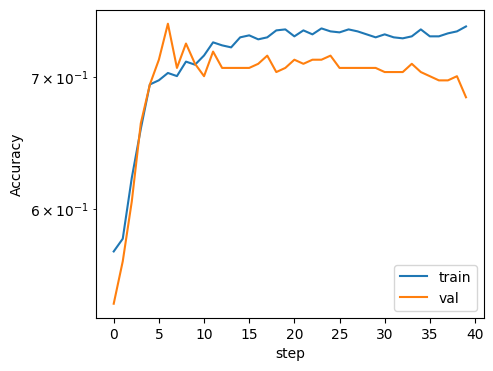

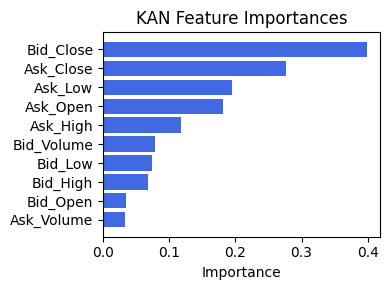

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex2', 0.6073237483767787), ('Ask_Low', 0.4252298508824055), ('Ex1', 0.22699697218246617), ('Ask_High', 0.14746355074546644), ('Bid_Close', 0.10341977457792184), ('Ex6', 0.07376912870629607), ('Ex5', 0.04164729175495354), ('Bid_Low', 0.03444497089137384), ('Ask_Close', 0.006129114947133325), ('Ask_Open', 0.004667724000559028), ('Bid_Volume', 0.00422496736374473), ('Ask_Volume', 0.0041771986550646414), ('Bid_High', 0.0022496195327318005), ('Ex4', 0.001960692981642491), ('Bid_Open', 0.0019325702489234446), ('Ex3', 0.0008784857997607328)]


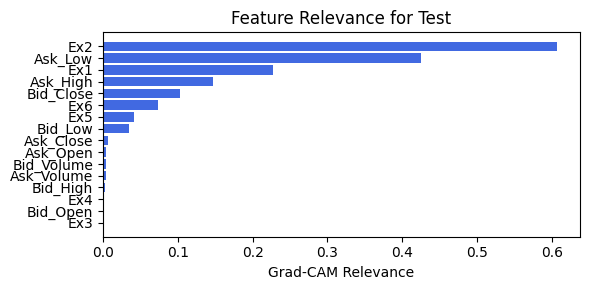

In [164]:
train_and_plot_relevance(Model3_3, kan_neurons=1, kan_grid=3, lamb=0.0001, steps=40, hidden_dim=32, filename=filename_3, opt_col_val=32)

### 3.2.3 width=[10, 1, 1], grid=3, lamb=0.0001 | hidden_dim=32

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_3


 train_acc_hybrid: 7.16e-01 | val_acc_hybrid: 7.18e-01 |: 100%|█████| 40/40 [00:31<00:00,  1.29it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.3469e-01 at 38 epoch
tensor(0.6975, device='cuda:0')
[[123  60]
 [ 51 133]]
M_KAN Relevance: 0.0023138339165598154
CNN Relevance: 0.9976861476898193
[('Ask_Low', 1.2360358), ('Ask_Open', 1.2348033), ('Bid_Low', 1.0147493), ('Bid_High', 1.001698), ('Ask_High', 0.9950957), ('Bid_Open', 0.9126603), ('Bid_Volume', 0.58623666), ('Ask_Volume', 0.327249), ('Ask_Close', 0.17428088), ('Bid_Close', 0.1603228)]


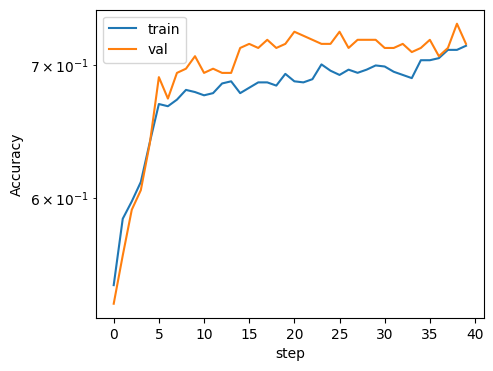

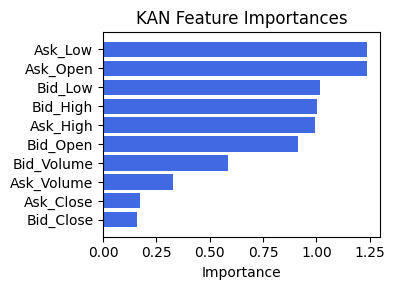

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex5', 0.802474043552817), ('Ex4', 0.725779185604497), ('Ex6', 0.5469698728917405), ('Ex3', 0.2976612561973629), ('Ex2', 0.1688393233036862), ('Ask_Low', 0.14684887326511276), ('Ex1', 0.12343585348196949), ('Bid_Close', 0.08309072687776571), ('Ask_Volume', 0.08181100007409403), ('Ask_Close', 0.030493306540329758), ('Ask_High', 0.023257821634020775), ('Bid_Low', 0.00854014754767989), ('Bid_Volume', 0.001316652545561584), ('Ask_Open', 0.001316652545561584), ('Bid_Open', 0.0), ('Bid_High', 0.0)]


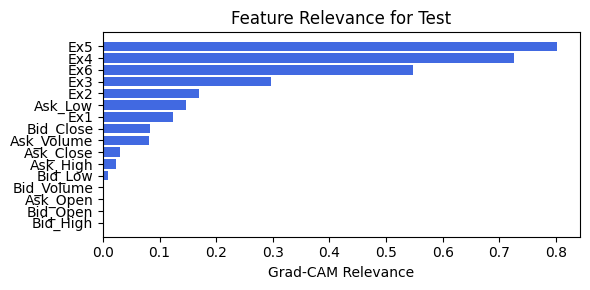

In [165]:
train_and_plot_relevance(Model3_3, kan_neurons=1, kan_grid=3, lamb=0.0001, steps=40, hidden_dim=32, filename=filename_3, opt_col_val=32)

### 3.2.4 width=[10, 1, 1], grid=3, lamb=0.0001 | hidden_dim=8

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_3


 train_acc_hybrid: 7.47e-01 | val_acc_hybrid: 6.97e-01 |: 100%|█████| 40/40 [00:30<00:00,  1.30it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.2789e-01 at 16 epoch
tensor(0.7221, device='cuda:0')
[[142  41]
 [ 61 123]]
M_KAN Relevance: 0.004126454703509808
CNN Relevance: 0.9958735108375549
[('Bid_High', 0.5319869), ('Bid_Close', 0.5253411), ('Ask_Open', 0.5241009), ('Ask_Close', 0.3611995), ('Ask_Low', 0.3459719), ('Bid_Volume', 0.26773435), ('Bid_Low', 0.15155648), ('Ask_High', 0.11976663), ('Ask_Volume', 0.10697727), ('Bid_Open', 0.08607507)]


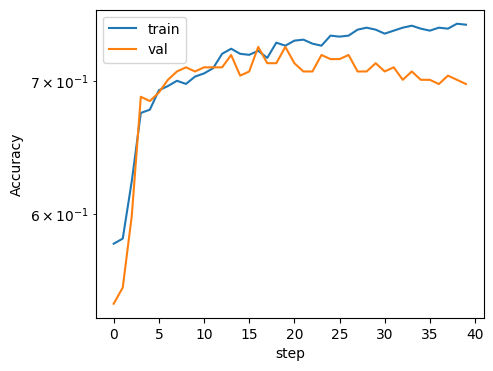

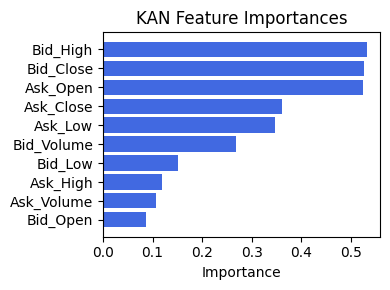

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex2', 0.6131417149378429), ('Ask_Low', 0.4628700367923653), ('Ex6', 0.3467395646898558), ('Ex1', 0.3454205427897399), ('Ask_High', 0.23302648675929988), ('Ex5', 0.17504317942265757), ('Bid_Close', 0.17461616153592796), ('Bid_Low', 0.13032784421829258), ('Bid_High', 0.07956977124828389), ('Ask_Volume', 0.07669337100031524), ('Ask_Open', 0.07043541661382473), ('Ex4', 0.0694593659839853), ('Bid_Open', 0.02653524074200284), ('Ex3', 0.022296557270381562), ('Bid_Volume', 0.01734924868568166), ('Ask_Close', 0.014182394123959887)]


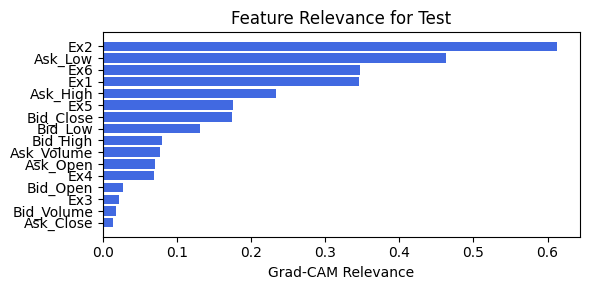

In [166]:
train_and_plot_relevance(Model3_3, kan_neurons=1, kan_grid=3, lamb=0.0001, steps=40, hidden_dim=8, filename=filename_3, opt_col_val=8)

### 3.2.5 width=[10, 1, 1], grid=3, lamb=0.0001 | hidden_dim=8

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_3


 train_acc_hybrid: 7.38e-01 | val_acc_hybrid: 6.90e-01 |: 100%|█████| 40/40 [00:30<00:00,  1.31it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.3129e-01 at 8 epoch
tensor(0.7139, device='cuda:0')
[[142  41]
 [ 64 120]]
M_KAN Relevance: 0.007262595929205418
CNN Relevance: 0.9927374124526978
[('Bid_Close', 0.40871105), ('Ask_Close', 0.29837897), ('Ask_Low', 0.2160991), ('Ask_Open', 0.20438536), ('Bid_Volume', 0.16657144), ('Bid_High', 0.10578474), ('Ask_High', 0.086435124), ('Ask_Volume', 0.08525116), ('Bid_Low', 0.054499857), ('Bid_Open', 0.023457767)]


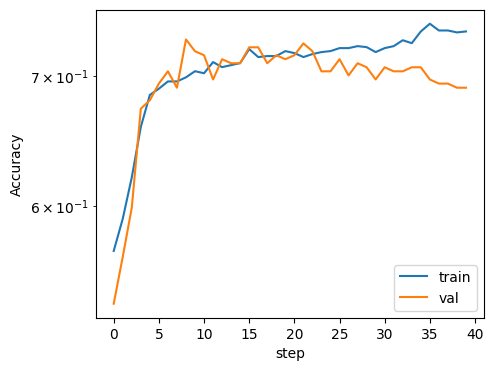

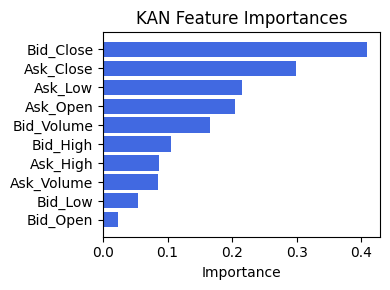

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex1', 0.531287518362908), ('Ex5', 0.5010058284897042), ('Ex6', 0.4803022901636703), ('Ex2', 0.44707108646131954), ('Ex4', 0.42569029112460666), ('Ask_Volume', 0.38967048222762446), ('Ask_High', 0.37761753549855154), ('Ask_Open', 0.354997140128208), ('Ask_Low', 0.3374545164507806), ('Bid_Open', 0.2792616351977072), ('Bid_High', 0.2582364461647362), ('Bid_Low', 0.23528743690585247), ('Bid_Volume', 0.19336379819856678), ('Bid_Close', 0.18436843115704424), ('Ask_Close', 0.16438069829478738), ('Ex3', 0.13642716020702864)]


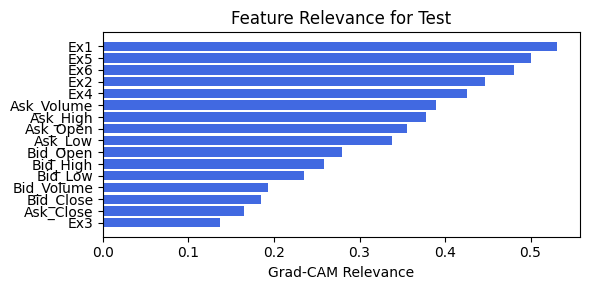

In [167]:
train_and_plot_relevance(Model3_3, kan_neurons=1, kan_grid=3, lamb=0.0001, steps=40, hidden_dim=8, filename=filename_3, opt_col_val=8)

## 3.3. width=[10, 4], grid=3, lamb=0.0001

### 3.3.0 width=[10, 3, 1], grid=4, lamb=0.0001 | hidden_dim=128

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_3


 train_acc_hybrid: 7.25e-01 | val_acc_hybrid: 7.24e-01 |: 100%|█████| 40/40 [00:30<00:00,  1.32it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.3129e-01 at 37 epoch
tensor(0.7193, device='cuda:0')
[[141  42]
 [ 61 123]]
M_KAN Relevance: 0.0063781109638512135
CNN Relevance: 0.9936219453811646
[('Ask_High', 0.53964555), ('Bid_Open', 0.52148753), ('Bid_Close', 0.3970377), ('Bid_High', 0.35367), ('Bid_Volume', 0.2772223), ('Ask_Open', 0.23357423), ('Bid_Low', 0.22598419), ('Ask_Close', 0.22592445), ('Ask_Volume', 0.21279454), ('Ask_Low', 0.17979373)]


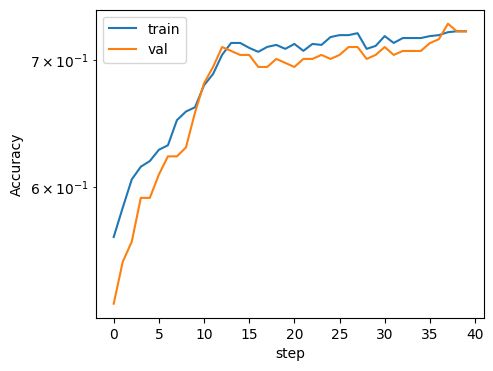

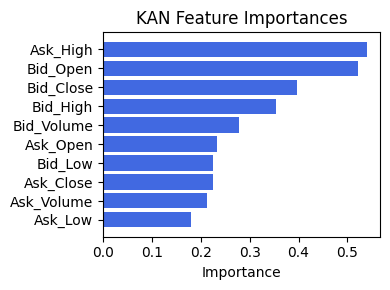

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex4', 0.8404017205233368), ('Ex5', 0.8308243776699503), ('Ex3', 0.5282773658105399), ('Ex6', 0.4583977647633254), ('Ex1', 0.28434669037605825), ('Ask_Volume', 0.25762596699010776), ('Ex2', 0.24463362538709993), ('Ask_Close', 0.18502693937974665), ('Bid_Volume', 0.11208584307368125), ('Ask_Low', 0.11016444438051468), ('Ask_Open', 0.07330522477218872), ('Bid_Close', 0.06680125271462473), ('Ask_High', 0.0628336496891537), ('Bid_Open', 0.04249231926504259), ('Bid_Low', 0.025612260765369967), ('Bid_High', 0.020867963731642004)]


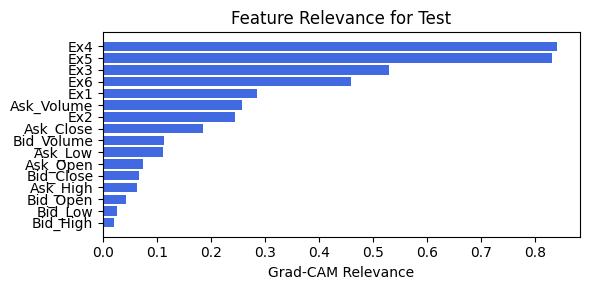

In [168]:
train_and_plot_relevance(Model3_3, kan_neurons=4, kan_grid=3, lamb=0.0001, steps=40, hidden_dim=128, filename=filename_3, opt_col_val=128)

### 3.3.1 width=[10, 3, 1], grid=4, lamb=0.0001| hidden_dim=128

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_3


 train_acc_hybrid: 7.34e-01 | val_acc_hybrid: 7.07e-01 |: 100%|█████| 40/40 [00:31<00:00,  1.25it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.1769e-01 at 15 epoch
tensor(0.7112, device='cuda:0')
[[134  49]
 [ 57 127]]
M_KAN Relevance: 0.005152441561222076
CNN Relevance: 0.9948475956916809
[('Ask_High', 0.48842433), ('Bid_Open', 0.44907337), ('Bid_Close', 0.29447526), ('Bid_High', 0.29064864), ('Ask_Close', 0.2340276), ('Bid_Volume', 0.21723439), ('Bid_Low', 0.21019104), ('Ask_Open', 0.19835332), ('Ask_Volume', 0.17044729), ('Ask_Low', 0.147802)]


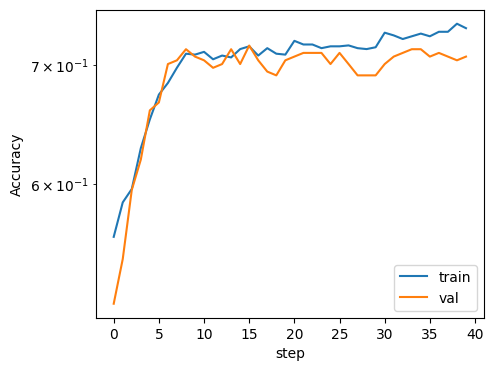

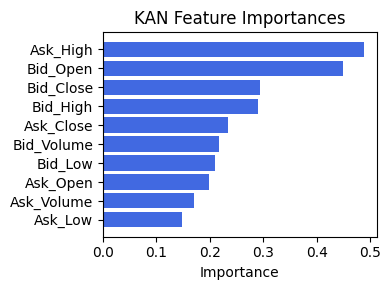

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex2', 0.6336071760538325), ('Ask_Low', 0.3501679960851448), ('Ex1', 0.24799489666823912), ('Bid_Low', 0.2079809678956988), ('Ask_High', 0.19829378057809227), ('Bid_High', 0.157678720796968), ('Bid_Close', 0.15532640521148122), ('Ex6', 0.14442125364629887), ('Ask_Volume', 0.10128057654693276), ('Ask_Open', 0.09176590361655246), ('Bid_Open', 0.03746786431634002), ('Ex5', 0.02566377448233243), ('Ex4', 0.010459108983625834), ('Ask_Close', 0.009045116725182338), ('Bid_Volume', 0.00901049357064624), ('Ex3', 0.004316354581543146)]


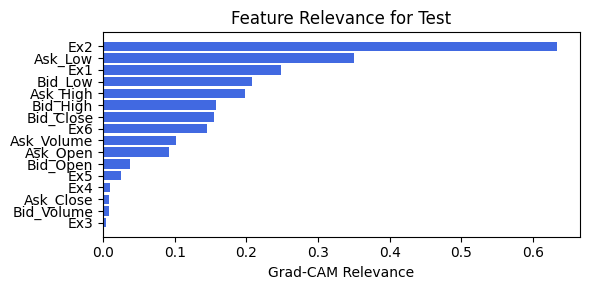

In [169]:
train_and_plot_relevance(Model3_3, kan_neurons=4, kan_grid=3, lamb=0.0001, steps=40, hidden_dim=128, filename=filename_3, opt_col_val=128)

### 3.3.2 width=[10, 3, 1], grid=4, lamb=0.0001| hidden_dim=32

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_3


 train_acc_hybrid: 7.37e-01 | val_acc_hybrid: 7.11e-01 |: 100%|█████| 40/40 [00:32<00:00,  1.24it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.2449e-01 at 10 epoch
tensor(0.7112, device='cuda:0')
[[135  48]
 [ 58 126]]
M_KAN Relevance: 0.023842517286539078
CNN Relevance: 0.9761574864387512
[('Bid_Close', 0.48312446), ('Bid_Low', 0.30401722), ('Ask_Close', 0.26412985), ('Ask_High', 0.24576186), ('Bid_High', 0.23544084), ('Bid_Volume', 0.17206058), ('Ask_Volume', 0.17078042), ('Ask_Open', 0.12536334), ('Bid_Open', 0.10905913), ('Ask_Low', 0.08460018)]


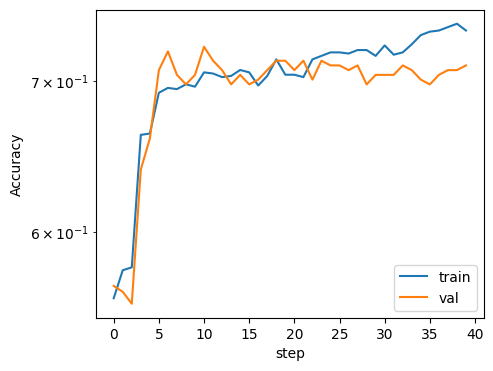

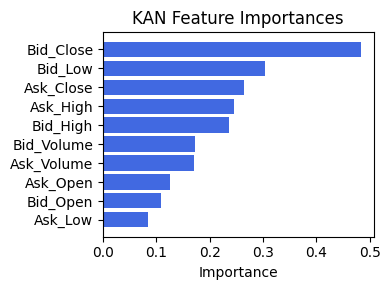

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex1', 0.7881940122521216), ('Ask_Volume', 0.7805052964823772), ('Ask_High', 0.6497512388294334), ('Ask_Open', 0.5994036024390677), ('Ask_Close', 0.37375268960315783), ('Ex2', 0.34083618290153933), ('Bid_Low', 0.3191820214609095), ('Ask_Low', 0.31656209076945074), ('Bid_High', 0.30127231745247296), ('Bid_Volume', 0.27176610944533786), ('Ex4', 0.2148830104284293), ('Ex3', 0.20245531410846748), ('Ex5', 0.18321351281669224), ('Bid_Close', 0.1583591534380867), ('Ex6', 0.1015220417219851), ('Bid_Open', 0.09510231791435277)]


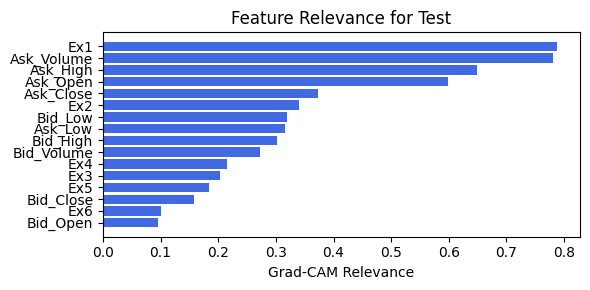

In [170]:
train_and_plot_relevance(Model3_3, kan_neurons=4, kan_grid=3, lamb=0.0001, steps=40, hidden_dim=32, filename=filename_3, opt_col_val=32)

### 3.3.3 width=[10, 3, 1], grid=4, lamb=0.0001| hidden_dim=32

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_3


 train_acc_hybrid: 7.24e-01 | val_acc_hybrid: 7.18e-01 |: 100%|█████| 40/40 [00:23<00:00,  1.73it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.3810e-01 at 19 epoch
tensor(0.7248, device='cuda:0')
[[140  43]
 [ 58 126]]
M_KAN Relevance: 0.018013540655374527
CNN Relevance: 0.9819864630699158
[('Bid_High', 0.5630046), ('Bid_Close', 0.5105676), ('Ask_High', 0.47935474), ('Bid_Open', 0.43015593), ('Bid_Low', 0.31746122), ('Ask_Close', 0.31506234), ('Ask_Open', 0.27864248), ('Bid_Volume', 0.26914147), ('Ask_Volume', 0.24109404), ('Ask_Low', 0.16755651)]


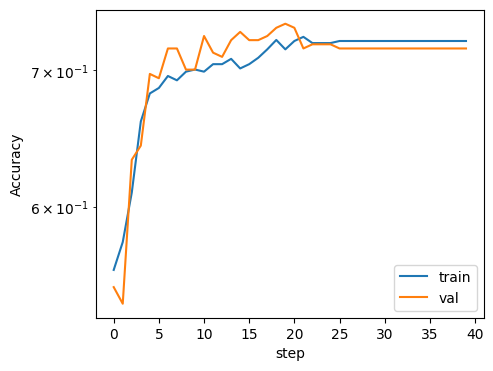

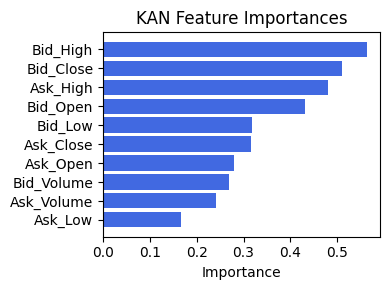

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex1', 0.6562458626743234), ('Ask_High', 0.5958868730051966), ('Ask_Volume', 0.5769715105317919), ('Ask_Open', 0.4855710673640794), ('Bid_Low', 0.40158669768762206), ('Bid_High', 0.36798383385813427), ('Ex2', 0.2711947519707745), ('Ask_Low', 0.25362887845580195), ('Bid_Close', 0.15450067628601347), ('Ask_Close', 0.14767368815202336), ('Bid_Volume', 0.10467633764876169), ('Bid_Open', 0.0658854692129162), ('Ex4', 0.015885163518160515), ('Ex3', 0.010334656648475033), ('Ex6', 0.007255946158108552), ('Ex5', 0.004119878565084173)]


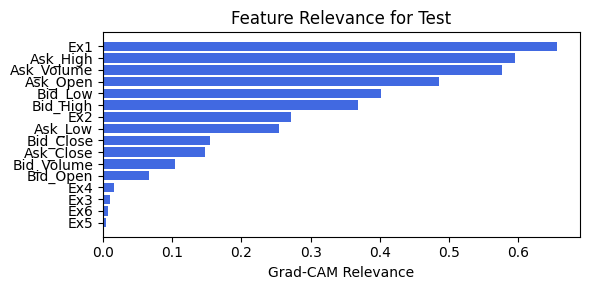

In [171]:
train_and_plot_relevance(Model3_3, kan_neurons=4, kan_grid=3, lamb=0.0001, steps=40, hidden_dim=32, filename=filename_3, opt_col_val=32)

### 3.3.4 width=[10, 3, 1], grid=4, lamb=0.0001| hidden_dim=8

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_3


 train_acc_hybrid: 7.47e-01 | val_acc_hybrid: 7.07e-01 |: 100%|█████| 40/40 [00:28<00:00,  1.39it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.3129e-01 at 15 epoch
tensor(0.7330, device='cuda:0')
[[137  46]
 [ 52 132]]
M_KAN Relevance: 0.010415719822049141
CNN Relevance: 0.9895842671394348
[('Bid_Close', 1.0231482), ('Ask_High', 0.88028723), ('Bid_Open', 0.7655946), ('Bid_High', 0.676915), ('Bid_Low', 0.6440495), ('Ask_Open', 0.42910627), ('Ask_Close', 0.39527273), ('Bid_Volume', 0.33740205), ('Ask_Volume', 0.28742576), ('Ask_Low', 0.23735288)]


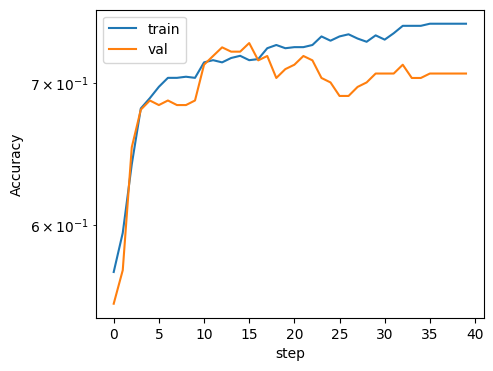

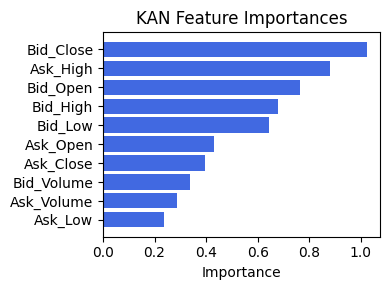

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex1', 0.5866682502245708), ('Ask_Volume', 0.42493808366947017), ('Ex2', 0.4231777364741478), ('Ask_High', 0.28790254480324745), ('Ask_Low', 0.2648373068556474), ('Ask_Open', 0.2168625773042339), ('Bid_Low', 0.18994263293378927), ('Bid_Close', 0.17231682156055927), ('Bid_High', 0.14732844802634715), ('Ex4', 0.09974166847339118), ('Ex5', 0.07704043607874608), ('Ask_Close', 0.044772110199327364), ('Ex3', 0.028708657112774472), ('Bid_Volume', 0.013185856709376038), ('Bid_Open', 0.011593349153944861), ('Ex6', 0.007057464338981163)]


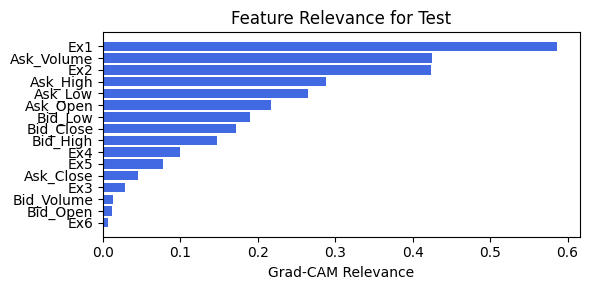

In [172]:
train_and_plot_relevance(Model3_3, kan_neurons=4, kan_grid=3, lamb=0.0001, steps=40, hidden_dim=8, filename=filename_3, opt_col_val=8)

### 3.3.5 width=[10, 3, 1], grid=4, lamb=0.0001| hidden_dim=8

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_3


 train_acc_hybrid: 7.41e-01 | val_acc_hybrid: 7.11e-01 |: 100%|█████| 40/40 [00:33<00:00,  1.21it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.1769e-01 at 36 epoch
tensor(0.7112, device='cuda:0')
[[138  45]
 [ 61 123]]
M_KAN Relevance: 0.0033572427928447723
CNN Relevance: 0.9966427683830261
[('Bid_Close', 0.98718184), ('Ask_High', 0.6910498), ('Bid_High', 0.6705618), ('Bid_Open', 0.55459535), ('Bid_Low', 0.4582903), ('Ask_Close', 0.43189162), ('Ask_Open', 0.43102908), ('Ask_Low', 0.33326373), ('Bid_Volume', 0.32701904), ('Ask_Volume', 0.15025589)]


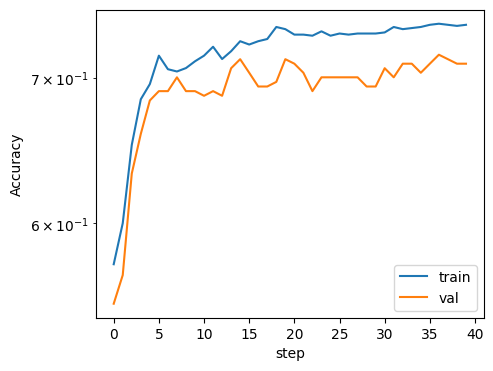

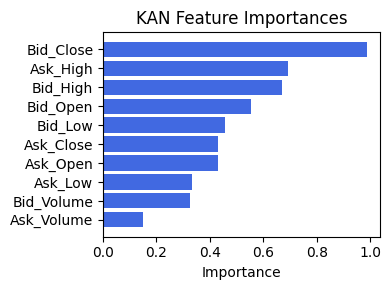

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex1', 0.603644207434612), ('Ask_Volume', 0.4338826483651001), ('Ask_High', 0.2581214452313376), ('Ex2', 0.25400276612033634), ('Ask_Open', 0.20397849983855454), ('Bid_Low', 0.17064945288437067), ('Ask_Low', 0.1486069664348942), ('Bid_High', 0.13881109041740422), ('Ex4', 0.13452755014237006), ('Bid_Close', 0.11206262590625636), ('Ex5', 0.10945222912513593), ('Ask_Close', 0.09667487719606314), ('Ex3', 0.048635977723861586), ('Bid_Volume', 0.04390078540858895), ('Ex6', 0.02438548434023271), ('Bid_Open', 0.018949135751404788)]


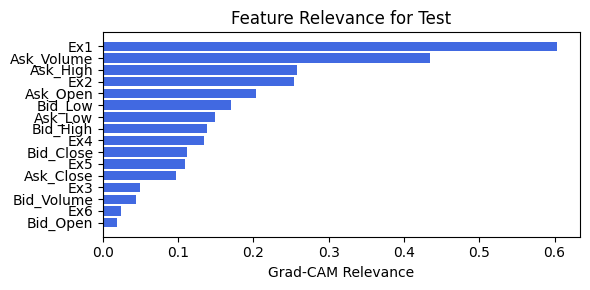

In [173]:
train_and_plot_relevance(Model3_3, kan_neurons=4, kan_grid=3, lamb=0.0001, steps=40, hidden_dim=8, filename=filename_3, opt_col_val=8)

# Opt4: MultiHead Attention

In [51]:
create_csv_with_header(filename_4, columns_opt4)

## 4.0. width=[10, 3, 1], grid=3, lamb=1e-06

embed_dim: 64, num_head:2
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 7.29e-01 | val_acc_hybrid: 7.04e-01 |: 100%|█████| 50/50 [01:05<00:00,  1.32s/it]


saving model version 0.1
✅ Best validation Accuracy: 7.2789e-01 at 11 epoch
tensor(0.7139, device='cuda:0')
[[125  58]
 [ 47 137]]
M_KAN Relevance: 0.0034964203368872404
CNN Relevance: 0.9965035319328308
[('Bid_Open', 0.75341606), ('Bid_Low', 0.7490754), ('Ask_Low', 0.60882115), ('Ask_High', 0.5268368), ('Bid_High', 0.47959134), ('Bid_Volume', 0.33826178), ('Bid_Close', 0.26455152), ('Ask_Close', 0.25551912), ('Ask_Volume', 0.21562915), ('Ask_Open', 0.16107592)]


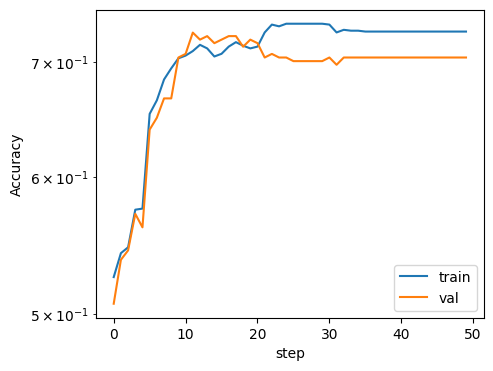

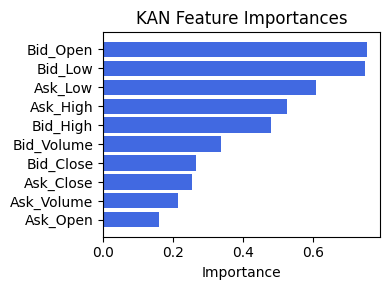

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ask_High', 0.3880332564016454), ('Ex1', 0.31434282605670777), ('Bid_Low', 0.24436511021527418), ('Ex2', 0.23661418153577018), ('Ask_Low', 0.23308950268767512), ('Ask_Volume', 0.15040292560848678), ('Bid_High', 0.14575093820670806), ('Bid_Close', 0.13890175007084482), ('Ask_Open', 0.12055612511953309), ('Ex3', 0.037115743713899405), ('Ask_Close', 0.022911995484627534), ('Bid_Volume', 0.018445045565450388), ('Ex4', 0.01373142305011696), ('Bid_Open', 0.009524955877676423), ('Ex5', 0.002316027113340531), ('Ex6', 4.417628648739095e-05)]


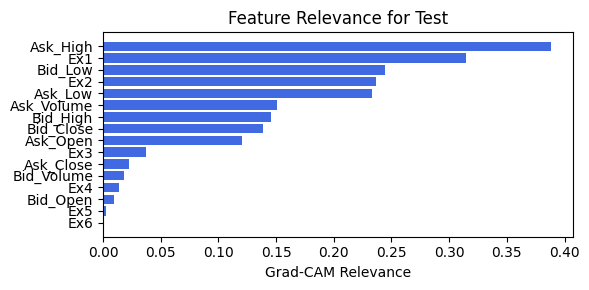

embed_dim: 64, num_head:4
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 7.39e-01 | val_acc_hybrid: 7.11e-01 |: 100%|█████| 50/50 [01:29<00:00,  1.79s/it]


saving model version 0.1
✅ Best validation Accuracy: 7.3810e-01 at 21 epoch
tensor(0.7221, device='cuda:0')
[[129  54]
 [ 48 136]]
M_KAN Relevance: 0.09228326380252838
CNN Relevance: 0.9077167510986328
[('Bid_Open', 0.75429964), ('Bid_Low', 0.7499378), ('Ask_Low', 0.60963047), ('Ask_High', 0.52759254), ('Bid_High', 0.48039243), ('Bid_Volume', 0.33864284), ('Bid_Close', 0.2652781), ('Ask_Close', 0.2562654), ('Ask_Volume', 0.21590826), ('Ask_Open', 0.16182376)]


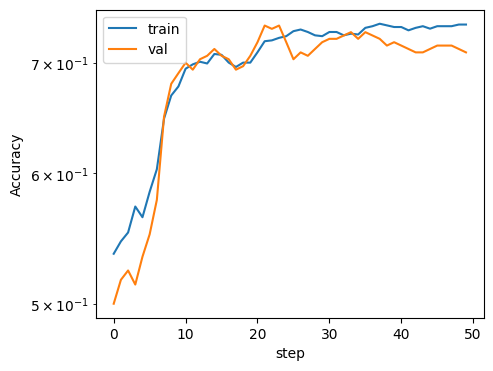

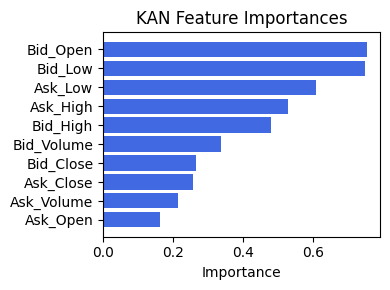

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ask_High', 0.3828960517345235), ('Bid_Low', 0.2674011033648823), ('Ex1', 0.22612466390204378), ('Ask_Low', 0.2192755597630866), ('Ex2', 0.1826759088906264), ('Bid_High', 0.17519870150698874), ('Bid_Close', 0.14838453042016386), ('Ex3', 0.12862849406826968), ('Ask_Volume', 0.1191457053756675), ('Ask_Open', 0.08945802619968787), ('Ask_Close', 0.07291516150138214), ('Bid_Volume', 0.06367668189705991), ('Bid_Open', 0.043217767993757775), ('Ex4', 0.03209749391563846), ('Ex5', 0.02724733459446021), ('Ex6', 0.010865441515879344)]


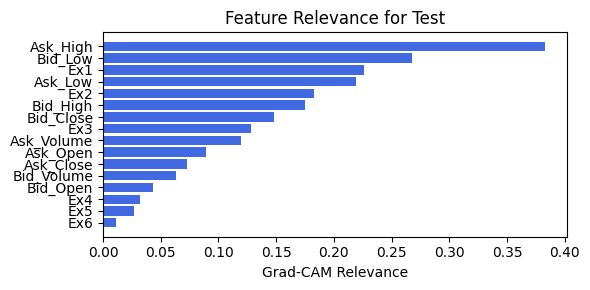

embed_dim: 64, num_head:8
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 7.47e-01 | val_acc_hybrid: 7.14e-01 |: 100%|█████| 50/50 [01:23<00:00,  1.67s/it]


saving model version 0.1
✅ Best validation Accuracy: 7.3469e-01 at 19 epoch
tensor(0.7221, device='cuda:0')
[[129  54]
 [ 48 136]]
M_KAN Relevance: 0.05406837537884712
CNN Relevance: 0.945931613445282
[('Bid_Open', 0.7611243), ('Bid_Low', 0.75659895), ('Ask_Low', 0.6158986), ('Ask_High', 0.53345156), ('Bid_High', 0.4866252), ('Bid_Volume', 0.3415833), ('Bid_Close', 0.270916), ('Ask_Close', 0.26224017), ('Ask_Volume', 0.21807079), ('Ask_Open', 0.16771367)]


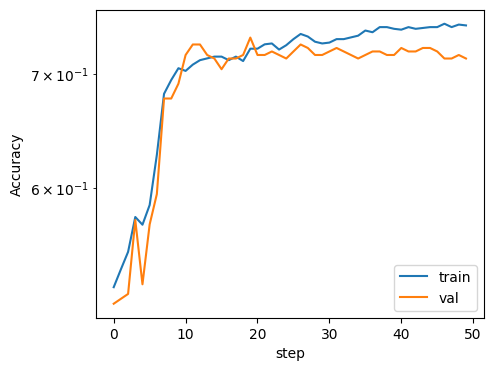

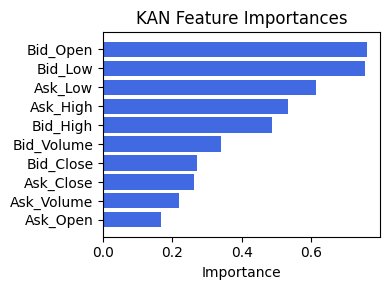

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ask_Low', 0.3579130960775575), ('Ex2', 0.34707613508610374), ('Ask_High', 0.2800932867301511), ('Ex1', 0.27491534886277746), ('Bid_Low', 0.26287296133618504), ('Bid_Close', 0.2154373370846673), ('Bid_High', 0.1556283163841895), ('Ask_Volume', 0.09252364424657462), ('Ask_Open', 0.057564958095124207), ('Ex6', 0.017153894163323035), ('Ex5', 0.01233958652146587), ('Ex3', 0.012021660761608252), ('Ask_Close', 0.011817808372123364), ('Ex4', 0.011115108362883735), ('Bid_Volume', 0.00805776453087213), ('Bid_Open', 0.005251684640369274)]


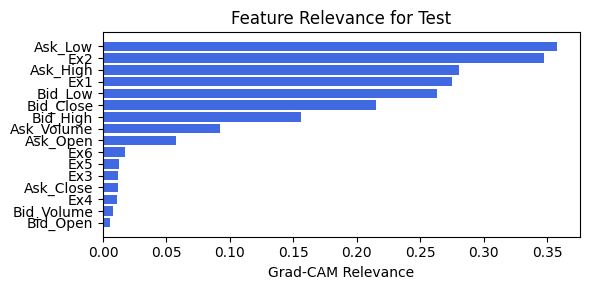

embed_dim: 32, num_head:2
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 7.29e-01 | val_acc_hybrid: 7.21e-01 |: 100%|█████| 50/50 [01:25<00:00,  1.71s/it]


saving model version 0.1
✅ Best validation Accuracy: 7.2109e-01 at 48 epoch
tensor(0.7193, device='cuda:0')
[[131  52]
 [ 51 133]]
M_KAN Relevance: 0.03643469884991646
CNN Relevance: 0.9635653495788574
[('Bid_Open', 0.76119983), ('Bid_Low', 0.75666994), ('Ask_Low', 0.6159651), ('Ask_High', 0.5335101), ('Bid_High', 0.4866943), ('Bid_Volume', 0.34161496), ('Bid_Close', 0.2709728), ('Ask_Close', 0.26231033), ('Ask_Volume', 0.21809241), ('Ask_Open', 0.16777776)]


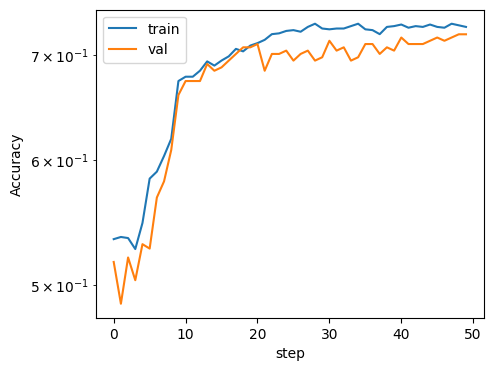

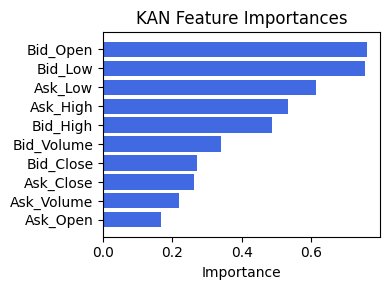

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ask_Volume', 0.5716911059796648), ('Ex1', 0.5464847492262194), ('Ex5', 0.5177080232398813), ('Ex4', 0.474267050380278), ('Ask_Close', 0.3558424687474885), ('Ask_Open', 0.3245327577522413), ('Ex6', 0.30437149217210163), ('Ask_High', 0.3036120973700072), ('Bid_Volume', 0.2422255689668371), ('Ex2', 0.2297539034051369), ('Ex3', 0.17942307208352581), ('Ask_Low', 0.10308326173818617), ('Bid_High', 0.09171876811777047), ('Bid_Low', 0.08187355058907997), ('Bid_Open', 0.07557297239596089), ('Bid_Close', 0.04093680880450798)]


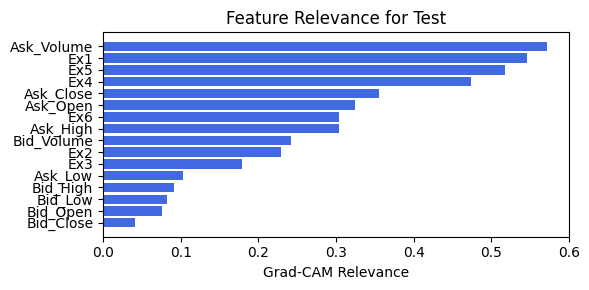

embed_dim: 32, num_head:4
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 7.47e-01 | val_acc_hybrid: 6.90e-01 |: 100%|█████| 50/50 [01:22<00:00,  1.65s/it]


saving model version 0.1
✅ Best validation Accuracy: 7.2449e-01 at 21 epoch
tensor(0.7057, device='cuda:0')
[[125  58]
 [ 50 134]]
M_KAN Relevance: 0.018115505576133728
CNN Relevance: 0.9818845391273499
[('Bid_Open', 0.76189727), ('Bid_Low', 0.7573528), ('Ask_Low', 0.6166098), ('Ask_High', 0.53411615), ('Bid_High', 0.4873383), ('Bid_Volume', 0.3419159), ('Bid_Close', 0.2715609), ('Ask_Close', 0.2629404), ('Ask_Volume', 0.21831553), ('Ask_Open', 0.16840237)]


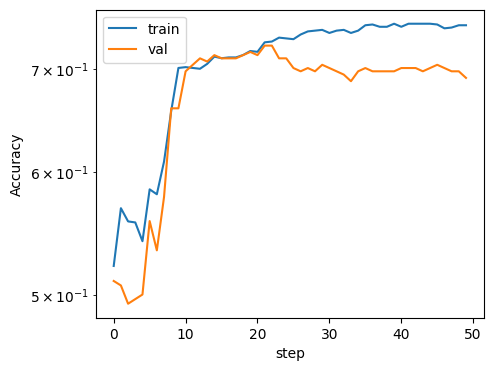

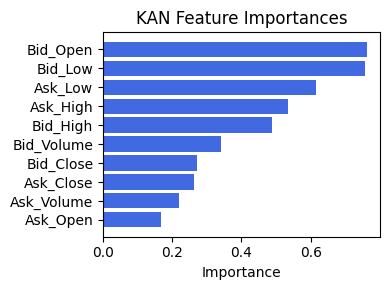

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ask_Volume', 0.7789743165104911), ('Ex1', 0.6512760795861906), ('Ask_Close', 0.5944891610774098), ('Ex3', 0.5455043219709997), ('Ask_Open', 0.5332579912883623), ('Ask_High', 0.4987957112558379), ('Ex4', 0.4950450031322805), ('Bid_Volume', 0.4007986357095537), ('Ex5', 0.35126085261790824), ('Bid_Low', 0.25179679343187916), ('Bid_High', 0.23907793910805344), ('Bid_Close', 0.16781520730579824), ('Ask_Low', 0.1388990467902998), ('Bid_Open', 0.12478915407187216), ('Ex2', 0.09788315872081596), ('Ex6', 0.01732896609555659)]


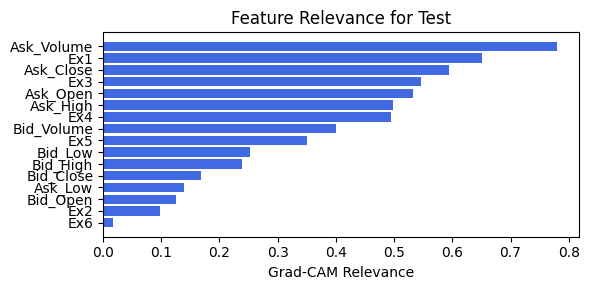

embed_dim: 32, num_head:8
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 7.47e-01 | val_acc_hybrid: 6.90e-01 |: 100%|█████| 50/50 [01:25<00:00,  1.70s/it]


saving model version 0.1
✅ Best validation Accuracy: 7.2449e-01 at 21 epoch
tensor(0.7057, device='cuda:0')
[[125  58]
 [ 50 134]]
M_KAN Relevance: 0.018115505576133728
CNN Relevance: 0.9818845391273499
[('Bid_Open', 0.76189727), ('Bid_Low', 0.7573528), ('Ask_Low', 0.6166098), ('Ask_High', 0.53411615), ('Bid_High', 0.4873383), ('Bid_Volume', 0.3419159), ('Bid_Close', 0.2715609), ('Ask_Close', 0.2629404), ('Ask_Volume', 0.21831553), ('Ask_Open', 0.16840237)]


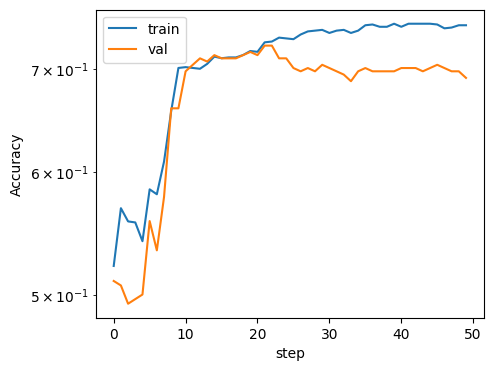

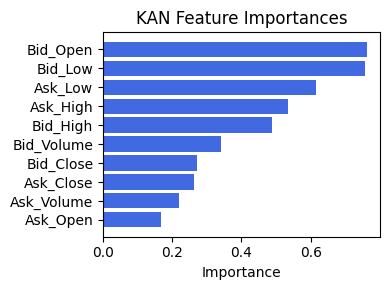

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ask_Volume', 0.7789743165104911), ('Ex1', 0.6512760795861906), ('Ask_Close', 0.5944891610774098), ('Ex3', 0.5455043219709997), ('Ask_Open', 0.5332579912883623), ('Ask_High', 0.4987957112558379), ('Ex4', 0.4950450031322805), ('Bid_Volume', 0.4007986357095537), ('Ex5', 0.35126085261790824), ('Bid_Low', 0.25179679343187916), ('Bid_High', 0.23907793910805344), ('Bid_Close', 0.16781520730579824), ('Ask_Low', 0.1388990467902998), ('Bid_Open', 0.12478915407187216), ('Ex2', 0.09788315872081596), ('Ex6', 0.01732896609555659)]


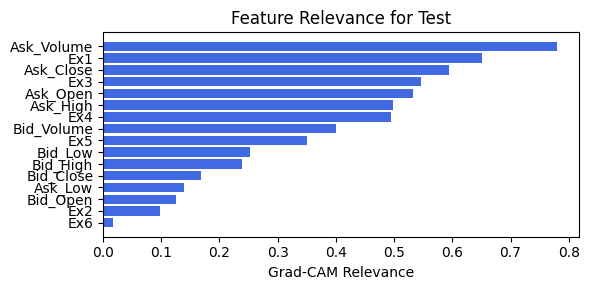

embed_dim: 16, num_head:2
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 7.31e-01 | val_acc_hybrid: 7.01e-01 |: 100%|█████| 50/50 [01:03<00:00,  1.27s/it]


saving model version 0.1
✅ Best validation Accuracy: 7.2449e-01 at 5 epoch
tensor(0.6894, device='cuda:0')
[[111  72]
 [ 42 142]]
M_KAN Relevance: 0.10920029878616333
CNN Relevance: 0.8907997608184814
[('Bid_Open', 0.7589867), ('Bid_Low', 0.75450265), ('Ask_Low', 0.6139172), ('Ask_High', 0.5315777), ('Bid_High', 0.4846583), ('Bid_Volume', 0.34065837), ('Bid_Close', 0.26910508), ('Ask_Close', 0.26034275), ('Ask_Volume', 0.21738075), ('Ask_Open', 0.1658121)]


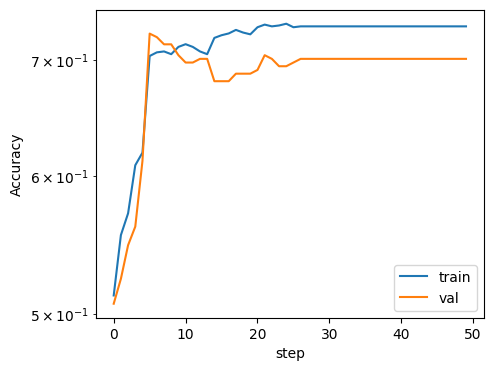

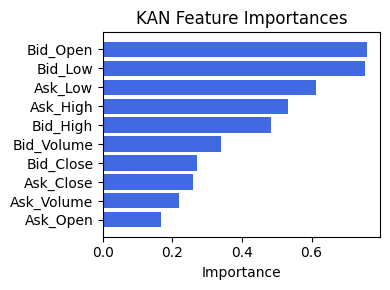

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex1', 0.7100830856071181), ('Ex2', 0.5841885407224338), ('Ask_Volume', 0.5248857034162214), ('Ex5', 0.5080028059372136), ('Ex4', 0.3930724992414261), ('Ask_High', 0.38965077238945334), ('Ask_Open', 0.30750997349675696), ('Ex6', 0.30687942378202643), ('Ask_Low', 0.285474950793118), ('Bid_Low', 0.06744178494744477), ('Bid_High', 0.05701269706679769), ('Bid_Close', 0.052793086257378434), ('Ex3', 0.0468559716571229), ('Ask_Close', 0.03298891857667694), ('Bid_Volume', 0.025484238571316233), ('Bid_Open', 0.019607942522032698)]


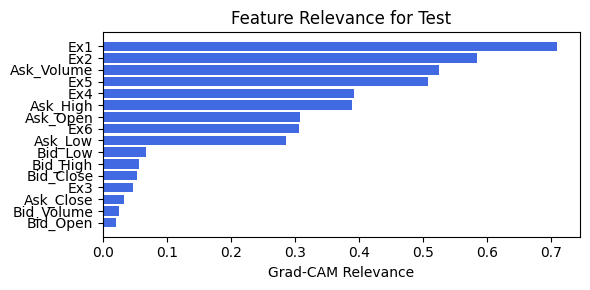

embed_dim: 16, num_head:4
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 7.31e-01 | val_acc_hybrid: 7.01e-01 |: 100%|█████| 50/50 [00:59<00:00,  1.19s/it]


saving model version 0.1
✅ Best validation Accuracy: 7.2449e-01 at 5 epoch
tensor(0.6894, device='cuda:0')
[[111  72]
 [ 42 142]]
M_KAN Relevance: 0.10920029878616333
CNN Relevance: 0.8907997608184814
[('Bid_Open', 0.7589867), ('Bid_Low', 0.75450265), ('Ask_Low', 0.6139172), ('Ask_High', 0.5315777), ('Bid_High', 0.4846583), ('Bid_Volume', 0.34065837), ('Bid_Close', 0.26910508), ('Ask_Close', 0.26034275), ('Ask_Volume', 0.21738075), ('Ask_Open', 0.1658121)]


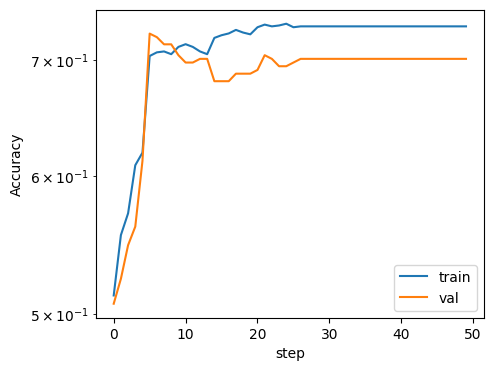

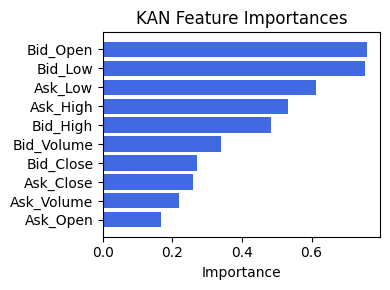

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex1', 0.7100830856071181), ('Ex2', 0.5841885407224338), ('Ask_Volume', 0.5248857034162214), ('Ex5', 0.5080028059372136), ('Ex4', 0.3930724992414261), ('Ask_High', 0.38965077238945334), ('Ask_Open', 0.30750997349675696), ('Ex6', 0.30687942378202643), ('Ask_Low', 0.285474950793118), ('Bid_Low', 0.06744178494744477), ('Bid_High', 0.05701269706679769), ('Bid_Close', 0.052793086257378434), ('Ex3', 0.0468559716571229), ('Ask_Close', 0.03298891857667694), ('Bid_Volume', 0.025484238571316233), ('Bid_Open', 0.019607942522032698)]


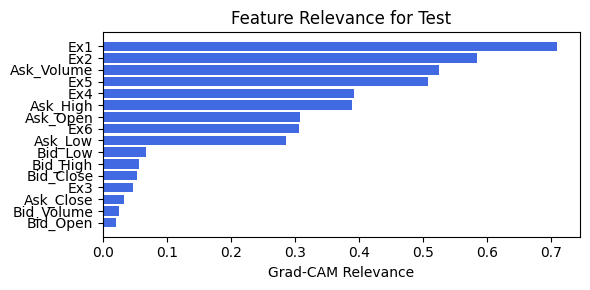

embed_dim: 16, num_head:8
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 7.34e-01 | val_acc_hybrid: 7.18e-01 |: 100%|█████| 50/50 [01:21<00:00,  1.64s/it]


saving model version 0.1
✅ Best validation Accuracy: 7.4490e-01 at 14 epoch
tensor(0.7084, device='cuda:0')
[[123  60]
 [ 47 137]]
M_KAN Relevance: 0.02760077454149723
CNN Relevance: 0.9723992347717285
[('Bid_Open', 0.76425284), ('Bid_Low', 0.7596606), ('Ask_Low', 0.6187984), ('Ask_High', 0.53618467), ('Bid_High', 0.48952445), ('Bid_Volume', 0.3429342), ('Bid_Close', 0.27357444), ('Ask_Close', 0.26509103), ('Ask_Volume', 0.21907672), ('Ask_Open', 0.17055157)]


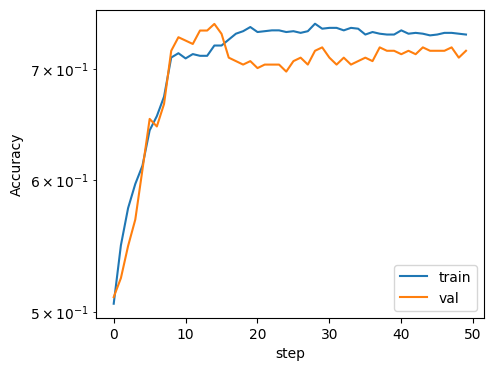

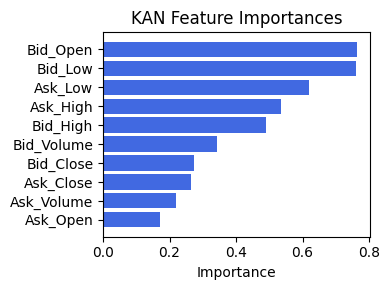

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex2', 0.5555588978270388), ('Ex6', 0.5403278891190034), ('Ex1', 0.3682067784696769), ('Ask_Volume', 0.28333112250059356), ('Ask_Low', 0.2282347183507088), ('Ex5', 0.2184314001199335), ('Ask_High', 0.16840917756828563), ('Ask_Open', 0.167384873654399), ('Ex4', 0.14799882894843736), ('Ex3', 0.09451646326815237), ('Ask_Close', 0.07903574037109311), ('Bid_Volume', 0.06061875196402177), ('Bid_High', 0.041404880749860117), ('Bid_Low', 0.0407710757417565), ('Bid_Open', 0.03395025596201511), ('Bid_Close', 0.03166662994639365)]


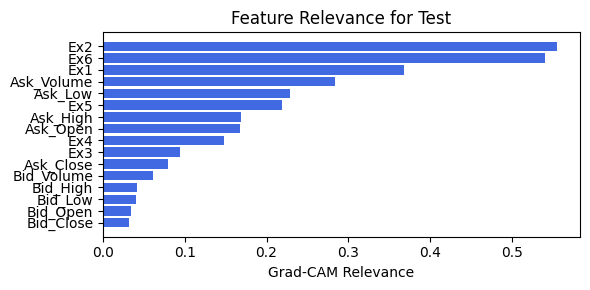

In [56]:
for embed_dim in [64, 32, 16]:
    for num_head in [2, 4 , 8]:
        print(f"embed_dim: {embed_dim}, num_head:{num_head}")
        train_and_plot_relevance(Model3_4, kan_neurons=3, kan_grid=3, lamb=1e-06, steps=50, 
                                 embed_dim=embed_dim, num_heads=num_head, filename=filename_4, opt_col_val=f'{embed_dim}, {num_head}')

### 4.0.0 width=[10, 3, 1], grid=3, lamb=1e-06 | embed_dim=64

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 7.45e-01 | val_acc_hybrid: 7.24e-01 |: 100%|█████| 45/45 [00:15<00:00,  2.91it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.3469e-01 at 19 epoch
tensor(0.7221, device='cuda:0')
[[129  54]
 [ 48 136]]
M_KAN Relevance: 0.05406837537884712
CNN Relevance: 0.945931613445282
[('Bid_Open', 0.7611243), ('Bid_Low', 0.75659895), ('Ask_Low', 0.6158986), ('Ask_High', 0.53345156), ('Bid_High', 0.4866252), ('Bid_Volume', 0.3415833), ('Bid_Close', 0.270916), ('Ask_Close', 0.26224017), ('Ask_Volume', 0.21807079), ('Ask_Open', 0.16771367)]


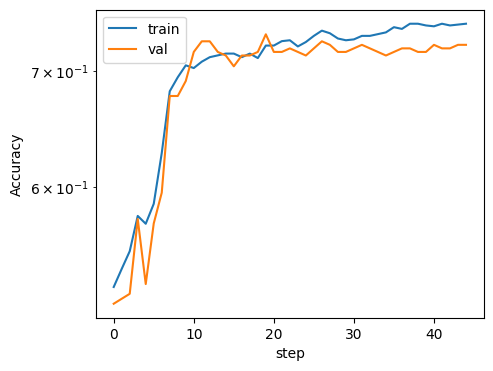

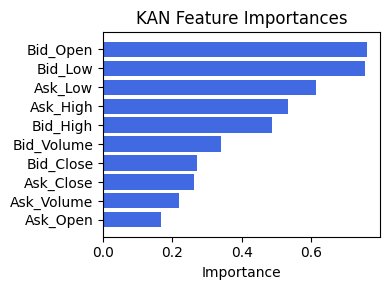

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ask_Low', 0.3579130960775575), ('Ex2', 0.34707613508610374), ('Ask_High', 0.2800932867301511), ('Ex1', 0.27491534886277746), ('Bid_Low', 0.26287296133618504), ('Bid_Close', 0.2154373370846673), ('Bid_High', 0.1556283163841895), ('Ask_Volume', 0.09252364424657462), ('Ask_Open', 0.057564958095124207), ('Ex6', 0.017153894163323035), ('Ex5', 0.01233958652146587), ('Ex3', 0.012021660761608252), ('Ask_Close', 0.011817808372123364), ('Ex4', 0.011115108362883735), ('Bid_Volume', 0.00805776453087213), ('Bid_Open', 0.005251684640369274)]


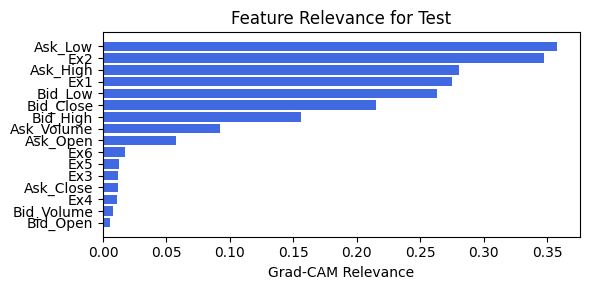

In [175]:
train_and_plot_relevance(Model3_4, kan_neurons=3, kan_grid=3, lamb=1e-06, steps=45, embed_dim=64, filename=filename_4, opt_col_val=64)

### 4.0.1 width=[10, 3, 1], grid=3, lamb=1e-06 | embed_dim=64

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 7.35e-01 | val_acc_hybrid: 7.14e-01 |: 100%|█████| 45/45 [00:19<00:00,  2.29it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.3810e-01 at 21 epoch
tensor(0.7221, device='cuda:0')
[[129  54]
 [ 48 136]]
M_KAN Relevance: 0.09228326380252838
CNN Relevance: 0.9077167510986328
[('Bid_Open', 0.75429964), ('Bid_Low', 0.7499378), ('Ask_Low', 0.60963047), ('Ask_High', 0.52759254), ('Bid_High', 0.48039243), ('Bid_Volume', 0.33864284), ('Bid_Close', 0.2652781), ('Ask_Close', 0.2562654), ('Ask_Volume', 0.21590826), ('Ask_Open', 0.16182376)]


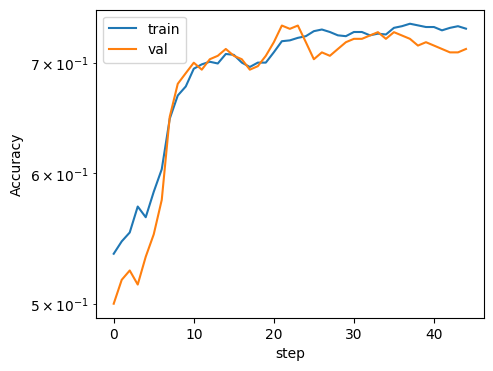

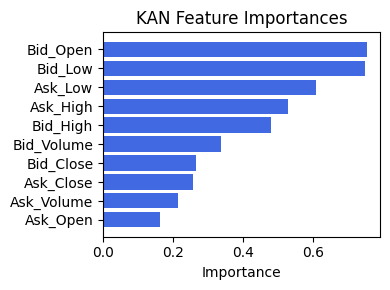

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ask_High', 0.3828960517345235), ('Bid_Low', 0.2674011033648823), ('Ex1', 0.22612466390204378), ('Ask_Low', 0.2192755597630866), ('Ex2', 0.1826759088906264), ('Bid_High', 0.17519870150698874), ('Bid_Close', 0.14838453042016386), ('Ex3', 0.12862849406826968), ('Ask_Volume', 0.1191457053756675), ('Ask_Open', 0.08945802619968787), ('Ask_Close', 0.07291516150138214), ('Bid_Volume', 0.06367668189705991), ('Bid_Open', 0.043217767993757775), ('Ex4', 0.03209749391563846), ('Ex5', 0.02724733459446021), ('Ex6', 0.010865441515879344)]


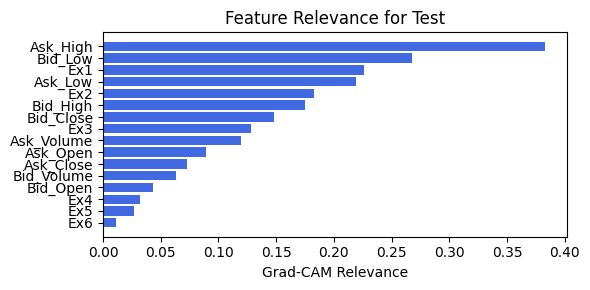

In [176]:
train_and_plot_relevance(Model3_4, kan_neurons=3, kan_grid=3, lamb=1e-06, steps=45, embed_dim=64, filename=filename_4, opt_col_val=64)

### 4.0.2 width=[10, 3, 1], grid=3, lamb=1e-06 | embed_dim=32

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 7.49e-01 | val_acc_hybrid: 7.01e-01 |: 100%|█████| 45/45 [00:16<00:00,  2.80it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.2449e-01 at 21 epoch
tensor(0.7057, device='cuda:0')
[[125  58]
 [ 50 134]]
M_KAN Relevance: 0.018115505576133728
CNN Relevance: 0.9818845391273499
[('Bid_Open', 0.76189727), ('Bid_Low', 0.7573528), ('Ask_Low', 0.6166098), ('Ask_High', 0.53411615), ('Bid_High', 0.4873383), ('Bid_Volume', 0.3419159), ('Bid_Close', 0.2715609), ('Ask_Close', 0.2629404), ('Ask_Volume', 0.21831553), ('Ask_Open', 0.16840237)]


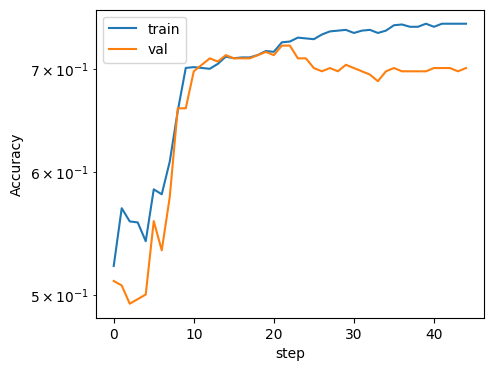

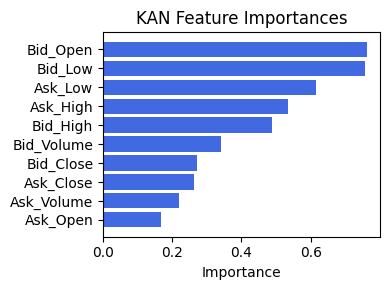

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ask_Volume', 0.7789743165104911), ('Ex1', 0.6512760795861906), ('Ask_Close', 0.5944891610774098), ('Ex3', 0.5455043219709997), ('Ask_Open', 0.5332579912883623), ('Ask_High', 0.4987957112558379), ('Ex4', 0.4950450031322805), ('Bid_Volume', 0.4007986357095537), ('Ex5', 0.35126085261790824), ('Bid_Low', 0.25179679343187916), ('Bid_High', 0.23907793910805344), ('Bid_Close', 0.16781520730579824), ('Ask_Low', 0.1388990467902998), ('Bid_Open', 0.12478915407187216), ('Ex2', 0.09788315872081596), ('Ex6', 0.01732896609555659)]


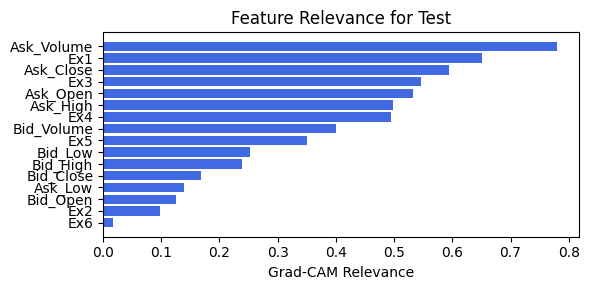

In [177]:
train_and_plot_relevance(Model3_4, kan_neurons=3, kan_grid=3, lamb=1e-06, steps=45, embed_dim=32, filename=filename_4, opt_col_val=32)

### 4.0.3 width=[10, 3, 1], grid=3, lamb=1e-06 | embed_dim=32

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 7.49e-01 | val_acc_hybrid: 7.01e-01 |: 100%|█████| 45/45 [00:19<00:00,  2.34it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.2449e-01 at 21 epoch
tensor(0.7057, device='cuda:0')
[[125  58]
 [ 50 134]]
M_KAN Relevance: 0.018115505576133728
CNN Relevance: 0.9818845391273499
[('Bid_Open', 0.76189727), ('Bid_Low', 0.7573528), ('Ask_Low', 0.6166098), ('Ask_High', 0.53411615), ('Bid_High', 0.4873383), ('Bid_Volume', 0.3419159), ('Bid_Close', 0.2715609), ('Ask_Close', 0.2629404), ('Ask_Volume', 0.21831553), ('Ask_Open', 0.16840237)]


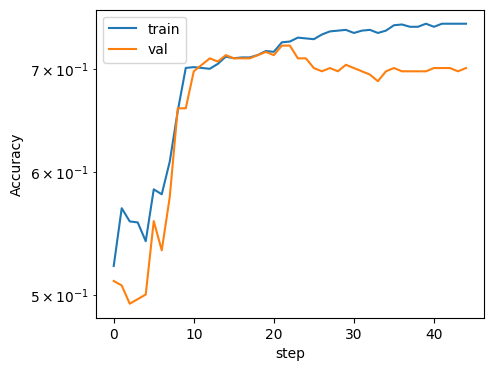

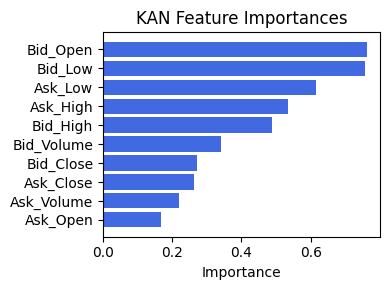

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ask_Volume', 0.7789743165104911), ('Ex1', 0.6512760795861906), ('Ask_Close', 0.5944891610774098), ('Ex3', 0.5455043219709997), ('Ask_Open', 0.5332579912883623), ('Ask_High', 0.4987957112558379), ('Ex4', 0.4950450031322805), ('Bid_Volume', 0.4007986357095537), ('Ex5', 0.35126085261790824), ('Bid_Low', 0.25179679343187916), ('Bid_High', 0.23907793910805344), ('Bid_Close', 0.16781520730579824), ('Ask_Low', 0.1388990467902998), ('Bid_Open', 0.12478915407187216), ('Ex2', 0.09788315872081596), ('Ex6', 0.01732896609555659)]


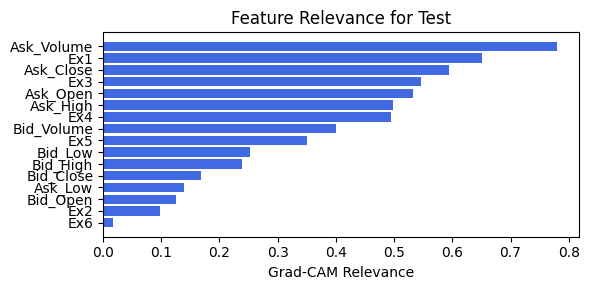

In [178]:
train_and_plot_relevance(Model3_4, kan_neurons=3, kan_grid=3, lamb=1e-06, steps=45, embed_dim=32, filename=filename_4, opt_col_val=32)

### 4.0.4 width=[10, 3, 1], grid=3, lamb=1e-06 | embed_dim=16

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 7.35e-01 | val_acc_hybrid: 7.04e-01 |: 100%|█████| 45/45 [00:14<00:00,  3.03it/s]


saving model version 0.1
✅ Best validation Accuracy: 7.3129e-01 at 11 epoch
tensor(0.7221, device='cuda:0')
[[129  54]
 [ 48 136]]
M_KAN Relevance: 0.11156788468360901
CNN Relevance: 0.8884321451187134
[('Bid_Open', 0.76087093), ('Bid_Low', 0.7563464), ('Ask_Low', 0.6156578), ('Ask_High', 0.53321576), ('Bid_High', 0.4863903), ('Bid_Volume', 0.34147185), ('Bid_Close', 0.27068874), ('Ask_Close', 0.26201746), ('Ask_Volume', 0.21798444), ('Ask_Open', 0.16748005)]


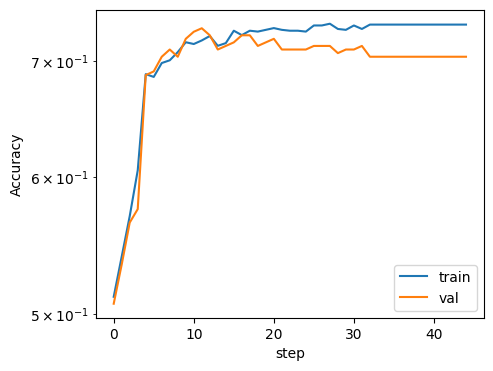

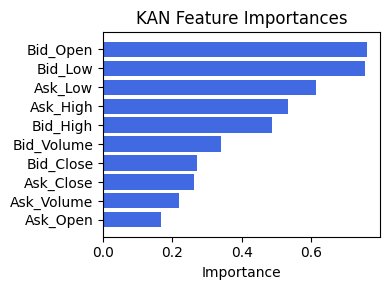

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex2', 0.5459661602121283), ('Ask_Low', 0.4104310512055493), ('Ex1', 0.2933333749179944), ('Ask_High', 0.1695431900751201), ('Ex5', 0.12820488246974893), ('Bid_Close', 0.10232444815275009), ('Ex6', 0.085080448507613), ('Ex4', 0.04280913062393665), ('Ask_Volume', 0.03707024098695281), ('Bid_Low', 0.03145986930290345), ('Ex3', 0.023163812625797957), ('Ask_Open', 0.008924468022112022), ('Ask_Close', 0.006332656019000506), ('Bid_Volume', 0.004896575163755495), ('Bid_Open', 0.00312683952601794), ('Bid_High', 0.0018248736588106736)]


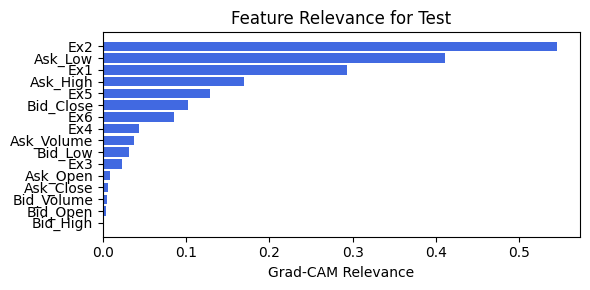

In [179]:
train_and_plot_relevance(Model3_4, kan_neurons=3, kan_grid=3, lamb=1e-06, steps=45, embed_dim=16, filename=filename_4, opt_col_val=16)

### 4.0.5 width=[10, 3, 1], grid=3, lamb=1e-06 | embed_dim=16

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 7.35e-01 | val_acc_hybrid: 7.04e-01 |: 100%|█████| 45/45 [00:13<00:00,  3.28it/s]


saving model version 0.1
✅ Best validation Accuracy: 7.3129e-01 at 11 epoch
tensor(0.7221, device='cuda:0')
[[129  54]
 [ 48 136]]
M_KAN Relevance: 0.11156788468360901
CNN Relevance: 0.8884321451187134
[('Bid_Open', 0.76087093), ('Bid_Low', 0.7563464), ('Ask_Low', 0.6156578), ('Ask_High', 0.53321576), ('Bid_High', 0.4863903), ('Bid_Volume', 0.34147185), ('Bid_Close', 0.27068874), ('Ask_Close', 0.26201746), ('Ask_Volume', 0.21798444), ('Ask_Open', 0.16748005)]


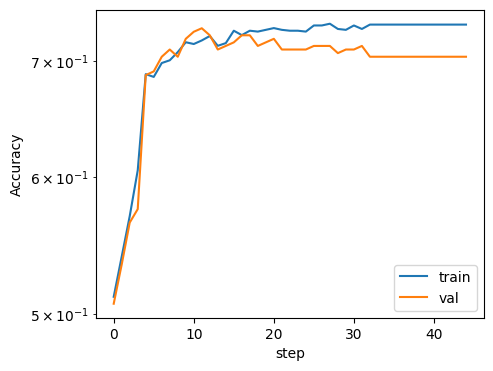

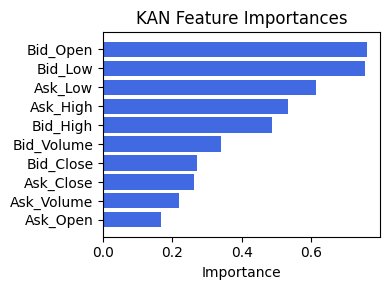

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex2', 0.5459661602121283), ('Ask_Low', 0.4104310512055493), ('Ex1', 0.2933333749179944), ('Ask_High', 0.1695431900751201), ('Ex5', 0.12820488246974893), ('Bid_Close', 0.10232444815275009), ('Ex6', 0.085080448507613), ('Ex4', 0.04280913062393665), ('Ask_Volume', 0.03707024098695281), ('Bid_Low', 0.03145986930290345), ('Ex3', 0.023163812625797957), ('Ask_Open', 0.008924468022112022), ('Ask_Close', 0.006332656019000506), ('Bid_Volume', 0.004896575163755495), ('Bid_Open', 0.00312683952601794), ('Bid_High', 0.0018248736588106736)]


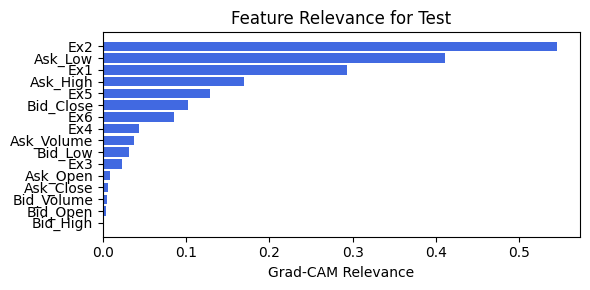

In [180]:
train_and_plot_relevance(Model3_4, kan_neurons=3, kan_grid=3, lamb=1e-06, steps=45, embed_dim=16, filename=filename_4, opt_col_val=16)

## 4.1. width=[10, 3, 1], grid=4, lamb=0.0001

embed_dim: 64, num_head:2
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 6.70e-01 | val_acc_hybrid: 6.87e-01 |: 100%|█████| 50/50 [00:53<00:00,  1.06s/it]


saving model version 0.1
✅ Best validation Accuracy: 6.9728e-01 at 14 epoch
tensor(0.6866, device='cuda:0')
[[125  58]
 [ 57 127]]
M_KAN Relevance: 0.003795543685555458
CNN Relevance: 0.9962044358253479
[('Bid_Close', 0.6079714), ('Ask_Close', 0.3824488), ('Bid_High', 0.3624267), ('Bid_Low', 0.32706532), ('Ask_High', 0.30736017), ('Ask_Low', 0.27525422), ('Bid_Volume', 0.18681143), ('Ask_Open', 0.16710655), ('Ask_Volume', 0.1446615), ('Bid_Open', 0.11428134)]


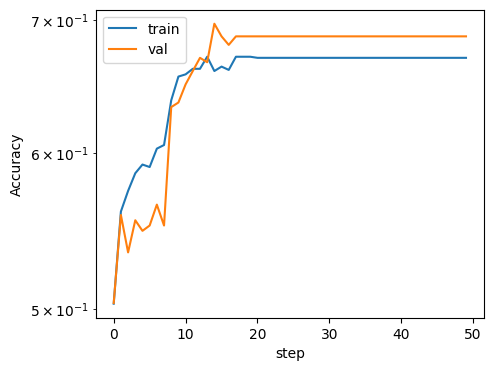

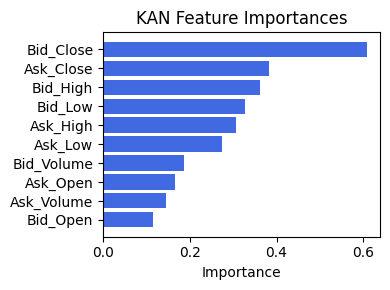

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ask_High', 0.5538857188126534), ('Ex1', 0.5103610705499276), ('Ask_Volume', 0.4768013679016412), ('Ask_Open', 0.452581839833906), ('Bid_Low', 0.37827860145723036), ('Bid_High', 0.3452073922076285), ('Ex2', 0.32531345308801457), ('Ask_Low', 0.32187569228421875), ('Ex5', 0.21157146609269023), ('Bid_Close', 0.20829999165378552), ('Ex4', 0.19327597293370893), ('Ex6', 0.16848604146564913), ('Ask_Close', 0.13390067974046793), ('Bid_Volume', 0.1306140419721923), ('Bid_Open', 0.08558720113037564), ('Ex3', 0.057291247528341374)]


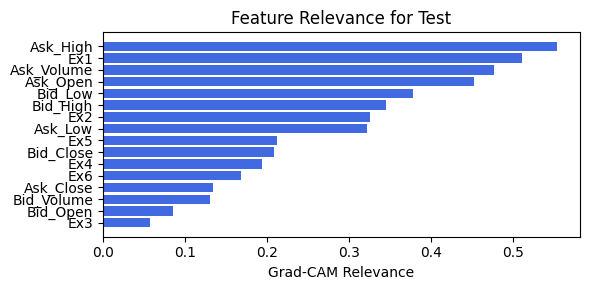

embed_dim: 64, num_head:4
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 6.70e-01 | val_acc_hybrid: 6.87e-01 |: 100%|█████| 50/50 [00:51<00:00,  1.03s/it]


saving model version 0.1
✅ Best validation Accuracy: 6.9728e-01 at 14 epoch
tensor(0.6866, device='cuda:0')
[[125  58]
 [ 57 127]]
M_KAN Relevance: 0.003795543685555458
CNN Relevance: 0.9962044358253479
[('Bid_Close', 0.6079714), ('Ask_Close', 0.3824488), ('Bid_High', 0.3624267), ('Bid_Low', 0.32706532), ('Ask_High', 0.30736017), ('Ask_Low', 0.27525422), ('Bid_Volume', 0.18681143), ('Ask_Open', 0.16710655), ('Ask_Volume', 0.1446615), ('Bid_Open', 0.11428134)]


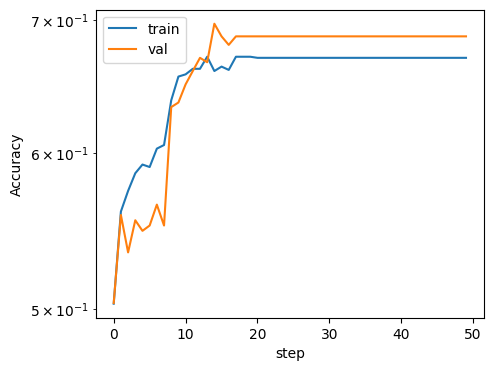

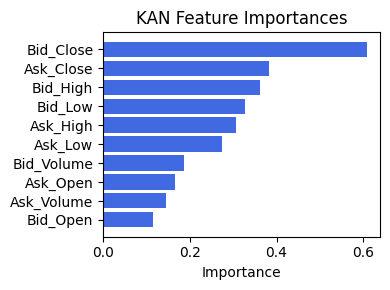

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ask_High', 0.5538857188126534), ('Ex1', 0.5103610705499276), ('Ask_Volume', 0.4768013679016412), ('Ask_Open', 0.452581839833906), ('Bid_Low', 0.37827860145723036), ('Bid_High', 0.3452073922076285), ('Ex2', 0.32531345308801457), ('Ask_Low', 0.32187569228421875), ('Ex5', 0.21157146609269023), ('Bid_Close', 0.20829999165378552), ('Ex4', 0.19327597293370893), ('Ex6', 0.16848604146564913), ('Ask_Close', 0.13390067974046793), ('Bid_Volume', 0.1306140419721923), ('Bid_Open', 0.08558720113037564), ('Ex3', 0.057291247528341374)]


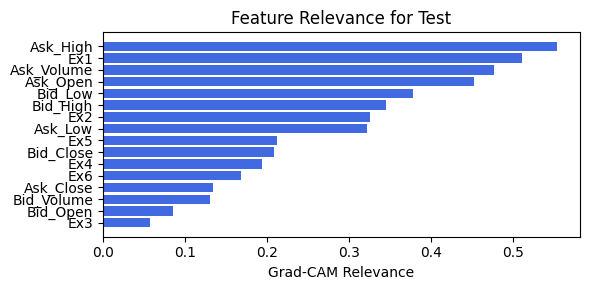

embed_dim: 64, num_head:8
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 6.76e-01 | val_acc_hybrid: 6.77e-01 |: 100%|█████| 50/50 [00:46<00:00,  1.08it/s]


saving model version 0.1
✅ Best validation Accuracy: 6.7687e-01 at 15 epoch
tensor(0.6485, device='cuda:0')
[[115  68]
 [ 61 123]]
M_KAN Relevance: 0.0011610600631684065
CNN Relevance: 0.9988389611244202
[('Bid_Close', 0.60629284), ('Bid_High', 0.3487204), ('Ask_Close', 0.32929325), ('Ask_Low', 0.24061178), ('Bid_Low', 0.23301843), ('Ask_High', 0.22651482), ('Bid_Volume', 0.18030334), ('Ask_Open', 0.13900483), ('Ask_Volume', 0.12552619), ('Bid_Open', 0.10109788)]


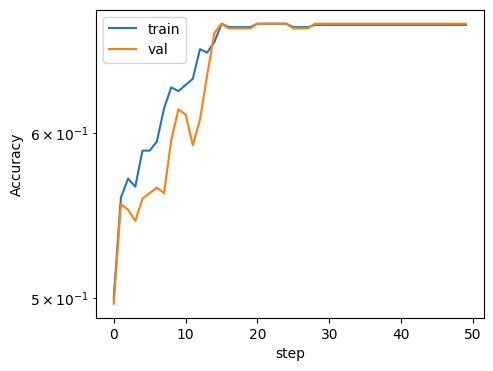

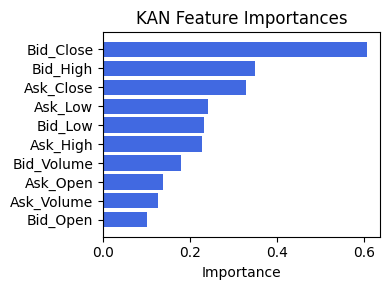

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ask_High', 0.6047694579582682), ('Ex1', 0.5493868054664752), ('Ask_Volume', 0.5200673069713551), ('Ask_Open', 0.4848102842348473), ('Bid_Low', 0.4358700491000748), ('Ask_Low', 0.3901437706737817), ('Bid_High', 0.3889094282675037), ('Ex2', 0.35899182906430166), ('Bid_Close', 0.2653191981902022), ('Ex4', 0.17725238733010099), ('Ex5', 0.17211233260115097), ('Ex6', 0.13196643684579604), ('Ask_Close', 0.12618166405277145), ('Bid_Volume', 0.12138539020881521), ('Bid_Open', 0.08339519907082164), ('Ex3', 0.06929689202936967)]


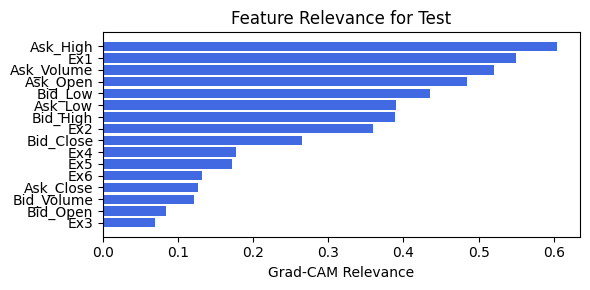

embed_dim: 32, num_head:2
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 7.08e-01 | val_acc_hybrid: 7.07e-01 |: 100%|█████| 50/50 [01:24<00:00,  1.69s/it]


saving model version 0.1
✅ Best validation Accuracy: 7.0748e-01 at 49 epoch
tensor(0.7057, device='cuda:0')
[[129  54]
 [ 54 130]]
M_KAN Relevance: 0.12167875468730927
CNN Relevance: 0.8783212304115295
[('Bid_Close', 0.6601895), ('Bid_High', 0.32641056), ('Ask_Close', 0.28234252), ('Ask_Open', 0.256973), ('Ask_Low', 0.21959794), ('Bid_Open', 0.20835263), ('Bid_Volume', 0.16219749), ('Ask_High', 0.12384677), ('Ask_Volume', 0.122115344), ('Bid_Low', 0.10280954)]


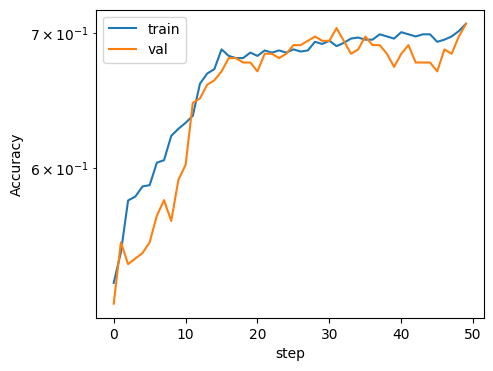

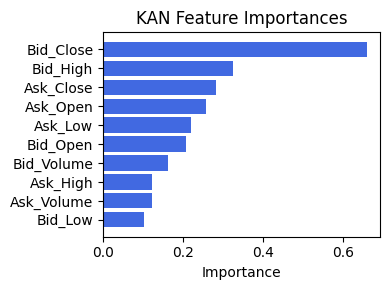

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ask_Close', 0.4514240795779435), ('Ex3', 0.2590772438926333), ('Bid_Volume', 0.1711859233042654), ('Ask_Volume', 0.030265690680632586), ('Ex4', 0.029548891658713276), ('Bid_Open', 0.02035543018693805), ('Ex6', 0.01885197354918847), ('Ex2', 0.01878814795764248), ('Ex5', 0.011636897896502766), ('Ex1', 0.011506286701276309), ('Ask_Open', 0.001085988851880692), ('Bid_High', 0.001084565788449016), ('Bid_Low', 0.00013755585577044564), ('Ask_High', 0.00013755585577044564), ('Bid_Close', 0.0), ('Ask_Low', 0.0)]


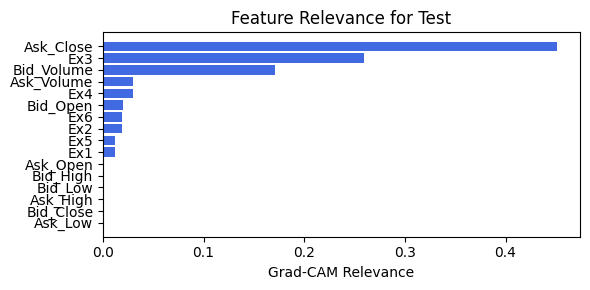

embed_dim: 32, num_head:4
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 7.05e-01 | val_acc_hybrid: 7.11e-01 |: 100%|█████| 50/50 [00:43<00:00,  1.15it/s]


saving model version 0.1
✅ Best validation Accuracy: 7.2109e-01 at 12 epoch
tensor(0.7003, device='cuda:0')
[[120  63]
 [ 47 137]]
M_KAN Relevance: 0.33386358618736267
CNN Relevance: 0.6661363840103149
[('Bid_Close', 0.6812665), ('Bid_High', 0.3386621), ('Ask_Open', 0.32671383), ('Bid_Open', 0.2877817), ('Ask_Close', 0.28008702), ('Ask_Low', 0.25140348), ('Bid_Volume', 0.16309173), ('Ask_Volume', 0.14319405), ('Bid_Low', 0.12596995), ('Ask_High', 0.12381788)]


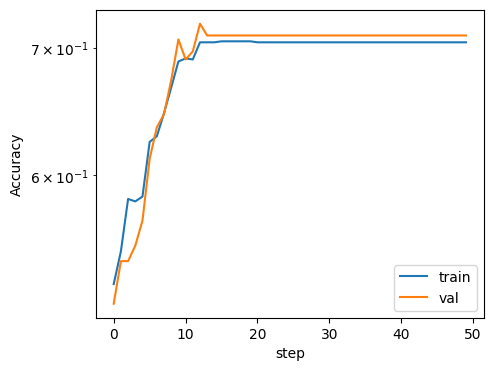

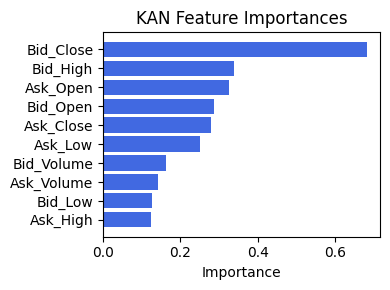

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex3', 0.7676902586842915), ('Ask_Close', 0.1627550282051193), ('Ex4', 0.09912753866898842), ('Ask_Volume', 0.03388348233103194), ('Bid_Close', 0.02800264581609695), ('Ex5', 0.02622169466899855), ('Ex2', 0.024306152368659708), ('Ask_Low', 0.024101499697270903), ('Ex1', 0.023991819773737228), ('Bid_Low', 0.006531089573320793), ('Ask_High', 0.005950281030926041), ('Ex6', 0.004812957029358284), ('Ask_Open', 0.004085146176199903), ('Bid_High', 0.0038909995281302475), ('Bid_Volume', 0.0037610957951586927), ('Bid_Open', 0.0031394058802324963)]


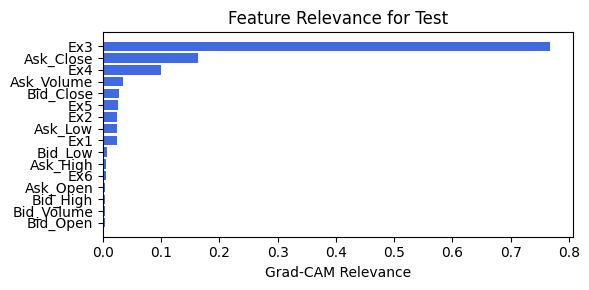

embed_dim: 32, num_head:8
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 7.05e-01 | val_acc_hybrid: 7.11e-01 |: 100%|█████| 50/50 [00:44<00:00,  1.11it/s]


saving model version 0.1
✅ Best validation Accuracy: 7.2109e-01 at 12 epoch
tensor(0.7003, device='cuda:0')
[[120  63]
 [ 47 137]]
M_KAN Relevance: 0.33386358618736267
CNN Relevance: 0.6661363840103149
[('Bid_Close', 0.6812665), ('Bid_High', 0.3386621), ('Ask_Open', 0.32671383), ('Bid_Open', 0.2877817), ('Ask_Close', 0.28008702), ('Ask_Low', 0.25140348), ('Bid_Volume', 0.16309173), ('Ask_Volume', 0.14319405), ('Bid_Low', 0.12596995), ('Ask_High', 0.12381788)]


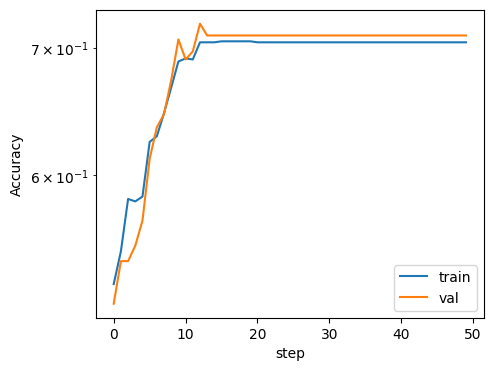

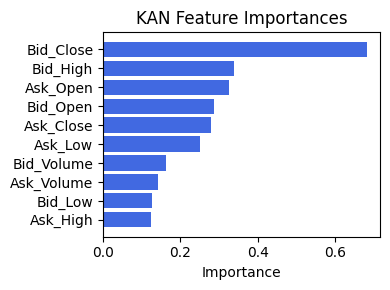

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex3', 0.7676902586842915), ('Ask_Close', 0.1627550282051193), ('Ex4', 0.09912753866898842), ('Ask_Volume', 0.03388348233103194), ('Bid_Close', 0.02800264581609695), ('Ex5', 0.02622169466899855), ('Ex2', 0.024306152368659708), ('Ask_Low', 0.024101499697270903), ('Ex1', 0.023991819773737228), ('Bid_Low', 0.006531089573320793), ('Ask_High', 0.005950281030926041), ('Ex6', 0.004812957029358284), ('Ask_Open', 0.004085146176199903), ('Bid_High', 0.0038909995281302475), ('Bid_Volume', 0.0037610957951586927), ('Bid_Open', 0.0031394058802324963)]


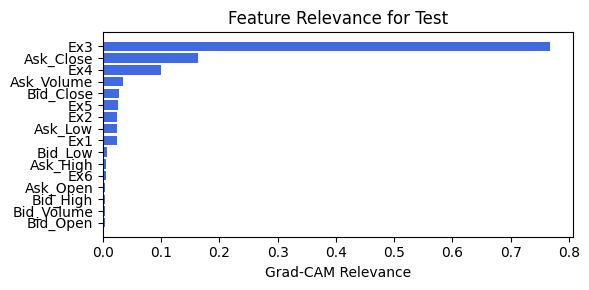

embed_dim: 16, num_head:2
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 7.45e-01 | val_acc_hybrid: 7.07e-01 |: 100%|█████| 50/50 [01:26<00:00,  1.74s/it]


saving model version 0.1
✅ Best validation Accuracy: 7.3469e-01 at 14 epoch
tensor(0.7030, device='cuda:0')
[[122  61]
 [ 48 136]]
M_KAN Relevance: 0.23382088541984558
CNN Relevance: 0.7661791443824768
[('Ask_Low', 0.42703164), ('Bid_Close', 0.41826916), ('Bid_High', 0.31573927), ('Ask_Close', 0.2866219), ('Ask_High', 0.26957044), ('Bid_Low', 0.22564697), ('Bid_Open', 0.21802995), ('Ask_Open', 0.20396864), ('Bid_Volume', 0.19465552), ('Ask_Volume', 0.13513635)]


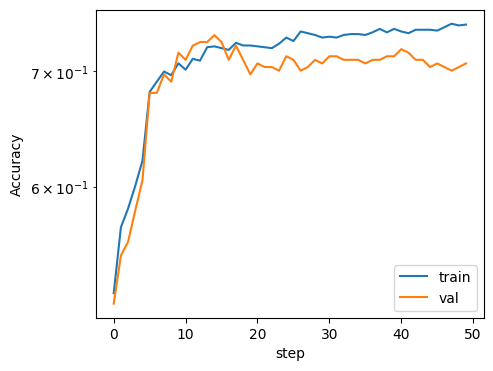

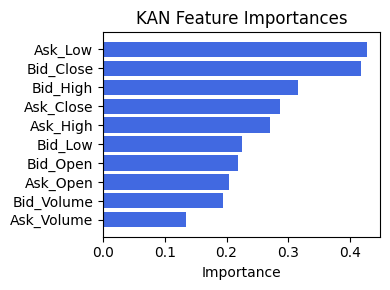

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ask_Close', 0.609845680217652), ('Ask_Volume', 0.5499231133214134), ('Bid_Volume', 0.5058933258258385), ('Ask_Open', 0.46956860493013397), ('Ex1', 0.3589965166417471), ('Ask_High', 0.3466809279404641), ('Bid_Open', 0.2898740269546968), ('Bid_High', 0.2567976593472602), ('Ex4', 0.19760467055220696), ('Ex3', 0.180623618959467), ('Bid_Low', 0.156920427961176), ('Ex5', 0.14668697991715465), ('Ex6', 0.007652616424766215), ('Bid_Close', 0.003657060181155135), ('Ex2', 0.0033335030773256166), ('Ask_Low', 0.0022121782498937953)]


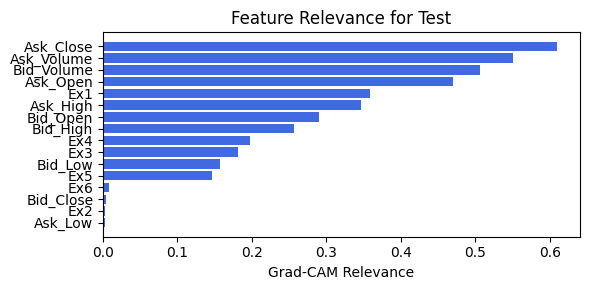

embed_dim: 16, num_head:4
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 7.44e-01 | val_acc_hybrid: 7.07e-01 |: 100%|█████| 50/50 [01:21<00:00,  1.64s/it]


saving model version 0.1
✅ Best validation Accuracy: 7.3810e-01 at 24 epoch
tensor(0.7030, device='cuda:0')
[[126  57]
 [ 52 132]]
M_KAN Relevance: 4.8354067985201254e-06
CNN Relevance: 0.9999951124191284
[('Bid_Close', 0.45136544), ('Ask_Low', 0.33705282), ('Bid_High', 0.32779175), ('Ask_Close', 0.2549195), ('Ask_Open', 0.23833057), ('Bid_Volume', 0.19380246), ('Bid_Open', 0.19211185), ('Ask_High', 0.18918078), ('Bid_Low', 0.17172128), ('Ask_Volume', 0.12901276)]


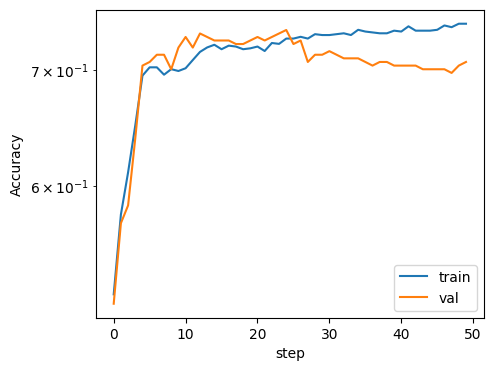

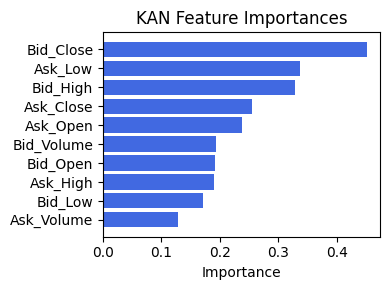

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ask_Close', 0.7256798027565434), ('Bid_Volume', 0.6493968970322479), ('Bid_Open', 0.4774675117323444), ('Bid_High', 0.20184454037642935), ('Ex3', 0.1819725319519842), ('Ask_Open', 0.16749021965802244), ('Bid_Low', 0.13152643114110146), ('Ask_Volume', 0.11994952281393943), ('Bid_Close', 0.08808650964825371), ('Ask_High', 0.08206490070682161), ('Ask_Low', 0.040030757290100534), ('Ex4', 0.032751134800749586), ('Ex1', 0.030145707554171213), ('Ex2', 0.008820430299505713), ('Ex5', 0.0), ('Ex6', 0.0)]


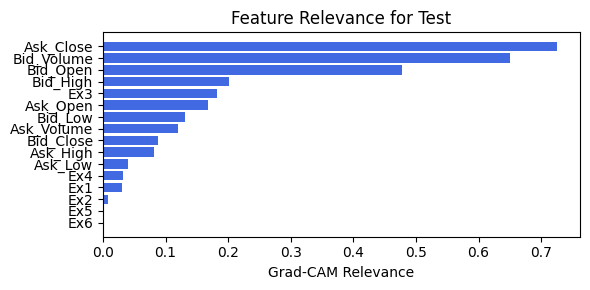

embed_dim: 16, num_head:8
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 7.47e-01 | val_acc_hybrid: 7.04e-01 |: 100%|█████| 50/50 [01:36<00:00,  1.93s/it]


saving model version 0.1
✅ Best validation Accuracy: 7.3129e-01 at 11 epoch
tensor(0.7057, device='cuda:0')
[[127  56]
 [ 52 132]]
M_KAN Relevance: 0.13542775809764862
CNN Relevance: 0.8645722270011902
[('Bid_Low', 1.9119205), ('Ask_High', 1.7623624), ('Ask_Low', 1.3254122), ('Ask_Open', 0.78231657), ('Ask_Close', 0.75291586), ('Bid_Open', 0.75016475), ('Ask_Volume', 0.56734604), ('Bid_High', 0.3645485), ('Bid_Volume', 0.279296), ('Bid_Close', 0.19145513)]


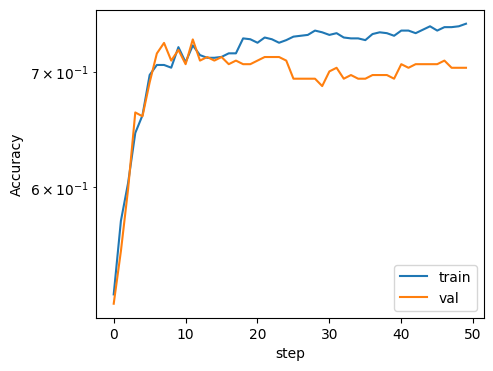

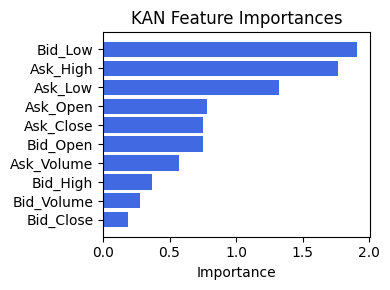

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ask_Close', 0.7661857881078278), ('Ask_Volume', 0.7326952668886418), ('Bid_Volume', 0.5500750630200721), ('Ask_Open', 0.5200606636520303), ('Ex1', 0.5172892276207822), ('Ex3', 0.4333933716086666), ('Ex4', 0.40083737805363917), ('Ask_High', 0.36776763095193077), ('Ex5', 0.2640742908259828), ('Bid_Open', 0.19064194296755668), ('Bid_High', 0.18890312962299524), ('Bid_Low', 0.1305015608852308), ('Bid_Close', 0.005867544663349155), ('Ask_Low', 0.0003557776781186025), ('Ex6', 5.896947548371976e-05), ('Ex2', 1.1260953366411317e-05)]


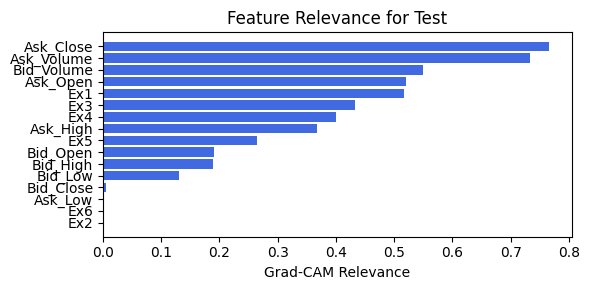

In [57]:
for embed_dim in [64, 32, 16]:
    for num_head in [2, 4 , 8]:
        print(f"embed_dim: {embed_dim}, num_head:{num_head}")
        train_and_plot_relevance(Model3_4, kan_neurons=3, kan_grid=4, lamb=0.0001, steps=50, 
                                 embed_dim=embed_dim, num_heads=num_head, filename=filename_4, opt_col_val=f'{embed_dim}, {num_head}')

### 4.1.0 width=[10, 3, 1], grid=4, lamb=0.0001 | embed_dim=64

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 6.70e-01 | val_acc_hybrid: 6.87e-01 |: 100%|█████| 50/50 [00:10<00:00,  4.62it/s]


saving model version 0.1
✅ Best validation Accuracy: 6.9728e-01 at 14 epoch
tensor(0.6866, device='cuda:0')
[[125  58]
 [ 57 127]]
M_KAN Relevance: 0.003795543685555458
CNN Relevance: 0.9962044358253479
[('Bid_Close', 0.6079714), ('Ask_Close', 0.3824488), ('Bid_High', 0.3624267), ('Bid_Low', 0.32706532), ('Ask_High', 0.30736017), ('Ask_Low', 0.27525422), ('Bid_Volume', 0.18681143), ('Ask_Open', 0.16710655), ('Ask_Volume', 0.1446615), ('Bid_Open', 0.11428134)]


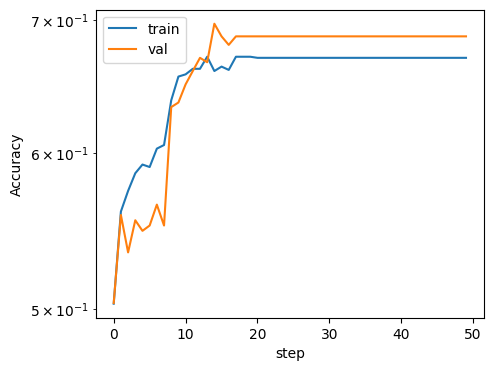

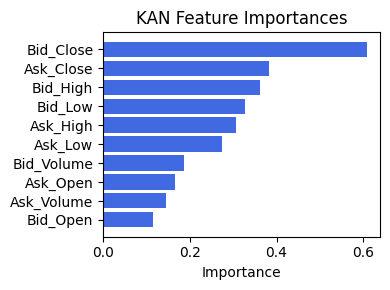

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ask_High', 0.5538857188126534), ('Ex1', 0.5103610705499276), ('Ask_Volume', 0.4768013679016412), ('Ask_Open', 0.452581839833906), ('Bid_Low', 0.37827860145723036), ('Bid_High', 0.3452073922076285), ('Ex2', 0.32531345308801457), ('Ask_Low', 0.32187569228421875), ('Ex5', 0.21157146609269023), ('Bid_Close', 0.20829999165378552), ('Ex4', 0.19327597293370893), ('Ex6', 0.16848604146564913), ('Ask_Close', 0.13390067974046793), ('Bid_Volume', 0.1306140419721923), ('Bid_Open', 0.08558720113037564), ('Ex3', 0.057291247528341374)]


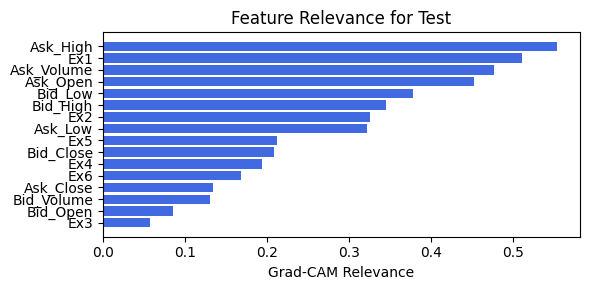

In [181]:
train_and_plot_relevance(Model3_4, kan_neurons=3, kan_grid=4, lamb=0.0001, steps=50, embed_dim=64, filename=filename_4, opt_col_val=64)

### 4.1.1 width=[10, 3, 1], grid=4, lamb=0.0001 | embed_dim=64

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 6.96e-01 | val_acc_hybrid: 7.24e-01 |: 100%|█████| 50/50 [00:10<00:00,  4.78it/s]


saving model version 0.1
✅ Best validation Accuracy: 7.3129e-01 at 20 epoch
tensor(0.6676, device='cuda:0')
[[118  65]
 [ 57 127]]
M_KAN Relevance: 0.0007687539327889681
CNN Relevance: 0.999231219291687
[('Bid_Close', 0.59727323), ('Bid_High', 0.34365913), ('Ask_Close', 0.2959776), ('Ask_Low', 0.23025101), ('Ask_High', 0.18877284), ('Bid_Low', 0.18370983), ('Bid_Volume', 0.17916343), ('Ask_Open', 0.14574994), ('Ask_Volume', 0.11812409), ('Bid_Open', 0.10392046)]


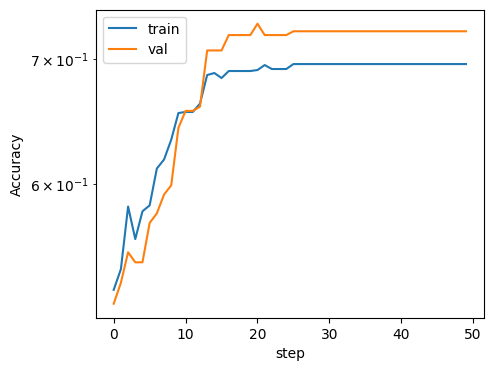

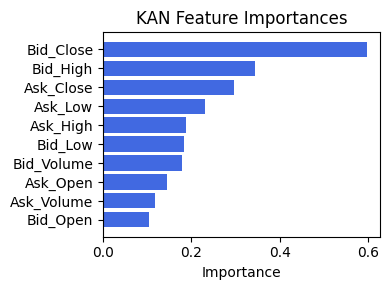

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ask_High', 0.6138282351256716), ('Ex1', 0.5521726700571196), ('Ask_Volume', 0.5267411962237808), ('Ask_Open', 0.5089620827045038), ('Bid_Low', 0.41792193110727727), ('Bid_High', 0.3779244534062267), ('Ask_Low', 0.3777062256670778), ('Ex2', 0.35756208668450246), ('Bid_Close', 0.24882348373402874), ('Ask_Close', 0.15289412202581265), ('Ex4', 0.14786305073559872), ('Bid_Volume', 0.1447680932380848), ('Ex6', 0.13981911010230696), ('Ex5', 0.13537470176460714), ('Bid_Open', 0.09198070896918853), ('Ex3', 0.06709754557763696)]


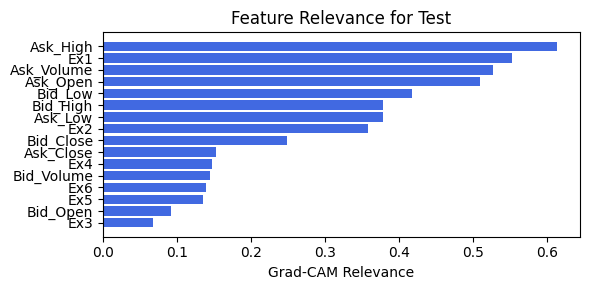

In [182]:
train_and_plot_relevance(Model3_4, kan_neurons=3, kan_grid=4, lamb=0.0001, steps=50, embed_dim=64, filename=filename_4, opt_col_val=64)

### 4.1.2 width=[10, 3, 1], grid=4, lamb=0.0001 | embed_dim=32

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 7.42e-01 | val_acc_hybrid: 7.07e-01 |: 100%|█████| 50/50 [00:16<00:00,  2.94it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.3129e-01 at 27 epoch
tensor(0.7084, device='cuda:0')
[[121  62]
 [ 45 139]]
M_KAN Relevance: 0.3301481306552887
CNN Relevance: 0.6698518395423889
[('Bid_Close', 0.7005665), ('Ask_Close', 0.41998357), ('Bid_Low', 0.39882073), ('Ask_High', 0.3878767), ('Ask_Low', 0.31553814), ('Bid_High', 0.2602678), ('Ask_Volume', 0.17707716), ('Bid_Open', 0.17338306), ('Ask_Open', 0.1722064), ('Bid_Volume', 0.1354035)]


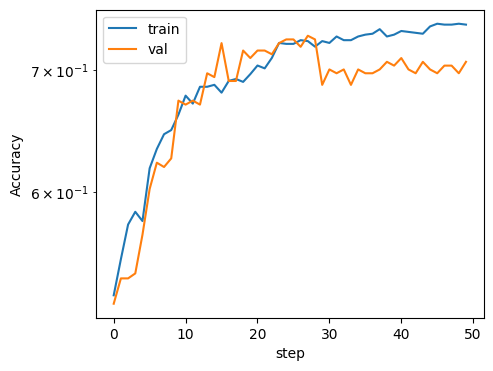

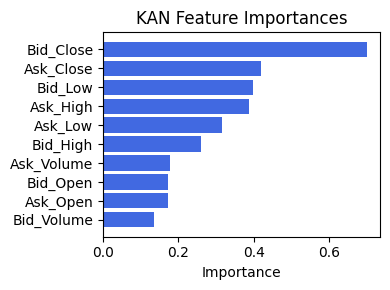

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex3', 0.22728241858267978), ('Ask_Close', 0.0880726719191374), ('Ask_Low', 0.0068228606956856125), ('Ex4', 0.006035434987144773), ('Ex2', 0.005173327893587159), ('Ex6', 0.004743716433360076), ('Bid_Close', 0.003794862561394798), ('Bid_High', 0.0019207991334820314), ('Bid_Open', 0.0019163059156986934), ('Bid_Low', 0.0018049763155243378), ('Ex5', 0.0017730843806157157), ('Ex1', 0.0013984949657901593), ('Ask_Volume', 0.0009551441420011771), ('Bid_Volume', 0.0006817608528671537), ('Ask_Open', 0.0002813680549164884), ('Ask_High', 8.976104864673003e-05)]


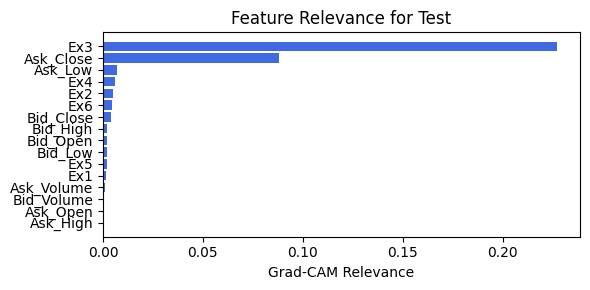

In [183]:
train_and_plot_relevance(Model3_4, kan_neurons=3, kan_grid=4, lamb=0.0001, steps=50, embed_dim=32, filename=filename_4, opt_col_val=32)

### 4.1.3 width=[10, 3, 1], grid=4, lamb=0.0001 | embed_dim=32

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 7.01e-01 | val_acc_hybrid: 6.97e-01 |: 100%|█████| 50/50 [00:20<00:00,  2.45it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.2789e-01 at 39 epoch
tensor(0.7003, device='cuda:0')
[[133  50]
 [ 60 124]]
M_KAN Relevance: 0.24871975183486938
CNN Relevance: 0.7512802481651306
[('Bid_Close', 0.6816661), ('Bid_High', 0.35462698), ('Ask_Open', 0.32658327), ('Bid_Open', 0.2893317), ('Ask_Close', 0.28852567), ('Ask_Low', 0.260525), ('Bid_Volume', 0.17021666), ('Ask_Volume', 0.14423454), ('Bid_Low', 0.13188209), ('Ask_High', 0.123954915)]


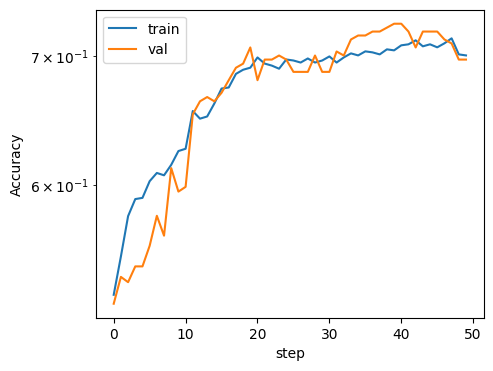

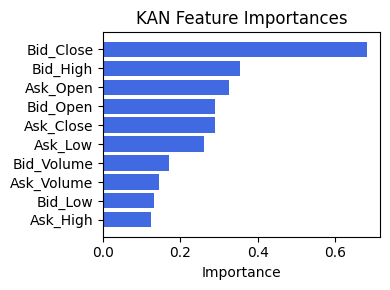

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex3', 0.5122504748343122), ('Ask_Close', 0.2153357196109476), ('Bid_Volume', 0.050127151353685666), ('Ex4', 0.013368325580843428), ('Ask_Volume', 0.009278511040167102), ('Ex5', 0.005916356359676988), ('Ex1', 0.005250192944554241), ('Bid_Open', 0.0041439258166164105), ('Bid_Close', 0.0004881752441746338), ('Ask_Low', 0.0004166836142336965), ('Ex2', 0.00033730421499514123), ('Ex6', 0.00033730421499514123), ('Ask_Open', 8.743762721279662e-05), ('Bid_High', 8.033513413787863e-05), ('Bid_Low', 4.74272747536771e-05), ('Ask_High', 4.74272747536771e-05)]


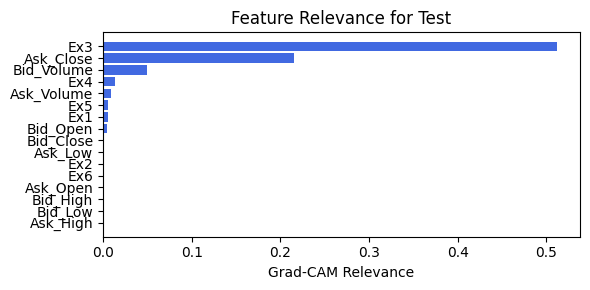

In [184]:
train_and_plot_relevance(Model3_4, kan_neurons=3, kan_grid=4, lamb=0.0001, steps=50, embed_dim=32, filename=filename_4, opt_col_val=32)

### 4.1.4 width=[10, 3, 1], grid=4, lamb=0.0001 | embed_dim=16

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 7.02e-01 | val_acc_hybrid: 7.18e-01 |: 100%|█████| 50/50 [00:08<00:00,  5.92it/s]


saving model version 0.1
✅ Best validation Accuracy: 7.1769e-01 at 8 epoch
tensor(0.7030, device='cuda:0')
[[127  56]
 [ 53 131]]
M_KAN Relevance: 0.12991876900196075
CNN Relevance: 0.8700812458992004
[('Ask_High', 0.4997408), ('Ask_Low', 0.4990108), ('Bid_Low', 0.45631617), ('Bid_High', 0.38417396), ('Ask_Close', 0.35657334), ('Bid_Close', 0.3108426), ('Bid_Volume', 0.26512682), ('Bid_Open', 0.18069488), ('Ask_Volume', 0.16812), ('Ask_Open', 0.13689388)]


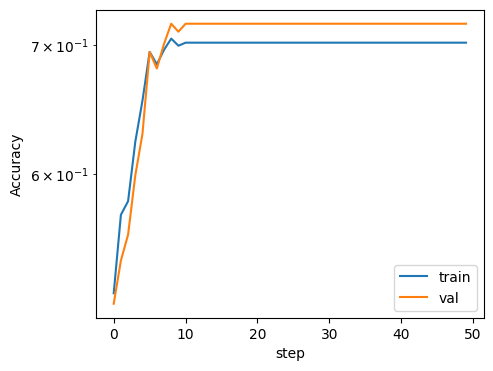

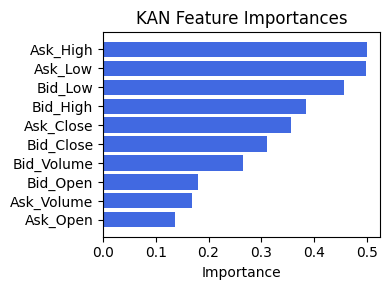

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ask_Volume', 0.8768719970692731), ('Ex1', 0.7268208817500185), ('Ask_Close', 0.6452458845172331), ('Ask_Open', 0.6050585711765679), ('Ex4', 0.5849188545094524), ('Ask_High', 0.5030759380120348), ('Ex5', 0.49820842957301753), ('Bid_Volume', 0.45144228976250345), ('Ex3', 0.3972481278859952), ('Bid_High', 0.15893702470153134), ('Bid_Open', 0.11940074124600616), ('Bid_Low', 0.11048193377514347), ('Ex2', 0.05537316369080576), ('Ex6', 0.048043830112150646), ('Ask_Low', 0.036099017703127276), ('Bid_Close', 0.0046434640915803006)]


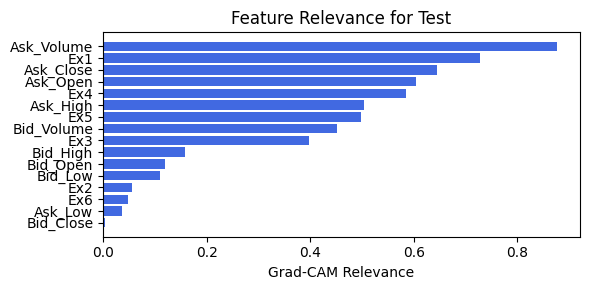

In [185]:
train_and_plot_relevance(Model3_4, kan_neurons=3, kan_grid=4, lamb=0.0001, steps=50, embed_dim=16, filename=filename_4, opt_col_val=16)

### 4.1.5 width=[10, 3, 1], grid=4, lamb=0.0001 | embed_dim=16

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 7.37e-01 | val_acc_hybrid: 7.04e-01 |: 100%|█████| 50/50 [00:22<00:00,  2.26it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.2789e-01 at 9 epoch
tensor(0.6948, device='cuda:0')
[[124  59]
 [ 53 131]]
M_KAN Relevance: 0.023885594680905342
CNN Relevance: 0.9761143922805786
[('Ask_High', 0.7399993), ('Bid_Low', 0.71121734), ('Ask_Low', 0.63166106), ('Ask_Close', 0.4385477), ('Bid_High', 0.35461062), ('Bid_Close', 0.33086348), ('Bid_Volume', 0.25708106), ('Bid_Open', 0.24668877), ('Ask_Volume', 0.23092279), ('Ask_Open', 0.21989042)]


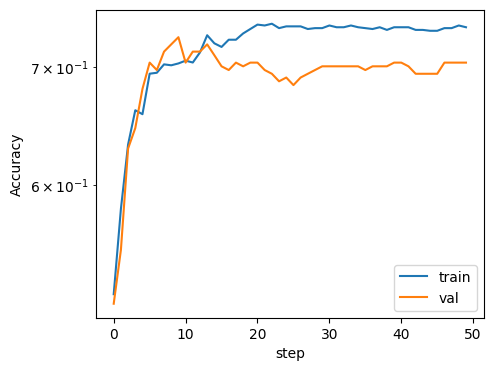

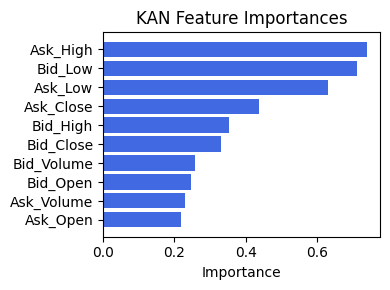

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ask_Volume', 0.8585461555124954), ('Ask_Close', 0.6947537904214469), ('Ex1', 0.6783169340697556), ('Ask_Open', 0.6191815775730305), ('Bid_Volume', 0.5023812120551959), ('Ask_High', 0.4987984717460679), ('Ex4', 0.46597899492495065), ('Ex5', 0.3832053804430065), ('Ex3', 0.3327076353883873), ('Bid_High', 0.2057524258562691), ('Bid_Open', 0.1718156926970858), ('Bid_Low', 0.14677926924602494), ('Ex6', 0.03250638232122325), ('Ex2', 0.03138883361448242), ('Ask_Low', 0.02392374174507609), ('Bid_Close', 0.004998345401013008)]


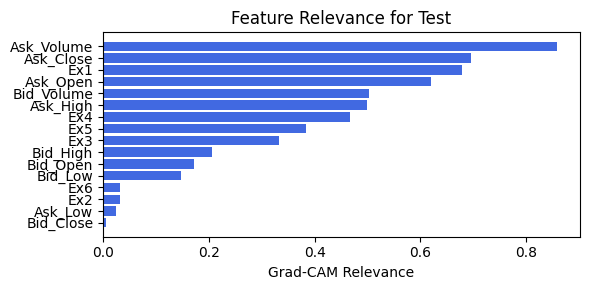

In [186]:
train_and_plot_relevance(Model3_4, kan_neurons=3, kan_grid=4, lamb=0.0001, steps=50, embed_dim=16, filename=filename_4, opt_col_val=16)

## 4.2. width=[10, 1, 1], grid=3, lamb=0.0001

embed_dim: 64, num_head:2
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 7.37e-01 | val_acc_hybrid: 7.04e-01 |: 100%|█████| 50/50 [01:24<00:00,  1.70s/it]


saving model version 0.1
✅ Best validation Accuracy: 7.2449e-01 at 11 epoch
tensor(0.7057, device='cuda:0')
[[122  61]
 [ 47 137]]
M_KAN Relevance: 0.0023911790922284126
CNN Relevance: 0.9976088404655457
[('Bid_Close', 0.53524566), ('Ask_Open', 0.4714435), ('Bid_Low', 0.39574924), ('Bid_High', 0.3688276), ('Ask_High', 0.3538337), ('Ask_Low', 0.3160671), ('Ask_Close', 0.25442523), ('Bid_Open', 0.18394762), ('Bid_Volume', 0.17878523), ('Ask_Volume', 0.14060178)]


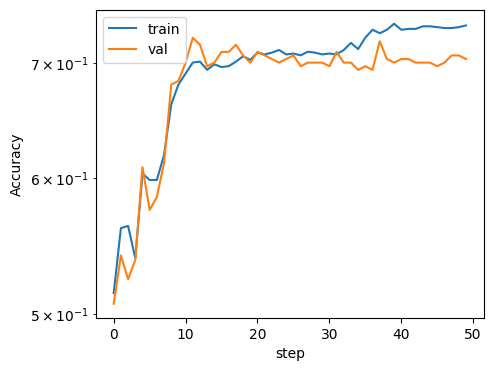

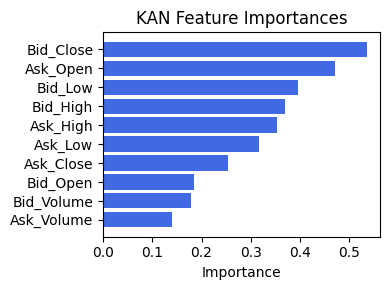

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ask_Volume', 0.8832660840382693), ('Ex1', 0.7606590403198221), ('Ask_Close', 0.5646489041296597), ('Ask_Open', 0.5398468444887067), ('Ex4', 0.47524500851410284), ('Ask_High', 0.4687123537489926), ('Ex3', 0.40243115525804357), ('Ex5', 0.36220321355626106), ('Bid_Volume', 0.35444515866858056), ('Bid_High', 0.10950508937330052), ('Bid_Low', 0.08996011871097188), ('Ex2', 0.06772038507039281), ('Bid_Open', 0.05380329578185177), ('Ask_Low', 0.044085967879772835), ('Bid_Close', 0.013896330647190052), ('Ex6', 0.008760041544881296)]


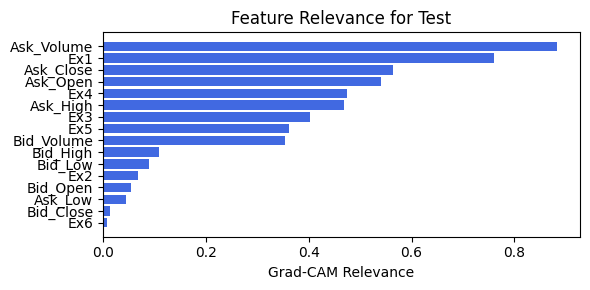

embed_dim: 64, num_head:4
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 7.27e-01 | val_acc_hybrid: 7.21e-01 |: 100%|█████| 50/50 [01:01<00:00,  1.22s/it]


saving model version 0.1
✅ Best validation Accuracy: 7.3129e-01 at 28 epoch
tensor(0.6975, device='cuda:0')
[[119  64]
 [ 47 137]]
M_KAN Relevance: 0.0005305206286720932
CNN Relevance: 0.999469518661499
[('Ask_Open', 0.3869144), ('Ask_Low', 0.3354884), ('Bid_Close', 0.3279743), ('Ask_High', 0.2569046), ('Bid_Low', 0.20531476), ('Bid_High', 0.17077458), ('Bid_Volume', 0.1647529), ('Ask_Close', 0.16399528), ('Bid_Open', 0.086584434), ('Ask_Volume', 0.08191697)]


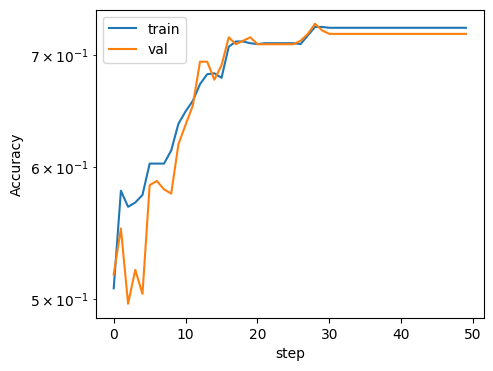

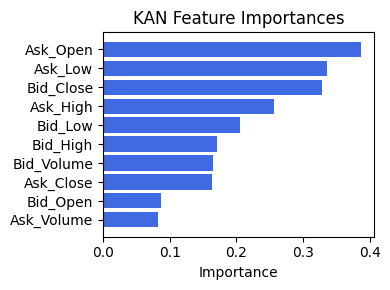

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ask_Volume', 0.7747895989658398), ('Ex1', 0.6618172876760161), ('Ask_Open', 0.6059273122543373), ('Ask_High', 0.5822389680658764), ('Ask_Close', 0.5332147187530507), ('Bid_Volume', 0.37254121994005884), ('Bid_High', 0.3003878016641401), ('Bid_Low', 0.2897077970490956), ('Ex3', 0.1847384241295405), ('Ask_Low', 0.13029927648324774), ('Ex2', 0.11105618135222013), ('Bid_Open', 0.10972596398418026), ('Ex4', 0.09426717644897403), ('Bid_Close', 0.07896545793314284), ('Ex5', 0.06236025900135898), ('Ex6', 0.0)]


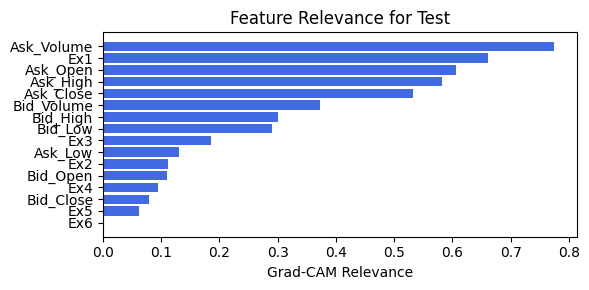

embed_dim: 64, num_head:8
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 7.30e-01 | val_acc_hybrid: 7.14e-01 |: 100%|█████| 50/50 [01:20<00:00,  1.61s/it]


saving model version 0.1
✅ Best validation Accuracy: 7.2789e-01 at 22 epoch
tensor(0.7057, device='cuda:0')
[[128  55]
 [ 53 131]]
M_KAN Relevance: 0.001668317592702806
CNN Relevance: 0.9983316659927368
[('Bid_Close', 0.35624856), ('Ask_Close', 0.24334258), ('Ask_Open', 0.14323233), ('Bid_Open', 0.10747149), ('Ask_Low', 0.09206539), ('Bid_Volume', 0.050044645), ('Ask_High', 0.04775532), ('Bid_High', 0.044823345), ('Bid_Low', 0.03100268), ('Ask_Volume', 0.022880303)]


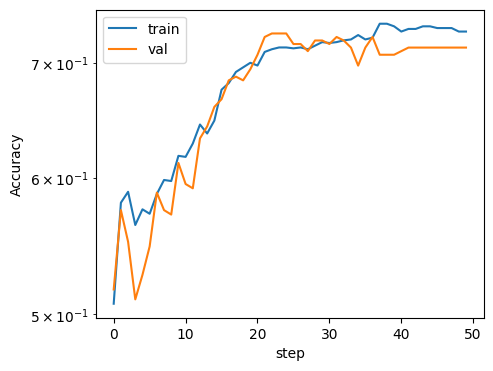

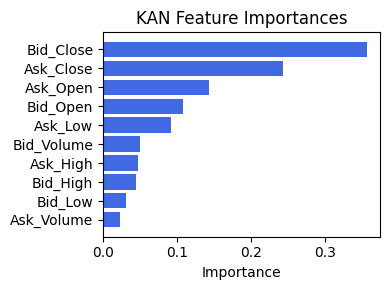

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ask_High', 0.6300005524518217), ('Ask_Volume', 0.6007441137930029), ('Ex1', 0.5960709694214673), ('Ask_Open', 0.560779391801269), ('Ask_Low', 0.46275082182859856), ('Ex2', 0.4376398338060775), ('Bid_Low', 0.3706423630937934), ('Bid_High', 0.3507469883252047), ('Ask_Close', 0.30080199334009144), ('Bid_Volume', 0.2399251886728481), ('Bid_Close', 0.22066818178905434), ('Ex6', 0.18873123563724578), ('Ex5', 0.13938831385702138), ('Bid_Open', 0.13293936196330025), ('Ex4', 0.11731447069588491), ('Ex3', 0.040112216811711524)]


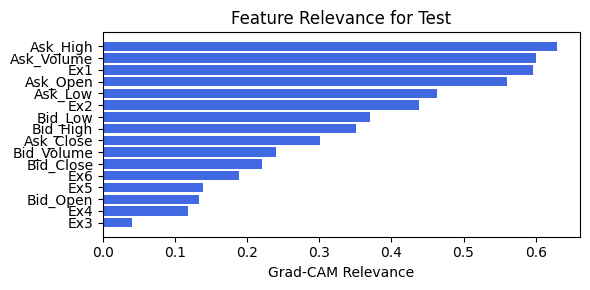

embed_dim: 32, num_head:2
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 7.20e-01 | val_acc_hybrid: 7.11e-01 |: 100%|█████| 50/50 [01:08<00:00,  1.37s/it]


saving model version 0.1
✅ Best validation Accuracy: 7.2449e-01 at 16 epoch
tensor(0.6730, device='cuda:0')
[[115  68]
 [ 52 132]]
M_KAN Relevance: 0.014734314754605293
CNN Relevance: 0.9852656722068787
[('Bid_Close', 0.32432106), ('Ask_Open', 0.24080968), ('Ask_Close', 0.20890298), ('Ask_Low', 0.17848848), ('Ask_High', 0.11813506), ('Bid_Volume', 0.09125535), ('Bid_Open', 0.06944092), ('Bid_Low', 0.06913629), ('Bid_High', 0.046848603), ('Ask_Volume', 0.034295335)]


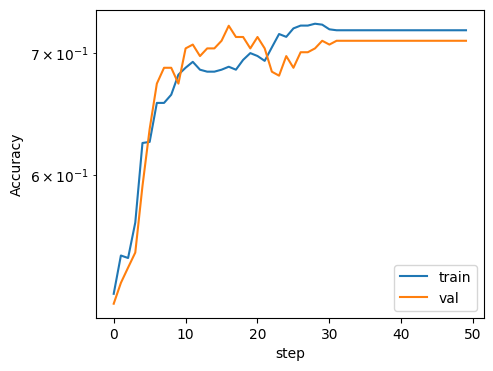

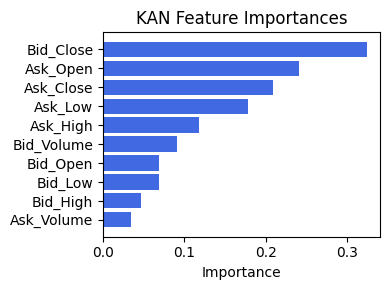

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex4', 0.4953340715056219), ('Ask_Close', 0.4446855411745547), ('Ask_Volume', 0.4259527971858935), ('Ex5', 0.39961990644850476), ('Ex3', 0.3926825397609852), ('Ex1', 0.3189851115749545), ('Bid_Volume', 0.30536166645144935), ('Ask_Open', 0.2388370894885315), ('Ask_High', 0.1386157820523676), ('Ex2', 0.11508713856501865), ('Ask_Low', 0.09286491591128082), ('Bid_Open', 0.06134637315901585), ('Ex6', 0.052018086530004275), ('Bid_High', 0.049674205231411785), ('Bid_Close', 0.03635899237121077), ('Bid_Low', 0.027350105098337473)]


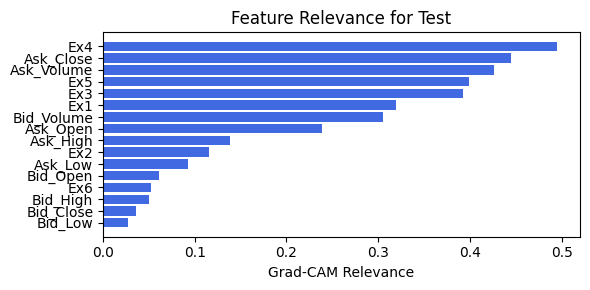

embed_dim: 32, num_head:4
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 7.24e-01 | val_acc_hybrid: 6.87e-01 |: 100%|█████| 50/50 [01:01<00:00,  1.22s/it]


saving model version 0.1
✅ Best validation Accuracy: 7.4150e-01 at 12 epoch
tensor(0.6866, device='cuda:0')
[[122  61]
 [ 54 130]]
M_KAN Relevance: 0.00689671840518713
CNN Relevance: 0.9931032657623291
[('Bid_Close', 0.37349248), ('Ask_Close', 0.29545477), ('Bid_Open', 0.20235854), ('Bid_High', 0.14276223), ('Bid_Low', 0.12859844), ('Ask_High', 0.09200849), ('Ask_Low', 0.055495683), ('Ask_Volume', 0.05105678), ('Bid_Volume', 0.031052114), ('Ask_Open', 0.026505146)]


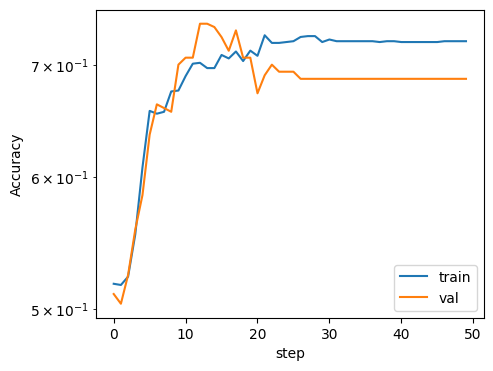

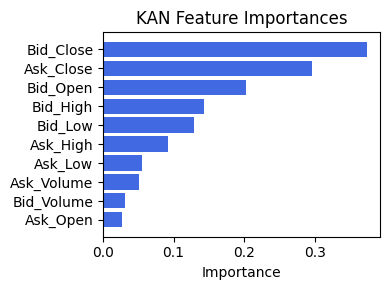

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ask_Close', 0.4984551421709217), ('Ask_Volume', 0.37680067811719564), ('Bid_Volume', 0.3191467300323866), ('Ex1', 0.24064995126154182), ('Ex3', 0.2200739875235433), ('Ask_Open', 0.192935196507712), ('Ex4', 0.18954441298499744), ('Ex5', 0.15875338486900772), ('Ex2', 0.10773048407341225), ('Ask_Low', 0.09831241940040067), ('Ask_High', 0.09468824232902126), ('Ex6', 0.0784479336774155), ('Bid_High', 0.06975250658877742), ('Bid_Open', 0.06007035216247192), ('Bid_Close', 0.03952393759119165), ('Bid_Low', 0.037603942148672284)]


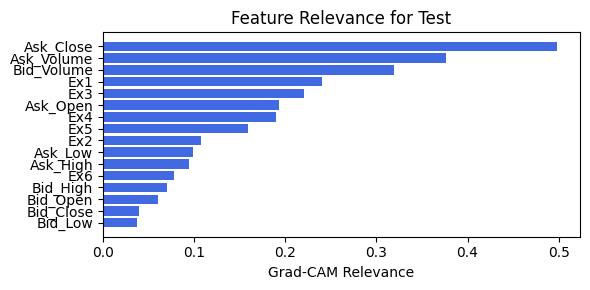

embed_dim: 32, num_head:8
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 7.24e-01 | val_acc_hybrid: 6.87e-01 |: 100%|█████| 50/50 [01:02<00:00,  1.25s/it]


saving model version 0.1
✅ Best validation Accuracy: 7.4150e-01 at 12 epoch
tensor(0.6866, device='cuda:0')
[[122  61]
 [ 54 130]]
M_KAN Relevance: 0.00689671840518713
CNN Relevance: 0.9931032657623291
[('Bid_Close', 0.37349248), ('Ask_Close', 0.29545477), ('Bid_Open', 0.20235854), ('Bid_High', 0.14276223), ('Bid_Low', 0.12859844), ('Ask_High', 0.09200849), ('Ask_Low', 0.055495683), ('Ask_Volume', 0.05105678), ('Bid_Volume', 0.031052114), ('Ask_Open', 0.026505146)]


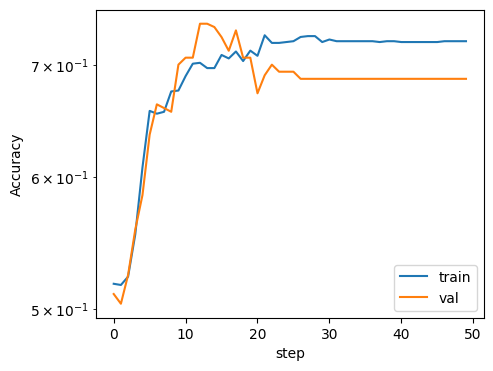

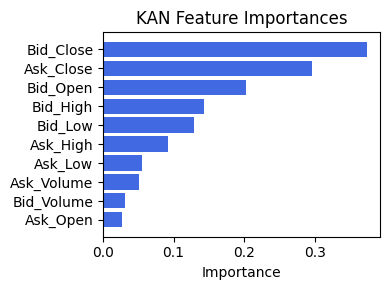

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ask_Close', 0.4984551421709217), ('Ask_Volume', 0.37680067811719564), ('Bid_Volume', 0.3191467300323866), ('Ex1', 0.24064995126154182), ('Ex3', 0.2200739875235433), ('Ask_Open', 0.192935196507712), ('Ex4', 0.18954441298499744), ('Ex5', 0.15875338486900772), ('Ex2', 0.10773048407341225), ('Ask_Low', 0.09831241940040067), ('Ask_High', 0.09468824232902126), ('Ex6', 0.0784479336774155), ('Bid_High', 0.06975250658877742), ('Bid_Open', 0.06007035216247192), ('Bid_Close', 0.03952393759119165), ('Bid_Low', 0.037603942148672284)]


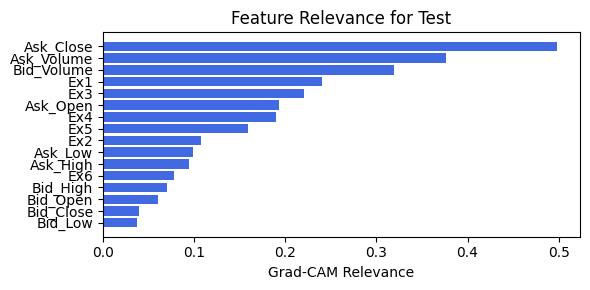

embed_dim: 16, num_head:2
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 7.37e-01 | val_acc_hybrid: 7.18e-01 |: 100%|█████| 50/50 [01:28<00:00,  1.76s/it]


saving model version 0.1
✅ Best validation Accuracy: 7.3469e-01 at 11 epoch
tensor(0.7057, device='cuda:0')
[[122  61]
 [ 47 137]]
M_KAN Relevance: 0.00898035429418087
CNN Relevance: 0.991019606590271
[('Bid_High', 0.23791312), ('Ask_Low', 0.2205375), ('Ask_High', 0.22033586), ('Bid_Open', 0.18400994), ('Ask_Open', 0.14117698), ('Bid_Close', 0.1114826), ('Bid_Low', 0.10628583), ('Bid_Volume', 0.090727605), ('Ask_Close', 0.03859888), ('Ask_Volume', 0.0153606525)]


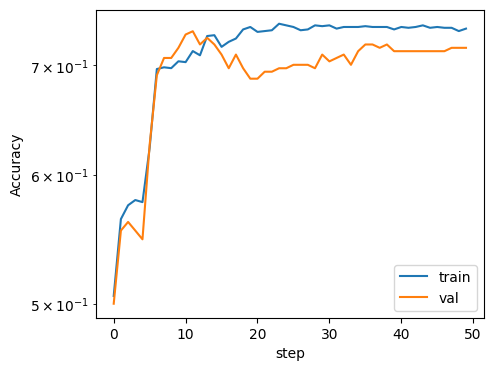

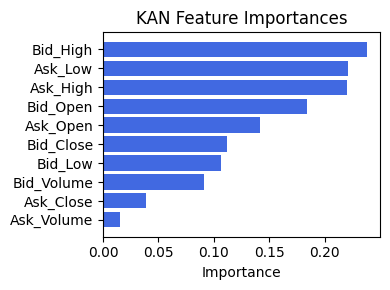

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex2', 0.5334927055094015), ('Ask_Low', 0.4047163420024376), ('Ex6', 0.26740573256634836), ('Ex1', 0.21828221978888687), ('Ask_High', 0.20169784407301397), ('Bid_Low', 0.16550697441300383), ('Bid_Close', 0.1591552673353189), ('Ex5', 0.12121490733596504), ('Bid_High', 0.10191915101864647), ('Ex4', 0.08391506869992373), ('Ask_Close', 0.07945736130948207), ('Ex3', 0.0788793961342414), ('Bid_Volume', 0.046913314120139604), ('Ask_Open', 0.036819798815729), ('Ask_Volume', 0.033905835933247405), ('Bid_Open', 0.01769316153158624)]


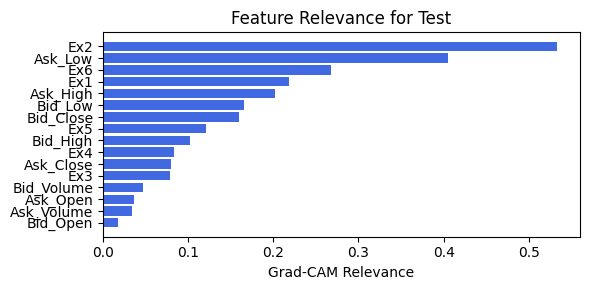

embed_dim: 16, num_head:4
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 7.37e-01 | val_acc_hybrid: 7.18e-01 |: 100%|█████| 50/50 [01:24<00:00,  1.68s/it]


saving model version 0.1
✅ Best validation Accuracy: 7.3469e-01 at 11 epoch
tensor(0.7057, device='cuda:0')
[[122  61]
 [ 47 137]]
M_KAN Relevance: 0.00898035429418087
CNN Relevance: 0.991019606590271
[('Bid_High', 0.23791312), ('Ask_Low', 0.2205375), ('Ask_High', 0.22033586), ('Bid_Open', 0.18400994), ('Ask_Open', 0.14117698), ('Bid_Close', 0.1114826), ('Bid_Low', 0.10628583), ('Bid_Volume', 0.090727605), ('Ask_Close', 0.03859888), ('Ask_Volume', 0.0153606525)]


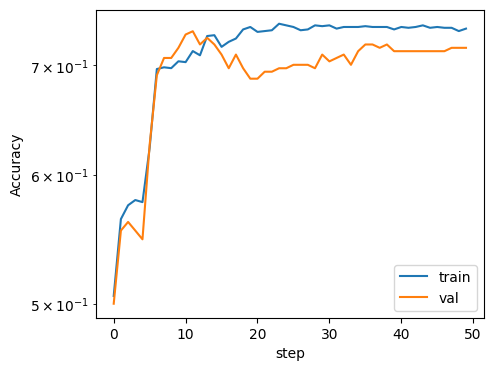

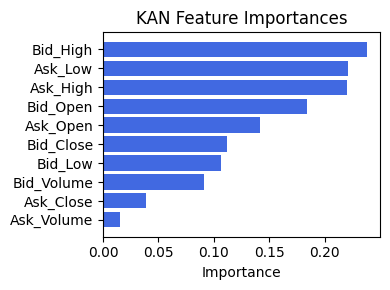

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex2', 0.5334927055094015), ('Ask_Low', 0.4047163420024376), ('Ex6', 0.26740573256634836), ('Ex1', 0.21828221978888687), ('Ask_High', 0.20169784407301397), ('Bid_Low', 0.16550697441300383), ('Bid_Close', 0.1591552673353189), ('Ex5', 0.12121490733596504), ('Bid_High', 0.10191915101864647), ('Ex4', 0.08391506869992373), ('Ask_Close', 0.07945736130948207), ('Ex3', 0.0788793961342414), ('Bid_Volume', 0.046913314120139604), ('Ask_Open', 0.036819798815729), ('Ask_Volume', 0.033905835933247405), ('Bid_Open', 0.01769316153158624)]


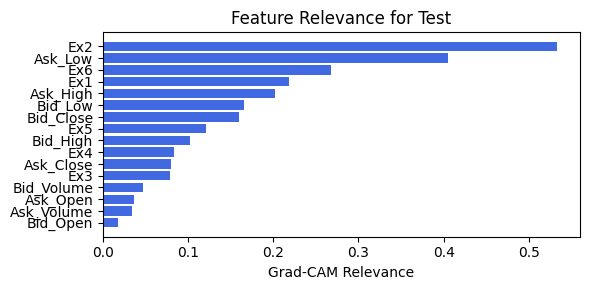

embed_dim: 16, num_head:8
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 7.39e-01 | val_acc_hybrid: 7.18e-01 |: 100%|█████| 50/50 [01:25<00:00,  1.72s/it]


saving model version 0.1
✅ Best validation Accuracy: 7.3129e-01 at 13 epoch
tensor(0.7030, device='cuda:0')
[[123  60]
 [ 49 135]]
M_KAN Relevance: 1.6588595826760866e-05
CNN Relevance: 0.9999834299087524
[('Bid_Open', 0.6263957), ('Bid_Low', 0.17477086), ('Bid_Close', 0.17100097), ('Bid_High', 0.13919167), ('Ask_Close', 0.11333931), ('Ask_Open', 0.08384935), ('Ask_High', 0.0717787), ('Ask_Low', 0.044905238), ('Bid_Volume', 0.041969337), ('Ask_Volume', 0.04063402)]


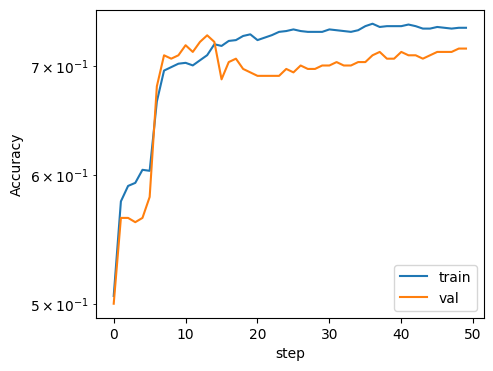

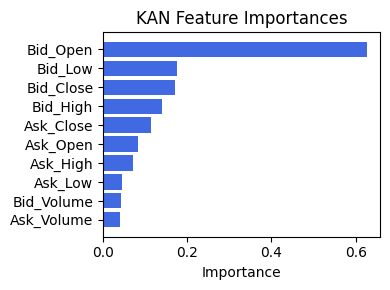

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex2', 0.6804442519083498), ('Ex1', 0.5893686834408087), ('Ask_Low', 0.5734668578292759), ('Ask_High', 0.545541221605822), ('Ask_Volume', 0.36929210979867044), ('Ask_Open', 0.3606646396321237), ('Ex6', 0.34848352089240053), ('Bid_Low', 0.32048440906308), ('Bid_Close', 0.27415798435987504), ('Bid_High', 0.26308508109737805), ('Ex5', 0.21771281730251676), ('Ex4', 0.11849430849273214), ('Bid_Open', 0.055625822008092574), ('Ask_Close', 0.02494830860687662), ('Bid_Volume', 0.022181722824557912), ('Ex3', 0.010582794894004996)]


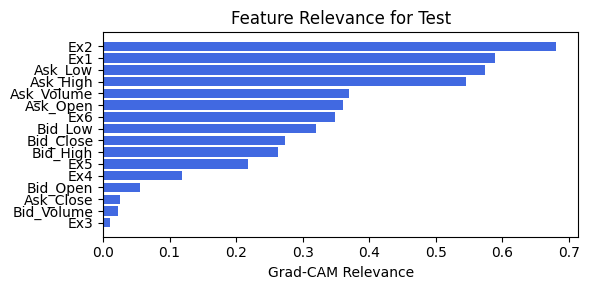

In [58]:
for embed_dim in [64, 32, 16]:
    for num_head in [2, 4 , 8]:
        print(f"embed_dim: {embed_dim}, num_head:{num_head}")
        train_and_plot_relevance(Model3_4, kan_neurons=1, kan_grid=3, lamb=0.0001, steps=50, 
                                 embed_dim=embed_dim, num_heads=num_head, filename=filename_4, opt_col_val=f'{embed_dim}, {num_head}')

### 4.2.0 width=[10, 1, 1], grid=3, lamb=0.0001 | embed_dim=64

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 7.41e-01 | val_acc_hybrid: 7.18e-01 |: 100%|█████| 50/50 [00:18<00:00,  2.77it/s]


saving model version 0.1
✅ Best validation Accuracy: 7.3129e-01 at 14 epoch
tensor(0.7193, device='cuda:0')
[[122  61]
 [ 42 142]]
M_KAN Relevance: 0.0014355273451656103
CNN Relevance: 0.9985644221305847
[('Bid_Close', 0.3512189), ('Ask_Close', 0.25890958), ('Bid_Open', 0.14152461), ('Ask_Open', 0.10045649), ('Bid_High', 0.06637448), ('Ask_Low', 0.046819244), ('Bid_Low', 0.046156555), ('Ask_Volume', 0.026843943), ('Ask_High', 0.025434865), ('Bid_Volume', 0.022993837)]


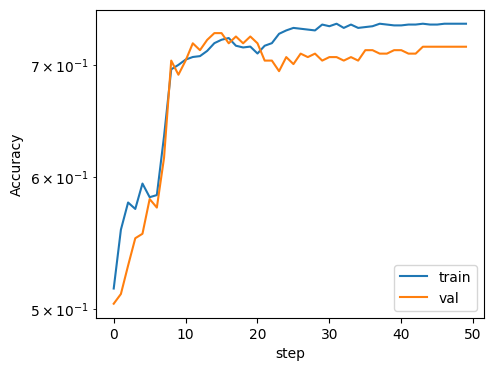

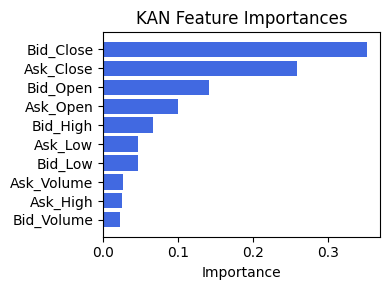

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex1', 0.6281334180473692), ('Ask_High', 0.5173750021558366), ('Ask_Volume', 0.4604964700098624), ('Ex2', 0.41771717458247776), ('Ask_Open', 0.37567204578617225), ('Ask_Low', 0.2797731234709801), ('Bid_Low', 0.2174747262914679), ('Bid_High', 0.17953982042698352), ('Ex5', 0.13082997837390659), ('Bid_Close', 0.12044588663516635), ('Ex4', 0.11133878136760103), ('Ex6', 0.08949460553091618), ('Ask_Close', 0.07423857143708652), ('Bid_Volume', 0.06393053369348069), ('Ex3', 0.04721118379206643), ('Bid_Open', 0.03889307199742763)]


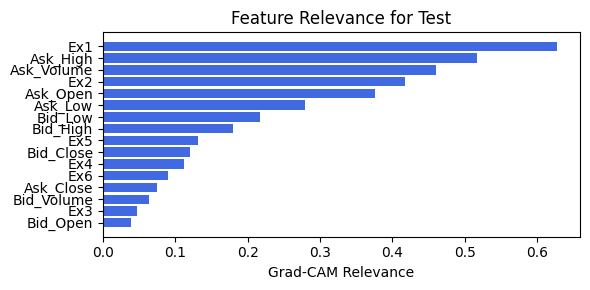

In [187]:
train_and_plot_relevance(Model3_4, kan_neurons=1, kan_grid=3, lamb=0.0001, steps=50, embed_dim=64, filename=filename_4, opt_col_val=64)

### 4.2.1 width=[10, 1, 1], grid=3, lamb=0.0001 | embed_dim=64

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 7.30e-01 | val_acc_hybrid: 7.14e-01 |: 100%|█████| 50/50 [00:18<00:00,  2.75it/s]


saving model version 0.1
✅ Best validation Accuracy: 7.2789e-01 at 22 epoch
tensor(0.7057, device='cuda:0')
[[128  55]
 [ 53 131]]
M_KAN Relevance: 0.001668317592702806
CNN Relevance: 0.9983316659927368
[('Bid_Close', 0.35624856), ('Ask_Close', 0.24334258), ('Ask_Open', 0.14323233), ('Bid_Open', 0.10747149), ('Ask_Low', 0.09206539), ('Bid_Volume', 0.050044645), ('Ask_High', 0.04775532), ('Bid_High', 0.044823345), ('Bid_Low', 0.03100268), ('Ask_Volume', 0.022880303)]


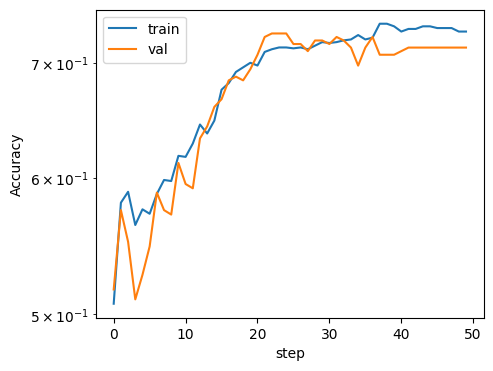

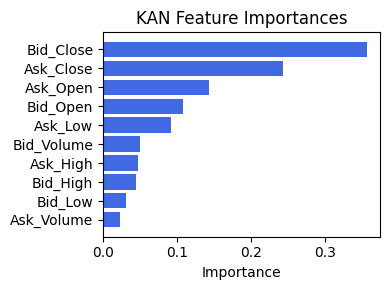

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ask_High', 0.6300005524518217), ('Ask_Volume', 0.6007441137930029), ('Ex1', 0.5960709694214673), ('Ask_Open', 0.560779391801269), ('Ask_Low', 0.46275082182859856), ('Ex2', 0.4376398338060775), ('Bid_Low', 0.3706423630937934), ('Bid_High', 0.3507469883252047), ('Ask_Close', 0.30080199334009144), ('Bid_Volume', 0.2399251886728481), ('Bid_Close', 0.22066818178905434), ('Ex6', 0.18873123563724578), ('Ex5', 0.13938831385702138), ('Bid_Open', 0.13293936196330025), ('Ex4', 0.11731447069588491), ('Ex3', 0.040112216811711524)]


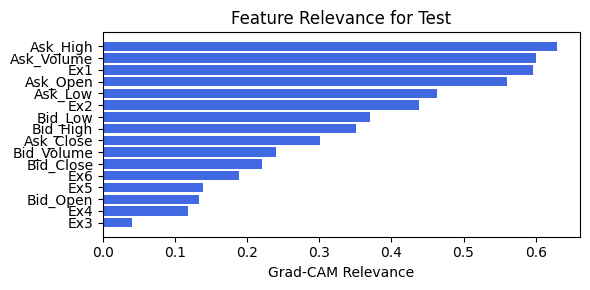

In [188]:
train_and_plot_relevance(Model3_4, kan_neurons=1, kan_grid=3, lamb=0.0001, steps=50, embed_dim=64, filename=filename_4, opt_col_val=64)

### 4.2.2 width=[10, 1, 1], grid=3, lamb=0.0001 | embed_dim=32

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 7.24e-01 | val_acc_hybrid: 6.87e-01 |: 100%|█████| 50/50 [00:13<00:00,  3.63it/s]


saving model version 0.1
✅ Best validation Accuracy: 7.4150e-01 at 12 epoch
tensor(0.6866, device='cuda:0')
[[122  61]
 [ 54 130]]
M_KAN Relevance: 0.00689671840518713
CNN Relevance: 0.9931032657623291
[('Bid_Close', 0.37349248), ('Ask_Close', 0.29545477), ('Bid_Open', 0.20235854), ('Bid_High', 0.14276223), ('Bid_Low', 0.12859844), ('Ask_High', 0.09200849), ('Ask_Low', 0.055495683), ('Ask_Volume', 0.05105678), ('Bid_Volume', 0.031052114), ('Ask_Open', 0.026505146)]


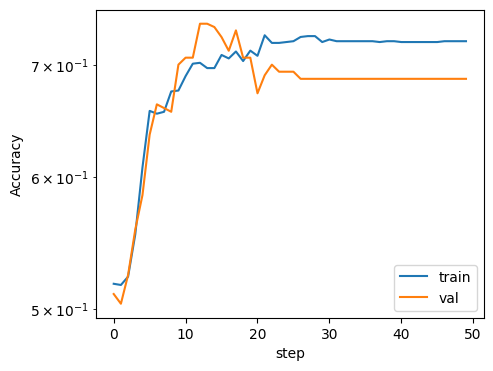

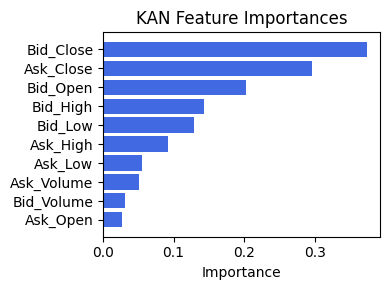

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ask_Close', 0.4984551421709217), ('Ask_Volume', 0.37680067811719564), ('Bid_Volume', 0.3191467300323866), ('Ex1', 0.24064995126154182), ('Ex3', 0.2200739875235433), ('Ask_Open', 0.192935196507712), ('Ex4', 0.18954441298499744), ('Ex5', 0.15875338486900772), ('Ex2', 0.10773048407341225), ('Ask_Low', 0.09831241940040067), ('Ask_High', 0.09468824232902126), ('Ex6', 0.0784479336774155), ('Bid_High', 0.06975250658877742), ('Bid_Open', 0.06007035216247192), ('Bid_Close', 0.03952393759119165), ('Bid_Low', 0.037603942148672284)]


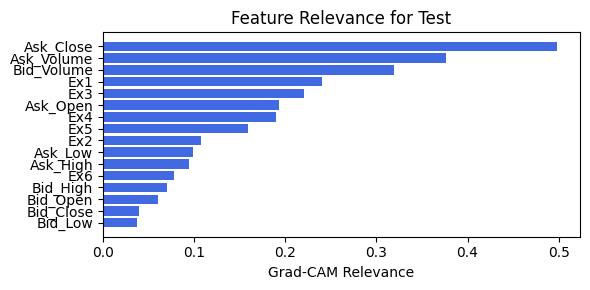

In [189]:
train_and_plot_relevance(Model3_4, kan_neurons=1, kan_grid=3, lamb=0.0001, steps=50, embed_dim=32, filename=filename_4, opt_col_val=32)

### 4.2.3 width=[10, 1, 1], grid=3, lamb=0.0001 | embed_dim=32

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 7.20e-01 | val_acc_hybrid: 7.11e-01 |: 100%|█████| 50/50 [00:12<00:00,  3.87it/s]


saving model version 0.1
✅ Best validation Accuracy: 7.2449e-01 at 16 epoch
tensor(0.6730, device='cuda:0')
[[115  68]
 [ 52 132]]
M_KAN Relevance: 0.014734314754605293
CNN Relevance: 0.9852656722068787
[('Bid_Close', 0.32432106), ('Ask_Open', 0.24080968), ('Ask_Close', 0.20890298), ('Ask_Low', 0.17848848), ('Ask_High', 0.11813506), ('Bid_Volume', 0.09125535), ('Bid_Open', 0.06944092), ('Bid_Low', 0.06913629), ('Bid_High', 0.046848603), ('Ask_Volume', 0.034295335)]


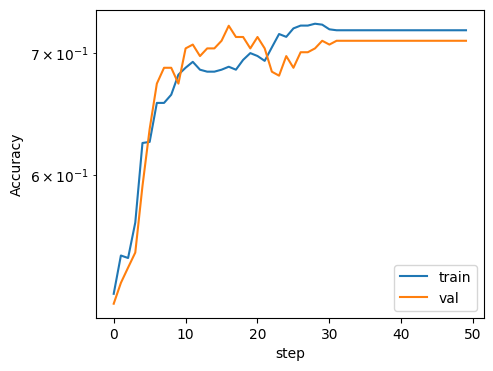

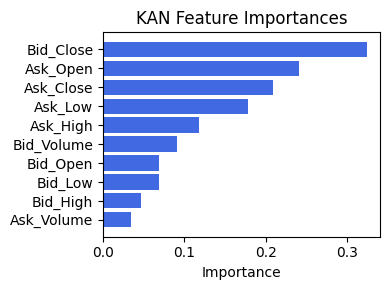

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex4', 0.4953340715056219), ('Ask_Close', 0.4446855411745547), ('Ask_Volume', 0.4259527971858935), ('Ex5', 0.39961990644850476), ('Ex3', 0.3926825397609852), ('Ex1', 0.3189851115749545), ('Bid_Volume', 0.30536166645144935), ('Ask_Open', 0.2388370894885315), ('Ask_High', 0.1386157820523676), ('Ex2', 0.11508713856501865), ('Ask_Low', 0.09286491591128082), ('Bid_Open', 0.06134637315901585), ('Ex6', 0.052018086530004275), ('Bid_High', 0.049674205231411785), ('Bid_Close', 0.03635899237121077), ('Bid_Low', 0.027350105098337473)]


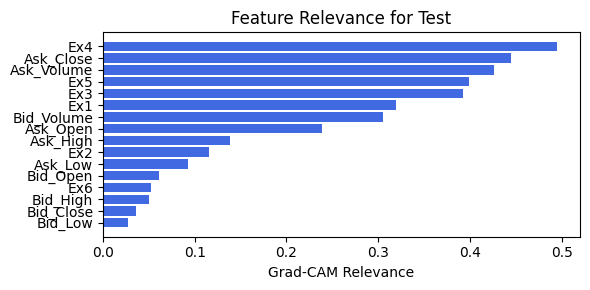

In [190]:
train_and_plot_relevance(Model3_4, kan_neurons=1, kan_grid=3, lamb=0.0001, steps=50, embed_dim=32, filename=filename_4, opt_col_val=32)

### 4.2.4 width=[10, 1, 1], grid=3, lamb=0.0001 | embed_dim=16

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 7.39e-01 | val_acc_hybrid: 7.18e-01 |: 100%|█████| 50/50 [00:16<00:00,  3.07it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.3129e-01 at 13 epoch
tensor(0.7030, device='cuda:0')
[[123  60]
 [ 49 135]]
M_KAN Relevance: 1.6588595826760866e-05
CNN Relevance: 0.9999834299087524
[('Bid_Open', 0.6263957), ('Bid_Low', 0.17477086), ('Bid_Close', 0.17100097), ('Bid_High', 0.13919167), ('Ask_Close', 0.11333931), ('Ask_Open', 0.08384935), ('Ask_High', 0.0717787), ('Ask_Low', 0.044905238), ('Bid_Volume', 0.041969337), ('Ask_Volume', 0.04063402)]


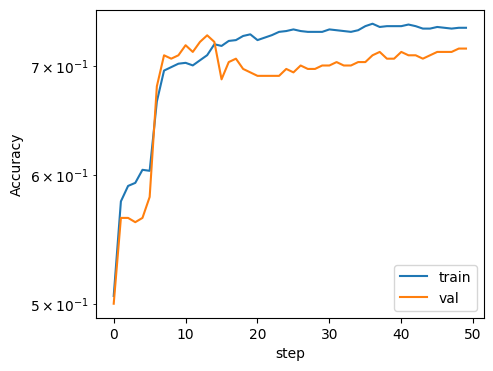

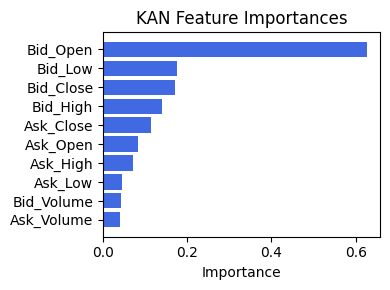

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex2', 0.6804442519083498), ('Ex1', 0.5893686834408087), ('Ask_Low', 0.5734668578292759), ('Ask_High', 0.545541221605822), ('Ask_Volume', 0.36929210979867044), ('Ask_Open', 0.3606646396321237), ('Ex6', 0.34848352089240053), ('Bid_Low', 0.32048440906308), ('Bid_Close', 0.27415798435987504), ('Bid_High', 0.26308508109737805), ('Ex5', 0.21771281730251676), ('Ex4', 0.11849430849273214), ('Bid_Open', 0.055625822008092574), ('Ask_Close', 0.02494830860687662), ('Bid_Volume', 0.022181722824557912), ('Ex3', 0.010582794894004996)]


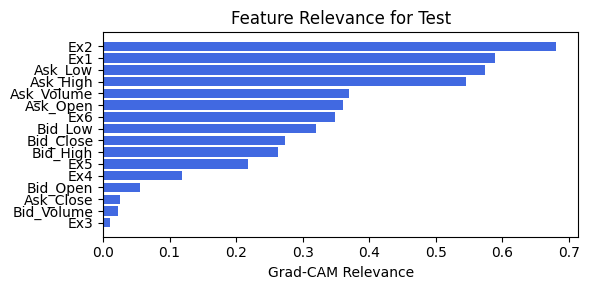

In [191]:
train_and_plot_relevance(Model3_4, kan_neurons=1, kan_grid=3, lamb=0.0001, steps=50, embed_dim=16, filename=filename_4, opt_col_val=16)

### 4.2.5 width=[10, 1, 1], grid=3, lamb=0.0001 | embed_dim=16

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 7.37e-01 | val_acc_hybrid: 7.18e-01 |: 100%|█████| 50/50 [00:19<00:00,  2.54it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.3469e-01 at 11 epoch
tensor(0.7057, device='cuda:0')
[[122  61]
 [ 47 137]]
M_KAN Relevance: 0.00898035429418087
CNN Relevance: 0.991019606590271
[('Bid_High', 0.23791312), ('Ask_Low', 0.2205375), ('Ask_High', 0.22033586), ('Bid_Open', 0.18400994), ('Ask_Open', 0.14117698), ('Bid_Close', 0.1114826), ('Bid_Low', 0.10628583), ('Bid_Volume', 0.090727605), ('Ask_Close', 0.03859888), ('Ask_Volume', 0.0153606525)]


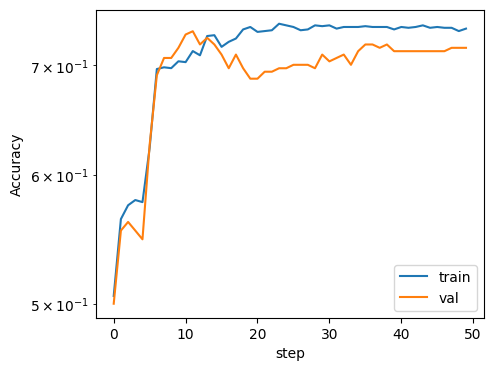

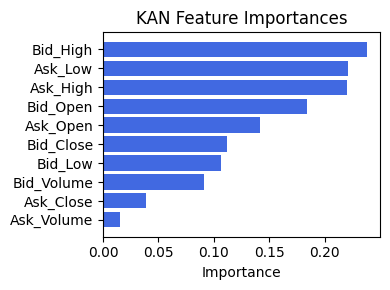

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex2', 0.5334927055094015), ('Ask_Low', 0.4047163420024376), ('Ex6', 0.26740573256634836), ('Ex1', 0.21828221978888687), ('Ask_High', 0.20169784407301397), ('Bid_Low', 0.16550697441300383), ('Bid_Close', 0.1591552673353189), ('Ex5', 0.12121490733596504), ('Bid_High', 0.10191915101864647), ('Ex4', 0.08391506869992373), ('Ask_Close', 0.07945736130948207), ('Ex3', 0.0788793961342414), ('Bid_Volume', 0.046913314120139604), ('Ask_Open', 0.036819798815729), ('Ask_Volume', 0.033905835933247405), ('Bid_Open', 0.01769316153158624)]


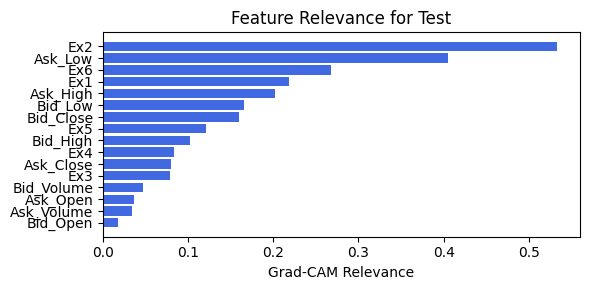

In [192]:
train_and_plot_relevance(Model3_4, kan_neurons=1, kan_grid=3, lamb=0.0001, steps=50, embed_dim=16, filename=filename_4, opt_col_val=16)

## 4.3. width=[10, 4], grid=3, lamb=0.0001

embed_dim: 64, num_head:2
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 6.93e-01 | val_acc_hybrid: 6.94e-01 |: 100%|█████| 50/50 [01:26<00:00,  1.73s/it]


saving model version 0.1
✅ Best validation Accuracy: 6.9388e-01 at 46 epoch
tensor(0.6730, device='cuda:0')
[[127  56]
 [ 64 120]]
M_KAN Relevance: 0.008816912770271301
CNN Relevance: 0.9911830425262451
[('Ask_High', 0.78894556), ('Bid_Open', 0.51748025), ('Ask_Open', 0.38928252), ('Bid_High', 0.37509477), ('Ask_Volume', 0.333627), ('Bid_Close', 0.32843626), ('Ask_Low', 0.31717843), ('Bid_Low', 0.2832234), ('Ask_Close', 0.22371098), ('Bid_Volume', 0.16992216)]


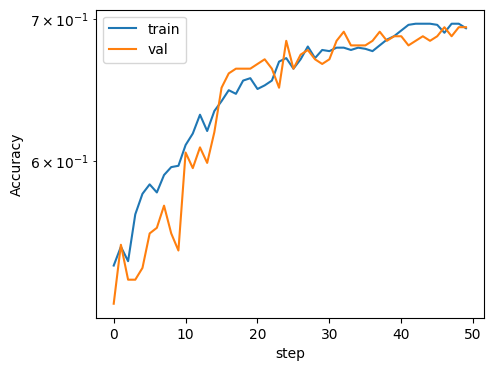

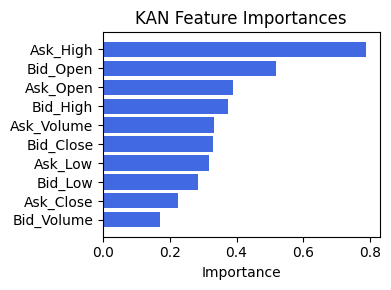

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex5', 0.8434595444546733), ('Ex4', 0.7534621517080052), ('Ex6', 0.5329105141052434), ('Ex1', 0.2712815701352478), ('Ask_Volume', 0.25189933402093295), ('Ex2', 0.24073348131426672), ('Ex3', 0.2193767664502362), ('Ask_High', 0.17643902344011883), ('Ask_Open', 0.15232492294111757), ('Ask_Low', 0.1123757152605614), ('Ask_Close', 0.07005937532483719), ('Bid_Volume', 0.04520050666062597), ('Bid_High', 0.017778596428111297), ('Bid_Low', 0.015696411365898496), ('Bid_Open', 0.012959875949602625), ('Bid_Close', 0.006521256160023064)]


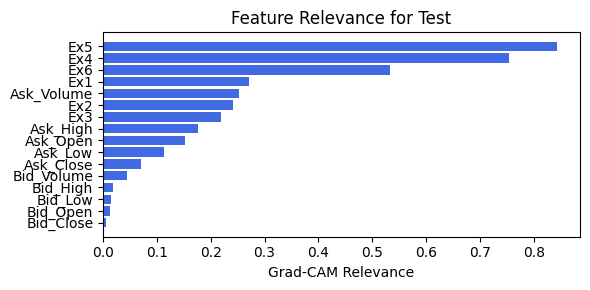

embed_dim: 64, num_head:4
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 6.93e-01 | val_acc_hybrid: 6.94e-01 |: 100%|█████| 50/50 [01:26<00:00,  1.73s/it]


saving model version 0.1
✅ Best validation Accuracy: 6.9388e-01 at 46 epoch
tensor(0.6730, device='cuda:0')
[[127  56]
 [ 64 120]]
M_KAN Relevance: 0.008816912770271301
CNN Relevance: 0.9911830425262451
[('Ask_High', 0.78894556), ('Bid_Open', 0.51748025), ('Ask_Open', 0.38928252), ('Bid_High', 0.37509477), ('Ask_Volume', 0.333627), ('Bid_Close', 0.32843626), ('Ask_Low', 0.31717843), ('Bid_Low', 0.2832234), ('Ask_Close', 0.22371098), ('Bid_Volume', 0.16992216)]


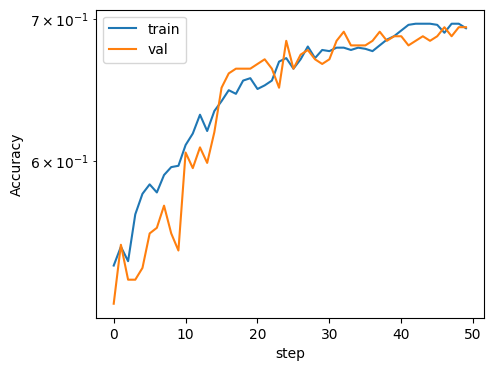

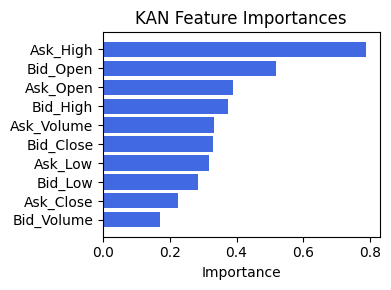

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex5', 0.8434595444546733), ('Ex4', 0.7534621517080052), ('Ex6', 0.5329105141052434), ('Ex1', 0.2712815701352478), ('Ask_Volume', 0.25189933402093295), ('Ex2', 0.24073348131426672), ('Ex3', 0.2193767664502362), ('Ask_High', 0.17643902344011883), ('Ask_Open', 0.15232492294111757), ('Ask_Low', 0.1123757152605614), ('Ask_Close', 0.07005937532483719), ('Bid_Volume', 0.04520050666062597), ('Bid_High', 0.017778596428111297), ('Bid_Low', 0.015696411365898496), ('Bid_Open', 0.012959875949602625), ('Bid_Close', 0.006521256160023064)]


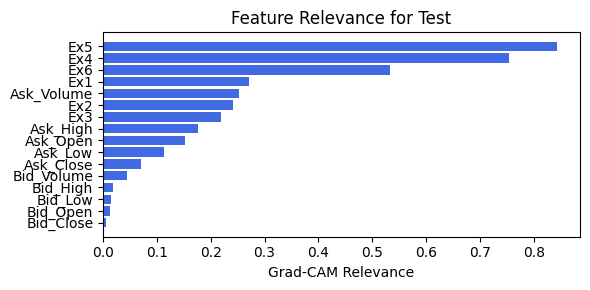

embed_dim: 64, num_head:8
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 6.93e-01 | val_acc_hybrid: 6.94e-01 |: 100%|█████| 50/50 [01:28<00:00,  1.78s/it]


saving model version 0.1
✅ Best validation Accuracy: 6.9388e-01 at 46 epoch
tensor(0.6730, device='cuda:0')
[[127  56]
 [ 64 120]]
M_KAN Relevance: 0.008816912770271301
CNN Relevance: 0.9911830425262451
[('Ask_High', 0.78894556), ('Bid_Open', 0.51748025), ('Ask_Open', 0.38928252), ('Bid_High', 0.37509477), ('Ask_Volume', 0.333627), ('Bid_Close', 0.32843626), ('Ask_Low', 0.31717843), ('Bid_Low', 0.2832234), ('Ask_Close', 0.22371098), ('Bid_Volume', 0.16992216)]


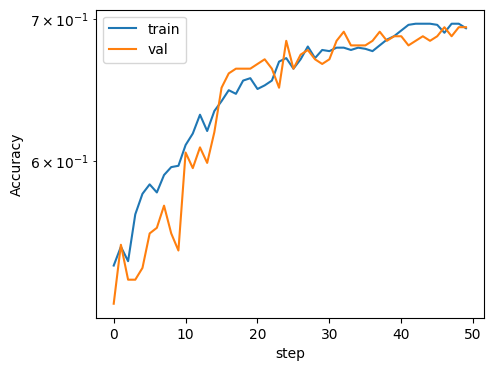

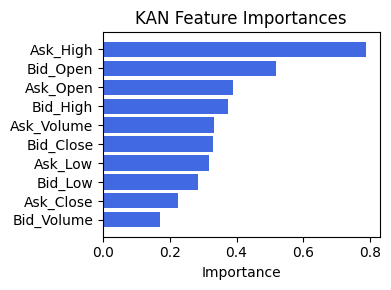

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex5', 0.8434595444546733), ('Ex4', 0.7534621517080052), ('Ex6', 0.5329105141052434), ('Ex1', 0.2712815701352478), ('Ask_Volume', 0.25189933402093295), ('Ex2', 0.24073348131426672), ('Ex3', 0.2193767664502362), ('Ask_High', 0.17643902344011883), ('Ask_Open', 0.15232492294111757), ('Ask_Low', 0.1123757152605614), ('Ask_Close', 0.07005937532483719), ('Bid_Volume', 0.04520050666062597), ('Bid_High', 0.017778596428111297), ('Bid_Low', 0.015696411365898496), ('Bid_Open', 0.012959875949602625), ('Bid_Close', 0.006521256160023064)]


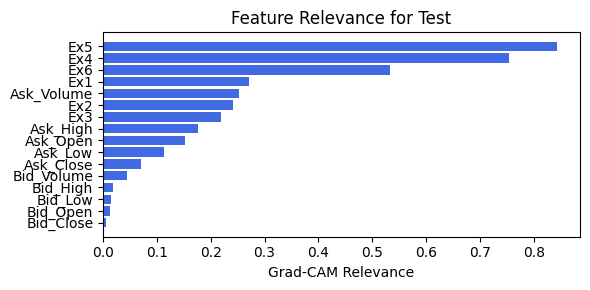

embed_dim: 32, num_head:2
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 7.30e-01 | val_acc_hybrid: 7.07e-01 |: 100%|█████| 50/50 [01:31<00:00,  1.82s/it]


saving model version 0.1
✅ Best validation Accuracy: 7.2789e-01 at 6 epoch
tensor(0.7030, device='cuda:0')
[[126  57]
 [ 52 132]]
M_KAN Relevance: 0.03103998489677906
CNN Relevance: 0.9689600467681885
[('Ask_High', 0.6357347), ('Bid_Open', 0.43628585), ('Ask_Open', 0.41553414), ('Bid_High', 0.37127626), ('Bid_Low', 0.32926846), ('Ask_Volume', 0.23711911), ('Bid_Close', 0.2299115), ('Ask_Low', 0.19403197), ('Ask_Close', 0.16577727), ('Bid_Volume', 0.123860784)]


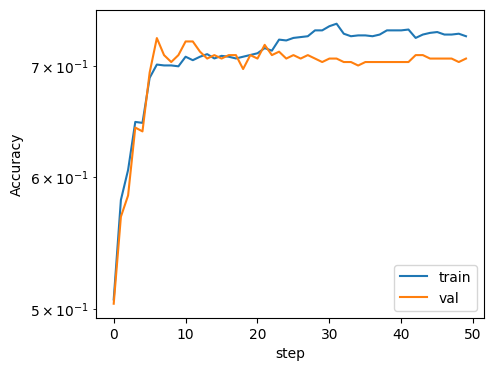

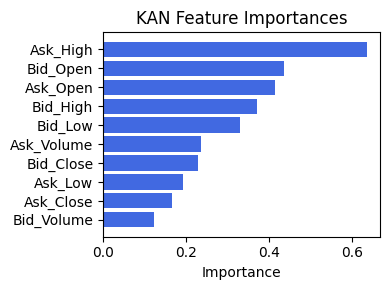

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex1', 0.4175478843642191), ('Ex2', 0.2004996449445509), ('Ask_Volume', 0.19462313424232505), ('Ask_High', 0.1337286010038803), ('Ex4', 0.1132241846062243), ('Ex5', 0.10964747092219346), ('Ask_Close', 0.08858294730082317), ('Ask_Open', 0.0807210404863765), ('Ask_Low', 0.07753136446820039), ('Bid_Low', 0.05041378948438471), ('Ex3', 0.04741678042946338), ('Bid_Volume', 0.03590633744909682), ('Bid_Close', 0.026789213109467108), ('Ex6', 0.025711596948434078), ('Bid_High', 0.024917567451896872), ('Bid_Open', 0.0021969508413797654)]


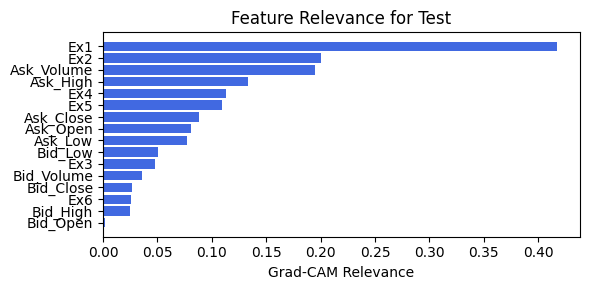

embed_dim: 32, num_head:4
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 7.03e-01 | val_acc_hybrid: 7.01e-01 |: 100%|█████| 50/50 [01:23<00:00,  1.68s/it]


saving model version 0.1
✅ Best validation Accuracy: 7.0408e-01 at 47 epoch
tensor(0.6948, device='cuda:0')
[[126  57]
 [ 55 129]]
M_KAN Relevance: 0.07454163581132889
CNN Relevance: 0.9254583716392517
[('Ask_High', 0.49565744), ('Bid_Open', 0.46470606), ('Bid_High', 0.4009933), ('Bid_Low', 0.37090003), ('Ask_Open', 0.36628807), ('Ask_Close', 0.3138474), ('Bid_Close', 0.2884048), ('Ask_Low', 0.2392096), ('Ask_Volume', 0.18790798), ('Bid_Volume', 0.1446769)]


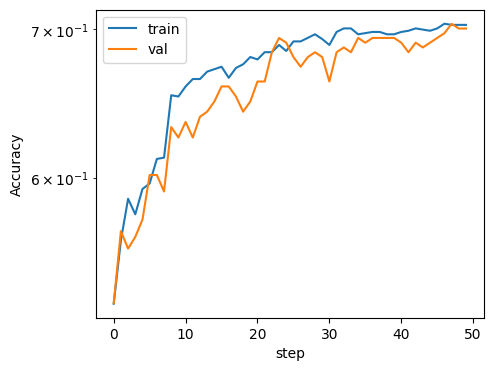

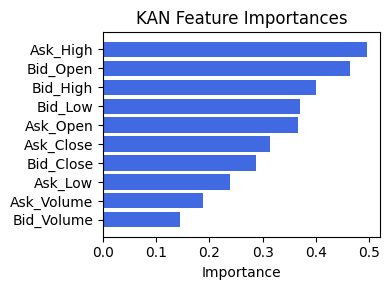

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ask_Volume', 0.46952994220588123), ('Ask_Close', 0.39462077325306405), ('Ex1', 0.36354781932905517), ('Bid_Volume', 0.2158017906735268), ('Ex4', 0.21557952636187994), ('Ex3', 0.2151933901154053), ('Ask_Open', 0.2017572428685377), ('Ex5', 0.15057224232185765), ('Ask_High', 0.12336158317152782), ('Bid_High', 0.07054045771135672), ('Bid_Low', 0.05754896097201778), ('Bid_Open', 0.03980822172844413), ('Bid_Close', 0.007487947419953497), ('Ex6', 0.0064154938070129855), ('Ex2', 0.006197771097831422), ('Ask_Low', 0.005501390388370263)]


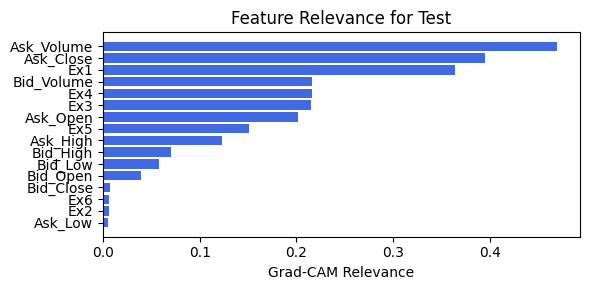

embed_dim: 32, num_head:8
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 7.37e-01 | val_acc_hybrid: 7.04e-01 |: 100%|█████| 50/50 [01:27<00:00,  1.75s/it]


saving model version 0.1
✅ Best validation Accuracy: 7.4150e-01 at 21 epoch
tensor(0.7112, device='cuda:0')
[[124  59]
 [ 47 137]]
M_KAN Relevance: 0.08757878094911575
CNN Relevance: 0.9124212861061096
[('Ask_High', 0.60805964), ('Bid_Open', 0.45135146), ('Bid_High', 0.39442927), ('Ask_Open', 0.38409832), ('Bid_Low', 0.34067374), ('Ask_Volume', 0.22802159), ('Ask_Close', 0.21379423), ('Ask_Low', 0.21239886), ('Bid_Close', 0.18414679), ('Bid_Volume', 0.11581582)]


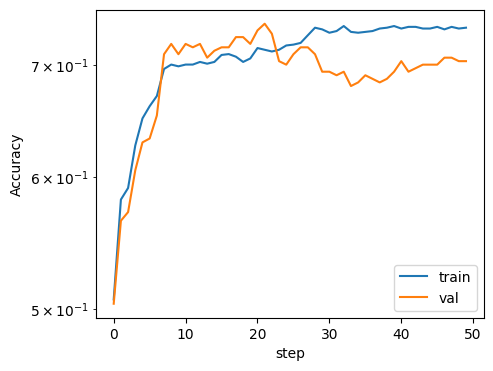

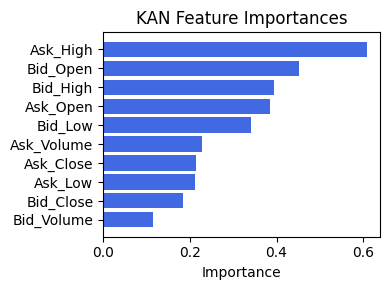

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex1', 0.33342689610713183), ('Ask_Volume', 0.31851173535862315), ('Ask_Close', 0.17495446518692886), ('Ex4', 0.16042462572435104), ('Ask_Open', 0.13304620393279404), ('Ex5', 0.10800673272105427), ('Ask_High', 0.09434676154679048), ('Ex3', 0.09321024756097014), ('Bid_Volume', 0.07056095080308385), ('Ex2', 0.06025407049165435), ('Bid_Low', 0.05325186378018022), ('Bid_High', 0.05048501889301624), ('Ask_Low', 0.020905530143402927), ('Bid_Close', 0.01463401428976081), ('Bid_Open', 0.01261063045588936), ('Ex6', 0.0030906070597128492)]


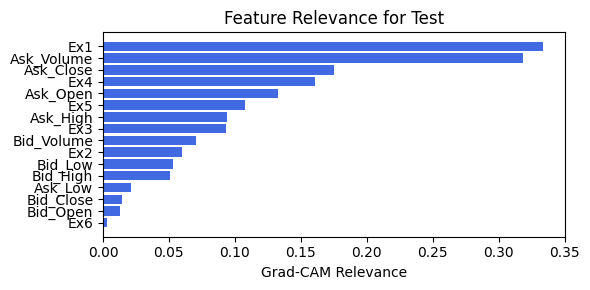

embed_dim: 16, num_head:2
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 7.38e-01 | val_acc_hybrid: 7.07e-01 |: 100%|█████| 50/50 [01:27<00:00,  1.75s/it]


saving model version 0.1
✅ Best validation Accuracy: 7.1429e-01 at 43 epoch
tensor(0.7057, device='cuda:0')
[[126  57]
 [ 51 133]]
M_KAN Relevance: 0.03231464698910713
CNN Relevance: 0.967685341835022
[('Bid_Close', 1.1327411), ('Ask_Close', 0.80994093), ('Bid_Open', 0.7035831), ('Ask_High', 0.6108042), ('Bid_High', 0.53291714), ('Bid_Volume', 0.46046674), ('Ask_Volume', 0.3521117), ('Ask_Open', 0.34682277), ('Bid_Low', 0.33937222), ('Ask_Low', 0.20023316)]


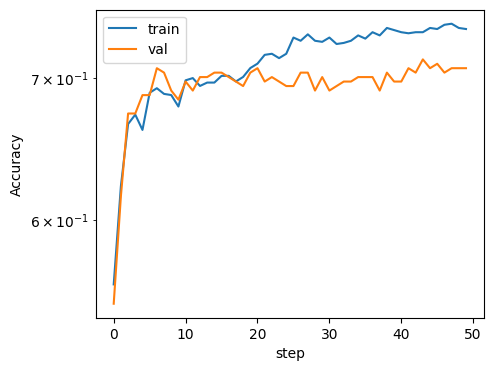

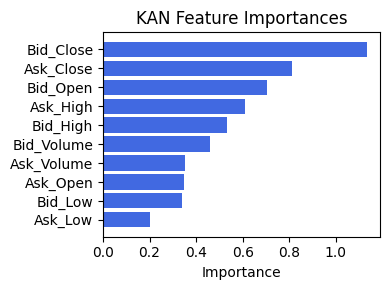

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ask_Close', 0.6429248154163361), ('Ask_Volume', 0.6205507099478726), ('Bid_Volume', 0.47245282811247197), ('Ask_Open', 0.45106791481071173), ('Ex1', 0.4401512554509195), ('Ex3', 0.4135889894752801), ('Ex4', 0.3231302294727892), ('Ask_High', 0.3060709004993335), ('Ex5', 0.18926501252411862), ('Bid_High', 0.1879666156295055), ('Bid_Open', 0.1786658534303064), ('Bid_Low', 0.13965585261357477), ('Ex2', 0.027824561533753504), ('Ex6', 0.025701808179817504), ('Bid_Close', 0.018217388076113908), ('Ask_Low', 0.015328047544388063)]


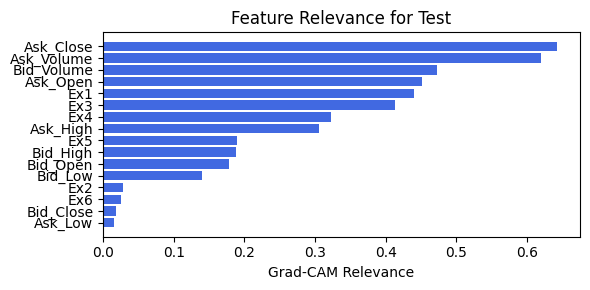

embed_dim: 16, num_head:4
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 7.37e-01 | val_acc_hybrid: 7.07e-01 |: 100%|█████| 50/50 [00:14<00:00,  3.52it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.2449e-01 at 10 epoch
tensor(0.7139, device='cuda:0')
[[125  58]
 [ 47 137]]
M_KAN Relevance: 0.282121866941452
CNN Relevance: 0.7178781628608704
[('Bid_Close', 1.3997539), ('Ask_Close', 0.8864001), ('Ask_High', 0.8695201), ('Bid_Open', 0.8602964), ('Bid_High', 0.7952075), ('Bid_Low', 0.64672625), ('Bid_Volume', 0.50539464), ('Ask_Open', 0.36475927), ('Ask_Volume', 0.30827135), ('Ask_Low', 0.2903466)]


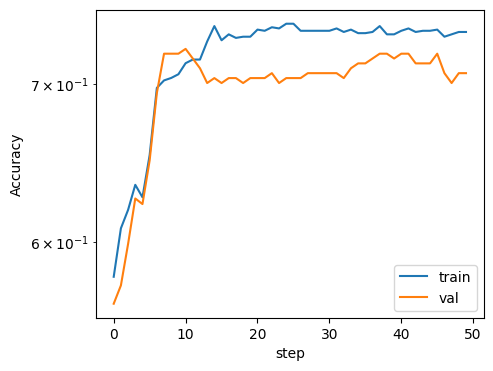

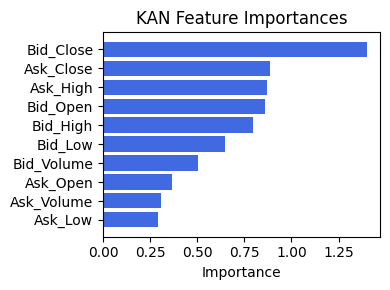

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ask_Volume', 0.5440457180670236), ('Ask_Close', 0.5110150152964553), ('Ex1', 0.3391712880832948), ('Ex4', 0.32951117721094425), ('Bid_Volume', 0.30387262805118875), ('Ask_Open', 0.30244203811201803), ('Ex5', 0.27751599579075054), ('Ex3', 0.24367004287446917), ('Ask_High', 0.23262782444370458), ('Bid_High', 0.05604292020290184), ('Bid_Open', 0.052865225150442126), ('Bid_Low', 0.00937029097264046), ('Ex6', 0.008581520074630176), ('Ex2', 0.001228900827134056), ('Bid_Close', 0.0), ('Ask_Low', 0.0)]


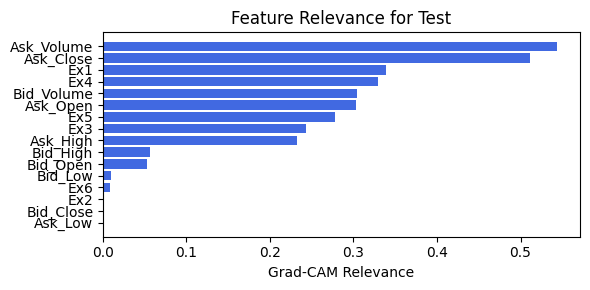

embed_dim: 16, num_head:8
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 7.37e-01 | val_acc_hybrid: 7.07e-01 |: 100%|█████| 50/50 [00:13<00:00,  3.61it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.2449e-01 at 10 epoch
tensor(0.7139, device='cuda:0')
[[125  58]
 [ 47 137]]
M_KAN Relevance: 0.282121866941452
CNN Relevance: 0.7178781628608704
[('Bid_Close', 1.3997539), ('Ask_Close', 0.8864001), ('Ask_High', 0.8695201), ('Bid_Open', 0.8602964), ('Bid_High', 0.7952075), ('Bid_Low', 0.64672625), ('Bid_Volume', 0.50539464), ('Ask_Open', 0.36475927), ('Ask_Volume', 0.30827135), ('Ask_Low', 0.2903466)]


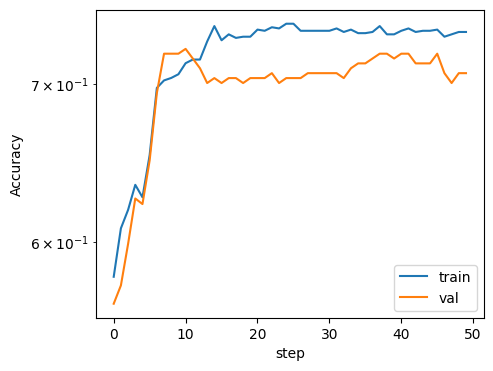

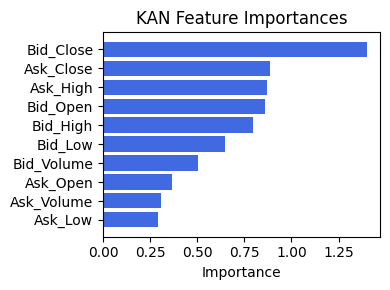

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ask_Volume', 0.5440457180670236), ('Ask_Close', 0.5110150152964553), ('Ex1', 0.3391712880832948), ('Ex4', 0.32951117721094425), ('Bid_Volume', 0.30387262805118875), ('Ask_Open', 0.30244203811201803), ('Ex5', 0.27751599579075054), ('Ex3', 0.24367004287446917), ('Ask_High', 0.23262782444370458), ('Bid_High', 0.05604292020290184), ('Bid_Open', 0.052865225150442126), ('Bid_Low', 0.00937029097264046), ('Ex6', 0.008581520074630176), ('Ex2', 0.001228900827134056), ('Bid_Close', 0.0), ('Ask_Low', 0.0)]


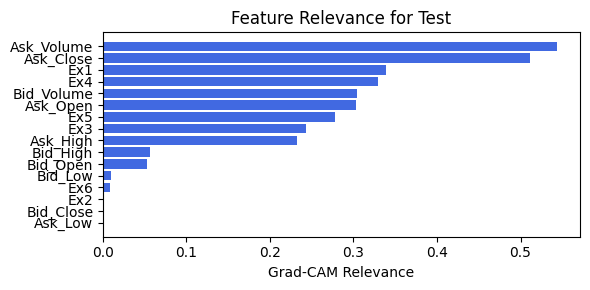

In [59]:
for embed_dim in [64, 32, 16]:
    for num_head in [2, 4 , 8]:
        print(f"embed_dim: {embed_dim}, num_head:{num_head}")
        train_and_plot_relevance(Model3_4, kan_neurons=4, kan_grid=3, lamb=0.0001, steps=50, 
                                 embed_dim=embed_dim, num_heads=num_head, filename=filename_4, opt_col_val=f'{embed_dim}, {num_head}')

### 4.3.0 width=[10, 4], grid=3, lamb=0.0001 | embed_dim=64

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 6.93e-01 | val_acc_hybrid: 6.94e-01 |: 100%|█████| 50/50 [00:18<00:00,  2.63it/s]

saving model version 0.1
✅ Best validation Accuracy: 6.9388e-01 at 46 epoch
tensor(0.6730, device='cuda:0')
[[127  56]
 [ 64 120]]
M_KAN Relevance: 0.008816912770271301
CNN Relevance: 0.9911830425262451
[('Ask_High', 0.78894556), ('Bid_Open', 0.51748025), ('Ask_Open', 0.38928252), ('Bid_High', 0.37509477), ('Ask_Volume', 0.333627), ('Bid_Close', 0.32843626), ('Ask_Low', 0.31717843), ('Bid_Low', 0.2832234), ('Ask_Close', 0.22371098), ('Bid_Volume', 0.16992216)]


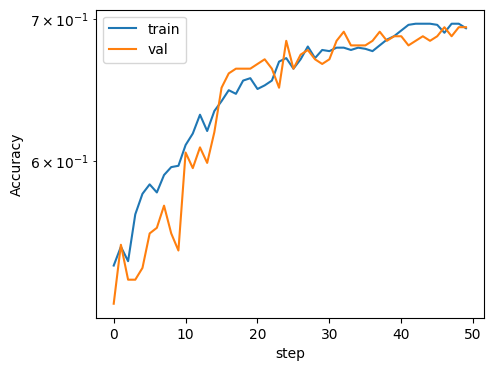

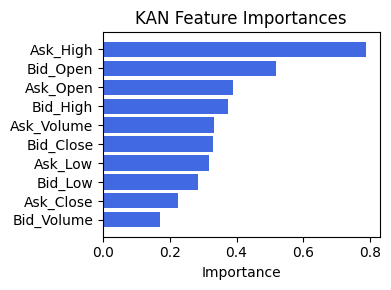

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex5', 0.8434595444546733), ('Ex4', 0.7534621517080052), ('Ex6', 0.5329105141052434), ('Ex1', 0.2712815701352478), ('Ask_Volume', 0.25189933402093295), ('Ex2', 0.24073348131426672), ('Ex3', 0.2193767664502362), ('Ask_High', 0.17643902344011883), ('Ask_Open', 0.15232492294111757), ('Ask_Low', 0.1123757152605614), ('Ask_Close', 0.07005937532483719), ('Bid_Volume', 0.04520050666062597), ('Bid_High', 0.017778596428111297), ('Bid_Low', 0.015696411365898496), ('Bid_Open', 0.012959875949602625), ('Bid_Close', 0.006521256160023064)]


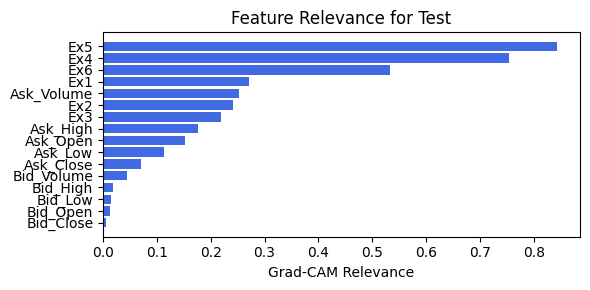

In [193]:
train_and_plot_relevance(Model3_4, kan_neurons=4, kan_grid=3, lamb=0.0001, steps=50, embed_dim=64, filename=filename_4, opt_col_val=64)

### 4.3.1 width=[10, 4], grid=3, lamb=0.0001 | embed_dim=64

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 7.37e-01 | val_acc_hybrid: 7.14e-01 |: 100%|█████| 50/50 [00:21<00:00,  2.30it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.4830e-01 at 28 epoch
tensor(0.7166, device='cuda:0')
[[123  60]
 [ 44 140]]
M_KAN Relevance: 0.017140138894319534
CNN Relevance: 0.9828598499298096
[('Ask_High', 1.0131015), ('Bid_Open', 0.72774774), ('Bid_Close', 0.5355633), ('Bid_High', 0.4273951), ('Ask_Volume', 0.42512554), ('Ask_Open', 0.42426547), ('Ask_Close', 0.39239407), ('Ask_Low', 0.3846624), ('Bid_Low', 0.30918962), ('Bid_Volume', 0.27616844)]


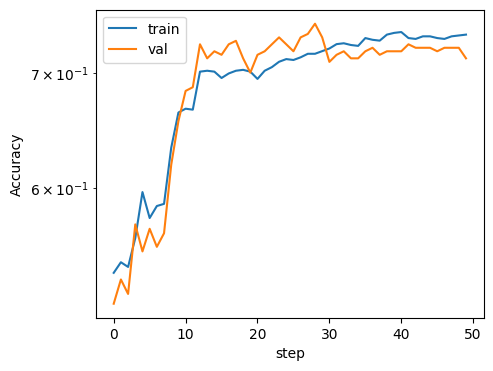

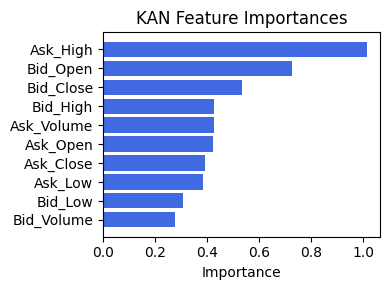

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex5', 0.8644458646346798), ('Ex4', 0.8189818364808656), ('Ex1', 0.6988288648934066), ('Ask_Volume', 0.6530932033744106), ('Ask_High', 0.5486643297917512), ('Ask_Open', 0.47904821810101944), ('Ex6', 0.40687141105423524), ('Ex2', 0.4003002749152015), ('Ex3', 0.3189311139190402), ('Ask_Low', 0.27832701134340637), ('Ask_Close', 0.2099210277443361), ('Bid_Volume', 0.16175287610334813), ('Bid_Low', 0.15734032178651325), ('Bid_High', 0.14887658972610346), ('Bid_Close', 0.08458794691877146), ('Bid_Open', 0.054559885087100746)]


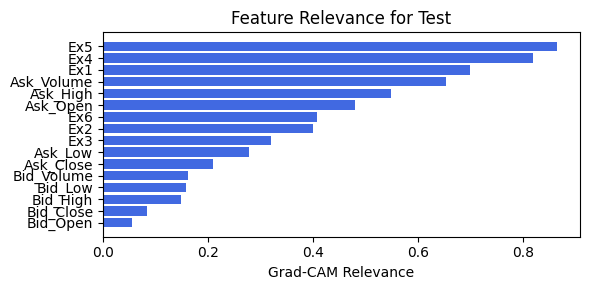

In [194]:
train_and_plot_relevance(Model3_4, kan_neurons=4, kan_grid=3, lamb=0.0001, steps=50, embed_dim=64, filename=filename_4, opt_col_val=64)

### 4.3.2 width=[10, 4], grid=3, lamb=0.0001 | embed_dim=32

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 7.37e-01 | val_acc_hybrid: 7.04e-01 |: 100%|█████| 50/50 [00:19<00:00,  2.61it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.4150e-01 at 21 epoch
tensor(0.7112, device='cuda:0')
[[124  59]
 [ 47 137]]
M_KAN Relevance: 0.08757878094911575
CNN Relevance: 0.9124212861061096
[('Ask_High', 0.60805964), ('Bid_Open', 0.45135146), ('Bid_High', 0.39442927), ('Ask_Open', 0.38409832), ('Bid_Low', 0.34067374), ('Ask_Volume', 0.22802159), ('Ask_Close', 0.21379423), ('Ask_Low', 0.21239886), ('Bid_Close', 0.18414679), ('Bid_Volume', 0.11581582)]


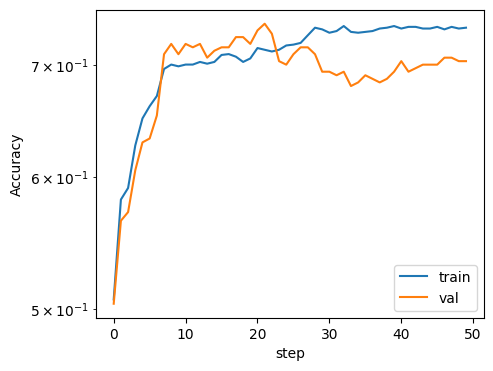

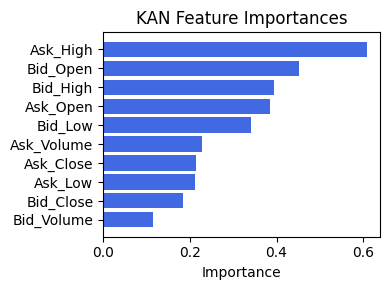

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex1', 0.33342689610713183), ('Ask_Volume', 0.31851173535862315), ('Ask_Close', 0.17495446518692886), ('Ex4', 0.16042462572435104), ('Ask_Open', 0.13304620393279404), ('Ex5', 0.10800673272105427), ('Ask_High', 0.09434676154679048), ('Ex3', 0.09321024756097014), ('Bid_Volume', 0.07056095080308385), ('Ex2', 0.06025407049165435), ('Bid_Low', 0.05325186378018022), ('Bid_High', 0.05048501889301624), ('Ask_Low', 0.020905530143402927), ('Bid_Close', 0.01463401428976081), ('Bid_Open', 0.01261063045588936), ('Ex6', 0.0030906070597128492)]


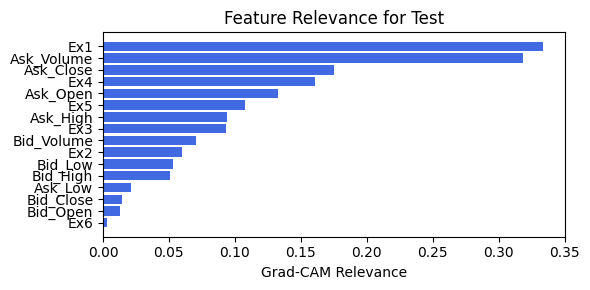

In [195]:
train_and_plot_relevance(Model3_4, kan_neurons=4, kan_grid=3, lamb=0.0001, steps=50, embed_dim=32, filename=filename_4, opt_col_val=32)

### 4.3.3 width=[10, 4], grid=3, lamb=0.0001 | embed_dim=32

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 7.30e-01 | val_acc_hybrid: 7.07e-01 |: 100%|█████| 50/50 [00:20<00:00,  2.39it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.2789e-01 at 6 epoch
tensor(0.7030, device='cuda:0')
[[126  57]
 [ 52 132]]
M_KAN Relevance: 0.03103998489677906
CNN Relevance: 0.9689600467681885
[('Ask_High', 0.6357347), ('Bid_Open', 0.43628585), ('Ask_Open', 0.41553414), ('Bid_High', 0.37127626), ('Bid_Low', 0.32926846), ('Ask_Volume', 0.23711911), ('Bid_Close', 0.2299115), ('Ask_Low', 0.19403197), ('Ask_Close', 0.16577727), ('Bid_Volume', 0.123860784)]


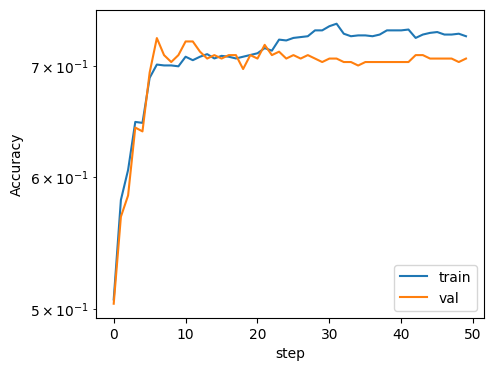

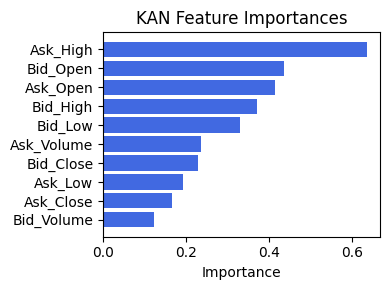

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex1', 0.4175478843642191), ('Ex2', 0.2004996449445509), ('Ask_Volume', 0.19462313424232505), ('Ask_High', 0.1337286010038803), ('Ex4', 0.1132241846062243), ('Ex5', 0.10964747092219346), ('Ask_Close', 0.08858294730082317), ('Ask_Open', 0.0807210404863765), ('Ask_Low', 0.07753136446820039), ('Bid_Low', 0.05041378948438471), ('Ex3', 0.04741678042946338), ('Bid_Volume', 0.03590633744909682), ('Bid_Close', 0.026789213109467108), ('Ex6', 0.025711596948434078), ('Bid_High', 0.024917567451896872), ('Bid_Open', 0.0021969508413797654)]


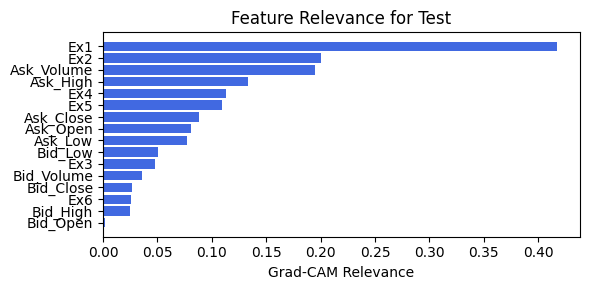

In [196]:
train_and_plot_relevance(Model3_4, kan_neurons=4, kan_grid=3, lamb=0.0001, steps=50, embed_dim=32, filename=filename_4, opt_col_val=32)

### 4.3.4 width=[10, 4], grid=3, lamb=0.0001 | embed_dim=16

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 7.37e-01 | val_acc_hybrid: 7.07e-01 |: 100%|█████| 50/50 [00:16<00:00,  3.10it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.2449e-01 at 10 epoch
tensor(0.7139, device='cuda:0')
[[125  58]
 [ 47 137]]
M_KAN Relevance: 0.282121866941452
CNN Relevance: 0.7178781628608704
[('Bid_Close', 1.3997539), ('Ask_Close', 0.8864001), ('Ask_High', 0.8695201), ('Bid_Open', 0.8602964), ('Bid_High', 0.7952075), ('Bid_Low', 0.64672625), ('Bid_Volume', 0.50539464), ('Ask_Open', 0.36475927), ('Ask_Volume', 0.30827135), ('Ask_Low', 0.2903466)]


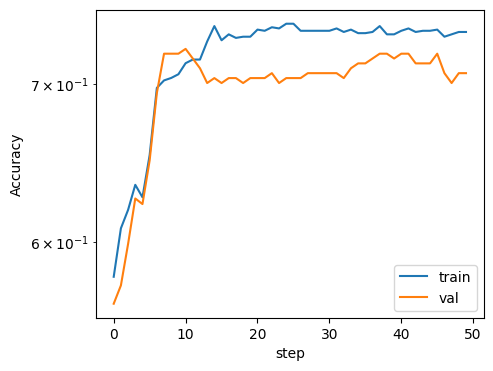

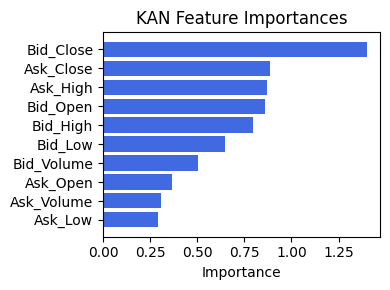

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ask_Volume', 0.5440457180670236), ('Ask_Close', 0.5110150152964553), ('Ex1', 0.3391712880832948), ('Ex4', 0.32951117721094425), ('Bid_Volume', 0.30387262805118875), ('Ask_Open', 0.30244203811201803), ('Ex5', 0.27751599579075054), ('Ex3', 0.24367004287446917), ('Ask_High', 0.23262782444370458), ('Bid_High', 0.05604292020290184), ('Bid_Open', 0.052865225150442126), ('Bid_Low', 0.00937029097264046), ('Ex6', 0.008581520074630176), ('Ex2', 0.001228900827134056), ('Bid_Close', 0.0), ('Ask_Low', 0.0)]


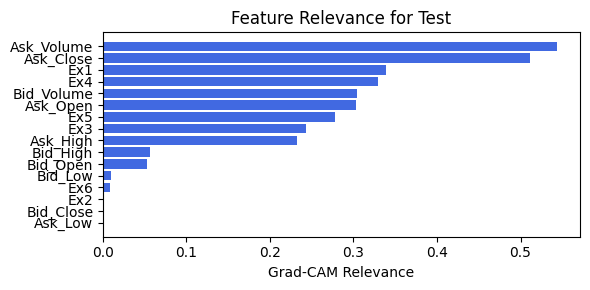

In [197]:
train_and_plot_relevance(Model3_4, kan_neurons=4, kan_grid=3, lamb=0.0001, steps=50, embed_dim=16, filename=filename_4, opt_col_val=16)

### 4.3.5 width=[10, 4], grid=3, lamb=0.0001 | embed_dim=16

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 7.37e-01 | val_acc_hybrid: 7.07e-01 |: 100%|█████| 50/50 [00:15<00:00,  3.18it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.2449e-01 at 10 epoch
tensor(0.7139, device='cuda:0')
[[125  58]
 [ 47 137]]
M_KAN Relevance: 0.282121866941452
CNN Relevance: 0.7178781628608704
[('Bid_Close', 1.3997539), ('Ask_Close', 0.8864001), ('Ask_High', 0.8695201), ('Bid_Open', 0.8602964), ('Bid_High', 0.7952075), ('Bid_Low', 0.64672625), ('Bid_Volume', 0.50539464), ('Ask_Open', 0.36475927), ('Ask_Volume', 0.30827135), ('Ask_Low', 0.2903466)]


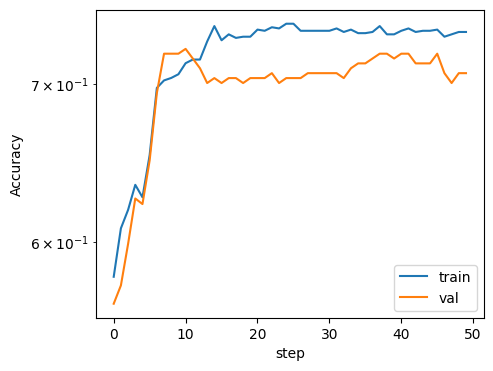

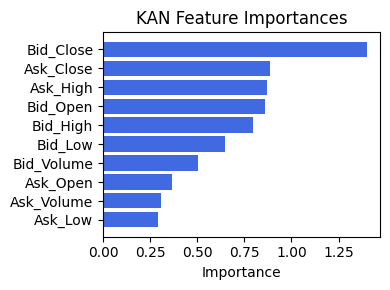

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ask_Volume', 0.5440457180670236), ('Ask_Close', 0.5110150152964553), ('Ex1', 0.3391712880832948), ('Ex4', 0.32951117721094425), ('Bid_Volume', 0.30387262805118875), ('Ask_Open', 0.30244203811201803), ('Ex5', 0.27751599579075054), ('Ex3', 0.24367004287446917), ('Ask_High', 0.23262782444370458), ('Bid_High', 0.05604292020290184), ('Bid_Open', 0.052865225150442126), ('Bid_Low', 0.00937029097264046), ('Ex6', 0.008581520074630176), ('Ex2', 0.001228900827134056), ('Bid_Close', 0.0), ('Ask_Low', 0.0)]


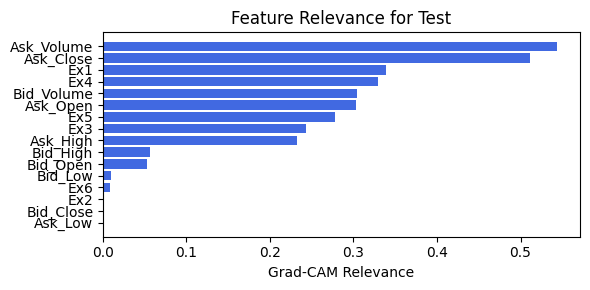

In [198]:
train_and_plot_relevance(Model3_4, kan_neurons=4, kan_grid=3, lamb=0.0001, steps=50, embed_dim=16, filename=filename_4, opt_col_val=16)

# Hibrid Model3 training ✅ Top 2 Configurations

### 1. width=[10, 1, 1], grid=3, lamb=0.0001| best_epoch=6 | avg_acc=0.73025

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3


| train_loss: 3.10e+00 | eval_loss: 3.14e+00 | reg: 4.28e+01 |: 100%|█| 40/40 [00:39<00:00,  1.02it/


saving model version 0.1
Best epoch 15
3.2704854011535645


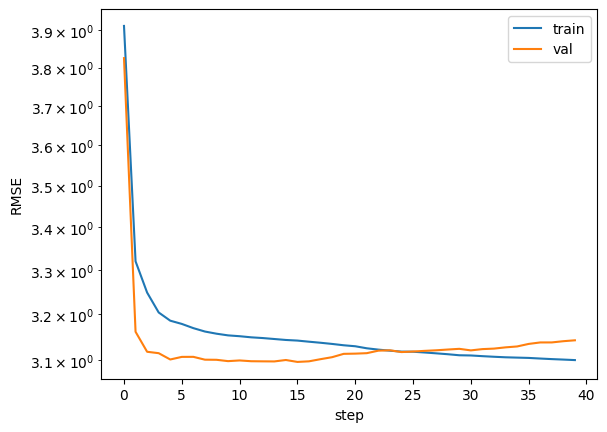

In [101]:
model = try_create_model(Model3, attributes, imgs_shape, kan_neurons=4, kan_grid=3, cnn_bottleneck_dim=1)
best_model_state, metrics3, _ = fit_hybrid_dataloaders(model, dataset, opt="LBFGS", steps=40, lamb=0.01)
plot_training_RMSE(model, best_model_state, average_rmse(model(dataset['test_input'], dataset['test_img']), dataset['test_label']), metrics3['train_loss'], metrics3['eval_loss'])

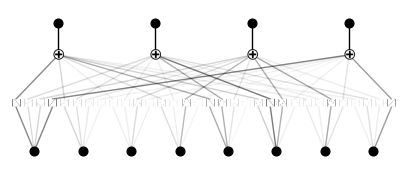

In [45]:
model.m_kan.plot()

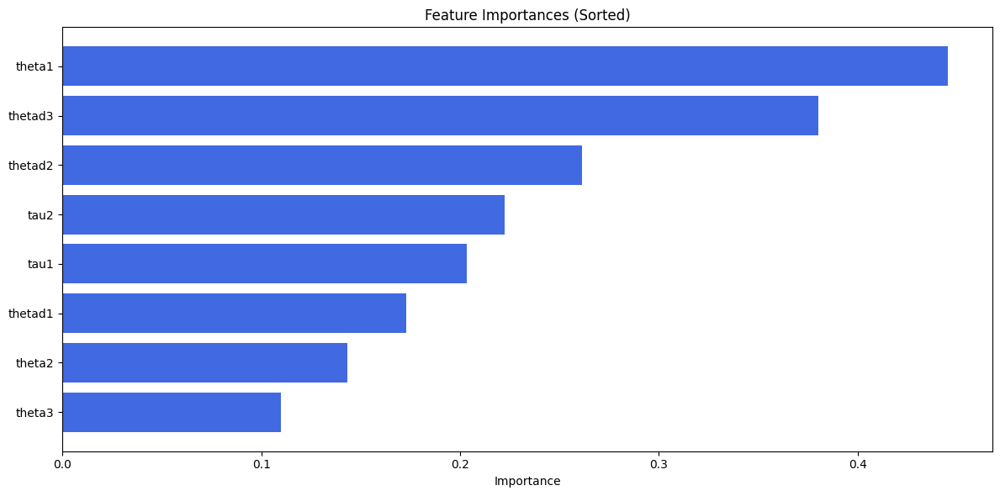

In [46]:
plot_sorted_feature_importance(x_col, model.m_kan.feature_score)

In [42]:
avg_scores = compute_avg_feature_relevance_from_val(
    model=model,
    model_state=best_model_state,
    val_inputs=dataset["test_input"],
    val_imgs=dataset["test_img"],
    coordinate=completed_coordinate,
    x_col=completed_x_col,
    zoom=2
)
plot_feature_relevance_bar(avg_scores)

Computing Grad-CAM:   0%|          | 0/1639 [00:00<?, ?it/s]


AttributeError: 'Model3_0' object has no attribute 'cnn_branch'

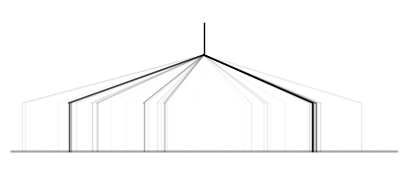

In [47]:
model.final_kan.plot()

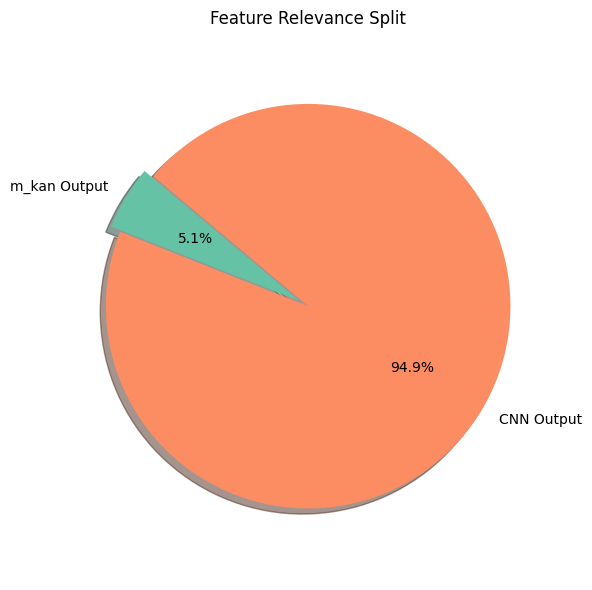

In [103]:
plot_mkan_vs_cnn_relevance(model.final_kan.feature_score, mkan_len=4)

C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by o

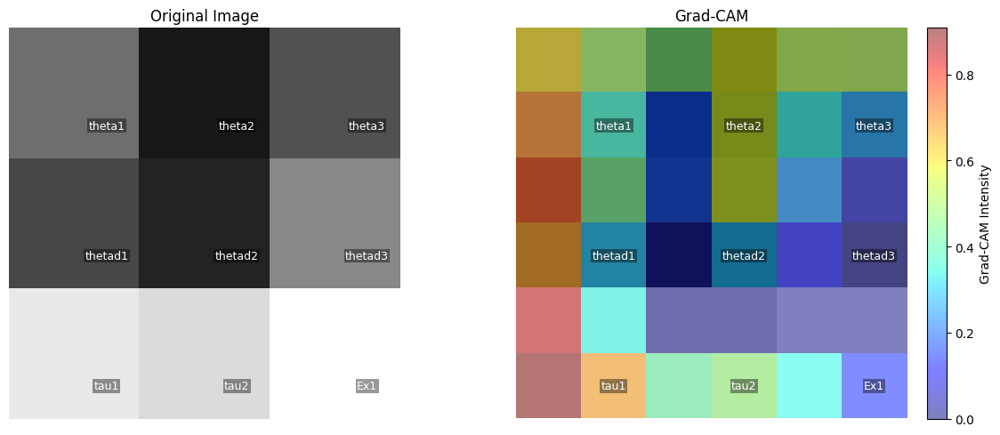

In [50]:
i = 4  # index of the image you want to explain
heatmap = grad_cam_side_by_side(
    model=model,
    model_state=best_model_state,
    num_input=dataset["test_input"][i],
    img_input=dataset["test_img"][i],
    x_col=completed_x_col,
    coordinate=completed_coordinate,
    zoom=2
)

Computing Grad-CAM: 100%|██████████| 1639/1639 [09:53<00:00,  2.76it/s] 


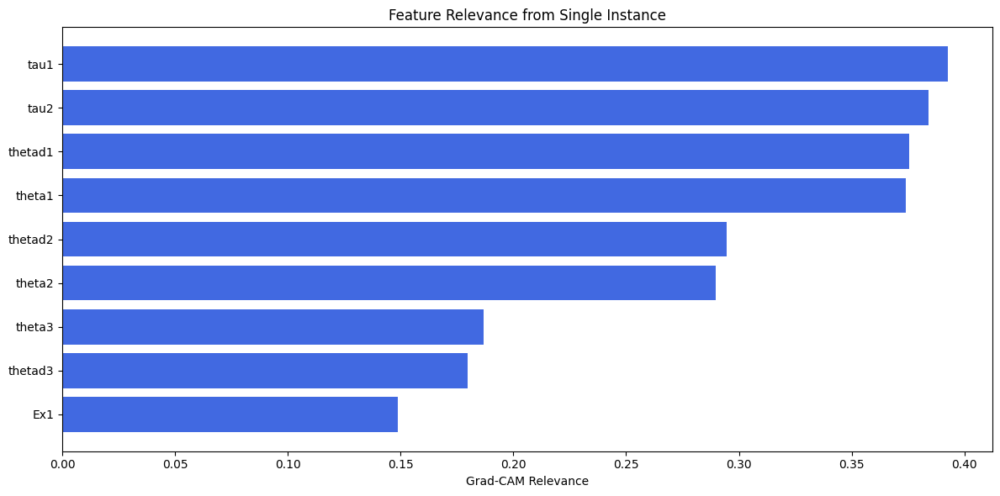

In [51]:
avg_scores = compute_avg_feature_relevance_from_val(
    model=model,
    model_state=best_model_state,
    val_inputs=dataset["test_input"],
    val_imgs=dataset["test_img"],
    coordinate=completed_coordinate,
    x_col=completed_x_col,
    zoom=2
)
plot_feature_relevance_bar(avg_scores)

### 2. width=[10, 4, 1], grid=3, lamb=0.0001| best_epoch=7 | avg_acc=0.73025

In [52]:
del model
torch.cuda.empty_cache()
gc.collect()

13172740

In [42]:
model = try_create_model(Model3, attributes, imgs_shape, kan_neurons=3, kan_grid=5)
best_model_state, metrics3,_ = fit_hybrid_dataloaders(model, dataset, opt="LBFGS", steps=40, lamb=0.01)
plot_training_RMSE(model, best_model_state, average_rmse(model(dataset['test_input'], dataset['test_img']), dataset['test_label']), metrics3['train_loss'], metrics3['val_loss'])

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3


| train_loss: 3.40e+00 | eval_loss: 3.17e+00 | reg: 1.19e+02 |:   8%| | 3/40 [00:18<03:44,  6.06s/it


KeyboardInterrupt: 

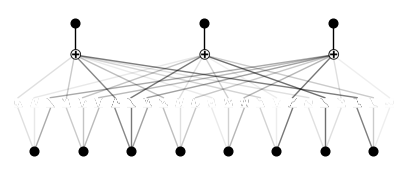

In [54]:
model.m_kan.plot()

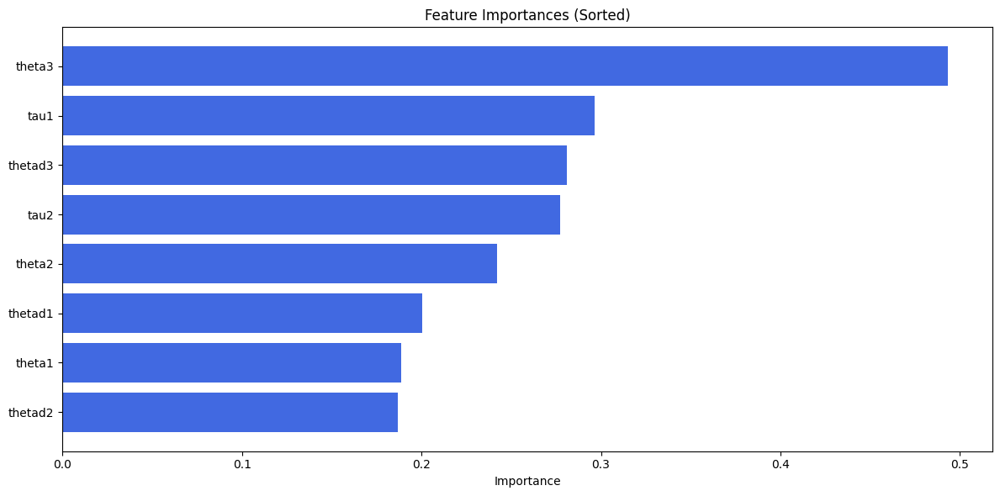

In [55]:
plot_sorted_feature_importance(x_col, model.m_kan.feature_score)

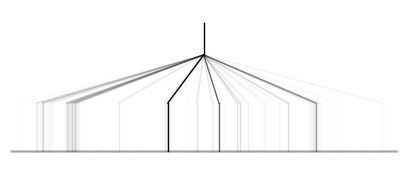

In [56]:
model.final_kan.plot()

In [57]:
feature_score = model.final_kan.feature_score

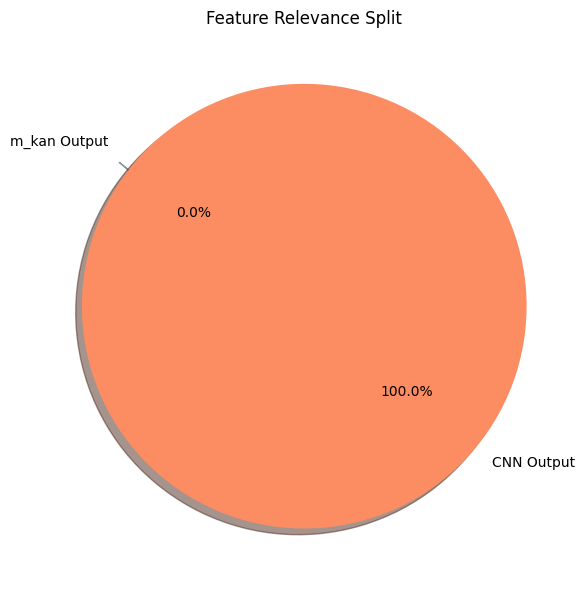

In [58]:
plot_mkan_vs_cnn_relevance(feature_score, mkan_len=3)

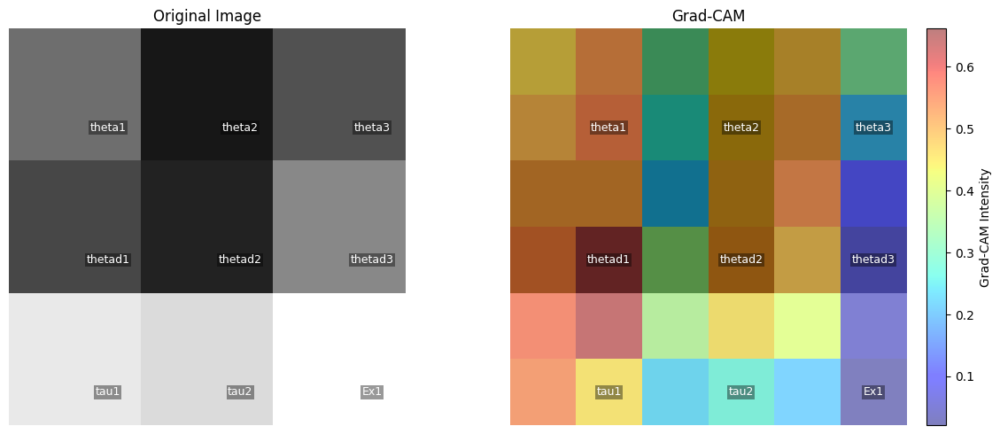

In [59]:
i = 4  # index of the image you want to explain
heatmap = grad_cam_side_by_side(
    model=model,
    model_state=best_model_state,
    num_input=dataset["test_input"][i],
    img_input=dataset["test_img"][i],
    x_col=completed_x_col,
    coordinate=completed_coordinate,
    zoom=2
)

Computing Grad-CAM: 100%|██████████| 1639/1639 [09:06<00:00,  3.00it/s]


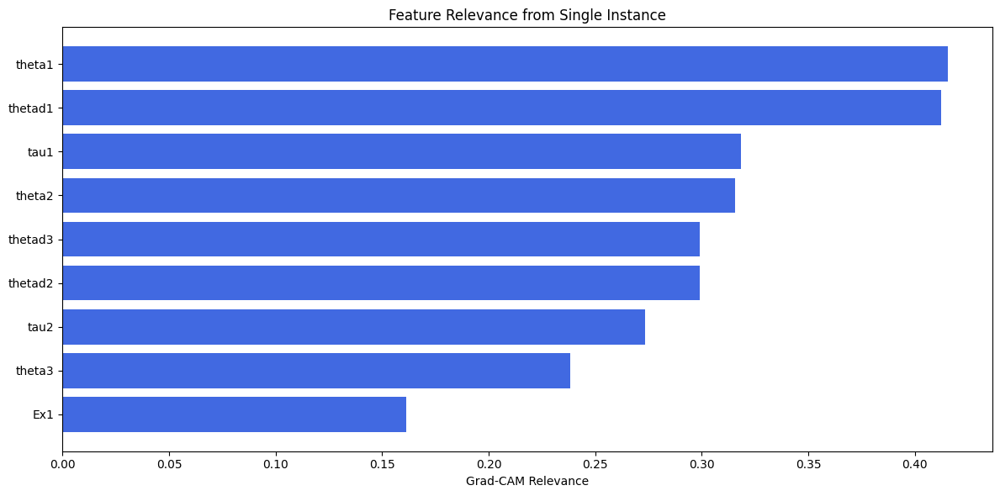

In [60]:
avg_scores = compute_avg_feature_relevance_from_val(
    model=model,
    model_state=best_model_state,
    val_inputs=dataset["test_input"],
    val_imgs=dataset["test_img"],
    coordinate=completed_coordinate,
    x_col=completed_x_col,
    zoom=2
)
plot_feature_relevance_bar(avg_scores)

# Hybrid Model4 training ✅ Top 2 Configurations

### 1. width=[8, 1, 1], grid=4, lamb=0.01| best_epoch=7 | loss=3.23119

In [61]:
del model
torch.cuda.empty_cache()
gc.collect()

13370161

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4


| train_loss: 2.45e+00 | eval_loss: 3.71e+00 | reg: 9.67e+01 |: 100%|█| 40/40 [13:51<00:00, 20.80s/i


saving model version 0.1
Best epoch 8
3.7815768718719482


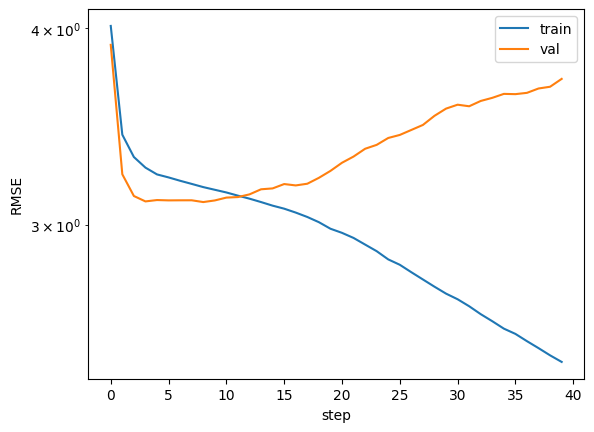

In [62]:
model = try_create_model(Model4, attributes, imgs_shape, kan_neurons=1, kan_grid=4)  # Attempt to create Model4
best_model_state, metrics4, _ = fit_hybrid_dataloaders(model, dataset, opt="LBFGS", steps=40, lamb=0.01)
plot_training_RMSE(model, best_model_state, average_rmse(model(dataset['test_input'], dataset['test_img']), dataset['test_label']), metrics4['train_loss'], metrics4['eval_loss'])

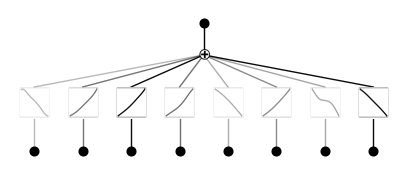

In [63]:
model.m_kan.plot()

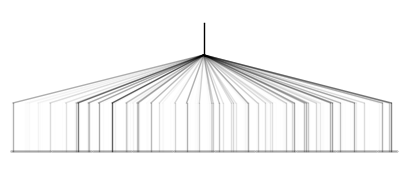

In [64]:
model.final_kan.plot()

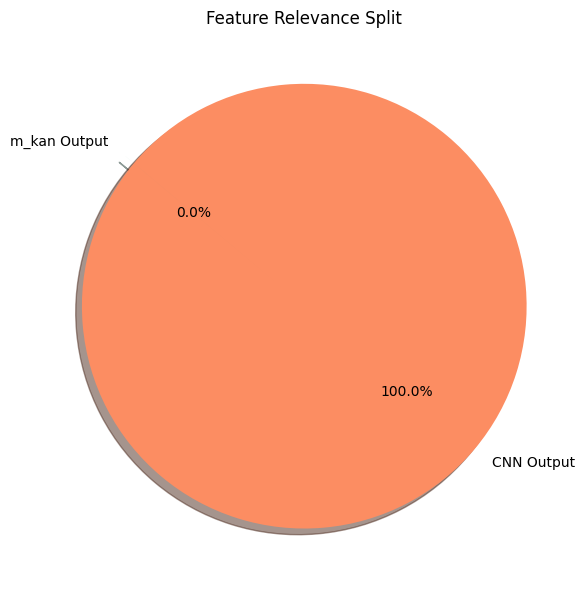

In [65]:
plot_mkan_vs_cnn_relevance(model.final_kan.feature_score, mkan_len=1)

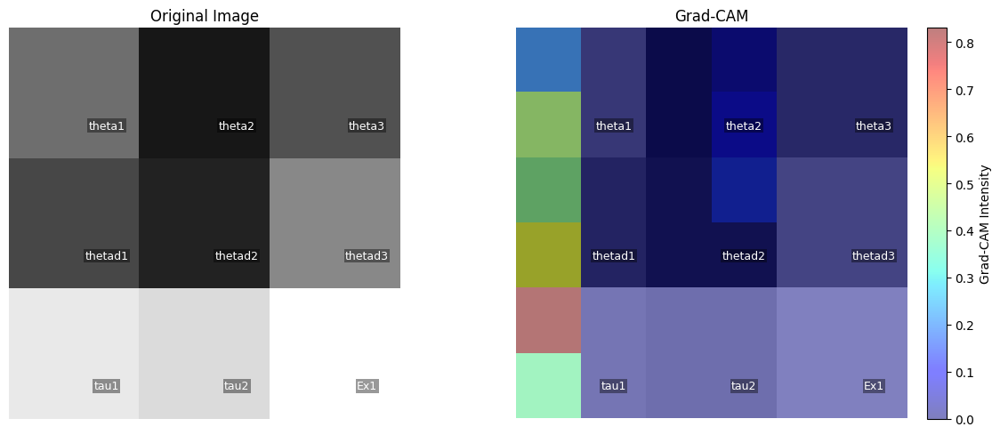

In [66]:
i = 4  # index of the image you want to explain
heatmap = grad_cam_side_by_side(
    model=model,
    model_state=best_model_state,
    num_input=dataset["test_input"][i],
    img_input=dataset["test_img"][i],
    x_col=completed_x_col,
    coordinate=completed_coordinate,
    zoom=2
)

Computing Grad-CAM: 100%|██████████| 1639/1639 [07:58<00:00,  3.43it/s] 


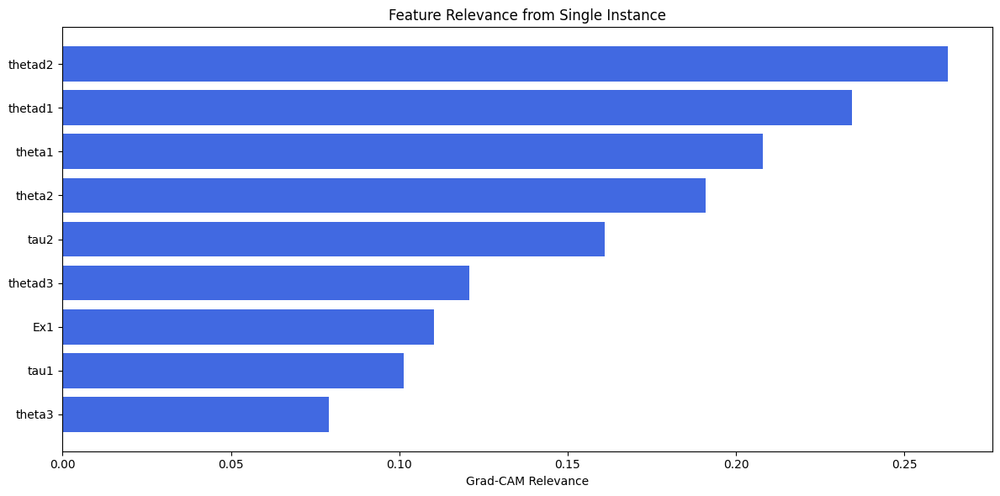

In [67]:
avg_scores = compute_avg_feature_relevance_from_val(
    model=model,
    model_state=best_model_state,
    val_inputs=dataset["test_input"],
    val_imgs=dataset["test_img"],
    coordinate=completed_coordinate,
    x_col=completed_x_col,
    zoom=2
)
plot_feature_relevance_bar(avg_scores)

### 2. width=[8, 2, 1], grid=4, lamb=0.1| best_epoch=7 | loss=3.23543

In [70]:
del model
torch.cuda.empty_cache()
gc.collect()

481

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4


| train_loss: 3.23e+00 | eval_loss: 3.22e+00 | reg: 2.22e+01 |: 100%|█| 40/40 [06:48<00:00, 10.22s/i


saving model version 0.1
Best epoch 11
3.356964588165283


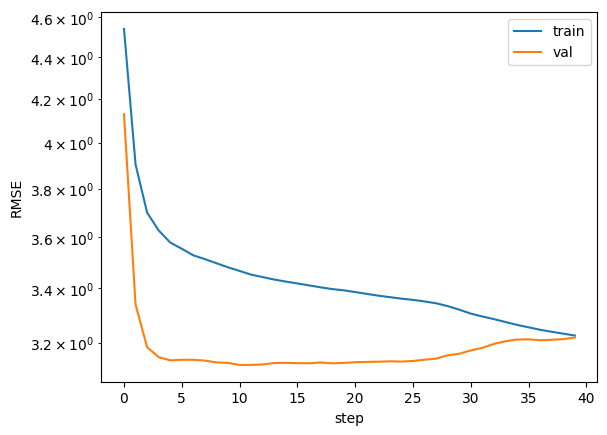

In [71]:
model = try_create_model(Model4, attributes, imgs_shape, kan_neurons=2, kan_grid=4)  # Attempt to create Model4
best_model_state, metrics4, _ = fit_hybrid_dataloaders(model, dataset, opt="LBFGS", steps=40, lamb=0.1)
plot_training_RMSE(model, best_model_state, average_rmse(model(dataset['test_input'], dataset['test_img']), dataset['test_label']), metrics4['train_loss'], metrics4['eval_loss'])

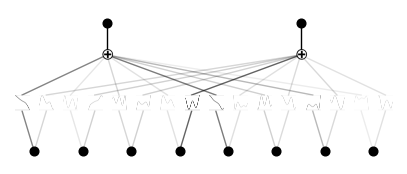

In [72]:
model.m_kan.plot()

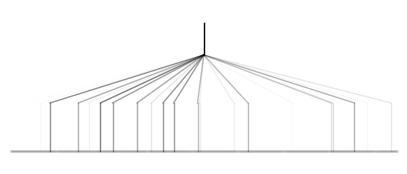

In [73]:
model.final_kan.plot()

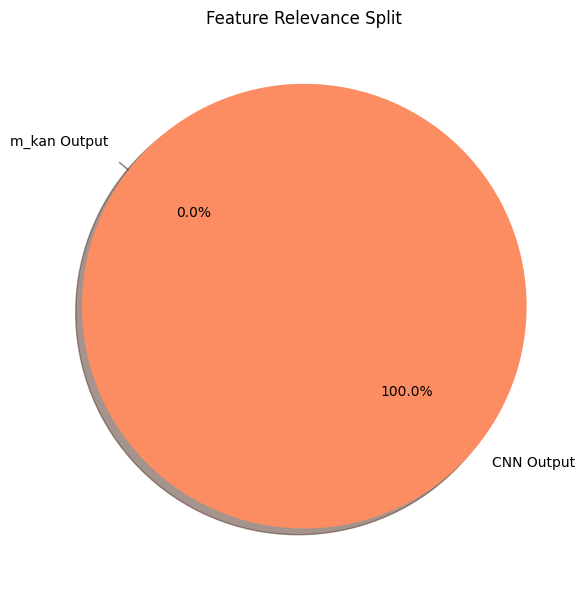

In [74]:
plot_mkan_vs_cnn_relevance(model.final_kan.feature_score, mkan_len=2)

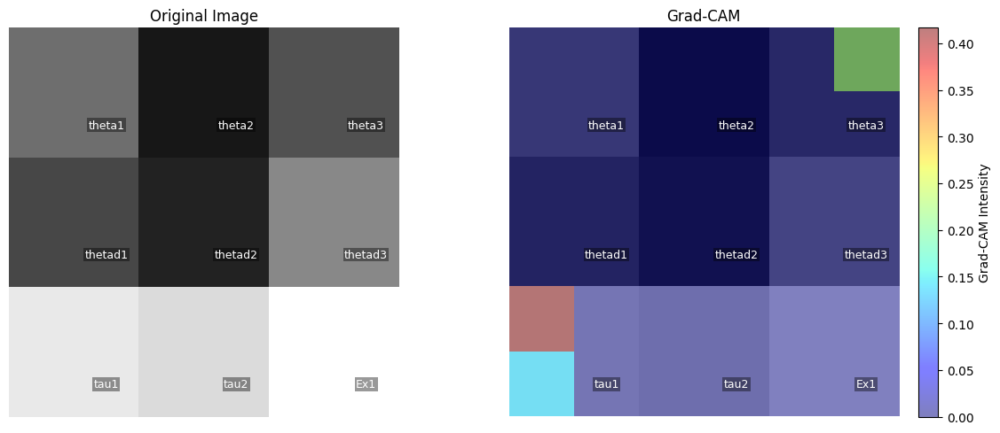

In [75]:
i = 4  # index of the image you want to explain
heatmap = grad_cam_side_by_side(
    model=model,
    model_state=best_model_state,
    num_input=dataset["test_input"][i],
    img_input=dataset["test_img"][i],
    x_col=completed_x_col,
    coordinate=completed_coordinate,
    zoom=2
)

Computing Grad-CAM: 100%|██████████| 1639/1639 [08:03<00:00,  3.39it/s] 


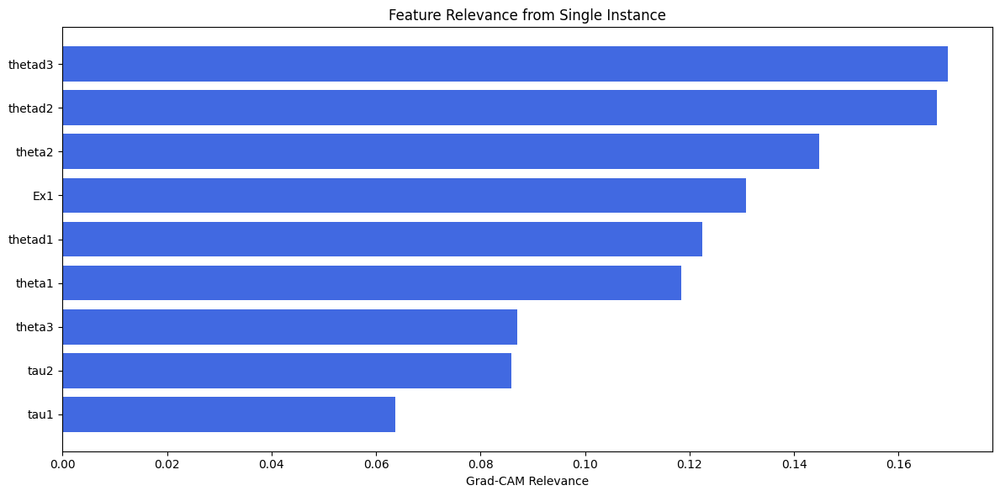

In [76]:
avg_scores = compute_avg_feature_relevance_from_val(
    model=model,
    model_state=best_model_state,
    val_inputs=dataset["test_input"],
    val_imgs=dataset["test_img"],
    coordinate=completed_coordinate,
    x_col=completed_x_col,
    zoom=2
)
plot_feature_relevance_bar(avg_scores)

# Bonus Hybrid

In [49]:
class Model5(nn.Module):
    def __init__(self, attributes, imgs_shape, kan_neurons, kan_grid, device=device):
        super(Model5, self).__init__()
        # CNN branch
        self.cnn_branch = nn.Sequential(
            nn.Conv2d(imgs_shape[0], 16, kernel_size=3, padding=2),     # out: 16 x 9 x 9
            nn.LayerNorm([16, 8, 8]),
            nn.Sigmoid(),
            nn.Flatten()
        ).to(device)

        # Calculate the size of the flattened output
        self.flat_size = self._get_flat_size(imgs_shape)

        self.final_kan = KAN(
            width=[self.flat_size, 1],
            grid=kan_grid,
            k=3,
            seed=SEED,
            device=device
        )

        self.device = device


    def _get_flat_size(self, imgs_shape):
        # Forward pass with dummy input to calculate flat size
        dummy_input = torch.zeros(4, *imgs_shape, device=device)
        x = self.cnn_branch(dummy_input)
        return x.size(1)

    def get_concat_output(self, mlp_input, cnn_input):
        # Ensure inputs are moved to the correct device
        cnn_input = cnn_input.to(self.device)
        
        return self.cnn_branch(cnn_input)  # Process image input

    
    def forward(self, mlp_input, cnn_input):
        concat_output = self.get_concat_output(mlp_input, cnn_input)
        return self.final_kan(concat_output)

In [59]:
def fit_hybrid_dataloaders2(model, 
                           dataset,
                           opt="AdamW", 
                           steps=100, 
                           log=1, 
                           lamb=0., 
                           lamb_l1=1., 
                           lamb_entropy=2., 
                           lamb_coef=0., 
                           lamb_coefdiff=0., 
                           update_grid=True, 
                           grid_update_num=10, 
                           loss_fn=None, 
                           lr=1., 
                           start_grid_update_step=-1, 
                           stop_grid_update_step=50, 
                           batch=-1,
                           metrics=None, 
                           save_fig=False, 
                           in_vars=None, 
                           out_vars=None, 
                           beta=3, 
                           save_fig_freq=1, 
                           img_folder='./video', 
                           singularity_avoiding=False, 
                           y_th=1000., 
                           reg_metric='edge_forward_spline_n', 
                           display_metrics=None,
                           sum_f_reg=True):
    """
    Trains the hybrid model (with a KAN branch and a CNN branch) using a steps-based loop
    adapted from KAN.fit(), with grid updates and regularization.
    
    Instead of a single dataset dict, this function accepts three DataLoaders:
        - train_loader: provides (mlp, img, target) for training
        - val_loader: provides (mlp, img, target) for evaluation during training
        - test_loader: provides (mlp, img, target) for validation

    Internally, the function combines each loader into a dataset dictionary.
    
    Returns:
        results: dictionary containing training loss, evaluation loss, regularization values,
                 and any additional metrics recorded during training.
    """
    #device = next(model.parameters()).device

    # Warn if regularization is requested but model's internal flag isn't enabled.
    if lamb > 0. and not getattr(model.final_kan, "save_act", False):
        print("setting lamb=0. If you want to set lamb > 0, set model.final_kan.save_act=True")
    
    # Disable symbolic processing for training if applicable (KAN internal logic)
    if hasattr(model.final_kan, "disable_symbolic_in_fit"):
        old_save_act, old_symbolic_enabled = model.final_kan.disable_symbolic_in_fit(lamb)
    else:
        old_save_act, old_symbolic_enabled = None, None

    pbar = tqdm(range(steps), desc='Training', ncols=100)

    # Default loss function (mean squared error) if not provided
    if loss_fn is None:
        loss_fn = lambda x, y: torch.mean((x - y) ** 2)

    # Determine grid update frequency
    grid_update_freq = int(stop_grid_update_step / grid_update_num) if grid_update_num > 0 else 1

    # Determine total number of training examples
    n_train = dataset["train_input"].shape[0]
    n_eval  = dataset["val_input"].shape[0]  # using val set for evaluation during training
    batch_size = n_train if batch == -1 or batch > n_train else batch

    # Set up optimizer: choose between Adam and LBFGS (removed tolerance_ys)
    if opt == "AdamW":
        optimizer = optim.AdamW(model.parameters(), lr=lr)
    elif opt == "LBFGS":        
        optimizer = LBFGS(model.parameters(), lr=lr, history_size=10, 
                          line_search_fn="strong_wolfe", 
                          tolerance_grad=1e-32, 
                          tolerance_change=1e-32, 
                          tolerance_ys=1e-32)
    else:
        raise ValueError("Optimizer not recognized. Use 'Adam' or 'LBFGS'.")

    # Prepare results dictionary.
    results = {'train_loss': [], 'eval_loss': [], 'reg': []}

    
    if metrics is not None:
        for metric in metrics:
            results[metric.__name__] = []

    best_model_state = None
    best_epoch = -1
    best_loss = float('inf')

    for step in pbar:
        # Randomly sample indices for a mini-batch from the training set.
        train_indices = np.random.choice(n_train, batch_size, replace=False)
        # Use full evaluation set for evaluation; you can also sample if desired.
        eval_indices = np.arange(n_eval)
        cached_loss = {}
        # Closure for LBFGS
        def closure():
            optimizer.zero_grad()
            mlp_batch = dataset["train_input"][train_indices]
            img_batch = dataset["train_img"][train_indices]
            target_batch = dataset["train_label"][train_indices]
            outputs = model(mlp_batch, img_batch)
            train_loss = loss_fn(outputs, target_batch)
            # Compute regularization term if enabled.
            if hasattr(model.final_kan, "save_act") and model.final_kan.save_act:
                if reg_metric == 'edge_backward':
                    model.final_kan.attribute()
                if reg_metric == 'node_backward':
                    model.final_kan.node_attribute()
                reg_val_inner = model.final_kan.get_reg(reg_metric, lamb_l1, lamb_entropy, lamb_coef, lamb_coefdiff)
            else:
                reg_val_inner = torch.tensor(0., device=device)
            loss_val_inner = train_loss + lamb * reg_val_inner
            loss_val_inner.backward()

            cached_loss['loss'] = loss_val_inner.detach()
            cached_loss['reg'] = reg_val_inner.detach()
            return loss_val_inner

        # Perform grid update if applicable.
        if (step % grid_update_freq == 0 and step < stop_grid_update_step 
            and update_grid and step >= start_grid_update_step):
            
            mlp_batch = dataset['train_input'][train_indices]
            cnn_batch = dataset['train_img'][train_indices]
            #cnn_output = model.cnn_branch(cnn_batch)  # Process image input
            concatenated = model.get_concat_output(mlp_batch, cnn_batch)
            #concatenated = torch.cat((mlp_batch, cnn_output), dim=1)
            model.final_kan.update_grid(concatenated)

        # Perform an optimizer step.
        if opt == "LBFGS":
            optimizer.step(closure)
            loss_val = cached_loss['loss']
            reg_val = cached_loss['reg']
        else:  # AdamW branch
            optimizer.zero_grad()
            mlp_batch = dataset["train_input"][train_indices]
            img_batch = dataset["train_img"][train_indices]
            target_batch = dataset["train_label"][train_indices]
            outputs = model(mlp_batch, img_batch)
            train_loss = loss_fn(outputs, target_batch)
            if hasattr(model.final_kan, "save_act") and model.final_kan.save_act:
                if reg_metric == 'edge_backward':
                    model.final_kan.attribute()
                if reg_metric == 'node_backward':
                    model.final_kan.node_attribute()
                reg_val = model.final_kan.get_reg(reg_metric, lamb_l1, lamb_entropy, lamb_coef, lamb_coefdiff)
            else:
                reg_val = torch.tensor(0., device=device)
            loss_val = train_loss + lamb * reg_val
            loss_val.backward()
            optimizer.step()

        with torch.no_grad():
            mlp_eval = dataset["val_input"][eval_indices]
            img_eval = dataset["val_img"][eval_indices]
            target_eval = dataset["val_label"][eval_indices]
            eval_loss = loss_fn(model(mlp_eval, img_eval), target_eval)

        # Record results (using square-root of loss similar to KAN.fit)
        results['train_loss'].append(torch.sqrt(loss_val.detach()).item())
        results['eval_loss'].append(torch.sqrt(eval_loss.detach()).item())
        results['reg'].append(reg_val.detach().item())

        if metrics is not None:
            for metric in metrics:
                # Here, we assume each metric returns a tensor.
                results[metric.__name__].append(metric().item())

        if eval_loss < best_loss:
            best_epoch = step
            best_loss = eval_loss
            best_model_state = copy.deepcopy(model.state_dict())

        # Update progress bar.
        if display_metrics is None:
            pbar.set_description("| train_loss: %.2e | eval_loss: %.2e | reg: %.2e |" %
                                 (torch.sqrt(loss_val.detach()).item(),
                                  torch.sqrt(eval_loss.detach()).item(),
                                  reg_val.detach().item()))
        else:
            desc = ""
            data = []
            for metric in display_metrics:
                desc += f" {metric}: %.2e |"
                data.append(results[metric.__name__][-1])
            pbar.set_description(desc % tuple(data))

        # Optionally save a figure snapshot.
        if save_fig and step % save_fig_freq == 0:
            save_act_backup = getattr(model.final_kan, "save_act", False)
            model.final_kan.save_act = True
            model.plot(folder=img_folder, in_vars=in_vars, out_vars=out_vars, title=f"Step {step}", beta=beta)
            plt.savefig(os.path.join(img_folder, f"{step}.jpg"), bbox_inches='tight', dpi=200)
            plt.close()
            model.final_kan.save_act = save_act_backup

    # Restore original settings if applicable.
    if old_symbolic_enabled is not None:
        model.final_kan.symbolic_enabled = old_symbolic_enabled
    if hasattr(model.final_kan, "log_history"):
        model.final_kan.log_history('fit')
    print(f"Best epoch {best_epoch}")
    return best_model_state, results, best_epoch

In [78]:
del model
torch.cuda.empty_cache()
gc.collect()

215554

In [65]:
model = try_create_model(Model5, attributes, imgs_shape, kan_neurons=3, kan_grid=4)  # Attempt to create Model4

checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model5


In [66]:
best_model_state, metrics5, _ = fit_hybrid_dataloaders2(model, dataset, opt="LBFGS", steps=10, lamb=0.01)

| train_loss: 3.19e+00 | eval_loss: 3.10e+00 | reg: 5.06e+01 |: 100%|█| 10/10 [00:39<00:00,  3.91s/i

saving model version 0.1
Best epoch 9


3.2302682399749756


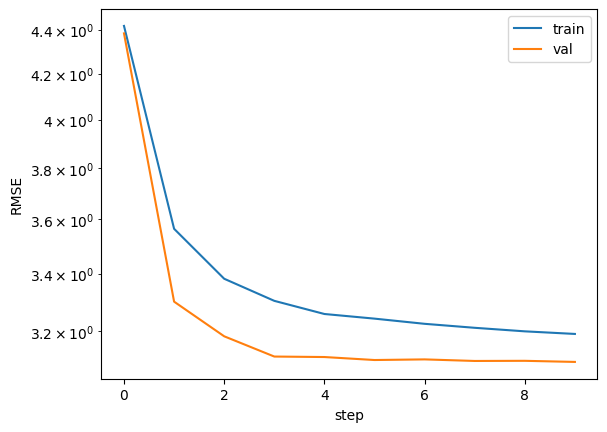

In [67]:
plot_training_RMSE(model, best_model_state, average_rmse(model(dataset['test_input'], dataset['test_img']), dataset['test_label']), metrics5['train_loss'], metrics5['eval_loss'])

C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by o

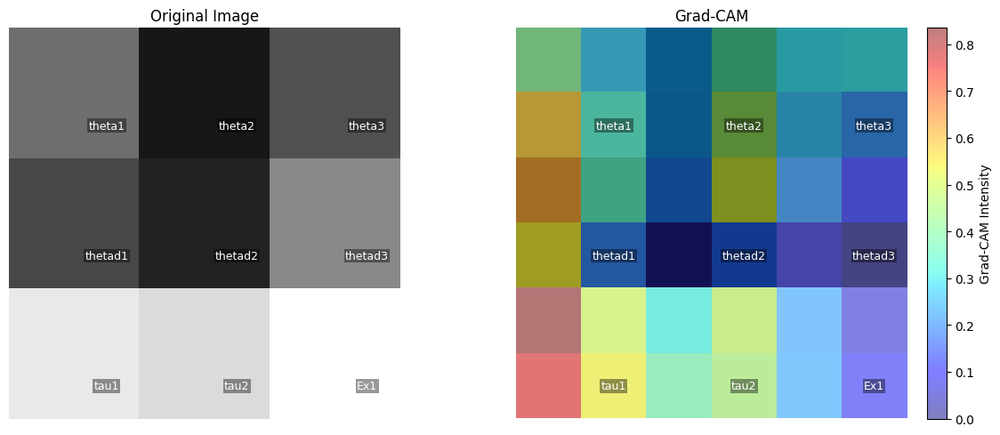

In [68]:
i = 4  # index of the image you want to explain
heatmap = grad_cam_side_by_side(
    model=model,
    model_state=best_model_state,
    num_input=dataset["test_input"][i],
    img_input=dataset["test_img"][i],
    x_col=completed_x_col,
    coordinate=completed_coordinate,
    zoom=2
)

Computing Grad-CAM:   2%|▏         | 26/1639 [00:24<25:31,  1.05it/s]


KeyboardInterrupt: 

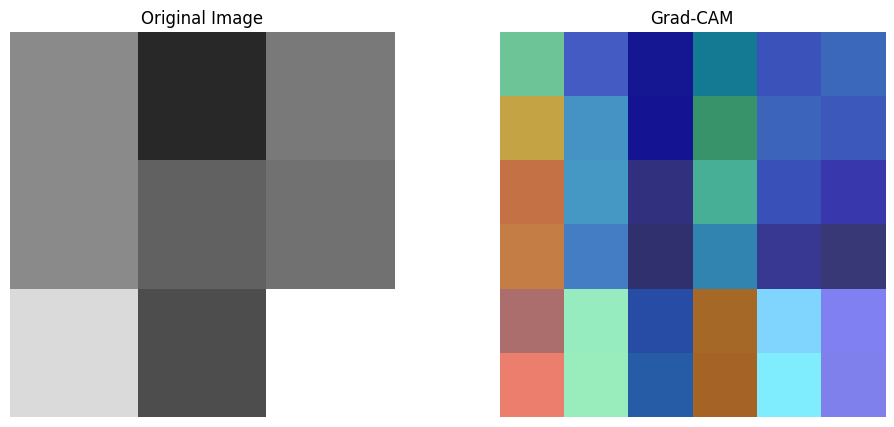

In [69]:
avg_scores = compute_avg_feature_relevance_from_val(
    model=model,
    model_state=best_model_state,
    val_inputs=dataset["test_input"],
    val_imgs=dataset["test_img"],
    coordinate=completed_coordinate,
    x_col=completed_x_col,
    zoom=2
)
plot_feature_relevance_bar(avg_scores)